In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec
from matplotlib import patches
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

import os
import math
import random

import keras
from keras.models import Sequential
from keras.layers import Input, Dense, Conv1D, Conv2D, Flatten, MaxPooling1D, MaxPooling2D
from keras.layers import Dropout
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
from keras import regularizers

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn import preprocessing
from sklearn.metrics import roc_curve, roc_auc_score, auc

import scipy.stats as st
from scipy.stats import poisson
from scipy.interpolate import interp1d
from scipy.stats import norm

In [19]:
from sklearn.neighbors import KernelDensity # paquete necesario
from sklearn.model_selection import GridSearchCV

import scipy.integrate as integrate

In [20]:
import xgboost
from xgboost import XGBRegressor, XGBClassifier

In [21]:
#####################################
# IMPORT AUXILIARY/CUSTOM FUNCTIONS #
#####################################

from AUX_MLL_BL import max_num_bins, Z_BL_asimov, BL_test_fast, BL_test_fsolve, MLL_test_fast, MLL_test_fsolve


# AUX FUNCTION TO FIND SOLUTIONS

def dx(fn, x, delta=0.001):
    return (fn(x+delta) - fn(x))/delta

def solvecross(fn, value, x=-45.5, maxtries=1000, maxerr=0.00001):
    for tries in range(maxtries):
        err = fn(x) - value
        if abs(err) < maxerr:
            return x
        slope = dx(fn, x)
        x -= err/slope
    raise ValueError('no solution found')

### DATA
pbot  --->  sum(bottom photomultipliers)

ptop  --->  sum(top photomultipliers)


ppeakS1 --> variables of S1 peak

ppeakS2 --> variables of S2 peak
    
        variables: pT0    -> absolute initial time of the pulse
                    pA    -> total integrated area of the pulse
                    pH    -> pulse maximum amplitude
                    pHT   -> time at which the pulse has max amplitude (from pT0)
                    pL    -> time length of the pulse
                    pL90  -> time length with 90% area of the pulse (from 5-95% integrated area)
                    pRMSW -> pulse root mean square (RMS) width
                    pHTL  -> ratio between pHT and pL

In [22]:
mDM = 500

filefolder = '../../data2024/processed/'

In [23]:
##############
# PARAMETERS #
##############

tot_B = 634.55+2.26+0.01+0.6+5.34

f_ER = 634.55 / tot_B
f_AC = 2.26 / tot_B
f_CNNS = 0.01 / tot_B
f_RN = 0.6 / tot_B
f_WALL = 5.34 / tot_B

f_ER + f_AC + f_CNNS + f_RN + f_WALL

S_cross1045 = 33.24

cross_factor = np.logspace(-47,-44,10) / 1e-45
S_expected = [max(1, round(S_cross1045 * fac)) for fac in cross_factor]


# DISCOVERY: 'discovery', EXCLUSION: 'exclusion'
D_or_E = 'exclusion'

# requested number of pseudo experiments
num_pseudo = 2000

# number of expected background events per ensemble
B_expected = round(tot_B)

print('B_expected: ', B_expected)
print('S_cross1045: ', S_cross1045)
print('S_expected (from cross=1e-47 to 1e-44): ', S_expected)

B_expected:  643
S_cross1045:  33.24
S_expected (from cross=1e-47 to 1e-44):  [1, 1, 2, 3, 7, 15, 33, 72, 154, 332]


In [24]:
###############
# BACKGROUNDS # 
###############

B_pbot_ER = np.loadtxt(filefolder + 'ER/pbot.txt')
B_ptop_ER = np.loadtxt(filefolder + 'ER/ptop.txt')
B_ppeakS1_ER = np.loadtxt(filefolder + 'ER/ppeakS1.txt')
B_ppeakS2_ER = np.loadtxt(filefolder + 'ER/ppeakS2.txt')

print('B_pbot_ER.shape: ', B_pbot_ER.shape)
print('B_ptop_ER.shape: ', B_ptop_ER.shape)
print('B_ppeakS1_ER.shape :', B_ppeakS1_ER.shape)
print('B_ppeakS2_ER.shape: ', B_ppeakS2_ER.shape)


B_pbot_AC = np.loadtxt(filefolder + 'AC/pbot.txt')
B_ptop_AC = np.loadtxt(filefolder + 'AC/ptop.txt')
B_ppeakS1_AC = np.loadtxt(filefolder + 'AC/ppeakS1.txt')
B_ppeakS2_AC = np.loadtxt(filefolder + 'AC/ppeakS2.txt')

print('\nB_pbot_AC.shape: ', B_pbot_AC.shape)
print('B_ptop_AC.shape: ', B_ptop_AC.shape)
print('B_ppeakS1_AC.shape :', B_ppeakS1_AC.shape)
print('B_ppeakS2_AC.shape: ', B_ppeakS2_AC.shape)


B_pbot_CNNS = np.loadtxt(filefolder + 'CNNS/pbot.txt')
B_ptop_CNNS = np.loadtxt(filefolder + 'CNNS/ptop.txt')
B_ppeakS1_CNNS = np.loadtxt(filefolder + 'CNNS/ppeakS1.txt')
B_ppeakS2_CNNS = np.loadtxt(filefolder + 'CNNS/ppeakS2.txt')

print('\nB_pbot_CNNS.shape: ', B_pbot_CNNS.shape)
print('B_ptop_CNNS.shape: ', B_ptop_CNNS.shape)
print('B_ppeakS1_CNNS.shape :', B_ppeakS1_CNNS.shape)
print('B_ppeakS2_CNNS.shape: ', B_ppeakS2_CNNS.shape)


B_pbot_RN = np.loadtxt(filefolder + 'RN/pbot.txt')
B_ptop_RN = np.loadtxt(filefolder + 'RN/ptop.txt')
B_ppeakS1_RN = np.loadtxt(filefolder + 'RN/ppeakS1.txt')
B_ppeakS2_RN = np.loadtxt(filefolder + 'RN/ppeakS2.txt')

print('\nB_pbot_RN.shape: ', B_pbot_RN.shape)
print('B_ptop_RN.shape: ', B_ptop_RN.shape)
print('B_ppeakS1_RN.shape :', B_ppeakS1_RN.shape)
print('B_ppeakS2_RN.shape: ', B_ppeakS2_RN.shape)


B_pbot_WALL = np.loadtxt(filefolder + 'WALL/pbot.txt')
B_ptop_WALL = np.loadtxt(filefolder + 'WALL/ptop.txt')
B_ppeakS1_WALL = np.loadtxt(filefolder + 'WALL/ppeakS1.txt')
B_ppeakS2_WALL = np.loadtxt(filefolder + 'WALL/ppeakS2.txt')

print('\nB_pbot_WALL.shape: ', B_pbot_WALL.shape)
print('B_ptop_WALL.shape: ', B_ptop_WALL.shape)
print('B_ppeakS1_WALL.shape :', B_ppeakS1_WALL.shape)
print('B_ppeakS2_WALL.shape: ', B_ppeakS2_WALL.shape)


##########
# SIGNAL #
##########

S_pbot = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/pbot.txt')
S_ptop = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ptop.txt')
S_ppeakS1 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS1.txt')
S_ppeakS2 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS2.txt')

print('\nS_pbot.shape: ', S_pbot.shape)
print('S_ptop.shape: ', S_ptop.shape)
print('S_ppeakS1.shape :', S_ppeakS1.shape)
print('S_ppeakS2.shape: ', S_ppeakS2.shape)

B_pbot_ER.shape:  (35549,)
B_ptop_ER.shape:  (35549,)
B_ppeakS1_ER.shape : (35549, 8)
B_ppeakS2_ER.shape:  (35549, 8)

B_pbot_AC.shape:  (3998,)
B_ptop_AC.shape:  (3998,)
B_ppeakS1_AC.shape : (3998, 8)
B_ppeakS2_AC.shape:  (3998, 8)

B_pbot_CNNS.shape:  (99,)
B_ptop_CNNS.shape:  (99,)
B_ppeakS1_CNNS.shape : (99, 8)
B_ppeakS2_CNNS.shape:  (99, 8)

B_pbot_RN.shape:  (2610,)
B_ptop_RN.shape:  (2610,)
B_ppeakS1_RN.shape : (2610, 8)
B_ppeakS2_RN.shape:  (2610, 8)

B_pbot_WALL.shape:  (4642,)
B_ptop_WALL.shape:  (4642,)
B_ppeakS1_WALL.shape : (4642, 8)
B_ppeakS2_WALL.shape:  (4642, 8)

S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 8)
S_ppeakS2.shape:  (32015, 8)


##### Select the number of events per class

In [25]:
NUM_DAT = min(len(B_pbot_ER), len(S_pbot))
print(' NUM_DAT: ', NUM_DAT, '\n')

NUM_DAT_AC = round(NUM_DAT*f_AC)
NUM_DAT_CNNS = max(1, round(NUM_DAT*f_CNNS))
NUM_DAT_RN = round(NUM_DAT*f_RN)
NUM_DAT_WALL = round(NUM_DAT*f_WALL)

NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

print('NUM_DAT_ER: ', NUM_DAT_ER)
print('NUM_DAT_AC: ', NUM_DAT_AC)
print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
print('NUM_DAT_RN: ', NUM_DAT_RN)
print('NUM_DAT_WALL: ', NUM_DAT_WALL)



# CONCATENATE THE BACKGROUNDS
B_pbot = np.concatenate([B_pbot_ER[:NUM_DAT_ER], B_pbot_AC[:NUM_DAT_AC], B_pbot_CNNS[:NUM_DAT_CNNS], B_pbot_RN[:NUM_DAT_RN], B_pbot_WALL[:NUM_DAT_WALL]])
B_ptop = np.concatenate([B_ptop_ER[:NUM_DAT_ER], B_ptop_AC[:NUM_DAT_AC], B_ptop_CNNS[:NUM_DAT_CNNS], B_ptop_RN[:NUM_DAT_RN], B_ptop_WALL[:NUM_DAT_WALL]])
B_ppeakS1 = np.concatenate([B_ppeakS1_ER[:NUM_DAT_ER], B_ppeakS1_AC[:NUM_DAT_AC], B_ppeakS1_CNNS[:NUM_DAT_CNNS], B_ppeakS1_RN[:NUM_DAT_RN], B_ppeakS1_WALL[:NUM_DAT_WALL]])
B_ppeakS2 = np.concatenate([B_ppeakS2_ER[:NUM_DAT_ER], B_ppeakS2_AC[:NUM_DAT_AC], B_ppeakS2_CNNS[:NUM_DAT_CNNS], B_ppeakS2_RN[:NUM_DAT_RN], B_ppeakS2_WALL[:NUM_DAT_WALL]])

print('\nB_pbot.shape: ', B_pbot.shape)
print('B_ptop.shape: ', B_ptop.shape)
print('B_ppeakS1.shape :', B_ppeakS1.shape)
print('B_ppeakS2.shape: ', B_ppeakS2.shape)


S_pbot = S_pbot[:NUM_DAT]
S_ptop = S_ptop[:NUM_DAT]
S_ppeakS1 = S_ppeakS1[:NUM_DAT]
S_ppeakS2 = S_ppeakS2[:NUM_DAT]

print('\nS_pbot.shape: ', S_pbot.shape)
print('S_ptop.shape: ', S_ptop.shape)
print('S_ppeakS1.shape :', S_ppeakS1.shape)
print('S_ppeakS2.shape: ', S_ppeakS2.shape)

 NUM_DAT:  32015 

NUM_DAT_ER:  31605
NUM_DAT_AC:  113
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  266

B_pbot.shape:  (32015,)
B_ptop.shape:  (32015,)
B_ppeakS1.shape : (32015, 8)
B_ppeakS2.shape:  (32015, 8)

S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 8)
S_ppeakS2.shape:  (32015, 8)


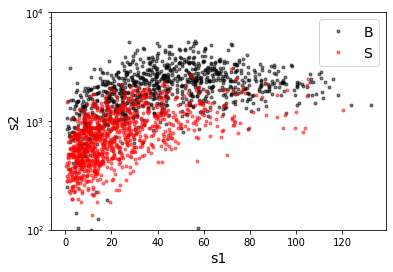

In [26]:
rnd = 100

B_pbot_plot, B_ptop_plot = shuffle(B_pbot, B_ptop, random_state=rnd)
S_pbot_plot, S_ptop_plot = shuffle(S_pbot, S_ptop, random_state=rnd)

plt.plot(B_pbot_plot[:1000], B_ptop_plot[:1000], '.', color='black', alpha=0.5, label='B')
plt.plot(S_pbot_plot[:1000], S_ptop_plot[:1000], '.', color='red', alpha=0.5, label='S')
plt.yscale('log')
# plt.xlim([0,100])
plt.ylim([100,10000])
plt.xlabel('s1',fontsize=14)
plt.ylabel('s2',fontsize=14)
plt.legend(fontsize=14)
plt.show()

###### Construct time diff between pulses

B_pdiffT.shape:  (32015,)
S_pdiffT.shape:  (32015,)


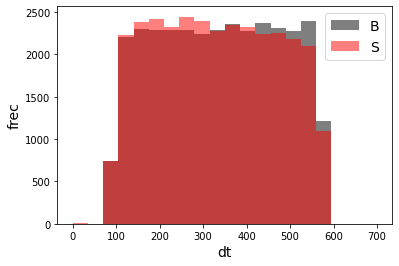

In [27]:
B_pdiffT = B_ppeakS2[:,0] - B_ppeakS1[:,0]
S_pdiffT = S_ppeakS2[:,0] - S_ppeakS1[:,0]

print('B_pdiffT.shape: ', B_pdiffT.shape)
print('S_pdiffT.shape: ', S_pdiffT.shape)


plt.hist(B_pdiffT, range=[0,700], bins=20, color='black', alpha=0.5, label='B')
plt.hist(S_pdiffT, range=[0,700], bins=20, color='red', alpha=0.5, label='S')
# plt.yscale('log')
# plt.xlim([0,100])
# plt.ylim([100,10000])
plt.xlabel('dt',fontsize=14)
plt.ylabel('frec',fontsize=14)
plt.legend(fontsize=14)
plt.show()

##### Remove some columns or features (if you want)

In [11]:
remove_col = [0]

B_pbot = B_pbot
B_ptop = B_ptop
B_ppeakS1 = np.delete(B_ppeakS1, remove_col, axis=1)
B_ppeakS2 = np.delete(B_ppeakS2, remove_col, axis=1)

print('B_pbot.shape: ', B_pbot.shape)
print('B_ptop.shape: ', B_ptop.shape)
print('B_ppeakS1.shape :', B_ppeakS1.shape)
print('B_ppeakS2.shape: ', B_ppeakS2.shape)


S_pbot = S_pbot
S_ptop = S_ptop
S_ppeakS1 = np.delete(S_ppeakS1, remove_col, axis=1)
S_ppeakS2 = np.delete(S_ppeakS2, remove_col, axis=1)

print('S_pbot.shape: ', S_pbot.shape)
print('S_ptop.shape: ', S_ptop.shape)
print('S_ppeakS1.shape :', S_ppeakS1.shape)
print('S_ppeakS2.shape: ', S_ppeakS2.shape)

B_pbot.shape:  (32015,)
B_ptop.shape:  (32015,)
B_ppeakS1.shape : (32015, 7)
B_ppeakS2.shape:  (32015, 7)
S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 7)
S_ppeakS2.shape:  (32015, 7)


## 1. 16 variables + time diff

In [12]:
# concatenate the data
X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(B_ptop,(len(B_ptop),1)), np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pbot,(len(S_pbot),1)), np.reshape(S_ptop,(len(S_ptop),1)), np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

X_mon_B.shape:  (32015, 17)
X_mon_S.shape:  (32015, 17)
X_mon.shape:  (64030, 17)

X_mon_train :  (40818, 17)
y_mon_train :  (40818,)
X_mon_val :  (7204, 17)
y_mon_val :  (7204,)
X_mon_test :  (16008, 17)
y_mon_test :  (16008,)



In [13]:

keys = ['S1 pulse area','S1 max amplitude','S1 max amplitude time','S1 time length','S1 time length 90$\%$','S1 RMS width','pHTL_S1',
        'S2 pulse area','S2 max amplitude','S2 max amplitude time','S2 time length','S2 time length 90$\%$','S2 RMS width','pHTL_S2',
        'Sum bot hit pattern', 'Sum top hits pattern','$\Delta t$', 'B=0 - S=1']
keys = ['pA S1','pH S1','pHT S1','pL S1','pL90 S1','pRMSW S1','pHTL S1',
        'pA S2','pH S2','pHT S2','pL S2','pL90 S2','pRMSW S2','pHTL S2',
        'sum(hits) bot', 'sum(hits) top','$\Delta t$', 'B=0 - S=1']


In [14]:
df = pd.DataFrame(X_mon_val)
df[[17]] = np.reshape(y_mon_val,(len(y_mon_val),1))
df = df.rename(columns={0: keys[0], 1: keys[1], 2: keys[2], 3: keys[3], 4: keys[4], 5: keys[5], 6: keys[6], 7: keys[7], 8: keys[8], 9: keys[9], 10: keys[10], 11: keys[11], 12: keys[12], 13: keys[13], 14: keys[14], 15: keys[15], 16: keys[16], 17: keys[17]})

df = df[df['$\Delta t$'] >= 80]

df

,pA S1,pH S1,pHT S1,pL S1,pL90 S1,pRMSW S1,pHTL S1,pA S2,pH S2,pHT S2,pL S2,pL90 S2,pRMSW S2,pHTL S2,sum(hits) bot,sum(hits) top,$\Delta t$,B=0 - S=1
0,18.784301,2.484004,0.13,0.52,0.15,0.765590,0.250000,759.072248,6.474556,5.16,9.85,6.03,1.321462,0.523858,18.784302,493.768396,485.68,1.0
1,51.966927,6.278461,0.17,0.64,0.18,1.625982,0.265625,5651.134405,35.239422,2.78,5.81,2.96,13.493646,0.478485,41.599787,3610.550483,313.51,0.0
2,3.338031,0.534265,0.16,0.66,0.28,0.125512,0.242424,1871.501293,17.307590,2.85,9.02,2.93,3.757997,0.315965,3.338031,1176.312176,244.92,0.0
3,19.225398,2.433647,0.18,0.77,0.15,0.590415,0.233766,605.528261,5.015718,3.30,6.49,3.88,1.359488,0.508475,15.298671,370.206250,468.77,1.0
4,8.098267,0.884580,0.19,0.56,0.14,0.280242,0.339286,808.273714,11.725221,2.08,6.54,2.03,2.438637,0.318043,3.823332,516.904308,217.81,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7199,98.334543,11.062551,0.18,0.72,0.17,2.917456,0.250000,2183.027096,13.292847,3.68,8.91,3.60,3.987075,0.413019,83.894111,1367.120334,344.39,1.0
7200,39.668999,6.954184,0.17,0.56,0.15,1.550914,0.303571,3343.267243,22.160276,3.18,8.89,2.86,6.850698,0.357705,34.857743,2098.704147,305.80,0.0
7201,30.349619,2.765918,0.20,0.68,0.23,0.851745,0.294118,720.874977,5.888752,1.78,7.42,3.78,1.472340,0.239892,28.028391,463.168350,544.38,1.0
7202,55.109724,6.734452,0.33,0.83,0.20,1.522968,0.397590,1680.331516,15.899172,3.05,7.99,3.22,3.975697,0.381727,42.783557,1085.570679,217.96,1.0


In [15]:
keys = ['pA S1','pH S1','pHT S1','pL S1','pL90 S1','pRMSW S1','pHTL S1',
        'pA S2','pH S2','pHT S2','pL S2','pL90 S2','pRMSW S2','pHTL S2',
        'sum(hits) bot', 'sum(hits) top','$\Delta t$', 'B=0 - S=1']

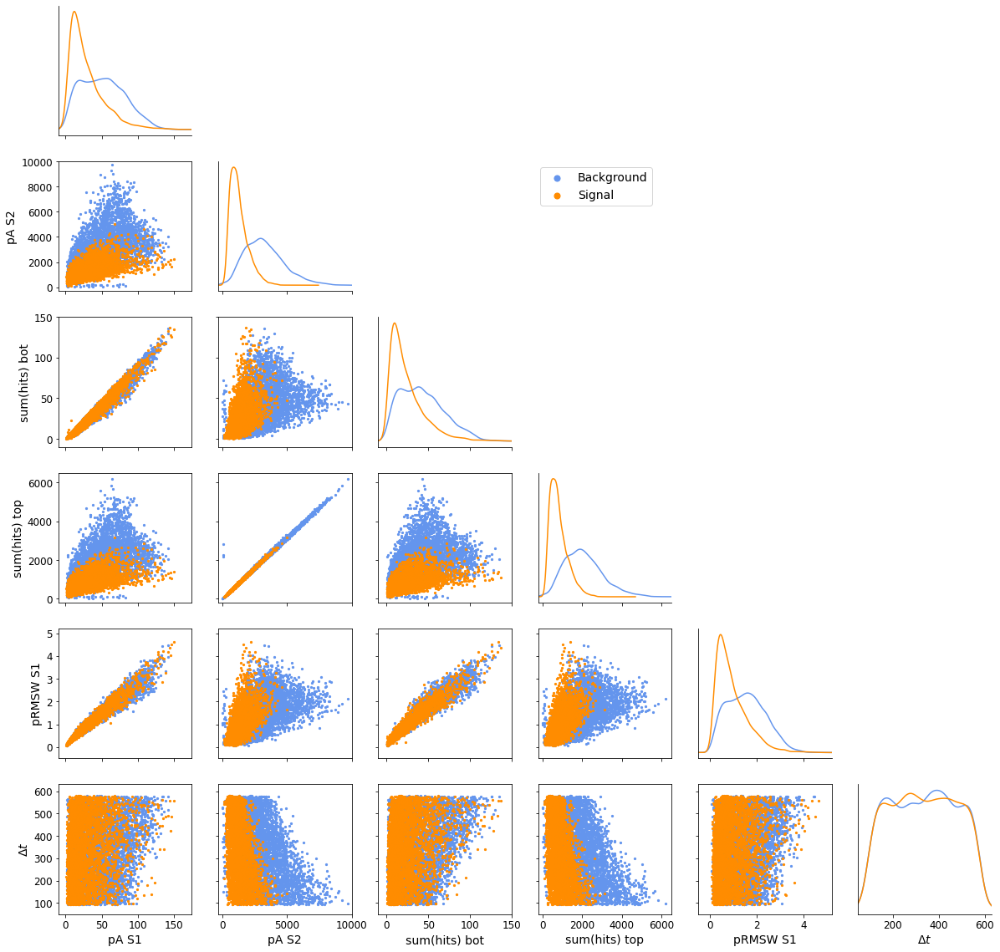

In [16]:
# range
r_pA_S1 = [-10,175]
r_pA_S2 = [-300,10000]
r_pbot = [-10,150]
r_ptop = [-200,6500]
r_pRMSW_S1 = [-0.5,5.2]
r_pdiffT = [50,630]

# color
c_B = 'cornflowerblue'
c_S = 'darkorange'

# marker size
s_size = 5

fig, axs = plt.subplots(6, 6, figsize=(20, 20))



# no subplots in the upper right

axs[0, 1].axis('off')
axs[0, 2].axis('off')
axs[0, 3].axis('off')
axs[0, 4].axis('off')
axs[0, 5].axis('off')

axs[1, 2].axis('off')
axs[1, 3].axis('off')
axs[1, 4].axis('off')
axs[1, 5].axis('off')

axs[2, 3].axis('off')
axs[2, 4].axis('off')
axs[2, 5].axis('off')

axs[3, 4].axis('off')
axs[3, 5].axis('off')

axs[4, 5].axis('off')


# diagonal

df[df['B=0 - S=1'] == 0]['pA S1'].plot(kind='density', ax=axs[0, 0], color=c_B)
df[df['B=0 - S=1'] == 1]['pA S1'].plot(kind='density', ax=axs[0, 0], color=c_S)
axs[0, 0].set_xlim(r_pA_S1)
axs[0, 0].set_ylabel('')
axs[0, 0].tick_params(axis='y',labelsize=None)
axs[0, 0].spines['top'].set_visible(False)
axs[0, 0].spines['right'].set_visible(False)
axs[0, 0].set_yticks([])
axs[0, 0].tick_params(axis='x',labelsize=12)


df[df['B=0 - S=1'] == 0]['pA S2'].plot(kind='density', ax=axs[1, 1], color=c_B)
df[df['B=0 - S=1'] == 1]['pA S2'].plot(kind='density', ax=axs[1, 1], color=c_S)
axs[1, 1].set_xlim(r_pA_S2)
axs[1, 1].set_ylabel('')
axs[1, 1].tick_params(axis='y',labelsize=None)
axs[1, 1].spines['top'].set_visible(False)
axs[1, 1].spines['right'].set_visible(False)
axs[1, 1].set_yticks([])
axs[1, 1].tick_params(axis='x',labelsize=12)


df[df['B=0 - S=1'] == 0]['sum(hits) bot'].plot(kind='density', ax=axs[2, 2], color=c_B)
df[df['B=0 - S=1'] == 1]['sum(hits) bot'].plot(kind='density', ax=axs[2, 2], color=c_S)
axs[2, 2].set_xlim(r_pbot)
axs[2, 2].set_ylabel('')
axs[2, 2].tick_params(axis='y',labelsize=None)
axs[2, 2].spines['top'].set_visible(False)
axs[2, 2].spines['right'].set_visible(False)
axs[2, 2].set_yticks([])
axs[2, 2].tick_params(axis='x',labelsize=12)


df[df['B=0 - S=1'] == 0]['sum(hits) top'].plot(kind='density', ax=axs[3, 3], color=c_B)
df[df['B=0 - S=1'] == 1]['sum(hits) top'].plot(kind='density', ax=axs[3, 3], color=c_S)
axs[3, 3].set_xlim(r_ptop)
axs[3, 3].set_ylabel('')
axs[3, 3].tick_params(axis='y',labelsize=None)
axs[3, 3].spines['top'].set_visible(False)
axs[3, 3].spines['right'].set_visible(False)
axs[3, 3].set_yticks([])
axs[3, 3].tick_params(axis='x',labelsize=12)


df[df['B=0 - S=1'] == 0]['pRMSW S1'].plot(kind='density', ax=axs[4, 4], color=c_B)
df[df['B=0 - S=1'] == 1]['pRMSW S1'].plot(kind='density', ax=axs[4, 4], color=c_S)
axs[4, 4].set_xlim(r_pRMSW_S1)
axs[4, 4].set_ylabel('')
axs[4, 4].tick_params(axis='y',labelsize=None)
axs[4, 4].spines['top'].set_visible(False)
axs[4, 4].spines['right'].set_visible(False)
axs[4, 4].set_yticks([])
axs[4, 4].tick_params(axis='x',labelsize=12)


df[df['B=0 - S=1'] == 0]['$\Delta t$'].plot(kind='density', ax=axs[5, 5], color=c_B)
df[df['B=0 - S=1'] == 1]['$\Delta t$'].plot(kind='density', ax=axs[5, 5], color=c_S)
axs[5, 5].set_xlim(r_pdiffT)
axs[5, 5].set_xlabel('$\Delta t$', fontsize=14)
axs[5, 5].set_ylabel('')
axs[5, 5].tick_params(axis='y',labelsize=None)
axs[5, 5].spines['top'].set_visible(False)
axs[5, 5].spines['right'].set_visible(False)
axs[5, 5].set_yticks([])
axs[5, 5].tick_params(axis='x',labelsize=12)




# column 1

axs[1, 0].scatter(df[df['B=0 - S=1'] == 0]['pA S1'], df[df['B=0 - S=1'] == 0]['pA S2'], s=s_size, color=c_B)
axs[1, 0].scatter(df[df['B=0 - S=1'] == 1]['pA S1'], df[df['B=0 - S=1'] == 1]['pA S2'], s=s_size, color=c_S)
axs[1, 0].set_xlim(r_pA_S1)
axs[1, 0].set_ylim(r_pA_S2)
axs[1, 0].set_ylabel('pA S2', fontsize=14)
axs[1, 0].tick_params(axis='x',labelsize=12)
axs[1, 0].tick_params(axis='y',labelsize=12)
# axs[1, 0].grid()

axs[2, 0].scatter(df[df['B=0 - S=1'] == 0]['pA S1'], df[df['B=0 - S=1'] == 0]['sum(hits) bot'], s=s_size, color=c_B)
axs[2, 0].scatter(df[df['B=0 - S=1'] == 1]['pA S1'], df[df['B=0 - S=1'] == 1]['sum(hits) bot'], s=s_size, color=c_S)
axs[2, 0].set_xlim(r_pA_S1)
axs[2, 0].set_ylim(r_pbot)
axs[2, 0].set_ylabel('sum(hits) bot', fontsize=14)
axs[2, 0].tick_params(axis='x',labelsize=12)
axs[2, 0].tick_params(axis='y',labelsize=12)
# axs[2, 0].grid()

axs[3, 0].scatter(df[df['B=0 - S=1'] == 0]['pA S1'], df[df['B=0 - S=1'] == 0]['sum(hits) top'], s=s_size, color=c_B)
axs[3, 0].scatter(df[df['B=0 - S=1'] == 1]['pA S1'], df[df['B=0 - S=1'] == 1]['sum(hits) top'], s=s_size, color=c_S)
axs[3, 0].set_xlim(r_pA_S1)
axs[3, 0].set_ylim(r_ptop)
axs[3, 0].set_ylabel('sum(hits) top', fontsize=14)
axs[3, 0].tick_params(axis='x',labelsize=12)
axs[3, 0].tick_params(axis='y',labelsize=12)
# axs[3, 0].grid()

axs[4, 0].scatter(df[df['B=0 - S=1'] == 0]['pA S1'], df[df['B=0 - S=1'] == 0]['pRMSW S1'], s=s_size, color=c_B)
axs[4, 0].scatter(df[df['B=0 - S=1'] == 1]['pA S1'], df[df['B=0 - S=1'] == 1]['pRMSW S1'], s=s_size, color=c_S)
axs[4, 0].set_xlim(r_pA_S1)
axs[4, 0].set_ylim(r_pRMSW_S1)
axs[4, 0].set_ylabel('pRMSW S1', fontsize=14)
axs[4, 0].tick_params(axis='x',labelsize=12)
axs[4, 0].tick_params(axis='y',labelsize=12)
# axs[4, 0].grid()

axs[5, 0].scatter(df[df['B=0 - S=1'] == 0]['pA S1'], df[df['B=0 - S=1'] == 0]['$\Delta t$'], s=s_size, color=c_B)
axs[5, 0].scatter(df[df['B=0 - S=1'] == 1]['pA S1'], df[df['B=0 - S=1'] == 1]['$\Delta t$'], s=s_size, color=c_S)
axs[5, 0].set_xlim(r_pA_S1)
axs[5, 0].set_ylim(r_pdiffT)
axs[5, 0].set_xlabel('pA S1', fontsize=14)
axs[5, 0].set_ylabel('$\Delta t$', fontsize=14)
axs[5, 0].tick_params(axis='x',labelsize=12)
axs[5, 0].tick_params(axis='y',labelsize=12)
# axs[5, 0].grid()



# column 2

axs[2, 1].scatter(df[df['B=0 - S=1'] == 0]['pA S2'], df[df['B=0 - S=1'] == 0]['sum(hits) bot'], s=s_size, color=c_B)
axs[2, 1].scatter(df[df['B=0 - S=1'] == 1]['pA S2'], df[df['B=0 - S=1'] == 1]['sum(hits) bot'], s=s_size, color=c_S)
axs[2, 1].set_xlim(r_pA_S2)
axs[2, 1].set_ylim(r_pbot)
# axs[2, 1].set_ylabel('sum(hits) bot', fontsize=14)
axs[2, 1].tick_params(axis='x',labelsize=12)
axs[2, 1].tick_params(axis='y',labelsize=12)
# axs[2, 1].grid()

axs[3, 1].scatter(df[df['B=0 - S=1'] == 0]['pA S2'], df[df['B=0 - S=1'] == 0]['sum(hits) top'], s=s_size, color=c_B)
axs[3, 1].scatter(df[df['B=0 - S=1'] == 1]['pA S2'], df[df['B=0 - S=1'] == 1]['sum(hits) top'], s=s_size, color=c_S)
axs[3, 1].set_xlim(r_pA_S2)
axs[3, 1].set_ylim(r_ptop)
# axs[3, 1].set_ylabel('sum(hits) top', fontsize=14)
axs[3, 1].tick_params(axis='x',labelsize=12)
axs[3, 1].tick_params(axis='y',labelsize=12)
# axs[3, 1].grid()

axs[4, 1].scatter(df[df['B=0 - S=1'] == 0]['pA S2'], df[df['B=0 - S=1'] == 0]['pRMSW S1'], s=s_size, color=c_B)
axs[4, 1].scatter(df[df['B=0 - S=1'] == 1]['pA S2'], df[df['B=0 - S=1'] == 1]['pRMSW S1'], s=s_size, color=c_S)
axs[4, 1].set_xlim(r_pA_S2)
axs[4, 1].set_ylim(r_pRMSW_S1)
# axs[4, 1].set_ylabel('pRMSW S1', fontsize=14)
axs[4, 1].tick_params(axis='x',labelsize=12)
axs[4, 1].tick_params(axis='y',labelsize=12)
# axs[4, 1].grid()

axs[5, 1].scatter(df[df['B=0 - S=1'] == 0]['pA S2'], df[df['B=0 - S=1'] == 0]['$\Delta t$'], s=s_size, color=c_B)
axs[5, 1].scatter(df[df['B=0 - S=1'] == 1]['pA S2'], df[df['B=0 - S=1'] == 1]['$\Delta t$'], s=s_size, color=c_S)
axs[5, 1].set_xlim(r_pA_S2)
axs[5, 1].set_ylim(r_pdiffT)
axs[5, 1].set_xlabel('pA S2', fontsize=14)
# axs[5, 1].set_ylabel('$\Delta t$', fontsize=14)
axs[5, 1].tick_params(axis='x',labelsize=12)
axs[5, 1].tick_params(axis='y',labelsize=12)
# axs[5, 1].grid()



# column 3

axs[3, 2].scatter(df[df['B=0 - S=1'] == 0]['sum(hits) bot'], df[df['B=0 - S=1'] == 0]['sum(hits) top'], s=s_size, color=c_B)
axs[3, 2].scatter(df[df['B=0 - S=1'] == 1]['sum(hits) bot'], df[df['B=0 - S=1'] == 1]['sum(hits) top'], s=s_size, color=c_S)
axs[3, 2].set_xlim(r_pbot)
axs[3, 2].set_ylim(r_ptop)
# axs[3, 2].set_ylabel('sum(hits) top', fontsize=14)
axs[3, 2].tick_params(axis='x',labelsize=12)
axs[3, 2].tick_params(axis='y',labelsize=12)
# axs[3, 2].grid()

axs[4, 2].scatter(df[df['B=0 - S=1'] == 0]['sum(hits) bot'], df[df['B=0 - S=1'] == 0]['pRMSW S1'], s=s_size, color=c_B)
axs[4, 2].scatter(df[df['B=0 - S=1'] == 1]['sum(hits) bot'], df[df['B=0 - S=1'] == 1]['pRMSW S1'], s=s_size, color=c_S)
axs[4, 2].set_xlim(r_pbot)
axs[4, 2].set_ylim(r_pRMSW_S1)
# axs[4, 2].set_ylabel('pRMSW S1', fontsize=14)
axs[4, 2].tick_params(axis='x',labelsize=12)
axs[4, 2].tick_params(axis='y',labelsize=12)
# axs[4, 2].grid()

axs[5, 2].scatter(df[df['B=0 - S=1'] == 0]['sum(hits) bot'], df[df['B=0 - S=1'] == 0]['$\Delta t$'], s=s_size, color=c_B)
axs[5, 2].scatter(df[df['B=0 - S=1'] == 1]['sum(hits) bot'], df[df['B=0 - S=1'] == 1]['$\Delta t$'], s=s_size, color=c_S)
axs[5, 2].set_xlim(r_pbot)
axs[5, 2].set_ylim(r_pdiffT)
axs[5, 2].set_xlabel('sum(hits) bot', fontsize=14)
# axs[5, 2].set_ylabel('$\Delta t$', fontsize=14)
axs[5, 2].tick_params(axis='x',labelsize=12)
axs[5, 2].tick_params(axis='y',labelsize=12)
# axs[5, 2].grid()



# column 4

axs[4, 3].scatter(df[df['B=0 - S=1'] == 0]['sum(hits) top'], df[df['B=0 - S=1'] == 0]['pRMSW S1'], s=s_size, color=c_B)
axs[4, 3].scatter(df[df['B=0 - S=1'] == 1]['sum(hits) top'], df[df['B=0 - S=1'] == 1]['pRMSW S1'], s=s_size, color=c_S)
axs[4, 3].set_xlim(r_ptop)
axs[4, 3].set_ylim(r_pRMSW_S1)
# axs[4, 3].set_ylabel('pRMSW S1', fontsize=14)
axs[4, 3].tick_params(axis='x',labelsize=12)
axs[4, 3].tick_params(axis='y',labelsize=12)
# axs[4, 3].grid()

axs[5, 3].scatter(df[df['B=0 - S=1'] == 0]['sum(hits) top'], df[df['B=0 - S=1'] == 0]['$\Delta t$'], s=s_size, color=c_B)
axs[5, 3].scatter(df[df['B=0 - S=1'] == 1]['sum(hits) top'], df[df['B=0 - S=1'] == 1]['$\Delta t$'], s=s_size, color=c_S)
axs[5, 3].set_xlim(r_ptop)
axs[5, 3].set_ylim(r_pdiffT)
axs[5, 3].set_xlabel('sum(hits) top', fontsize=14)
# axs[5, 3].set_ylabel('$\Delta t$', fontsize=14)
axs[5, 3].tick_params(axis='x',labelsize=12)
axs[5, 3].tick_params(axis='y',labelsize=12)
# axs[5, 3].grid()



# column 5

axs[5, 4].scatter(df[df['B=0 - S=1'] == 0]['pRMSW S1'], df[df['B=0 - S=1'] == 0]['$\Delta t$'], s=s_size, color=c_B)
axs[5, 4].scatter(df[df['B=0 - S=1'] == 1]['pRMSW S1'], df[df['B=0 - S=1'] == 1]['$\Delta t$'], s=s_size, color=c_S)
axs[5, 4].set_xlim(r_pRMSW_S1)
axs[5, 4].set_ylim(r_pdiffT)
axs[5, 4].set_xlabel('pRMSW S1', fontsize=14)
# axs[5, 4].set_ylabel('$\Delta t$', fontsize=14)
axs[5, 4].tick_params(axis='x',labelsize=12)
axs[5, 4].tick_params(axis='y',labelsize=12)
# axs[5, 4].grid()



# Dummy, labels
axs[1, 0].scatter([9999999], [9999999], s=50, color=c_B, label = 'Background')
axs[1, 0].scatter([9999999], [9999999], s=50, color=c_S, label = 'Signal')


# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()
    
axs[1, 0].legend(bbox_to_anchor=(4.5, 1.0), fontsize=14)
plt.savefig('correlations.pdf',bbox_inches='tight')
plt.show()

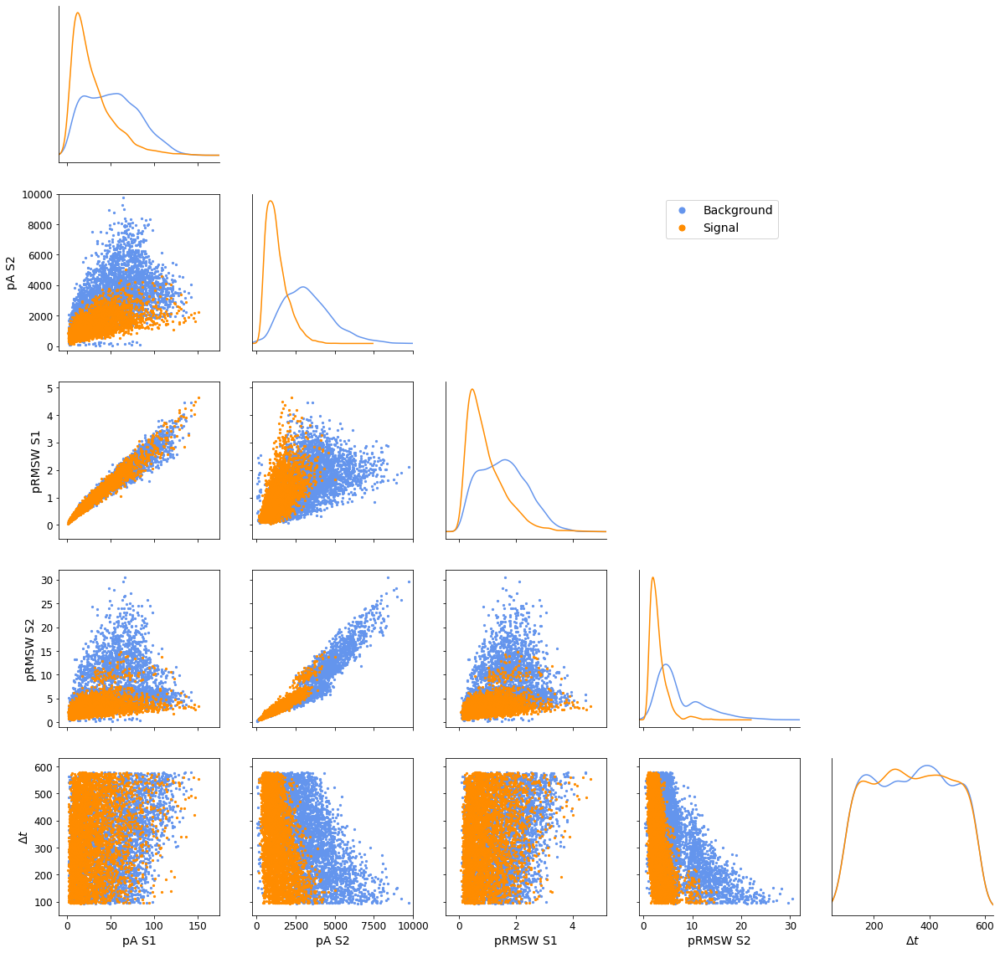

In [17]:
# range
r_pA_S1 = [-10,175]
r_pA_S2 = [-300,10000]
r_pRMSW_S1 = [-0.5,5.2]
r_pRMSW_S2 = [-1,32]
r_pdiffT = [50,630]

# color
c_B = 'cornflowerblue'
c_S = 'darkorange'

# marker size
s_size = 5

fig, axs = plt.subplots(5, 5, figsize=(20, 20))



# no subplots in the upper right

axs[0, 1].axis('off')
axs[0, 2].axis('off')
axs[0, 3].axis('off')
axs[0, 4].axis('off')

axs[1, 2].axis('off')
axs[1, 3].axis('off')
axs[1, 4].axis('off')

axs[2, 3].axis('off')
axs[2, 4].axis('off')

axs[3, 4].axis('off')



# diagonal

df[df['B=0 - S=1'] == 0]['pA S1'].plot(kind='density', ax=axs[0, 0], color=c_B)
df[df['B=0 - S=1'] == 1]['pA S1'].plot(kind='density', ax=axs[0, 0], color=c_S)
axs[0, 0].set_xlim(r_pA_S1)
axs[0, 0].set_ylabel('')
axs[0, 0].tick_params(axis='y',labelsize=None)
axs[0, 0].spines['top'].set_visible(False)
axs[0, 0].spines['right'].set_visible(False)
axs[0, 0].set_yticks([])
axs[0, 0].tick_params(axis='x',labelsize=12)


df[df['B=0 - S=1'] == 0]['pA S2'].plot(kind='density', ax=axs[1, 1], color=c_B)
df[df['B=0 - S=1'] == 1]['pA S2'].plot(kind='density', ax=axs[1, 1], color=c_S)
axs[1, 1].set_xlim(r_pA_S2)
axs[1, 1].set_ylabel('')
axs[1, 1].tick_params(axis='y',labelsize=None)
axs[1, 1].spines['top'].set_visible(False)
axs[1, 1].spines['right'].set_visible(False)
axs[1, 1].set_yticks([])
axs[1, 1].tick_params(axis='x',labelsize=12)


df[df['B=0 - S=1'] == 0]['pRMSW S1'].plot(kind='density', ax=axs[2, 2], color=c_B)
df[df['B=0 - S=1'] == 1]['pRMSW S1'].plot(kind='density', ax=axs[2, 2], color=c_S)
axs[2, 2].set_xlim(r_pRMSW_S1)
axs[2, 2].set_ylabel('')
axs[2, 2].tick_params(axis='y',labelsize=None)
axs[2, 2].spines['top'].set_visible(False)
axs[2, 2].spines['right'].set_visible(False)
axs[2, 2].set_yticks([])
axs[2, 2].tick_params(axis='x',labelsize=12)


df[df['B=0 - S=1'] == 0]['pRMSW S2'].plot(kind='density', ax=axs[3, 3], color=c_B)
df[df['B=0 - S=1'] == 1]['pRMSW S2'].plot(kind='density', ax=axs[3, 3], color=c_S)
axs[3, 3].set_xlim(r_pRMSW_S2)
axs[3, 3].set_ylabel('')
axs[3, 3].tick_params(axis='y',labelsize=None)
axs[3, 3].spines['top'].set_visible(False)
axs[3, 3].spines['right'].set_visible(False)
axs[3, 3].set_yticks([])
axs[3, 3].tick_params(axis='x',labelsize=12)


df[df['B=0 - S=1'] == 0]['$\Delta t$'].plot(kind='density', ax=axs[4, 4], color=c_B)
df[df['B=0 - S=1'] == 1]['$\Delta t$'].plot(kind='density', ax=axs[4, 4], color=c_S)
axs[4, 4].set_xlim(r_pdiffT)
axs[4, 4].set_xlabel('$\Delta t$', fontsize=14)
axs[4, 4].set_ylabel('')
axs[4, 4].tick_params(axis='y',labelsize=None)
axs[4, 4].spines['top'].set_visible(False)
axs[4, 4].spines['right'].set_visible(False)
axs[4, 4].set_yticks([])
axs[4, 4].tick_params(axis='x',labelsize=12)





# column 1

axs[1, 0].scatter(df[df['B=0 - S=1'] == 0]['pA S1'], df[df['B=0 - S=1'] == 0]['pA S2'], s=s_size, color=c_B)
axs[1, 0].scatter(df[df['B=0 - S=1'] == 1]['pA S1'], df[df['B=0 - S=1'] == 1]['pA S2'], s=s_size, color=c_S)
axs[1, 0].set_xlim(r_pA_S1)
axs[1, 0].set_ylim(r_pA_S2)
axs[1, 0].set_ylabel('pA S2', fontsize=14)
axs[1, 0].tick_params(axis='x',labelsize=12)
axs[1, 0].tick_params(axis='y',labelsize=12)
# axs[1, 0].grid()

axs[2, 0].scatter(df[df['B=0 - S=1'] == 0]['pA S1'], df[df['B=0 - S=1'] == 0]['pRMSW S1'], s=s_size, color=c_B)
axs[2, 0].scatter(df[df['B=0 - S=1'] == 1]['pA S1'], df[df['B=0 - S=1'] == 1]['pRMSW S1'], s=s_size, color=c_S)
axs[2, 0].set_xlim(r_pA_S1)
axs[2, 0].set_ylim(r_pRMSW_S1)
axs[2, 0].set_ylabel('pRMSW S1', fontsize=14)
axs[2, 0].tick_params(axis='x',labelsize=12)
axs[2, 0].tick_params(axis='y',labelsize=12)
# axs[2, 0].grid()

axs[3, 0].scatter(df[df['B=0 - S=1'] == 0]['pA S1'], df[df['B=0 - S=1'] == 0]['pRMSW S2'], s=s_size, color=c_B)
axs[3, 0].scatter(df[df['B=0 - S=1'] == 1]['pA S1'], df[df['B=0 - S=1'] == 1]['pRMSW S2'], s=s_size, color=c_S)
axs[3, 0].set_xlim(r_pA_S1)
axs[3, 0].set_ylim(r_pRMSW_S2)
axs[3, 0].set_ylabel('pRMSW S2', fontsize=14)
axs[3, 0].tick_params(axis='x',labelsize=12)
axs[3, 0].tick_params(axis='y',labelsize=12)
# axs[3, 0].grid()

axs[4, 0].scatter(df[df['B=0 - S=1'] == 0]['pA S1'], df[df['B=0 - S=1'] == 0]['$\Delta t$'], s=s_size, color=c_B)
axs[4, 0].scatter(df[df['B=0 - S=1'] == 1]['pA S1'], df[df['B=0 - S=1'] == 1]['$\Delta t$'], s=s_size, color=c_S)
axs[4, 0].set_xlim(r_pA_S1)
axs[4, 0].set_ylim(r_pdiffT)
axs[4, 0].set_xlabel('pA S1', fontsize=14)
axs[4, 0].set_ylabel('$\Delta t$', fontsize=14)
axs[4, 0].tick_params(axis='x',labelsize=12)
axs[4, 0].tick_params(axis='y',labelsize=12)
# axs[4, 0].grid()





# column 2

axs[2, 1].scatter(df[df['B=0 - S=1'] == 0]['pA S2'], df[df['B=0 - S=1'] == 0]['pRMSW S1'], s=s_size, color=c_B)
axs[2, 1].scatter(df[df['B=0 - S=1'] == 1]['pA S2'], df[df['B=0 - S=1'] == 1]['pRMSW S1'], s=s_size, color=c_S)
axs[2, 1].set_xlim(r_pA_S2)
axs[2, 1].set_ylim(r_pRMSW_S1)
# axs[2, 1].set_ylabel('sum(hits) bot', fontsize=14)
axs[2, 1].tick_params(axis='x',labelsize=12)
axs[2, 1].tick_params(axis='y',labelsize=12)
# axs[2, 1].grid()

axs[3, 1].scatter(df[df['B=0 - S=1'] == 0]['pA S2'], df[df['B=0 - S=1'] == 0]['pRMSW S2'], s=s_size, color=c_B)
axs[3, 1].scatter(df[df['B=0 - S=1'] == 1]['pA S2'], df[df['B=0 - S=1'] == 1]['pRMSW S2'], s=s_size, color=c_S)
axs[3, 1].set_xlim(r_pA_S2)
axs[3, 1].set_ylim(r_pRMSW_S2)
# axs[3, 1].set_ylabel('sum(hits) top', fontsize=14)
axs[3, 1].tick_params(axis='x',labelsize=12)
axs[3, 1].tick_params(axis='y',labelsize=12)
# axs[3, 1].grid()

axs[4, 1].scatter(df[df['B=0 - S=1'] == 0]['pA S2'], df[df['B=0 - S=1'] == 0]['$\Delta t$'], s=s_size, color=c_B)
axs[4, 1].scatter(df[df['B=0 - S=1'] == 1]['pA S2'], df[df['B=0 - S=1'] == 1]['$\Delta t$'], s=s_size, color=c_S)
axs[4, 1].set_xlim(r_pA_S2)
axs[4, 1].set_ylim(r_pdiffT)
axs[4, 1].set_xlabel('pA S2', fontsize=14)
# axs[4, 1].set_ylabel('$\Delta t$', fontsize=14)
axs[4, 1].tick_params(axis='x',labelsize=12)
axs[4, 1].tick_params(axis='y',labelsize=12)
# axs[4, 1].grid()



# column 3

axs[3, 2].scatter(df[df['B=0 - S=1'] == 0]['pRMSW S1'], df[df['B=0 - S=1'] == 0]['pRMSW S2'], s=s_size, color=c_B)
axs[3, 2].scatter(df[df['B=0 - S=1'] == 1]['pRMSW S1'], df[df['B=0 - S=1'] == 1]['pRMSW S2'], s=s_size, color=c_S)
axs[3, 2].set_xlim(r_pRMSW_S1)
axs[3, 2].set_ylim(r_pRMSW_S2)
# axs[3, 2].set_ylabel('sum(hits) top', fontsize=14)
axs[3, 2].tick_params(axis='x',labelsize=12)
axs[3, 2].tick_params(axis='y',labelsize=12)
# axs[3, 2].grid()


axs[4, 2].scatter(df[df['B=0 - S=1'] == 0]['pRMSW S1'], df[df['B=0 - S=1'] == 0]['$\Delta t$'], s=s_size, color=c_B)
axs[4, 2].scatter(df[df['B=0 - S=1'] == 1]['pRMSW S1'], df[df['B=0 - S=1'] == 1]['$\Delta t$'], s=s_size, color=c_S)
axs[4, 2].set_xlim(r_pRMSW_S1)
axs[4, 2].set_ylim(r_pdiffT)
axs[4, 2].set_xlabel('pRMSW S1', fontsize=14)
# axs[4, 2].set_ylabel('$\Delta t$', fontsize=14)
axs[4, 2].tick_params(axis='x',labelsize=12)
axs[4, 2].tick_params(axis='y',labelsize=12)
# axs[4, 2].grid()



# column 4

axs[4, 3].scatter(df[df['B=0 - S=1'] == 0]['pRMSW S2'], df[df['B=0 - S=1'] == 0]['$\Delta t$'], s=s_size, color=c_B)
axs[4, 3].scatter(df[df['B=0 - S=1'] == 1]['pRMSW S2'], df[df['B=0 - S=1'] == 1]['$\Delta t$'], s=s_size, color=c_S)
axs[4, 3].set_xlim(r_pRMSW_S2)
axs[4, 3].set_ylim(r_pdiffT)
axs[4, 3].set_xlabel('pRMSW S2', fontsize=14)
# axs[4, 3].set_ylabel('$\Delta t$', fontsize=14)
axs[4, 3].tick_params(axis='x',labelsize=12)
axs[4, 3].tick_params(axis='y',labelsize=12)
# axs[4, 3].grid()







# Dummy, labels
axs[1, 0].scatter([9999999], [9999999], s=50, color=c_B, label = 'Background')
axs[1, 0].scatter([9999999], [9999999], s=50, color=c_S, label = 'Signal')


# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()
    
axs[1, 0].legend(bbox_to_anchor=(4.5, 1.0), fontsize=14)
plt.savefig('correlations2.pdf',bbox_inches='tight')
plt.show()

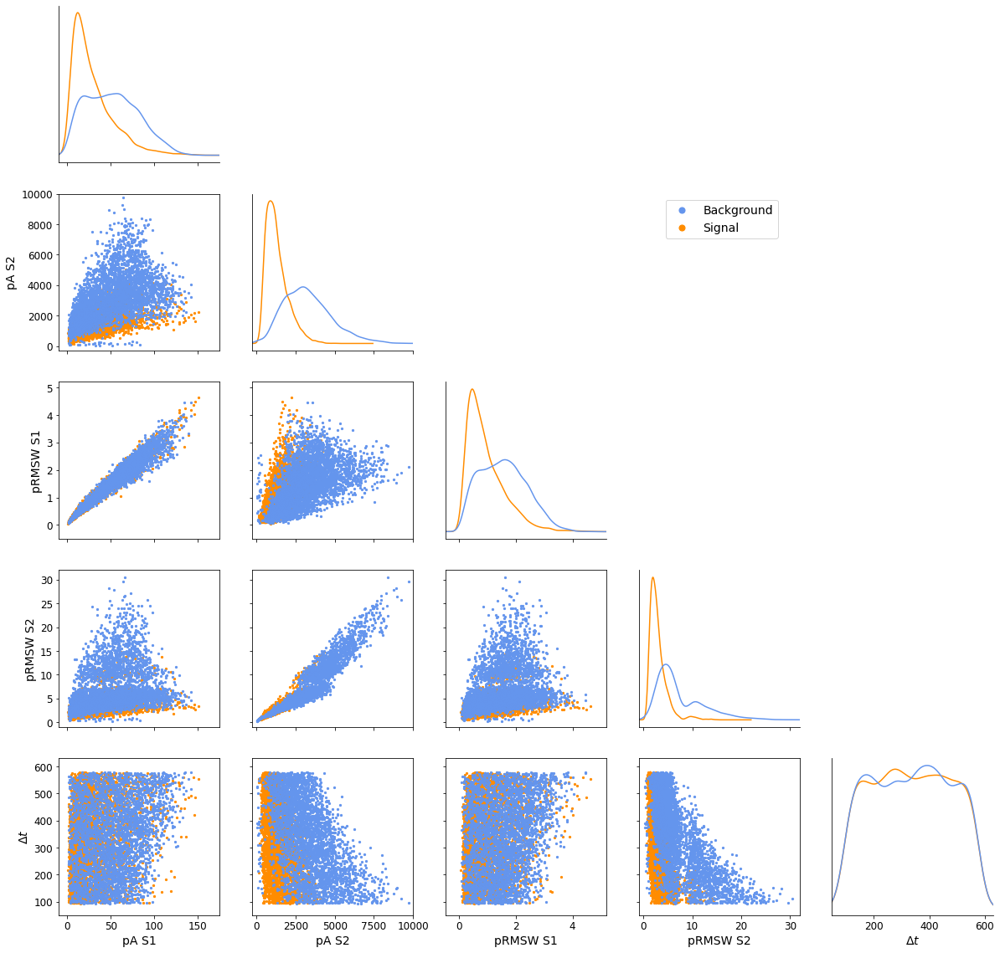

In [18]:
# range
r_pA_S1 = [-10,175]
r_pA_S2 = [-300,10000]
r_pRMSW_S1 = [-0.5,5.2]
r_pRMSW_S2 = [-1,32]
r_pdiffT = [50,630]

# color
c_B = 'cornflowerblue'
c_S = 'darkorange'

# marker size
s_size = 5

fig, axs = plt.subplots(5, 5, figsize=(20, 20))



# no subplots in the upper right

axs[0, 1].axis('off')
axs[0, 2].axis('off')
axs[0, 3].axis('off')
axs[0, 4].axis('off')

axs[1, 2].axis('off')
axs[1, 3].axis('off')
axs[1, 4].axis('off')

axs[2, 3].axis('off')
axs[2, 4].axis('off')

axs[3, 4].axis('off')



# diagonal

df[df['B=0 - S=1'] == 1]['pA S1'].plot(kind='density', ax=axs[0, 0], color=c_S)
df[df['B=0 - S=1'] == 0]['pA S1'].plot(kind='density', ax=axs[0, 0], color=c_B)
axs[0, 0].set_xlim(r_pA_S1)
axs[0, 0].set_ylabel('')
axs[0, 0].tick_params(axis='y',labelsize=None)
axs[0, 0].spines['top'].set_visible(False)
axs[0, 0].spines['right'].set_visible(False)
axs[0, 0].set_yticks([])
axs[0, 0].tick_params(axis='x',labelsize=12)


df[df['B=0 - S=1'] == 1]['pA S2'].plot(kind='density', ax=axs[1, 1], color=c_S)
df[df['B=0 - S=1'] == 0]['pA S2'].plot(kind='density', ax=axs[1, 1], color=c_B)
axs[1, 1].set_xlim(r_pA_S2)
axs[1, 1].set_ylabel('')
axs[1, 1].tick_params(axis='y',labelsize=None)
axs[1, 1].spines['top'].set_visible(False)
axs[1, 1].spines['right'].set_visible(False)
axs[1, 1].set_yticks([])
axs[1, 1].tick_params(axis='x',labelsize=12)


df[df['B=0 - S=1'] == 1]['pRMSW S1'].plot(kind='density', ax=axs[2, 2], color=c_S)
df[df['B=0 - S=1'] == 0]['pRMSW S1'].plot(kind='density', ax=axs[2, 2], color=c_B)
axs[2, 2].set_xlim(r_pRMSW_S1)
axs[2, 2].set_ylabel('')
axs[2, 2].tick_params(axis='y',labelsize=None)
axs[2, 2].spines['top'].set_visible(False)
axs[2, 2].spines['right'].set_visible(False)
axs[2, 2].set_yticks([])
axs[2, 2].tick_params(axis='x',labelsize=12)


df[df['B=0 - S=1'] == 1]['pRMSW S2'].plot(kind='density', ax=axs[3, 3], color=c_S)
df[df['B=0 - S=1'] == 0]['pRMSW S2'].plot(kind='density', ax=axs[3, 3], color=c_B)
axs[3, 3].set_xlim(r_pRMSW_S2)
axs[3, 3].set_ylabel('')
axs[3, 3].tick_params(axis='y',labelsize=None)
axs[3, 3].spines['top'].set_visible(False)
axs[3, 3].spines['right'].set_visible(False)
axs[3, 3].set_yticks([])
axs[3, 3].tick_params(axis='x',labelsize=12)


df[df['B=0 - S=1'] == 1]['$\Delta t$'].plot(kind='density', ax=axs[4, 4], color=c_S)
df[df['B=0 - S=1'] == 0]['$\Delta t$'].plot(kind='density', ax=axs[4, 4], color=c_B)
axs[4, 4].set_xlim(r_pdiffT)
axs[4, 4].set_xlabel('$\Delta t$', fontsize=14)
axs[4, 4].set_ylabel('')
axs[4, 4].tick_params(axis='y',labelsize=None)
axs[4, 4].spines['top'].set_visible(False)
axs[4, 4].spines['right'].set_visible(False)
axs[4, 4].set_yticks([])
axs[4, 4].tick_params(axis='x',labelsize=12)





# column 1

axs[1, 0].scatter(df[df['B=0 - S=1'] == 1]['pA S1'], df[df['B=0 - S=1'] == 1]['pA S2'], s=s_size, color=c_S)
axs[1, 0].scatter(df[df['B=0 - S=1'] == 0]['pA S1'], df[df['B=0 - S=1'] == 0]['pA S2'], s=s_size, color=c_B)
axs[1, 0].set_xlim(r_pA_S1)
axs[1, 0].set_ylim(r_pA_S2)
axs[1, 0].set_ylabel('pA S2', fontsize=14)
axs[1, 0].tick_params(axis='x',labelsize=12)
axs[1, 0].tick_params(axis='y',labelsize=12)
# axs[1, 0].grid()

axs[2, 0].scatter(df[df['B=0 - S=1'] == 1]['pA S1'], df[df['B=0 - S=1'] == 1]['pRMSW S1'], s=s_size, color=c_S)
axs[2, 0].scatter(df[df['B=0 - S=1'] == 0]['pA S1'], df[df['B=0 - S=1'] == 0]['pRMSW S1'], s=s_size, color=c_B)
axs[2, 0].set_xlim(r_pA_S1)
axs[2, 0].set_ylim(r_pRMSW_S1)
axs[2, 0].set_ylabel('pRMSW S1', fontsize=14)
axs[2, 0].tick_params(axis='x',labelsize=12)
axs[2, 0].tick_params(axis='y',labelsize=12)
# axs[2, 0].grid()

axs[3, 0].scatter(df[df['B=0 - S=1'] == 1]['pA S1'], df[df['B=0 - S=1'] == 1]['pRMSW S2'], s=s_size, color=c_S)
axs[3, 0].scatter(df[df['B=0 - S=1'] == 0]['pA S1'], df[df['B=0 - S=1'] == 0]['pRMSW S2'], s=s_size, color=c_B)
axs[3, 0].set_xlim(r_pA_S1)
axs[3, 0].set_ylim(r_pRMSW_S2)
axs[3, 0].set_ylabel('pRMSW S2', fontsize=14)
axs[3, 0].tick_params(axis='x',labelsize=12)
axs[3, 0].tick_params(axis='y',labelsize=12)
# axs[3, 0].grid()

axs[4, 0].scatter(df[df['B=0 - S=1'] == 1]['pA S1'], df[df['B=0 - S=1'] == 1]['$\Delta t$'], s=s_size, color=c_S)
axs[4, 0].scatter(df[df['B=0 - S=1'] == 0]['pA S1'], df[df['B=0 - S=1'] == 0]['$\Delta t$'], s=s_size, color=c_B)
axs[4, 0].set_xlim(r_pA_S1)
axs[4, 0].set_ylim(r_pdiffT)
axs[4, 0].set_xlabel('pA S1', fontsize=14)
axs[4, 0].set_ylabel('$\Delta t$', fontsize=14)
axs[4, 0].tick_params(axis='x',labelsize=12)
axs[4, 0].tick_params(axis='y',labelsize=12)
# axs[4, 0].grid()





# column 2

axs[2, 1].scatter(df[df['B=0 - S=1'] == 1]['pA S2'], df[df['B=0 - S=1'] == 1]['pRMSW S1'], s=s_size, color=c_S)
axs[2, 1].scatter(df[df['B=0 - S=1'] == 0]['pA S2'], df[df['B=0 - S=1'] == 0]['pRMSW S1'], s=s_size, color=c_B)
axs[2, 1].set_xlim(r_pA_S2)
axs[2, 1].set_ylim(r_pRMSW_S1)
# axs[2, 1].set_ylabel('sum(hits) bot', fontsize=14)
axs[2, 1].tick_params(axis='x',labelsize=12)
axs[2, 1].tick_params(axis='y',labelsize=12)
# axs[2, 1].grid()

axs[3, 1].scatter(df[df['B=0 - S=1'] == 1]['pA S2'], df[df['B=0 - S=1'] == 1]['pRMSW S2'], s=s_size, color=c_S)
axs[3, 1].scatter(df[df['B=0 - S=1'] == 0]['pA S2'], df[df['B=0 - S=1'] == 0]['pRMSW S2'], s=s_size, color=c_B)
axs[3, 1].set_xlim(r_pA_S2)
axs[3, 1].set_ylim(r_pRMSW_S2)
# axs[3, 1].set_ylabel('sum(hits) top', fontsize=14)
axs[3, 1].tick_params(axis='x',labelsize=12)
axs[3, 1].tick_params(axis='y',labelsize=12)
# axs[3, 1].grid()

axs[4, 1].scatter(df[df['B=0 - S=1'] == 1]['pA S2'], df[df['B=0 - S=1'] == 1]['$\Delta t$'], s=s_size, color=c_S)
axs[4, 1].scatter(df[df['B=0 - S=1'] == 0]['pA S2'], df[df['B=0 - S=1'] == 0]['$\Delta t$'], s=s_size, color=c_B)
axs[4, 1].set_xlim(r_pA_S2)
axs[4, 1].set_ylim(r_pdiffT)
axs[4, 1].set_xlabel('pA S2', fontsize=14)
# axs[4, 1].set_ylabel('$\Delta t$', fontsize=14)
axs[4, 1].tick_params(axis='x',labelsize=12)
axs[4, 1].tick_params(axis='y',labelsize=12)
# axs[4, 1].grid()



# column 3

axs[3, 2].scatter(df[df['B=0 - S=1'] == 1]['pRMSW S1'], df[df['B=0 - S=1'] == 1]['pRMSW S2'], s=s_size, color=c_S)
axs[3, 2].scatter(df[df['B=0 - S=1'] == 0]['pRMSW S1'], df[df['B=0 - S=1'] == 0]['pRMSW S2'], s=s_size, color=c_B)
axs[3, 2].set_xlim(r_pRMSW_S1)
axs[3, 2].set_ylim(r_pRMSW_S2)
# axs[3, 2].set_ylabel('sum(hits) top', fontsize=14)
axs[3, 2].tick_params(axis='x',labelsize=12)
axs[3, 2].tick_params(axis='y',labelsize=12)
# axs[3, 2].grid()


axs[4, 2].scatter(df[df['B=0 - S=1'] == 1]['pRMSW S1'], df[df['B=0 - S=1'] == 1]['$\Delta t$'], s=s_size, color=c_S)
axs[4, 2].scatter(df[df['B=0 - S=1'] == 0]['pRMSW S1'], df[df['B=0 - S=1'] == 0]['$\Delta t$'], s=s_size, color=c_B)
axs[4, 2].set_xlim(r_pRMSW_S1)
axs[4, 2].set_ylim(r_pdiffT)
axs[4, 2].set_xlabel('pRMSW S1', fontsize=14)
# axs[4, 2].set_ylabel('$\Delta t$', fontsize=14)
axs[4, 2].tick_params(axis='x',labelsize=12)
axs[4, 2].tick_params(axis='y',labelsize=12)
# axs[4, 2].grid()



# column 4

axs[4, 3].scatter(df[df['B=0 - S=1'] == 1]['pRMSW S2'], df[df['B=0 - S=1'] == 1]['$\Delta t$'], s=s_size, color=c_S)
axs[4, 3].scatter(df[df['B=0 - S=1'] == 0]['pRMSW S2'], df[df['B=0 - S=1'] == 0]['$\Delta t$'], s=s_size, color=c_B)
axs[4, 3].set_xlim(r_pRMSW_S2)
axs[4, 3].set_ylim(r_pdiffT)
axs[4, 3].set_xlabel('pRMSW S2', fontsize=14)
# axs[4, 3].set_ylabel('$\Delta t$', fontsize=14)
axs[4, 3].tick_params(axis='x',labelsize=12)
axs[4, 3].tick_params(axis='y',labelsize=12)
# axs[4, 3].grid()







# Dummy, labels
axs[1, 0].scatter([9999999], [9999999], s=50, color=c_B, label = 'Background')
axs[1, 0].scatter([9999999], [9999999], s=50, color=c_S, label = 'Signal')


# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()
    
axs[1, 0].legend(bbox_to_anchor=(4.5, 1.0), fontsize=14)
#plt.savefig('correlations2_inv.pdf',bbox_inches='tight')
plt.show()

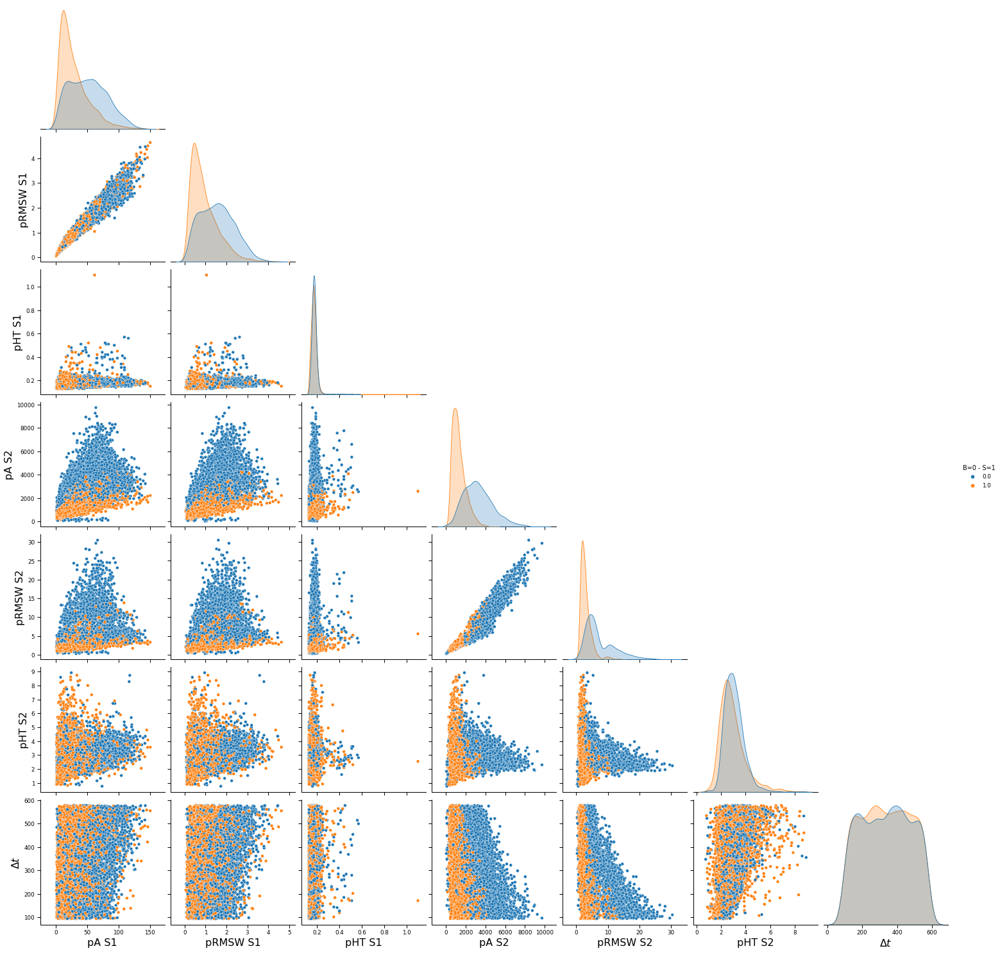

In [221]:
sns.set_context("paper", rc={"axes.labelsize":16})




sns.pairplot(df, hue='B=0 - S=1', height=3,
                 x_vars=[keys[0],keys[5], keys[2], keys[7], keys[12], keys[9], keys[16]],
                 y_vars=[keys[0],keys[5], keys[2], keys[7], keys[12], keys[9], keys[16]],
                 corner=True,
                 kind="scatter",
                diag_kind = 'auto')

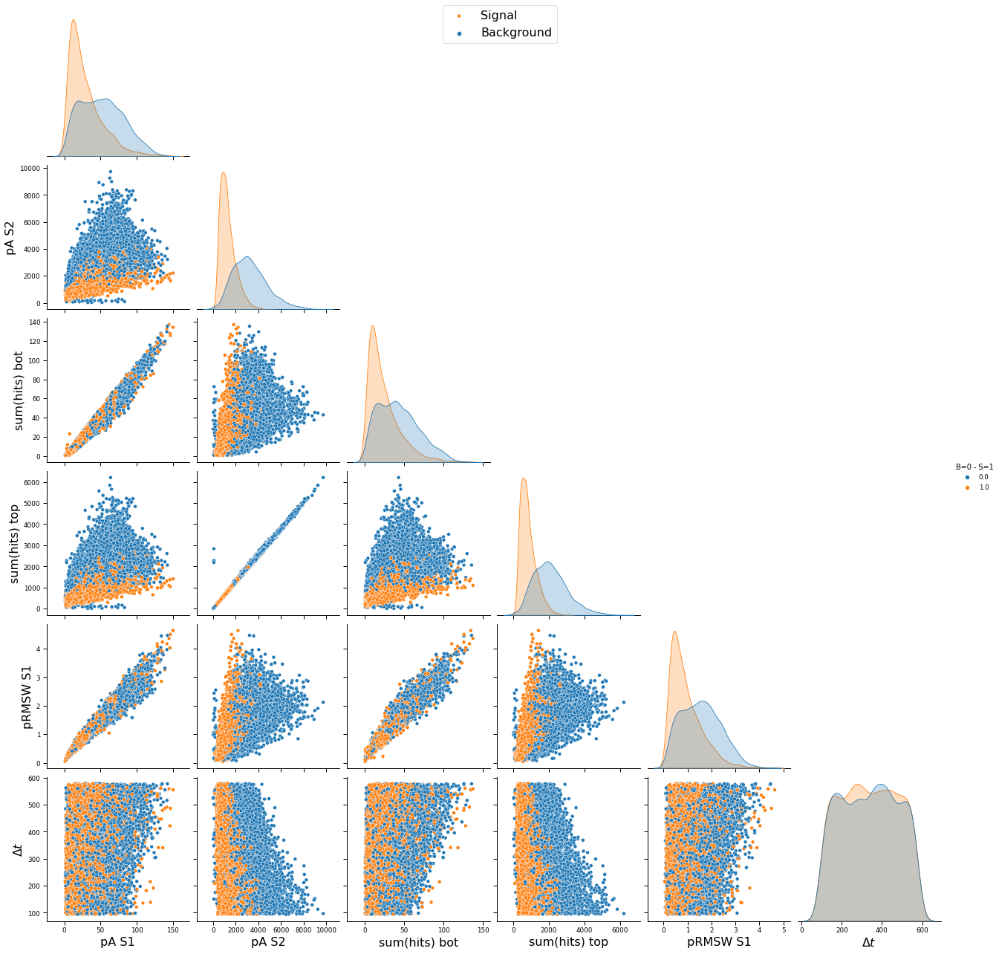

In [17]:

sns.set_context("paper", rc={"axes.labelsize":16})




g = sns.pairplot(df, hue='B=0 - S=1', height=3,
                 x_vars=[keys[0],keys[7], keys[14], keys[15], keys[5], keys[16]],
                 y_vars=[keys[0],keys[7], keys[14], keys[15], keys[5], keys[16]],
                 corner=True,
                 kind="scatter",
                diag_kind = 'auto')
fig = g.fig
fig.legend(['Signal', 'Background'], loc='upper center', fontsize=16)
# fig.savefig("correlations.pdf", format="pdf", bbox_inches="tight")



# sns.pairplot._add_axis_labels()
# g.map_lower(sns.kdeplot, levels=2, color="0.8")

# log_columns = [lst[0]]

# for ax in g.axes.flat:
#     if ax.get_xlabel() in log_columns:
#         ax.set(xscale="log")
        
        
# g = sns.pairplot(df, hue="SM=0 - NP=1", height=3,
#                  x_vars=[lst[0],lst[3],lst[6],lst[9],lst[11]],
#                  y_vars=[lst[0],lst[3],lst[6],lst[9],lst[11]])

# log_columns = [lst[0],lst[3],lst[6],lst[9],lst[11]]

# for ax in g.axes.flat:
#     if ax.get_xlabel() in log_columns:
#         ax.set(xscale="log")

## CLASSIFIERS

### XGBoost

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68665	validation_1-logloss:0.68672
[1]	validation_0-logloss:0.68035	validation_1-logloss:0.68046
[2]	validation_0-logloss:0.67414	validation_1-logloss:0.67429
[3]	validation_0-logloss:0.66810	validation_1-logloss:0.66831
[4]	validation_0-logloss:0.66218	validation_1-logloss:0.66242
[5]	validation_0-logloss:0.65624	validation_1-logloss:0.65656
[6]	validation_0-logloss:0.65053	validation_1-logloss:0.65091
[7]	validation_0-logloss:0.64478	validation_1-logloss:0.64524
[8]	validation_0-logloss:0.63924	validation_1-logloss:0.63973
[9]	validation_0-logloss:0.63373	validation_1-logloss:0.63426
[10]	validation_0-logloss:0.62840	validation_1-logloss:0.62900
[11]	validation_0-logloss:0.62305	validation_1-logloss:0.62373
[12]	validation_0-logloss:0.61791	validation_1-logloss:0.61866
[13]	validation_0-logloss:0.61275	validation_1-logloss:0.61352
[14]	validation_0-logloss:0.60777	validation_1-logloss:0.60859
[15]	validation_0-logloss:0.60276	validation_1-logloss:0.60366
[1

[130]	validation_0-logloss:0.31596	validation_1-logloss:0.32067
[131]	validation_0-logloss:0.31470	validation_1-logloss:0.31942
[132]	validation_0-logloss:0.31356	validation_1-logloss:0.31832
[133]	validation_0-logloss:0.31238	validation_1-logloss:0.31723
[134]	validation_0-logloss:0.31121	validation_1-logloss:0.31608
[135]	validation_0-logloss:0.30998	validation_1-logloss:0.31487
[136]	validation_0-logloss:0.30878	validation_1-logloss:0.31373
[137]	validation_0-logloss:0.30765	validation_1-logloss:0.31264
[138]	validation_0-logloss:0.30653	validation_1-logloss:0.31160
[139]	validation_0-logloss:0.30538	validation_1-logloss:0.31047
[140]	validation_0-logloss:0.30426	validation_1-logloss:0.30942
[141]	validation_0-logloss:0.30316	validation_1-logloss:0.30829
[142]	validation_0-logloss:0.30208	validation_1-logloss:0.30726
[143]	validation_0-logloss:0.30097	validation_1-logloss:0.30622
[144]	validation_0-logloss:0.29988	validation_1-logloss:0.30515
[145]	validation_0-logloss:0.29877	valid

[259]	validation_0-logloss:0.22288	validation_1-logloss:0.23312
[260]	validation_0-logloss:0.22245	validation_1-logloss:0.23277
[261]	validation_0-logloss:0.22205	validation_1-logloss:0.23235
[262]	validation_0-logloss:0.22165	validation_1-logloss:0.23199
[263]	validation_0-logloss:0.22127	validation_1-logloss:0.23169
[264]	validation_0-logloss:0.22085	validation_1-logloss:0.23131
[265]	validation_0-logloss:0.22047	validation_1-logloss:0.23100
[266]	validation_0-logloss:0.22010	validation_1-logloss:0.23061
[267]	validation_0-logloss:0.21975	validation_1-logloss:0.23028
[268]	validation_0-logloss:0.21938	validation_1-logloss:0.22995
[269]	validation_0-logloss:0.21899	validation_1-logloss:0.22959
[270]	validation_0-logloss:0.21863	validation_1-logloss:0.22927
[271]	validation_0-logloss:0.21823	validation_1-logloss:0.22893
[272]	validation_0-logloss:0.21788	validation_1-logloss:0.22858
[273]	validation_0-logloss:0.21750	validation_1-logloss:0.22826
[274]	validation_0-logloss:0.21713	valid

[388]	validation_0-logloss:0.18914	validation_1-logloss:0.20401
[389]	validation_0-logloss:0.18898	validation_1-logloss:0.20387
[390]	validation_0-logloss:0.18879	validation_1-logloss:0.20372
[391]	validation_0-logloss:0.18862	validation_1-logloss:0.20358
[392]	validation_0-logloss:0.18844	validation_1-logloss:0.20343
[393]	validation_0-logloss:0.18827	validation_1-logloss:0.20329
[394]	validation_0-logloss:0.18810	validation_1-logloss:0.20314
[395]	validation_0-logloss:0.18792	validation_1-logloss:0.20300
[396]	validation_0-logloss:0.18774	validation_1-logloss:0.20285
[397]	validation_0-logloss:0.18755	validation_1-logloss:0.20272
[398]	validation_0-logloss:0.18739	validation_1-logloss:0.20259
[399]	validation_0-logloss:0.18726	validation_1-logloss:0.20249
[400]	validation_0-logloss:0.18709	validation_1-logloss:0.20235
[401]	validation_0-logloss:0.18698	validation_1-logloss:0.20225
[402]	validation_0-logloss:0.18684	validation_1-logloss:0.20215
[403]	validation_0-logloss:0.18668	valid

[517]	validation_0-logloss:0.17258	validation_1-logloss:0.19170
[518]	validation_0-logloss:0.17247	validation_1-logloss:0.19163
[519]	validation_0-logloss:0.17240	validation_1-logloss:0.19158
[520]	validation_0-logloss:0.17232	validation_1-logloss:0.19153
[521]	validation_0-logloss:0.17224	validation_1-logloss:0.19147
[522]	validation_0-logloss:0.17214	validation_1-logloss:0.19142
[523]	validation_0-logloss:0.17206	validation_1-logloss:0.19136
[524]	validation_0-logloss:0.17197	validation_1-logloss:0.19131
[525]	validation_0-logloss:0.17188	validation_1-logloss:0.19126
[526]	validation_0-logloss:0.17178	validation_1-logloss:0.19118
[527]	validation_0-logloss:0.17168	validation_1-logloss:0.19112
[528]	validation_0-logloss:0.17160	validation_1-logloss:0.19106
[529]	validation_0-logloss:0.17153	validation_1-logloss:0.19101
[530]	validation_0-logloss:0.17145	validation_1-logloss:0.19096
[531]	validation_0-logloss:0.17138	validation_1-logloss:0.19092
[532]	validation_0-logloss:0.17129	valid

[646]	validation_0-logloss:0.16315	validation_1-logloss:0.18590
[647]	validation_0-logloss:0.16311	validation_1-logloss:0.18588
[648]	validation_0-logloss:0.16304	validation_1-logloss:0.18585
[649]	validation_0-logloss:0.16298	validation_1-logloss:0.18581
[650]	validation_0-logloss:0.16292	validation_1-logloss:0.18578
[651]	validation_0-logloss:0.16287	validation_1-logloss:0.18575
[652]	validation_0-logloss:0.16281	validation_1-logloss:0.18571
[653]	validation_0-logloss:0.16276	validation_1-logloss:0.18568
[654]	validation_0-logloss:0.16270	validation_1-logloss:0.18565
[655]	validation_0-logloss:0.16266	validation_1-logloss:0.18564
[656]	validation_0-logloss:0.16260	validation_1-logloss:0.18560
[657]	validation_0-logloss:0.16253	validation_1-logloss:0.18556
[658]	validation_0-logloss:0.16249	validation_1-logloss:0.18554
[659]	validation_0-logloss:0.16242	validation_1-logloss:0.18552
[660]	validation_0-logloss:0.16237	validation_1-logloss:0.18549
[661]	validation_0-logloss:0.16231	valid

[775]	validation_0-logloss:0.15688	validation_1-logloss:0.18267
[776]	validation_0-logloss:0.15683	validation_1-logloss:0.18265
[777]	validation_0-logloss:0.15679	validation_1-logloss:0.18263
[778]	validation_0-logloss:0.15676	validation_1-logloss:0.18261
[779]	validation_0-logloss:0.15671	validation_1-logloss:0.18259
[780]	validation_0-logloss:0.15667	validation_1-logloss:0.18257
[781]	validation_0-logloss:0.15662	validation_1-logloss:0.18254
[782]	validation_0-logloss:0.15659	validation_1-logloss:0.18252
[783]	validation_0-logloss:0.15654	validation_1-logloss:0.18250
[784]	validation_0-logloss:0.15650	validation_1-logloss:0.18250
[785]	validation_0-logloss:0.15645	validation_1-logloss:0.18247
[786]	validation_0-logloss:0.15641	validation_1-logloss:0.18245
[787]	validation_0-logloss:0.15637	validation_1-logloss:0.18243
[788]	validation_0-logloss:0.15634	validation_1-logloss:0.18242
[789]	validation_0-logloss:0.15629	validation_1-logloss:0.18240
[790]	validation_0-logloss:0.15626	valid

[904]	validation_0-logloss:0.15234	validation_1-logloss:0.18102
[905]	validation_0-logloss:0.15230	validation_1-logloss:0.18100
[906]	validation_0-logloss:0.15227	validation_1-logloss:0.18099
[907]	validation_0-logloss:0.15223	validation_1-logloss:0.18098
[908]	validation_0-logloss:0.15221	validation_1-logloss:0.18097
[909]	validation_0-logloss:0.15218	validation_1-logloss:0.18096
[910]	validation_0-logloss:0.15216	validation_1-logloss:0.18096
[911]	validation_0-logloss:0.15212	validation_1-logloss:0.18094
[912]	validation_0-logloss:0.15210	validation_1-logloss:0.18093
[913]	validation_0-logloss:0.15207	validation_1-logloss:0.18091
[914]	validation_0-logloss:0.15204	validation_1-logloss:0.18093
[915]	validation_0-logloss:0.15202	validation_1-logloss:0.18091
[916]	validation_0-logloss:0.15200	validation_1-logloss:0.18090
[917]	validation_0-logloss:0.15197	validation_1-logloss:0.18089
[918]	validation_0-logloss:0.15194	validation_1-logloss:0.18088
[919]	validation_0-logloss:0.15190	valid

[1032]	validation_0-logloss:0.14887	validation_1-logloss:0.18005
[1033]	validation_0-logloss:0.14885	validation_1-logloss:0.18005
[1034]	validation_0-logloss:0.14881	validation_1-logloss:0.18005
[1035]	validation_0-logloss:0.14879	validation_1-logloss:0.18004
[1036]	validation_0-logloss:0.14877	validation_1-logloss:0.18004
[1037]	validation_0-logloss:0.14875	validation_1-logloss:0.18002
[1038]	validation_0-logloss:0.14873	validation_1-logloss:0.18001
[1039]	validation_0-logloss:0.14869	validation_1-logloss:0.18000
[1040]	validation_0-logloss:0.14867	validation_1-logloss:0.17999
[1041]	validation_0-logloss:0.14865	validation_1-logloss:0.17998
[1042]	validation_0-logloss:0.14863	validation_1-logloss:0.17998
[1043]	validation_0-logloss:0.14862	validation_1-logloss:0.17998
[1044]	validation_0-logloss:0.14860	validation_1-logloss:0.17996
[1045]	validation_0-logloss:0.14857	validation_1-logloss:0.17995
[1046]	validation_0-logloss:0.14854	validation_1-logloss:0.17994
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.14583	validation_1-logloss:0.17945
[1160]	validation_0-logloss:0.14581	validation_1-logloss:0.17947
[1161]	validation_0-logloss:0.14578	validation_1-logloss:0.17947
[1162]	validation_0-logloss:0.14576	validation_1-logloss:0.17945
[1163]	validation_0-logloss:0.14574	validation_1-logloss:0.17944
[1164]	validation_0-logloss:0.14571	validation_1-logloss:0.17943
[1165]	validation_0-logloss:0.14570	validation_1-logloss:0.17942
[1166]	validation_0-logloss:0.14567	validation_1-logloss:0.17941
[1167]	validation_0-logloss:0.14566	validation_1-logloss:0.17941
[1168]	validation_0-logloss:0.14563	validation_1-logloss:0.17940
[1169]	validation_0-logloss:0.14561	validation_1-logloss:0.17939
[1170]	validation_0-logloss:0.14558	validation_1-logloss:0.17939
[1171]	validation_0-logloss:0.14557	validation_1-logloss:0.17938
[1172]	validation_0-logloss:0.14555	validation_1-logloss:0.17937
[1173]	validation_0-logloss:0.14552	validation_1-logloss:0.17938
[1174]	validation_0-loglo

[1286]	validation_0-logloss:0.14305	validation_1-logloss:0.17914
[1287]	validation_0-logloss:0.14303	validation_1-logloss:0.17914
[1288]	validation_0-logloss:0.14301	validation_1-logloss:0.17915
[1289]	validation_0-logloss:0.14297	validation_1-logloss:0.17914
[1290]	validation_0-logloss:0.14295	validation_1-logloss:0.17913
[1291]	validation_0-logloss:0.14294	validation_1-logloss:0.17913
[1292]	validation_0-logloss:0.14292	validation_1-logloss:0.17913
[1293]	validation_0-logloss:0.14291	validation_1-logloss:0.17913
[1294]	validation_0-logloss:0.14288	validation_1-logloss:0.17913
[1295]	validation_0-logloss:0.14285	validation_1-logloss:0.17912
[1296]	validation_0-logloss:0.14283	validation_1-logloss:0.17912
[1297]	validation_0-logloss:0.14281	validation_1-logloss:0.17911
[1298]	validation_0-logloss:0.14279	validation_1-logloss:0.17910
[1299]	validation_0-logloss:0.14276	validation_1-logloss:0.17911
[1300]	validation_0-logloss:0.14273	validation_1-logloss:0.17911
[1301]	validation_0-loglo

[1413]	validation_0-logloss:0.14031	validation_1-logloss:0.17895
[1414]	validation_0-logloss:0.14028	validation_1-logloss:0.17895
[1415]	validation_0-logloss:0.14027	validation_1-logloss:0.17894
[1416]	validation_0-logloss:0.14024	validation_1-logloss:0.17894
[1417]	validation_0-logloss:0.14023	validation_1-logloss:0.17894
[1418]	validation_0-logloss:0.14020	validation_1-logloss:0.17893
[1419]	validation_0-logloss:0.14017	validation_1-logloss:0.17894
[1420]	validation_0-logloss:0.14016	validation_1-logloss:0.17894
[1421]	validation_0-logloss:0.14015	validation_1-logloss:0.17894
[1422]	validation_0-logloss:0.14013	validation_1-logloss:0.17894
[1423]	validation_0-logloss:0.14011	validation_1-logloss:0.17893
[1424]	validation_0-logloss:0.14008	validation_1-logloss:0.17893
[1425]	validation_0-logloss:0.14007	validation_1-logloss:0.17893
[1426]	validation_0-logloss:0.14005	validation_1-logloss:0.17893
[1427]	validation_0-logloss:0.14002	validation_1-logloss:0.17893
[1428]	validation_0-loglo

[1540]	validation_0-logloss:0.13782	validation_1-logloss:0.17883
[1541]	validation_0-logloss:0.13782	validation_1-logloss:0.17883
[1542]	validation_0-logloss:0.13779	validation_1-logloss:0.17883
[1543]	validation_0-logloss:0.13776	validation_1-logloss:0.17882
[1544]	validation_0-logloss:0.13774	validation_1-logloss:0.17881
[1545]	validation_0-logloss:0.13773	validation_1-logloss:0.17882
[1546]	validation_0-logloss:0.13770	validation_1-logloss:0.17882
[1547]	validation_0-logloss:0.13767	validation_1-logloss:0.17881
[1548]	validation_0-logloss:0.13765	validation_1-logloss:0.17881
[1549]	validation_0-logloss:0.13764	validation_1-logloss:0.17880
[1550]	validation_0-logloss:0.13762	validation_1-logloss:0.17880
[1551]	validation_0-logloss:0.13759	validation_1-logloss:0.17881
[1552]	validation_0-logloss:0.13758	validation_1-logloss:0.17881
[1553]	validation_0-logloss:0.13757	validation_1-logloss:0.17881
[1554]	validation_0-logloss:0.13755	validation_1-logloss:0.17880
[1555]	validation_0-loglo

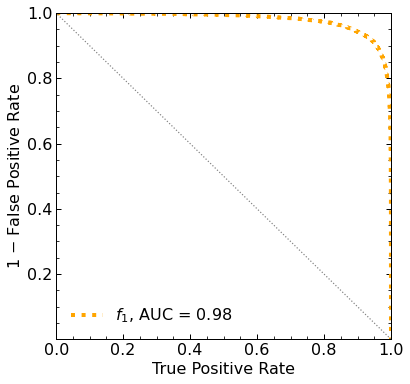

Classification score:


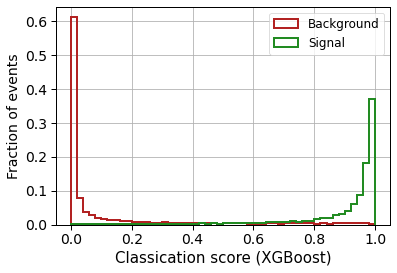


 ROC-AUC =  0.9795118086628941


In [18]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg)

In [14]:
np.savetxt('rocs/roc_17feats.txt', [tpr_mon_xg, fpr_mon_xg])

print('\n ROC-AUC = ', roc_auc_xg)


 ROC-AUC =  0.9795118086628941


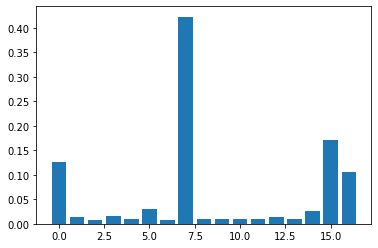

In [15]:
plt.bar(range(len(classifier.feature_importances_)), classifier.feature_importances_)
plt.show()

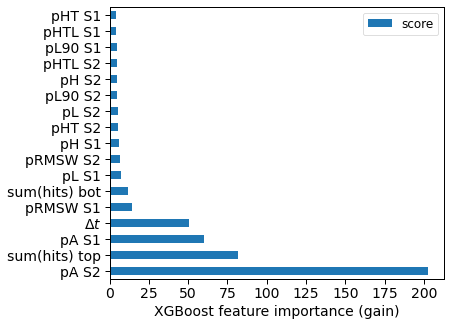

In [23]:
feature_important = classifier.get_booster().get_score(importance_type='gain')
keys = list(feature_important.keys())
keys = ['pA_S1','pH_S1','pHT_S1','pL_S1','pL90_S1','pRMSW_S1','pHTL_S1','pA_S2','pH_S2','pHT_S2','pL_S2','pL90_S2','pRMSW_S2','pHTL_S2','pbot', 'ptop','pdiffT']
keys = ['pA S1','pH S1','pHT S1','pL S1','pL90 S1','pRMSW S1','pHTL S1',
        'pA S2','pH S2','pHT S2','pL S2','pL90 S2','pRMSW S2','pHTL S2',
        'sum(hits) bot', 'sum(hits) top','$\Delta t$']
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(40, columns="score").plot(kind='barh', figsize = (6,5)) ## plot top 40 features
plt.xlabel('XGBoost feature importance (gain)', fontsize = 14)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(loc="upper right", fontsize=12)
plt.savefig('feat_importance.pdf',bbox_inches='tight')
plt.show()

In [17]:
keys

['pA_S1',
 'pH_S1',
 'pHT_S1',
 'pL_S1',
 'pL90_S1',
 'pRMSW_S1',
 'pHTL_S1',
 'pA_S2',
 'pH_S2',
 'pHT_S2',
 'pL_S2',
 'pL90_S2',
 'pRMSW_S2',
 'pHTL_S2',
 'pbot',
 'ptop',
 'pdiffT']

In [18]:

from sklearn.inspection import permutation_importance
perm_importance = permutation_importance(classifier, X_mon_test, y_mon_test)


In [19]:


sorted_idx = classifier.feature_importances_.argsort()

sorted_idx_keys = []
for i in sorted_idx:
    sorted_idx_keys.append(keys[i])
    
sorted_idx_keys

['pHT_S1',
 'pHTL_S1',
 'pL90_S1',
 'pHTL_S2',
 'pH_S2',
 'pL90_S2',
 'pL_S2',
 'pHT_S2',
 'pH_S1',
 'pRMSW_S2',
 'pL_S1',
 'pbot',
 'pRMSW_S1',
 'pdiffT',
 'pA_S1',
 'ptop',
 'pA_S2']

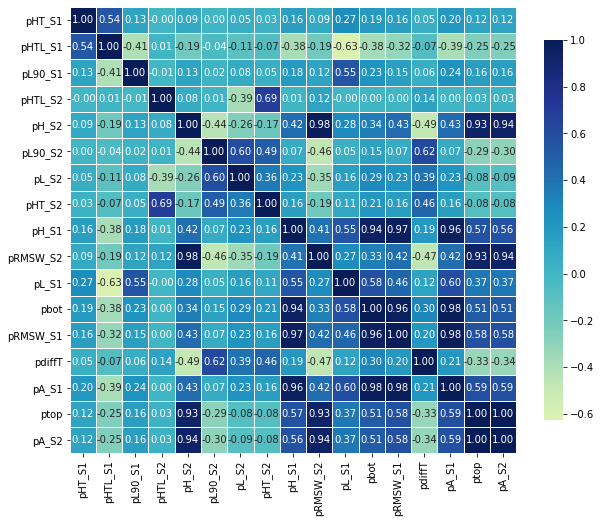

In [20]:
X = pd.DataFrame(X_mon_test, columns=keys)

def correlation_heatmap(train):
    correlations = train.corr()

    fig, ax = plt.subplots(figsize=(10,10))
    sns.heatmap(correlations, vmax=1.0, center=0, fmt='.2f', cmap="YlGnBu",
                square=True, linewidths=.5, annot=True, cbar_kws={"shrink": .70}
                )
    plt.show();
    
correlation_heatmap(X[sorted_idx_keys])


In [21]:
MIN_EVS = 5 # min number of background events that we allow per bin
range_dat = [[0,1]] # range of our data (between 0 and 1 if its the ML output)

bins_to_test=range(1,500) # number of bins we are testing to see if condition holds

# FIND THE NUMBER OF BINS:
num_bins = max_num_bins(pred_XG_SM, B_expected, range_dat, MIN_EVS, bins_to_test)

print('\n FOR BIN LIKELIHOOD WE ARE SETTING:')
print('min number of Background events allowed per bin: ', MIN_EVS)
print('number of bins we are going to use: ', num_bins)
print('range of our data: ', range_dat)

At least 5 B events per bin, range = [[0, 1]]:
# bins:  16 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
number of bins we are going to use:  16
range of our data:  [[0, 1]]


In [22]:
num_bins = 10


 FINAL RESULT:

[0.21025320260742758, 0.21025320260742758, 0.412944854147792, 0.6088146587409894, 1.3346272507482309, 2.5841976353488088, 4.823787786167049, 8.417297972892756, 13.792761905658603, 21.922116119097403]


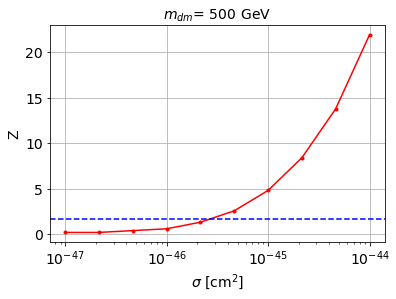


cross_BL_164:  2.5989268977238405e-46


In [23]:

# OPTION 0

store_Z_asimov = []


for s_it in range(len(S_expected)):

    Z_asimov = Z_BL_asimov(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_bins, range_dat, MIN_EVS, linear_bins=True) 
    store_Z_asimov.append( Z_asimov )
    
    
print('\n FINAL RESULT:\n')
print(store_Z_asimov)

# plot
plt.plot(cross_factor*1e-45, store_Z_asimov, '.-', c='red')

plt.axhline(y=1.64, c='blue', linestyle='--')
plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
plt.xscale('log')
plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
plt.ylabel(r'Z', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.show()


# interpolate
f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_asimov), kind='linear')
# f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_asimov)[:,0] + np.array(store_Z_asimov)[:,1], kind='linear')
# f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_asimov)[:,0] - np.array(store_Z_asimov)[:,1], kind='linear')

# compute the cross section with Z=1.64
cross_BL_164 = 10**solvecross(f_Z, 1.64)
# cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
# cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)

print('\ncross_BL_164: ', cross_BL_164)
# print('cross_BL_164_up: ', cross_BL_164_up)
# print('cross_BL_164_down: ', cross_BL_164_down)

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0765


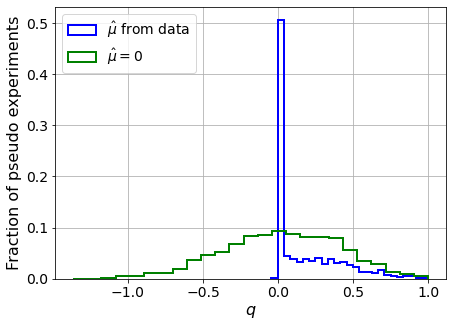

muhat mean:  0.4882512181916622
Z_bins:  0.17707214522387532
std Z_bins:  0.6365988898248718
Z_bins mu=0:  0.17487004296723344
std Z_bins mu=0:  1.1260721231143969

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.078


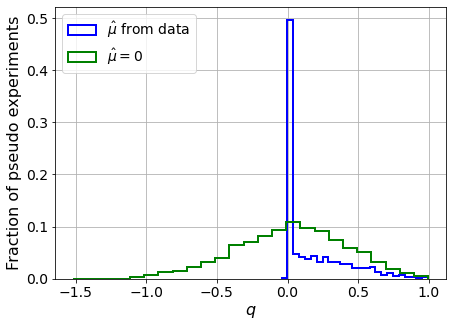

muhat mean:  0.47226138828633407
Z_bins:  0.20463248743817938
std Z_bins:  0.5492260018137363
Z_bins mu=0:  0.20485173403762033
std Z_bins mu=0:  0.9614392729133409

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.068


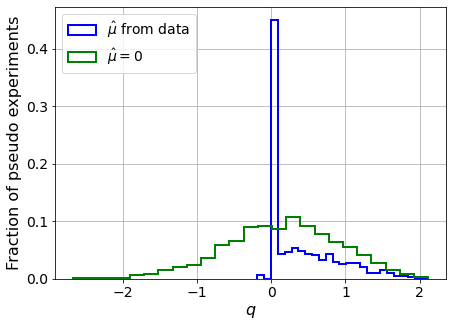

muhat mean:  0.42180793991416315
Z_bins:  0.4276237987251444
std Z_bins:  0.5570075376515765
Z_bins mu=0:  0.4276237987251444
std Z_bins mu=0:  0.892501081941919

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0735


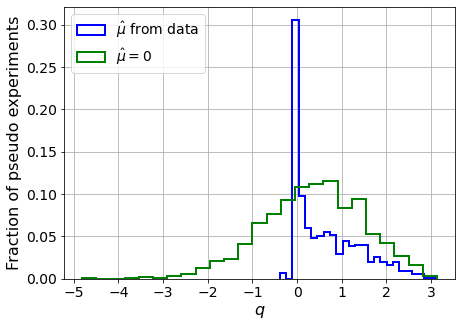

muhat mean:  0.35936319481921214
Z_bins:  0.621435902341463
std Z_bins:  0.5910913697618883
Z_bins mu=0:  0.621435902341463
std Z_bins mu=0:  0.902255836405086

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0785


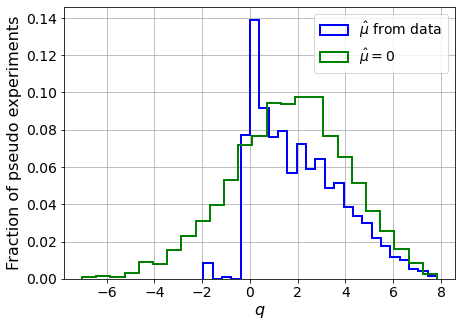

muhat mean:  0.23369506239826374
Z_bins:  1.3171265358985278
std Z_bins:  0.6911335586750937
Z_bins mu=0:  1.3171265358985278
std Z_bins mu=0:  0.9205429405141439

--------

B_expected:  643
S_expected:  15

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.071


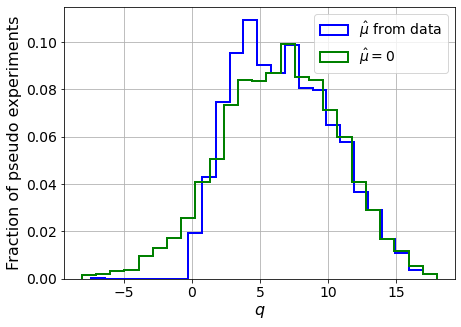

muhat mean:  0.11256727664155006
Z_bins:  2.5620848174724844
std Z_bins:  0.7160295003520396
Z_bins mu=0:  2.5620848174724844
std Z_bins mu=0:  0.8392390905218231

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0745


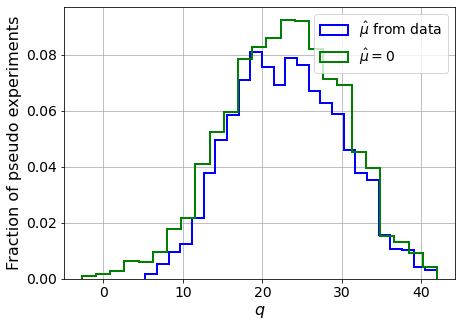

muhat mean:  0.04710967044840628
Z_bins:  4.792968823727955
std Z_bins:  0.7098721878522243
Z_bins mu=0:  4.80039675991767
std Z_bins mu=0:  0.7784874085741876

--------

B_expected:  643
S_expected:  72

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0825


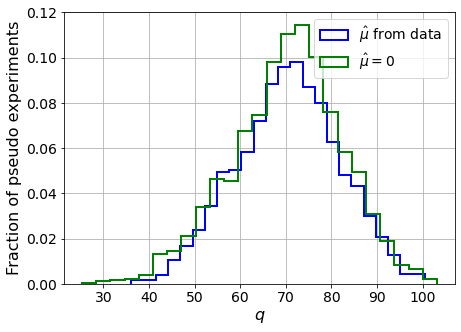

muhat mean:  0.015613079019073575
Z_bins:  8.41280652255889
std Z_bins:  0.6743614777821576
Z_bins mu=0:  8.423547916366731
std Z_bins mu=0:  0.7150566405885567

--------

B_expected:  643
S_expected:  154

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0765


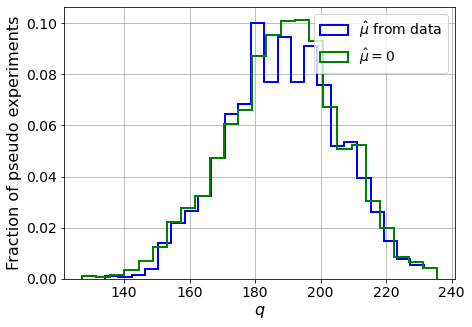

muhat mean:  0.010259880887926369
Z_bins:  13.73375448351018
std Z_bins:  0.6196230809213426
Z_bins mu=0:  13.767032777800942
std Z_bins mu=0:  0.6359990776148847

--------

B_expected:  643
S_expected:  332

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0735


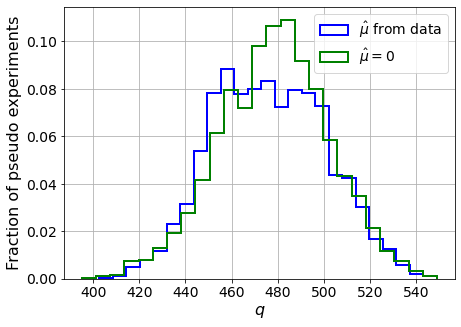

muhat mean:  0.013707501349163518
Z_bins:  21.804353805809864
std Z_bins:  0.5630422052824986
Z_bins mu=0:  21.886157105834357
std Z_bins mu=0:  0.5468200180342276

--------


 FINAL RESULT:

[[0.17707214522387532, 0.6365988898248718, 0.4882512181916622, 0.17487004296723344, 1.1260721231143969], [0.20463248743817938, 0.5492260018137363, 0.47226138828633407, 0.20485173403762033, 0.9614392729133409], [0.4276237987251444, 0.5570075376515765, 0.42180793991416315, 0.4276237987251444, 0.892501081941919], [0.621435902341463, 0.5910913697618883, 0.35936319481921214, 0.621435902341463, 0.902255836405086], [1.3171265358985278, 0.6911335586750937, 0.23369506239826374, 1.3171265358985278, 0.9205429405141439], [2.5620848174724844, 0.7160295003520396, 0.11256727664155006, 2.5620848174724844, 0.8392390905218231], [4.792968823727955, 0.7098721878522243, 0.04710967044840628, 4.80039675991767, 0.7784874085741876], [8.41280652255889, 0.6743614777821576, 0.015613079019073575, 8.423547916366731, 0.71505664

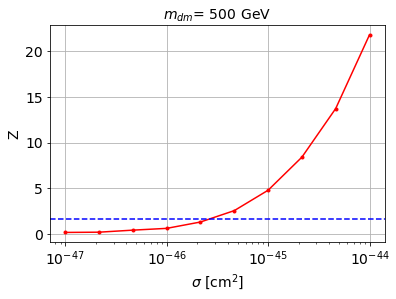


cross_BL_164:  2.6289456154511665e-46
cross_BL_164_up:  1.5103193428346214e-46
cross_BL_164_down:  4.077277553978592e-46


In [24]:

# OPTION 1 (mu_hat with a grid, fast)
store_Z_BL = []


for s_it in range(len(S_expected)):
    
    print('B_expected: ', B_expected)
    print('S_expected: ', S_expected[s_it])
    print('')

    Z_BL = BL_test_fast(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 
    
    store_Z_BL.append( list(Z_BL) )
    
    print('muhat mean: ', Z_BL[2])
    print('Z_bins: ', Z_BL[0])
    print('std Z_bins: ', Z_BL[1])
    print('Z_bins mu=0: ', Z_BL[3])
    print('std Z_bins mu=0: ', Z_BL[4])
    print('')
    print('--------\n')
    
    
    
print('\n FINAL RESULT:\n')
print(store_Z_BL)


# plot
plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red')

plt.axhline(y=1.64, c='blue', linestyle='--')
plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
plt.xscale('log')
plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
plt.ylabel(r'Z', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.show()


# interpolate
f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='linear')
f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='linear')
f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='linear')

# compute the cross section with Z=1.64
cross_BL_164 = 10**solvecross(f_Z, 1.64)
cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)

print('\ncross_BL_164: ', cross_BL_164)
print('cross_BL_164_up: ', cross_BL_164_up)
print('cross_BL_164_down: ', cross_BL_164_down)

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.081


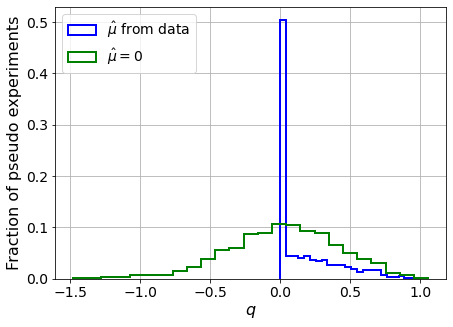

muhat mean:  0.22851523425982156
Z_bins:  0.19627904901627463
std Z_bins:  0.5778503552614483
Z_bins mu=0:  0.19542432456646006
std Z_bins mu=0:  1.014922707063862

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0745


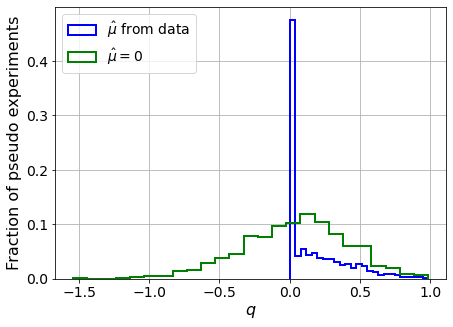

muhat mean:  0.12103196627333786
Z_bins:  0.2509175112773967
std Z_bins:  0.4303615474664002
Z_bins mu=0:  0.2509175112773967
std Z_bins mu=0:  0.7515800509756715

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0725


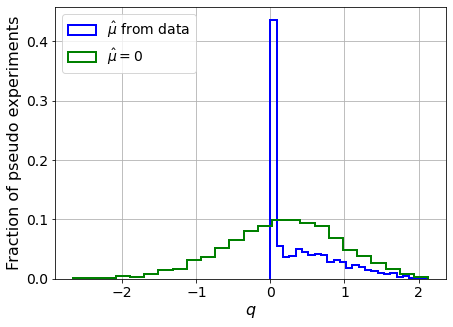

muhat mean:  0.026834085178513337
Z_bins:  0.4359414171267492
std Z_bins:  0.5480334020415604
Z_bins mu=0:  0.4359414171267492
std Z_bins mu=0:  0.8891923143006192

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0755


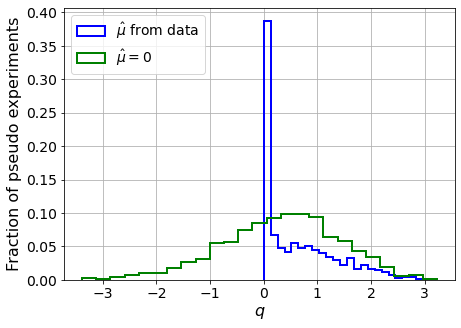

muhat mean:  0.05823642507681872
Z_bins:  0.6191651221755325
std Z_bins:  0.5649540831682303
Z_bins mu=0:  0.6191651221755325
std Z_bins mu=0:  0.8816879463433691

--------

B_expected:  643
S_expected:  7



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0865


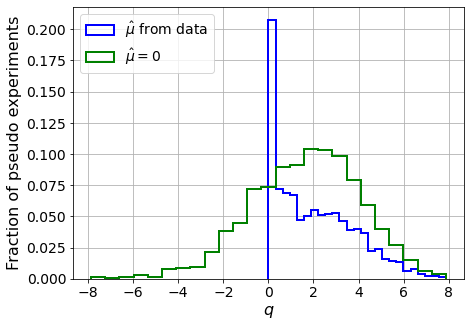

muhat mean:  0.02961179112075087
Z_bins:  1.346213978264676
std Z_bins:  0.6568785958193182
Z_bins mu=0:  1.346213978264676
std Z_bins mu=0:  0.8918528075924316

--------

B_expected:  643
S_expected:  15

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0735


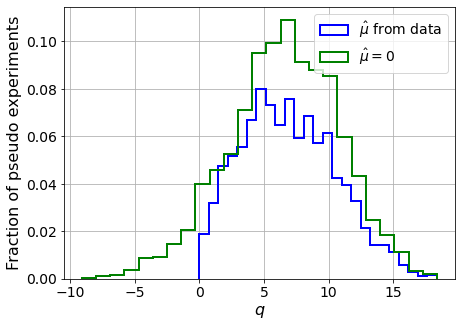

muhat mean:  0.00692526068618651
Z_bins:  2.582680312694348
std Z_bins:  0.7033586349542297
Z_bins mu=0:  2.582680312694348
std Z_bins mu=0:  0.8283286198259986

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0735


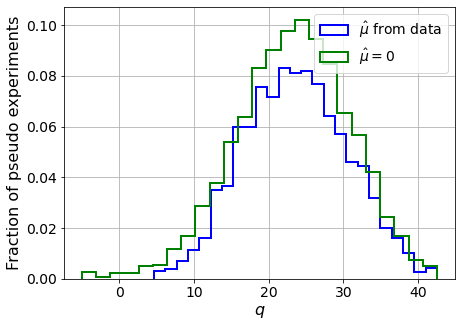

muhat mean:  -0.0023039214861191163
Z_bins:  4.848086807158442
std Z_bins:  0.7112113466876171
Z_bins mu=0:  4.848086807158442
std Z_bins mu=0:  0.7833475820480017

--------

B_expected:  643
S_expected:  72

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.069


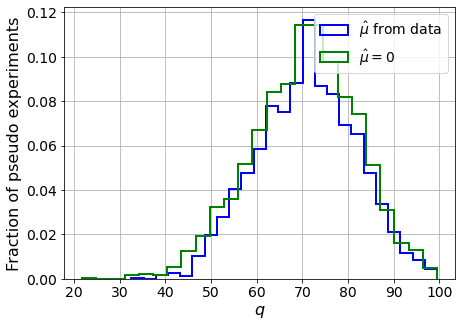

muhat mean:  0.00021280856690401138
Z_bins:  8.431107281888023
std Z_bins:  0.6408722895805683
Z_bins mu=0:  8.431107281888023
std Z_bins mu=0:  0.6799590382921982

--------

B_expected:  643
S_expected:  154

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0765


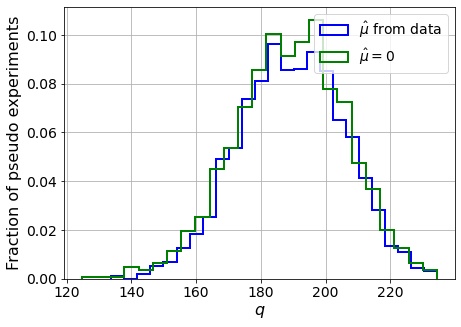

muhat mean:  0.0006634647976475696
Z_bins:  13.771001726443172
std Z_bins:  0.588612894281857
Z_bins mu=0:  13.771001726443172
std Z_bins mu=0:  0.6127544537589616

--------

B_expected:  643
S_expected:  332

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.075


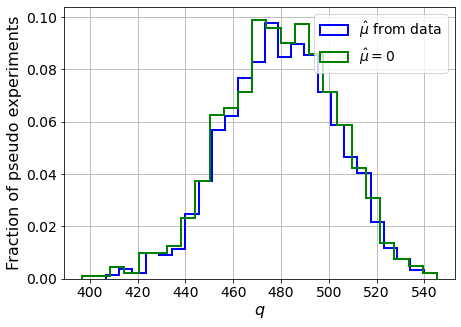

muhat mean:  -0.000123231789172859
Z_bins:  21.918051223991917
std Z_bins:  0.5229482819495112
Z_bins mu=0:  21.91692425704699
std Z_bins mu=0:  0.5373995038332611

--------


 FINAL RESULT:

[[0.19627904901627463, 0.5778503552614483, 0.22851523425982156, 0.19542432456646006, 1.014922707063862], [0.2509175112773967, 0.4303615474664002, 0.12103196627333786, 0.2509175112773967, 0.7515800509756715], [0.4359414171267492, 0.5480334020415604, 0.026834085178513337, 0.4359414171267492, 0.8891923143006192], [0.6191651221755325, 0.5649540831682303, 0.05823642507681872, 0.6191651221755325, 0.8816879463433691], [1.346213978264676, 0.6568785958193182, 0.02961179112075087, 1.346213978264676, 0.8918528075924316], [2.582680312694348, 0.7033586349542297, 0.00692526068618651, 2.582680312694348, 0.8283286198259986], [4.848086807158442, 0.7112113466876171, -0.0023039214861191163, 4.848086807158442, 0.7833475820480017], [8.431107281888023, 0.6408722895805683, 0.00021280856690401138, 8.431107281888023, 0.67

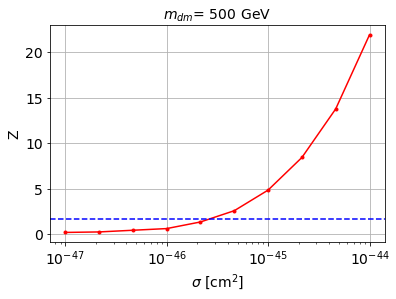


cross_BL_164:  2.5854358722901483e-46
cross_BL_164_up:  1.5330266422143247e-46
cross_BL_164_down:  3.977672383651411e-46


In [25]:
# OPTION 2 (mu_hat with more precision) (slower, not so bad for bin likelihood)
store_Z_BL = []


for s_it in range(len(S_expected)):
    
    print('B_expected: ', B_expected)
    print('S_expected: ', S_expected[s_it])
    print('')

    Z_BL = BL_test_fsolve(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 
    
    store_Z_BL.append( list(Z_BL) )
    
    print('muhat mean: ', Z_BL[2])
    print('Z_bins: ', Z_BL[0])
    print('std Z_bins: ', Z_BL[1])
    print('Z_bins mu=0: ', Z_BL[3])
    print('std Z_bins mu=0: ', Z_BL[4])
    print('')
    print('--------\n')
    
    
    
print('\n FINAL RESULT:\n')
print(store_Z_BL)


# plot
plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red')

plt.axhline(y=1.64, c='blue', linestyle='--')
plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
plt.xscale('log')
plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
plt.ylabel(r'Z', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.show()


# interpolate
f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='linear')
f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='linear')
f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='linear')

# compute the cross section with Z=1.64
cross_BL_164 = 10**solvecross(f_Z, 1.64)
cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)

print('\ncross_BL_164: ', cross_BL_164)
print('cross_BL_164_up: ', cross_BL_164_up)
print('cross_BL_164_down: ', cross_BL_164_down)

### DNN

lots of tests, the best is:

Dense layers: 1-4-8-16-32-64-128, 

Activation: LeakyReLu

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 144       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 8)                 0         
_________________________________________________________________
dropout (Dropout)            (None, 8)                 0         
_________________________________________________________________
dense_1 (Dense)              (None, 4)                 36        
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 4)                 0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 4)                 0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 5

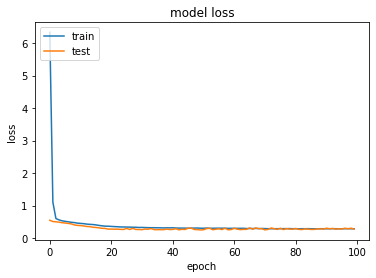

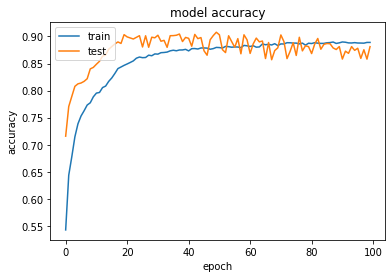

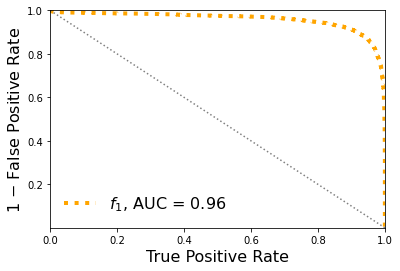

Classification score:


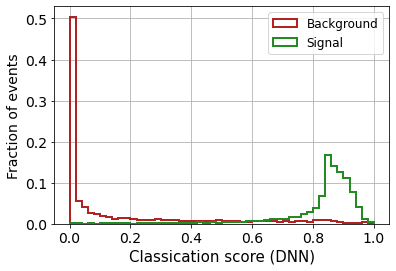


 ROC-AUC =  0.958453839411014


In [26]:

# define the keras model
model = Sequential()
model.add(Dense(8, input_shape=(X_mon_train.shape[1],)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(4))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

In [27]:
print('\n ROC-AUC = ', roc_auc_dnn)


 ROC-AUC =  0.958453839411014


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 16)                288       
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 16)                0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 4)                 68        
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 4)                 0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 4)                 0         
_________________________________________________________________
dense_5 (Dense)              (None, 1)                

319/319 [==============================] - 0s 529us/step - loss: 0.2661 - accuracy: 0.8937 - val_loss: 0.2250 - val_accuracy: 0.9117
Epoch 105/500
319/319 [==============================] - 0s 494us/step - loss: 0.2612 - accuracy: 0.8937 - val_loss: 0.2285 - val_accuracy: 0.9113
Epoch 106/500
319/319 [==============================] - 0s 520us/step - loss: 0.2594 - accuracy: 0.8980 - val_loss: 0.2367 - val_accuracy: 0.9013
Epoch 107/500
319/319 [==============================] - 0s 509us/step - loss: 0.2585 - accuracy: 0.8962 - val_loss: 0.2627 - val_accuracy: 0.8840
Epoch 108/500
319/319 [==============================] - 0s 513us/step - loss: 0.2673 - accuracy: 0.8909 - val_loss: 0.2323 - val_accuracy: 0.9051
Epoch 109/500
319/319 [==============================] - 0s 508us/step - loss: 0.2525 - accuracy: 0.8992 - val_loss: 0.2224 - val_accuracy: 0.9138
Epoch 110/500
319/319 [==============================] - 0s 513us/step - loss: 0.2629 - accuracy: 0.8938 - val_loss: 0.2305 - val_ac

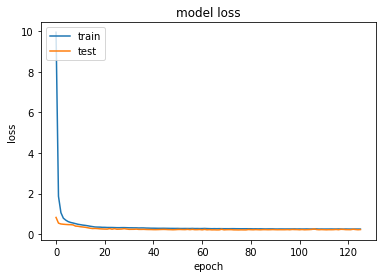

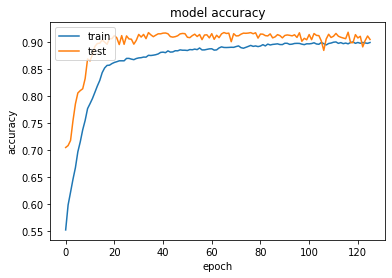

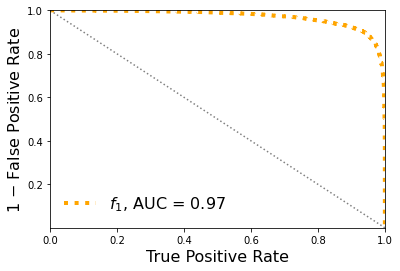

Classification score:


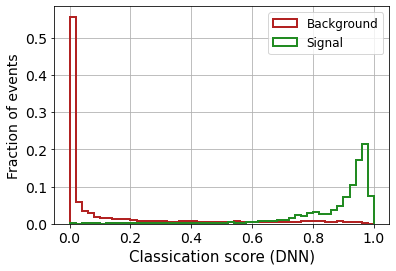


 ROC-AUC =  0.9708551493881983


In [28]:

# define the keras model
model = Sequential()
model.add(Dense(16, input_shape=(X_mon_train.shape[1],)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(4))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

In [29]:
print('\n ROC-AUC = ', roc_auc_dnn)


 ROC-AUC =  0.9708551493881983


Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 32)                576       
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 32)                0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 16)                528       
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 16)                0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_8 (Dense)              (None, 8)                

319/319 [==============================] - 0s 606us/step - loss: 0.2634 - accuracy: 0.8947 - val_loss: 0.2277 - val_accuracy: 0.9127
Epoch 44/500
319/319 [==============================] - 0s 601us/step - loss: 0.2676 - accuracy: 0.8940 - val_loss: 0.2115 - val_accuracy: 0.9182
Epoch 45/500
319/319 [==============================] - 0s 604us/step - loss: 0.2559 - accuracy: 0.8980 - val_loss: 0.2140 - val_accuracy: 0.9145
Epoch 46/500
319/319 [==============================] - 0s 606us/step - loss: 0.2536 - accuracy: 0.8998 - val_loss: 0.2310 - val_accuracy: 0.9092
Epoch 47/500
319/319 [==============================] - 0s 610us/step - loss: 0.2633 - accuracy: 0.8931 - val_loss: 0.2491 - val_accuracy: 0.8919
Epoch 48/500
319/319 [==============================] - 0s 608us/step - loss: 0.2607 - accuracy: 0.8975 - val_loss: 0.2230 - val_accuracy: 0.9073
Epoch 49/500
319/319 [==============================] - 0s 626us/step - loss: 0.2622 - accuracy: 0.8945 - val_loss: 0.2133 - val_accuracy

Epoch 155/500
319/319 [==============================] - 0s 600us/step - loss: 0.2330 - accuracy: 0.9107 - val_loss: 0.1899 - val_accuracy: 0.9227
Epoch 156/500
319/319 [==============================] - 0s 603us/step - loss: 0.2270 - accuracy: 0.9114 - val_loss: 0.2058 - val_accuracy: 0.9178
Epoch 157/500
319/319 [==============================] - 0s 613us/step - loss: 0.2436 - accuracy: 0.9040 - val_loss: 0.1927 - val_accuracy: 0.9213
Epoch 158/500
319/319 [==============================] - 0s 613us/step - loss: 0.2313 - accuracy: 0.9082 - val_loss: 0.1909 - val_accuracy: 0.9232
Epoch 159/500
319/319 [==============================] - 0s 612us/step - loss: 0.2256 - accuracy: 0.9143 - val_loss: 0.2017 - val_accuracy: 0.9221
Epoch 160/500
319/319 [==============================] - 0s 622us/step - loss: 0.2344 - accuracy: 0.9105 - val_loss: 0.1927 - val_accuracy: 0.9203
Epoch 161/500
319/319 [==============================] - 0s 612us/step - loss: 0.2315 - accuracy: 0.9115 - val_loss: 0

Epoch 211/500
319/319 [==============================] - 0s 610us/step - loss: 0.2149 - accuracy: 0.9159 - val_loss: 0.2040 - val_accuracy: 0.9192
Epoch 212/500
319/319 [==============================] - 0s 606us/step - loss: 0.2215 - accuracy: 0.9161 - val_loss: 0.1998 - val_accuracy: 0.9209
Epoch 213/500
319/319 [==============================] - 0s 602us/step - loss: 0.2200 - accuracy: 0.9166 - val_loss: 0.1995 - val_accuracy: 0.9213
Epoch 214/500
319/319 [==============================] - 0s 605us/step - loss: 0.2255 - accuracy: 0.9126 - val_loss: 0.2122 - val_accuracy: 0.9135
Epoch 215/500
319/319 [==============================] - 0s 629us/step - loss: 0.2194 - accuracy: 0.9143 - val_loss: 0.1918 - val_accuracy: 0.9239
Epoch 216/500
319/319 [==============================] - 0s 606us/step - loss: 0.2237 - accuracy: 0.9142 - val_loss: 0.1916 - val_accuracy: 0.9249
Epoch 217/500
319/319 [==============================] - 0s 629us/step - loss: 0.2223 - accuracy: 0.9165 - val_loss: 0

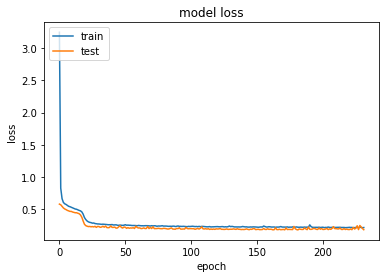

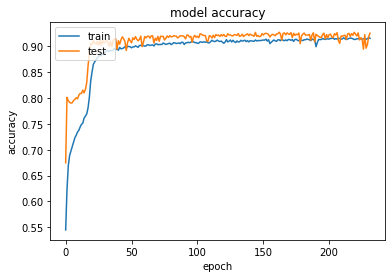

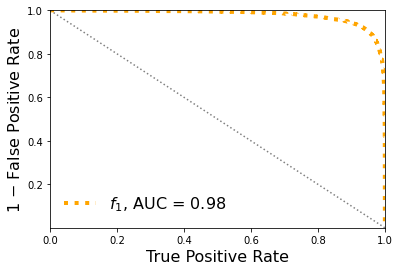

Classification score:


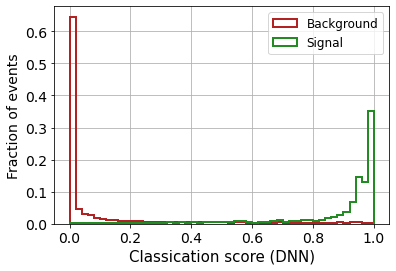


 ROC-AUC =  0.9785057916051795


In [30]:

# define the keras model
model = Sequential()
model.add(Dense(32, input_shape=(X_mon_train.shape[1],)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(16))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(8))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(4))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

In [31]:
print('\n ROC-AUC = ', roc_auc_dnn)


 ROC-AUC =  0.9785057916051795


Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_11 (Dense)             (None, 64)                1152      
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 64)                0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_12 (Dense)             (None, 32)                2080      
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 32)                0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_13 (Dense)             (None, 16)               

319/319 [==============================] - 0s 762us/step - loss: 0.2353 - accuracy: 0.9080 - val_loss: 0.1970 - val_accuracy: 0.9216
Epoch 97/500
319/319 [==============================] - 0s 755us/step - loss: 0.2317 - accuracy: 0.9113 - val_loss: 0.2082 - val_accuracy: 0.9105
Epoch 98/500
319/319 [==============================] - 0s 764us/step - loss: 0.2328 - accuracy: 0.9103 - val_loss: 0.2001 - val_accuracy: 0.9173
Epoch 99/500
319/319 [==============================] - 0s 759us/step - loss: 0.2345 - accuracy: 0.9064 - val_loss: 0.1951 - val_accuracy: 0.9234
Epoch 100/500
319/319 [==============================] - 0s 744us/step - loss: 0.2388 - accuracy: 0.9067 - val_loss: 0.1976 - val_accuracy: 0.9218
Epoch 101/500
319/319 [==============================] - 0s 742us/step - loss: 0.2343 - accuracy: 0.9082 - val_loss: 0.2074 - val_accuracy: 0.9181
Epoch 102/500
319/319 [==============================] - 0s 742us/step - loss: 0.2290 - accuracy: 0.9095 - val_loss: 0.1974 - val_accur

Epoch 152/500
319/319 [==============================] - 0s 740us/step - loss: 0.2227 - accuracy: 0.9152 - val_loss: 0.1936 - val_accuracy: 0.9248
Epoch 153/500
319/319 [==============================] - 0s 741us/step - loss: 0.2269 - accuracy: 0.9165 - val_loss: 0.2003 - val_accuracy: 0.9205
Epoch 154/500
319/319 [==============================] - 0s 734us/step - loss: 0.2261 - accuracy: 0.9136 - val_loss: 0.1897 - val_accuracy: 0.9202
Epoch 155/500
319/319 [==============================] - 0s 735us/step - loss: 0.2239 - accuracy: 0.9134 - val_loss: 0.1888 - val_accuracy: 0.9237
Epoch 156/500
319/319 [==============================] - 0s 737us/step - loss: 0.2282 - accuracy: 0.9096 - val_loss: 0.1999 - val_accuracy: 0.9216
Epoch 157/500
319/319 [==============================] - 0s 739us/step - loss: 0.2254 - accuracy: 0.9125 - val_loss: 0.1918 - val_accuracy: 0.9234
Epoch 158/500
319/319 [==============================] - 0s 738us/step - loss: 0.2264 - accuracy: 0.9125 - val_loss: 0

Epoch 208/500
319/319 [==============================] - 0s 742us/step - loss: 0.2283 - accuracy: 0.9108 - val_loss: 0.1859 - val_accuracy: 0.9270
Epoch 209/500
319/319 [==============================] - 0s 736us/step - loss: 0.2228 - accuracy: 0.9160 - val_loss: 0.1815 - val_accuracy: 0.9271
Epoch 210/500
319/319 [==============================] - 0s 741us/step - loss: 0.2175 - accuracy: 0.9184 - val_loss: 0.1937 - val_accuracy: 0.9243
Epoch 211/500
319/319 [==============================] - 0s 745us/step - loss: 0.2279 - accuracy: 0.9130 - val_loss: 0.1867 - val_accuracy: 0.9252
Epoch 212/500
319/319 [==============================] - 0s 739us/step - loss: 0.2285 - accuracy: 0.9126 - val_loss: 0.2129 - val_accuracy: 0.9138
Epoch 213/500
319/319 [==============================] - 0s 742us/step - loss: 0.2213 - accuracy: 0.9125 - val_loss: 0.1856 - val_accuracy: 0.9241
Epoch 214/500
319/319 [==============================] - 0s 739us/step - loss: 0.2222 - accuracy: 0.9139 - val_loss: 0

Epoch 264/500
319/319 [==============================] - 0s 733us/step - loss: 0.2219 - accuracy: 0.9123 - val_loss: 0.1841 - val_accuracy: 0.9268
Epoch 265/500
319/319 [==============================] - 0s 744us/step - loss: 0.2186 - accuracy: 0.9140 - val_loss: 0.1825 - val_accuracy: 0.9277
Epoch 266/500
319/319 [==============================] - 0s 745us/step - loss: 0.2166 - accuracy: 0.9147 - val_loss: 0.1841 - val_accuracy: 0.9256
Epoch 267/500
319/319 [==============================] - 0s 738us/step - loss: 0.2120 - accuracy: 0.9195 - val_loss: 0.1901 - val_accuracy: 0.9234
Epoch 268/500
319/319 [==============================] - 0s 740us/step - loss: 0.2189 - accuracy: 0.9157 - val_loss: 0.1822 - val_accuracy: 0.9274
Epoch 269/500
319/319 [==============================] - 0s 740us/step - loss: 0.2186 - accuracy: 0.9157 - val_loss: 0.1967 - val_accuracy: 0.9212
Epoch 270/500
319/319 [==============================] - 0s 735us/step - loss: 0.2199 - accuracy: 0.9165 - val_loss: 0

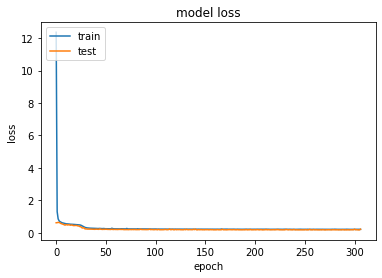

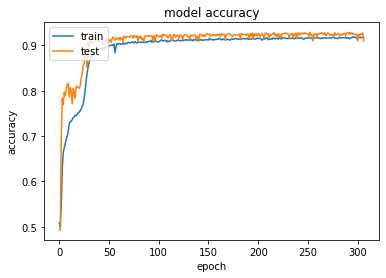

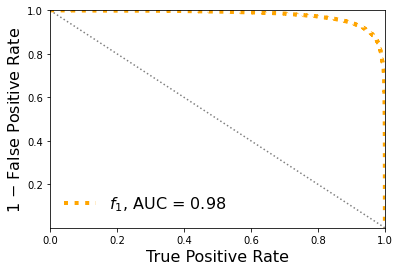

Classification score:


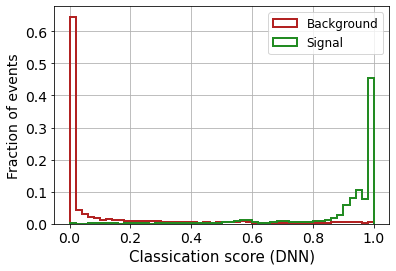


 ROC-AUC =  0.9790091240488787


In [32]:

# define the keras model
model = Sequential()
model.add(Dense(64, input_shape=(X_mon_train.shape[1],)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(32))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(16))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(8))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(4))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

In [33]:
print('\n ROC-AUC = ', roc_auc_dnn)


 ROC-AUC =  0.9790091240488787


Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17 (Dense)             (None, 128)               2304      
_________________________________________________________________
leaky_re_lu_13 (LeakyReLU)   (None, 128)               0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_18 (Dense)             (None, 64)                8256      
_________________________________________________________________
leaky_re_lu_14 (LeakyReLU)   (None, 64)                0         
_________________________________________________________________
dropout_14 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_19 (Dense)             (None, 32)               

319/319 [==============================] - 0s 924us/step - loss: 0.2386 - accuracy: 0.9048 - val_loss: 0.1943 - val_accuracy: 0.9235
Epoch 94/500
319/319 [==============================] - 0s 943us/step - loss: 0.2417 - accuracy: 0.9064 - val_loss: 0.1964 - val_accuracy: 0.9207
Epoch 95/500
319/319 [==============================] - 0s 930us/step - loss: 0.2304 - accuracy: 0.9105 - val_loss: 0.2000 - val_accuracy: 0.9206
Epoch 96/500
319/319 [==============================] - 0s 919us/step - loss: 0.2272 - accuracy: 0.9113 - val_loss: 0.1930 - val_accuracy: 0.9231
Epoch 97/500
319/319 [==============================] - 0s 921us/step - loss: 0.2343 - accuracy: 0.9096 - val_loss: 0.1925 - val_accuracy: 0.9234
Epoch 98/500
319/319 [==============================] - 0s 927us/step - loss: 0.2343 - accuracy: 0.9067 - val_loss: 0.1945 - val_accuracy: 0.9214
Epoch 99/500
319/319 [==============================] - 0s 948us/step - loss: 0.2425 - accuracy: 0.9046 - val_loss: 0.1998 - val_accuracy

Epoch 149/500
319/319 [==============================] - 0s 925us/step - loss: 0.2259 - accuracy: 0.9109 - val_loss: 0.1913 - val_accuracy: 0.9239
Epoch 150/500
319/319 [==============================] - 0s 924us/step - loss: 0.2270 - accuracy: 0.9139 - val_loss: 0.1847 - val_accuracy: 0.9250
Epoch 151/500
319/319 [==============================] - 0s 921us/step - loss: 0.2289 - accuracy: 0.9101 - val_loss: 0.2296 - val_accuracy: 0.9027
Epoch 152/500
319/319 [==============================] - 0s 928us/step - loss: 0.2275 - accuracy: 0.9119 - val_loss: 0.1831 - val_accuracy: 0.9274
Epoch 153/500
319/319 [==============================] - 0s 928us/step - loss: 0.2245 - accuracy: 0.9124 - val_loss: 0.1873 - val_accuracy: 0.9227
Epoch 154/500
319/319 [==============================] - 0s 931us/step - loss: 0.2269 - accuracy: 0.9136 - val_loss: 0.1985 - val_accuracy: 0.9169
Epoch 155/500
319/319 [==============================] - 0s 926us/step - loss: 0.2200 - accuracy: 0.9161 - val_loss: 0

Epoch 205/500
319/319 [==============================] - 0s 926us/step - loss: 0.2245 - accuracy: 0.9116 - val_loss: 0.2024 - val_accuracy: 0.9187
Epoch 206/500
319/319 [==============================] - 0s 927us/step - loss: 0.2155 - accuracy: 0.9160 - val_loss: 0.1843 - val_accuracy: 0.9262
Epoch 207/500
319/319 [==============================] - 0s 936us/step - loss: 0.2220 - accuracy: 0.9149 - val_loss: 0.1926 - val_accuracy: 0.9200
Epoch 208/500
319/319 [==============================] - 0s 923us/step - loss: 0.2244 - accuracy: 0.9139 - val_loss: 0.2022 - val_accuracy: 0.9148
Epoch 209/500
319/319 [==============================] - 0s 928us/step - loss: 0.2243 - accuracy: 0.9147 - val_loss: 0.2128 - val_accuracy: 0.9209
Epoch 210/500
319/319 [==============================] - 0s 927us/step - loss: 0.2337 - accuracy: 0.9101 - val_loss: 0.1902 - val_accuracy: 0.9238
Epoch 211/500
319/319 [==============================] - 0s 926us/step - loss: 0.2160 - accuracy: 0.9151 - val_loss: 0

Epoch 261/500
319/319 [==============================] - 0s 927us/step - loss: 0.2234 - accuracy: 0.9142 - val_loss: 0.1818 - val_accuracy: 0.9266
Epoch 262/500
319/319 [==============================] - 0s 933us/step - loss: 0.2119 - accuracy: 0.9176 - val_loss: 0.1822 - val_accuracy: 0.9263
Epoch 263/500
319/319 [==============================] - 0s 983us/step - loss: 0.2160 - accuracy: 0.9159 - val_loss: 0.1981 - val_accuracy: 0.9170
Epoch 264/500
319/319 [==============================] - 0s 977us/step - loss: 0.2154 - accuracy: 0.9171 - val_loss: 0.1879 - val_accuracy: 0.9216
Epoch 265/500
319/319 [==============================] - 0s 973us/step - loss: 0.2135 - accuracy: 0.9172 - val_loss: 0.1792 - val_accuracy: 0.9281
Epoch 266/500
319/319 [==============================] - 0s 974us/step - loss: 0.2145 - accuracy: 0.9158 - val_loss: 0.1803 - val_accuracy: 0.9264
Epoch 267/500
319/319 [==============================] - 0s 961us/step - loss: 0.2153 - accuracy: 0.9158 - val_loss: 0

Epoch 317/500
319/319 [==============================] - 0s 983us/step - loss: 0.2186 - accuracy: 0.9164 - val_loss: 0.2014 - val_accuracy: 0.9213
Epoch 318/500
319/319 [==============================] - 0s 955us/step - loss: 0.2192 - accuracy: 0.9166 - val_loss: 0.1838 - val_accuracy: 0.9275
Epoch 319/500
319/319 [==============================] - 0s 952us/step - loss: 0.2122 - accuracy: 0.9165 - val_loss: 0.1866 - val_accuracy: 0.9275
Epoch 320/500
319/319 [==============================] - 0s 949us/step - loss: 0.2116 - accuracy: 0.9172 - val_loss: 0.2155 - val_accuracy: 0.9123
Epoch 321/500
319/319 [==============================] - 0s 951us/step - loss: 0.2153 - accuracy: 0.9181 - val_loss: 0.1791 - val_accuracy: 0.9271
Epoch 322/500
319/319 [==============================] - 0s 958us/step - loss: 0.2069 - accuracy: 0.9202 - val_loss: 0.1853 - val_accuracy: 0.9252
Epoch 323/500
319/319 [==============================] - 0s 961us/step - loss: 0.2137 - accuracy: 0.9154 - val_loss: 0

Epoch 373/500
319/319 [==============================] - 0s 956us/step - loss: 0.2162 - accuracy: 0.9158 - val_loss: 0.1934 - val_accuracy: 0.9249
Epoch 374/500
319/319 [==============================] - 0s 974us/step - loss: 0.2136 - accuracy: 0.9184 - val_loss: 0.1856 - val_accuracy: 0.9245
Epoch 375/500
319/319 [==============================] - 0s 972us/step - loss: 0.2179 - accuracy: 0.9161 - val_loss: 0.1812 - val_accuracy: 0.9255
Epoch 376/500
319/319 [==============================] - 0s 983us/step - loss: 0.2120 - accuracy: 0.9187 - val_loss: 0.2007 - val_accuracy: 0.9173
Epoch 377/500
319/319 [==============================] - 0s 953us/step - loss: 0.2063 - accuracy: 0.9184 - val_loss: 0.1883 - val_accuracy: 0.9232
Epoch 378/500
319/319 [==============================] - 0s 958us/step - loss: 0.2128 - accuracy: 0.9181 - val_loss: 0.2228 - val_accuracy: 0.9094
Epoch 379/500
319/319 [==============================] - 0s 955us/step - loss: 0.2224 - accuracy: 0.9196 - val_loss: 0

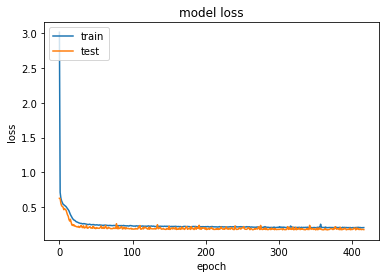

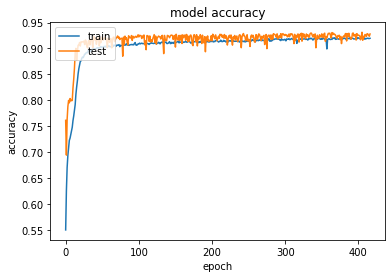

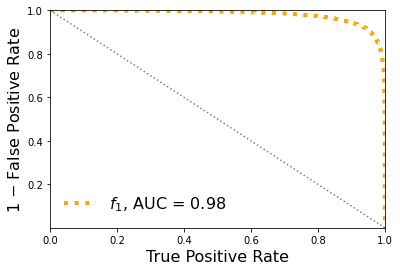

Classification score:


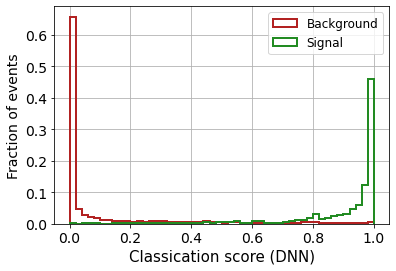


 ROC-AUC =  0.9799173734605595


In [34]:

# define the keras model
model = Sequential()
model.add(Dense(128, input_shape=(X_mon_train.shape[1],)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(64))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(32))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(16))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(8))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(4))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

In [35]:
print('\n ROC-AUC = ', roc_auc_dnn)


 ROC-AUC =  0.9799173734605595


Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_24 (Dense)             (None, 256)               4608      
_________________________________________________________________
leaky_re_lu_19 (LeakyReLU)   (None, 256)               0         
_________________________________________________________________
dropout_19 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_25 (Dense)             (None, 128)               32896     
_________________________________________________________________
leaky_re_lu_20 (LeakyReLU)   (None, 128)               0         
_________________________________________________________________
dropout_20 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_26 (Dense)             (None, 64)               

Epoch 92/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2270 - accuracy: 0.9136 - val_loss: 0.1850 - val_accuracy: 0.9241
Epoch 93/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2269 - accuracy: 0.9120 - val_loss: 0.1869 - val_accuracy: 0.9263
Epoch 94/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2304 - accuracy: 0.9115 - val_loss: 0.1843 - val_accuracy: 0.9249
Epoch 95/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2257 - accuracy: 0.9152 - val_loss: 0.1857 - val_accuracy: 0.9263
Epoch 96/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2255 - accuracy: 0.9135 - val_loss: 0.2060 - val_accuracy: 0.9117
Epoch 97/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2236 - accuracy: 0.9141 - val_loss: 0.2092 - val_accuracy: 0.9180
Epoch 98/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2295 - accuracy: 0.9094 - val_loss: 0.1898 - val_accuracy:

319/319 [==============================] - 0s 1ms/step - loss: 0.2181 - accuracy: 0.9177 - val_loss: 0.1806 - val_accuracy: 0.9284
Epoch 205/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2158 - accuracy: 0.9167 - val_loss: 0.1815 - val_accuracy: 0.9274
Epoch 206/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2220 - accuracy: 0.9136 - val_loss: 0.1819 - val_accuracy: 0.9263
Epoch 207/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2194 - accuracy: 0.9130 - val_loss: 0.1920 - val_accuracy: 0.9218
Epoch 208/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2188 - accuracy: 0.9150 - val_loss: 0.1917 - val_accuracy: 0.9218
Epoch 209/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2181 - accuracy: 0.9167 - val_loss: 0.1946 - val_accuracy: 0.9210
Epoch 210/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2170 - accuracy: 0.9167 - val_loss: 0.1800 - val_accuracy: 0.9262

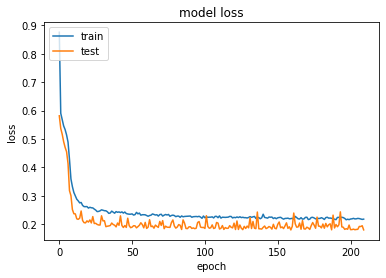

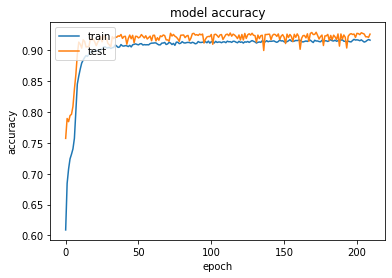

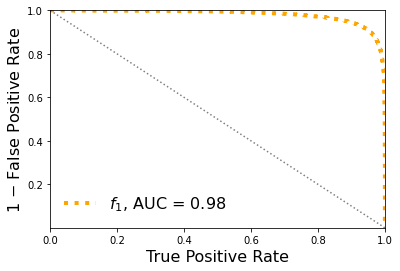

Classification score:


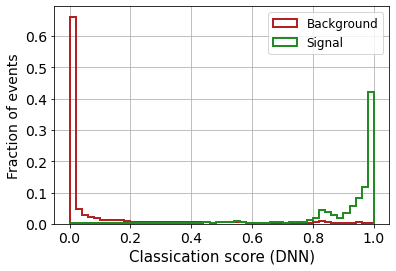


 ROC-AUC =  0.9792986414761763


In [36]:

# define the keras model
model = Sequential()
model.add(Dense(256, input_shape=(X_mon_train.shape[1],)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(128))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(64))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(32))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(16))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(8))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(4))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

In [37]:
print('\n ROC-AUC = ', roc_auc_dnn)


 ROC-AUC =  0.9792986414761763


Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_32 (Dense)             (None, 256)               4608      
_________________________________________________________________
leaky_re_lu_26 (LeakyReLU)   (None, 256)               0         
_________________________________________________________________
dropout_26 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_33 (Dense)             (None, 128)               32896     
_________________________________________________________________
leaky_re_lu_27 (LeakyReLU)   (None, 128)               0         
_________________________________________________________________
dropout_27 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_34 (Dense)             (None, 64)               

Epoch 92/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2270 - accuracy: 0.9117 - val_loss: 0.1961 - val_accuracy: 0.9248
Epoch 93/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2285 - accuracy: 0.9107 - val_loss: 0.1968 - val_accuracy: 0.9207
Epoch 94/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2267 - accuracy: 0.9109 - val_loss: 0.2291 - val_accuracy: 0.9067
Epoch 95/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2227 - accuracy: 0.9150 - val_loss: 0.1944 - val_accuracy: 0.9202
Epoch 96/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2258 - accuracy: 0.9125 - val_loss: 0.2682 - val_accuracy: 0.8830
Epoch 97/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2243 - accuracy: 0.9120 - val_loss: 0.2000 - val_accuracy: 0.9160
Epoch 98/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2224 - accuracy: 0.9148 - val_loss: 0.2891 - val_accuracy:

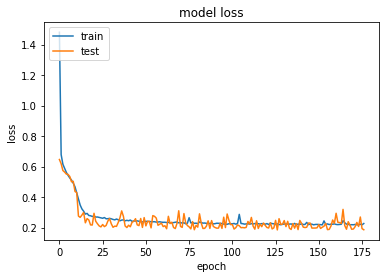

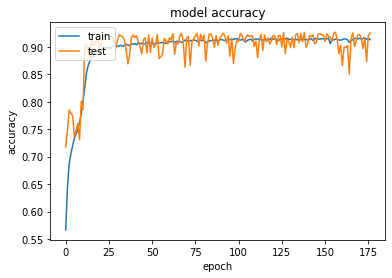

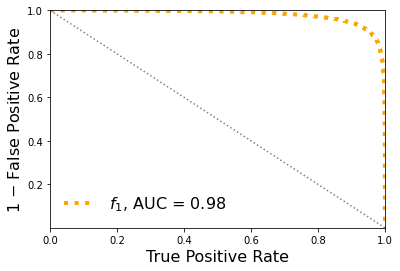

Classification score:


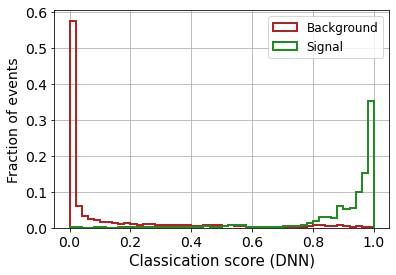


 ROC-AUC =  0.9790976425602685


In [38]:

# define the keras model
model = Sequential()
model.add(Dense(256, input_shape=(X_mon_train.shape[1],)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(128))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(64))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(32))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(16))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(8))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(4))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

In [39]:
print('\n ROC-AUC = ', roc_auc_dnn)


 ROC-AUC =  0.9790976425602685


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 4)                 72        
_________________________________________________________________
dropout (Dropout)            (None, 4)                 0         
_________________________________________________________________
dense_1 (Dense)              (None, 16)                80        
_________________________________________________________________
dropout_1 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 4)                 68        
_________________________________________________________________
dropout_2 (Dropout)          (None, 4)                 0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 5

319/319 [==============================] - 0s 544us/step - loss: 0.3233 - accuracy: 0.8712 - val_loss: 0.3035 - val_accuracy: 0.8719
Epoch 105/500
319/319 [==============================] - 0s 525us/step - loss: 0.3183 - accuracy: 0.8716 - val_loss: 0.3243 - val_accuracy: 0.8576
Epoch 106/500
319/319 [==============================] - 0s 550us/step - loss: 0.3177 - accuracy: 0.8721 - val_loss: 0.3064 - val_accuracy: 0.8674
Epoch 107/500
319/319 [==============================] - 0s 542us/step - loss: 0.3127 - accuracy: 0.8753 - val_loss: 0.3012 - val_accuracy: 0.8715
Epoch 108/500
319/319 [==============================] - 0s 559us/step - loss: 0.3138 - accuracy: 0.8740 - val_loss: 0.2767 - val_accuracy: 0.8870
Epoch 109/500
319/319 [==============================] - 0s 532us/step - loss: 0.3160 - accuracy: 0.8732 - val_loss: 0.2790 - val_accuracy: 0.8871
Epoch 110/500
319/319 [==============================] - 0s 560us/step - loss: 0.3074 - accuracy: 0.8767 - val_loss: 0.3110 - val_ac

Epoch 160/500
319/319 [==============================] - 0s 538us/step - loss: 0.2999 - accuracy: 0.8795 - val_loss: 0.3517 - val_accuracy: 0.8366
Epoch 161/500
319/319 [==============================] - 0s 538us/step - loss: 0.2926 - accuracy: 0.8821 - val_loss: 0.3052 - val_accuracy: 0.8665
Epoch 162/500
319/319 [==============================] - 0s 533us/step - loss: 0.2979 - accuracy: 0.8813 - val_loss: 0.2863 - val_accuracy: 0.8769
Epoch 163/500
319/319 [==============================] - 0s 538us/step - loss: 0.2940 - accuracy: 0.8840 - val_loss: 0.2820 - val_accuracy: 0.8808
Epoch 164/500
319/319 [==============================] - 0s 525us/step - loss: 0.2907 - accuracy: 0.8844 - val_loss: 0.2967 - val_accuracy: 0.8730
Epoch 165/500
319/319 [==============================] - 0s 529us/step - loss: 0.2952 - accuracy: 0.8811 - val_loss: 0.2546 - val_accuracy: 0.8963
Epoch 166/500
319/319 [==============================] - 0s 523us/step - loss: 0.2978 - accuracy: 0.8822 - val_loss: 0

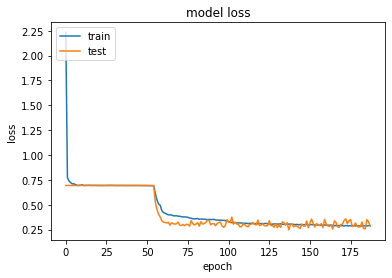

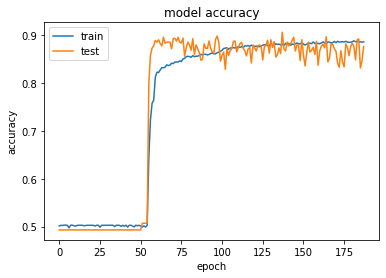

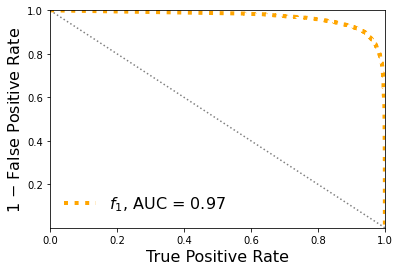

Classification score:


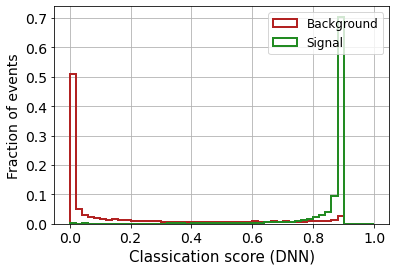


 ROC-AUC =  0.9703067186322858


In [25]:

# define the keras model
model = Sequential()
model.add(Dense(4, input_shape=(X_mon_train.shape[1],), activation='relu'))
model.add(Dropout(0.20))
# model.add(Dense(8, activation='relu'))
# model.add(Dropout(0.20))
model.add(Dense(16, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(4, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

### CNN

model = Sequential()
model.add(Conv1D(16, 3, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(16, 3, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(16, 3, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

In [13]:
# prepare the dataset
X_mon_train_cn = X_mon_train.reshape(X_mon_train.shape[0], X_mon_train.shape[1], 1)
X_mon_test_cn = X_mon_test.reshape(X_mon_test.shape[0], X_mon_test.shape[1], 1)
X_mon_val_cn = X_mon_val.reshape(X_mon_val.shape[0], X_mon_val.shape[1], 1)

Epoch 1/500
319/319 [==============================] - 10s 2ms/step - loss: 120.7027 - accuracy: 0.5399 - val_loss: 2.7933 - val_accuracy: 0.5547
Epoch 2/500
319/319 [==============================] - 0s 991us/step - loss: 6.1832 - accuracy: 0.5657 - val_loss: 1.5373 - val_accuracy: 0.5980
Epoch 3/500
319/319 [==============================] - 0s 1ms/step - loss: 3.2248 - accuracy: 0.5938 - val_loss: 1.1436 - val_accuracy: 0.6698
Epoch 4/500
319/319 [==============================] - 0s 996us/step - loss: 2.3950 - accuracy: 0.6166 - val_loss: 0.8440 - val_accuracy: 0.7299
Epoch 5/500
319/319 [==============================] - 0s 1ms/step - loss: 1.8506 - accuracy: 0.6364 - val_loss: 0.6702 - val_accuracy: 0.7693
Epoch 6/500
319/319 [==============================] - 0s 1ms/step - loss: 1.4953 - accuracy: 0.6553 - val_loss: 0.6036 - val_accuracy: 0.7807
Epoch 7/500
319/319 [==============================] - 0s 1ms/step - loss: 1.1952 - accuracy: 0.6769 - val_loss: 0.5429 - val_accuracy:

Epoch 58/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2926 - accuracy: 0.8873 - val_loss: 0.4345 - val_accuracy: 0.7972
Epoch 59/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2916 - accuracy: 0.8872 - val_loss: 0.4270 - val_accuracy: 0.8062
Epoch 60/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2843 - accuracy: 0.8923 - val_loss: 0.3850 - val_accuracy: 0.8313
Epoch 61/500
319/319 [==============================] - 0s 998us/step - loss: 0.2944 - accuracy: 0.8850 - val_loss: 0.5428 - val_accuracy: 0.7324
Epoch 62/500
319/319 [==============================] - 0s 995us/step - loss: 0.2787 - accuracy: 0.8930 - val_loss: 0.4559 - val_accuracy: 0.7869
Epoch 63/500
319/319 [==============================] - 0s 983us/step - loss: 0.2843 - accuracy: 0.8910 - val_loss: 0.4578 - val_accuracy: 0.7862
Epoch 64/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2897 - accuracy: 0.8899 - val_loss: 0.4673 - val_acc

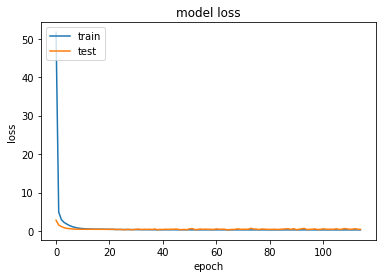

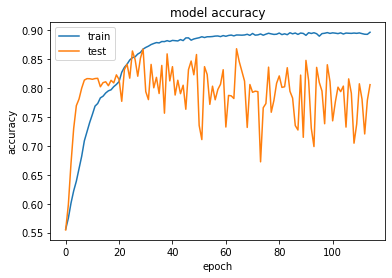

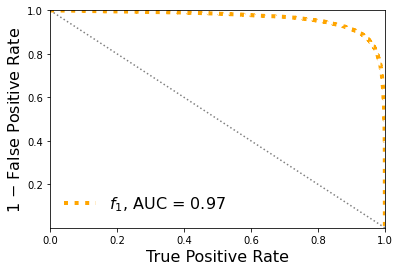

Classification score:


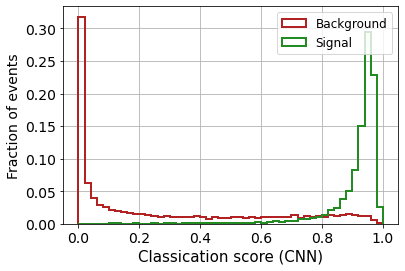


 ROC-AUC =  0.9655045913406839


In [20]:

# define the keras model
model = Sequential()
model.add(Conv1D(8, 2, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [21]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.9655045913406839


Epoch 1/500
319/319 [==============================] - 1s 2ms/step - loss: 26.5463 - accuracy: 0.5362 - val_loss: 0.7005 - val_accuracy: 0.7310
Epoch 2/500
319/319 [==============================] - 0s 1ms/step - loss: 2.6636 - accuracy: 0.6142 - val_loss: 0.6645 - val_accuracy: 0.7703
Epoch 3/500
319/319 [==============================] - 0s 1ms/step - loss: 1.6458 - accuracy: 0.6668 - val_loss: 0.5849 - val_accuracy: 0.7948
Epoch 4/500
319/319 [==============================] - 0s 1ms/step - loss: 1.1109 - accuracy: 0.7041 - val_loss: 0.5013 - val_accuracy: 0.8046
Epoch 5/500
319/319 [==============================] - 0s 1ms/step - loss: 0.8233 - accuracy: 0.7262 - val_loss: 0.4710 - val_accuracy: 0.8133
Epoch 6/500
319/319 [==============================] - 0s 1ms/step - loss: 0.6747 - accuracy: 0.7412 - val_loss: 0.4584 - val_accuracy: 0.8195
Epoch 7/500
319/319 [==============================] - 0s 1ms/step - loss: 0.5732 - accuracy: 0.7655 - val_loss: 0.4459 - val_accuracy: 0.823

Epoch 58/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2742 - accuracy: 0.8970 - val_loss: 0.3542 - val_accuracy: 0.8523
Epoch 59/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2670 - accuracy: 0.8982 - val_loss: 0.3877 - val_accuracy: 0.8305
Epoch 60/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2773 - accuracy: 0.8942 - val_loss: 0.3847 - val_accuracy: 0.8287
Epoch 61/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2701 - accuracy: 0.8976 - val_loss: 0.4203 - val_accuracy: 0.8161
Epoch 62/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2724 - accuracy: 0.9007 - val_loss: 0.3567 - val_accuracy: 0.8427
Epoch 63/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2690 - accuracy: 0.8970 - val_loss: 0.3662 - val_accuracy: 0.8398
Epoch 64/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2762 - accuracy: 0.8951 - val_loss: 0.3121 - val_accuracy:

Epoch 115/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2681 - accuracy: 0.8959 - val_loss: 0.4791 - val_accuracy: 0.7732
Epoch 116/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2582 - accuracy: 0.9021 - val_loss: 0.4640 - val_accuracy: 0.7865
Epoch 117/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2641 - accuracy: 0.9009 - val_loss: 0.3818 - val_accuracy: 0.8305
Epoch 118/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2658 - accuracy: 0.9013 - val_loss: 0.3508 - val_accuracy: 0.8462
Epoch 119/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2601 - accuracy: 0.9015 - val_loss: 0.2730 - val_accuracy: 0.8935
Epoch 120/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2642 - accuracy: 0.8984 - val_loss: 0.3360 - val_accuracy: 0.8562
Epoch 121/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2712 - accuracy: 0.8992 - val_loss: 0.5669 - val_ac

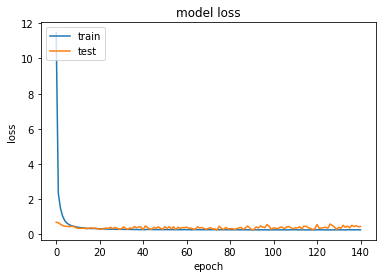

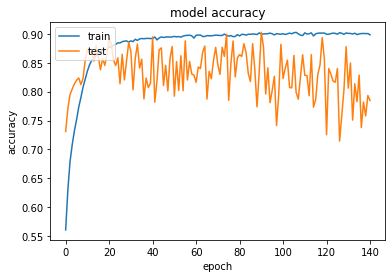

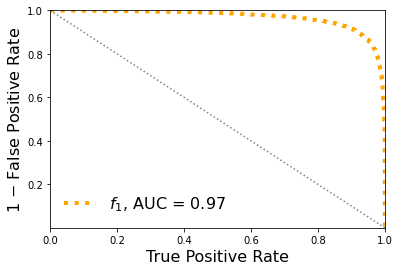

Classification score:


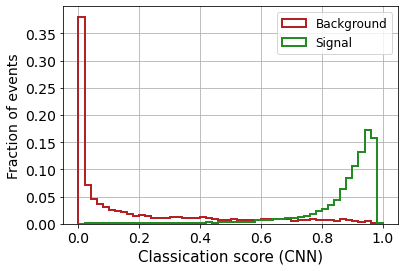


 ROC-AUC =  0.9669391516369009


In [22]:

# define the keras model
model = Sequential()
model.add(Conv1D(16, 2, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [23]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.9669391516369009


Epoch 1/500
319/319 [==============================] - 1s 2ms/step - loss: 9.0230 - accuracy: 0.5632 - val_loss: 0.6961 - val_accuracy: 0.7476
Epoch 2/500
319/319 [==============================] - 0s 2ms/step - loss: 1.5494 - accuracy: 0.6449 - val_loss: 0.5143 - val_accuracy: 0.7926
Epoch 3/500
319/319 [==============================] - 0s 2ms/step - loss: 0.8986 - accuracy: 0.6929 - val_loss: 0.4874 - val_accuracy: 0.8130
Epoch 4/500
319/319 [==============================] - 0s 2ms/step - loss: 0.6679 - accuracy: 0.7273 - val_loss: 0.4772 - val_accuracy: 0.8198
Epoch 5/500
319/319 [==============================] - 0s 2ms/step - loss: 0.5659 - accuracy: 0.7618 - val_loss: 0.4690 - val_accuracy: 0.8227
Epoch 6/500
319/319 [==============================] - 0s 2ms/step - loss: 0.5256 - accuracy: 0.7773 - val_loss: 0.4527 - val_accuracy: 0.8233
Epoch 7/500
319/319 [==============================] - 0s 2ms/step - loss: 0.4951 - accuracy: 0.7913 - val_loss: 0.4204 - val_accuracy: 0.8273

Epoch 58/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2740 - accuracy: 0.8966 - val_loss: 0.2270 - val_accuracy: 0.9209
Epoch 59/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2751 - accuracy: 0.8937 - val_loss: 0.2773 - val_accuracy: 0.8891
Epoch 60/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2721 - accuracy: 0.8958 - val_loss: 0.2432 - val_accuracy: 0.9105
Epoch 61/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2798 - accuracy: 0.8911 - val_loss: 0.2311 - val_accuracy: 0.9156
Epoch 62/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2692 - accuracy: 0.8956 - val_loss: 0.2255 - val_accuracy: 0.9216
Epoch 63/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2724 - accuracy: 0.8950 - val_loss: 0.2493 - val_accuracy: 0.9039
Epoch 64/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2750 - accuracy: 0.8948 - val_loss: 0.2374 - val_accuracy:

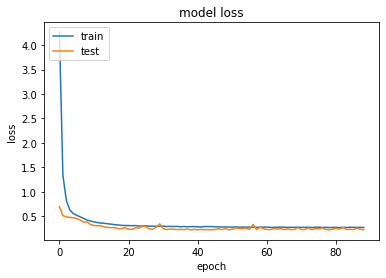

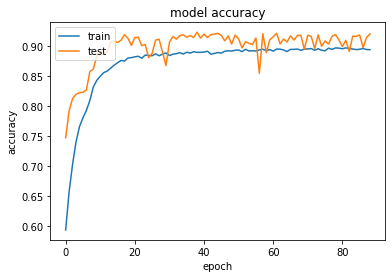

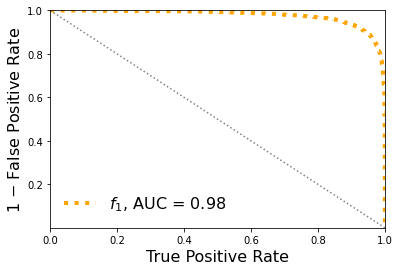

Classification score:


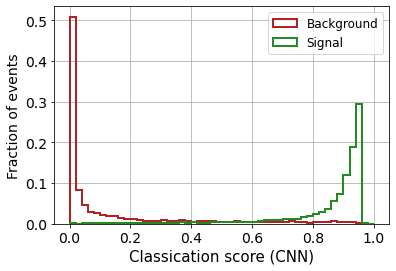


 ROC-AUC =  0.9756742841602972


In [24]:

# define the keras model
model = Sequential()
model.add(Conv1D(32, 2, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [25]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.9756742841602972


Epoch 1/500
319/319 [==============================] - 1s 2ms/step - loss: 67.0748 - accuracy: 0.5325 - val_loss: 2.7467 - val_accuracy: 0.5554
Epoch 2/500
319/319 [==============================] - 0s 980us/step - loss: 4.6715 - accuracy: 0.5978 - val_loss: 1.3653 - val_accuracy: 0.6970
Epoch 3/500
319/319 [==============================] - 0s 992us/step - loss: 2.6408 - accuracy: 0.6004 - val_loss: 1.0235 - val_accuracy: 0.7271
Epoch 4/500
319/319 [==============================] - 0s 1ms/step - loss: 1.9215 - accuracy: 0.6254 - val_loss: 0.6883 - val_accuracy: 0.7572
Epoch 5/500
319/319 [==============================] - 0s 994us/step - loss: 1.4401 - accuracy: 0.6519 - val_loss: 0.6188 - val_accuracy: 0.7779
Epoch 6/500
319/319 [==============================] - 0s 992us/step - loss: 1.0945 - accuracy: 0.6770 - val_loss: 0.5737 - val_accuracy: 0.7850
Epoch 7/500
319/319 [==============================] - 0s 988us/step - loss: 0.8493 - accuracy: 0.7068 - val_loss: 0.5015 - val_accur

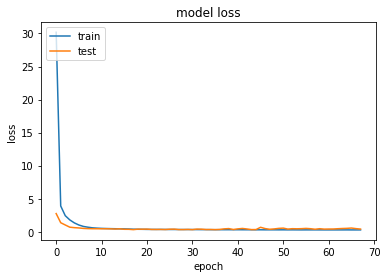

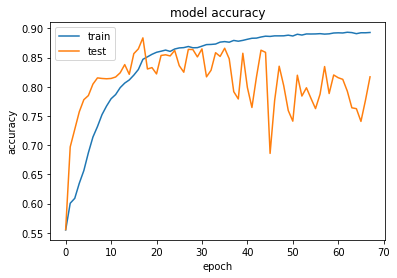

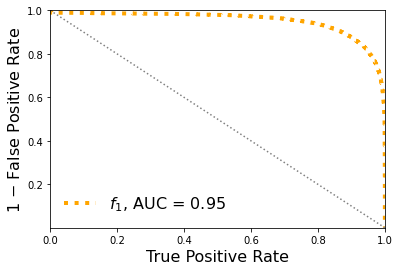

Classification score:


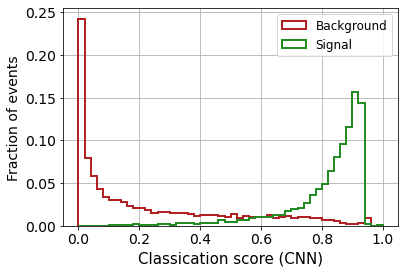


 ROC-AUC =  0.9517347528639808


In [26]:

# define the keras model
model = Sequential()
model.add(Conv1D(8, 3, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [27]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.9517347528639808


Epoch 1/500
319/319 [==============================] - 1s 2ms/step - loss: 24.4444 - accuracy: 0.5272 - val_loss: 1.3645 - val_accuracy: 0.6451
Epoch 2/500
319/319 [==============================] - 0s 1ms/step - loss: 2.9104 - accuracy: 0.5971 - val_loss: 0.6795 - val_accuracy: 0.7567
Epoch 3/500
319/319 [==============================] - 0s 1ms/step - loss: 1.8171 - accuracy: 0.6484 - val_loss: 0.6522 - val_accuracy: 0.7654
Epoch 4/500
319/319 [==============================] - 0s 1ms/step - loss: 1.2106 - accuracy: 0.6847 - val_loss: 0.5507 - val_accuracy: 0.7905
Epoch 5/500
319/319 [==============================] - 0s 1ms/step - loss: 0.8764 - accuracy: 0.7062 - val_loss: 0.5151 - val_accuracy: 0.7993
Epoch 6/500
319/319 [==============================] - 0s 1ms/step - loss: 0.6914 - accuracy: 0.7336 - val_loss: 0.4758 - val_accuracy: 0.8130
Epoch 7/500
319/319 [==============================] - 0s 1ms/step - loss: 0.6010 - accuracy: 0.7551 - val_loss: 0.4680 - val_accuracy: 0.816

Epoch 58/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2728 - accuracy: 0.8967 - val_loss: 0.3887 - val_accuracy: 0.8377
Epoch 59/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2774 - accuracy: 0.8963 - val_loss: 0.3836 - val_accuracy: 0.8288
Epoch 60/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2793 - accuracy: 0.8928 - val_loss: 0.3203 - val_accuracy: 0.8634
Epoch 61/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2691 - accuracy: 0.8984 - val_loss: 0.3932 - val_accuracy: 0.8247
Epoch 62/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2750 - accuracy: 0.8975 - val_loss: 0.3597 - val_accuracy: 0.8370
Epoch 63/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2750 - accuracy: 0.8959 - val_loss: 0.3129 - val_accuracy: 0.8666
Epoch 64/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2753 - accuracy: 0.8929 - val_loss: 0.2749 - val_accuracy:

Epoch 115/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2674 - accuracy: 0.8971 - val_loss: 0.2636 - val_accuracy: 0.8945
Epoch 116/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2723 - accuracy: 0.8940 - val_loss: 0.3456 - val_accuracy: 0.8580
Epoch 117/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2701 - accuracy: 0.8949 - val_loss: 0.3347 - val_accuracy: 0.8548
Epoch 118/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2648 - accuracy: 0.8990 - val_loss: 0.3465 - val_accuracy: 0.8429
Epoch 119/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2634 - accuracy: 0.8977 - val_loss: 0.4224 - val_accuracy: 0.8052
Epoch 120/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2743 - accuracy: 0.8953 - val_loss: 0.4914 - val_accuracy: 0.7743
Epoch 121/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2719 - accuracy: 0.8955 - val_loss: 0.3792 - val_ac

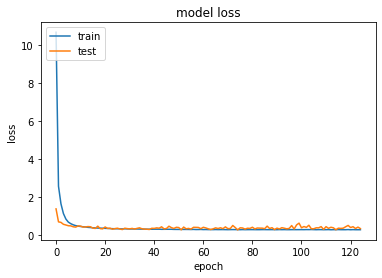

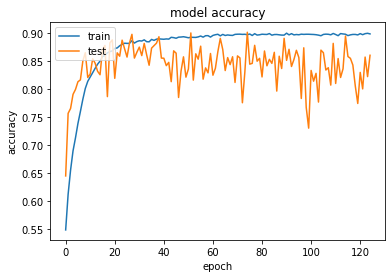

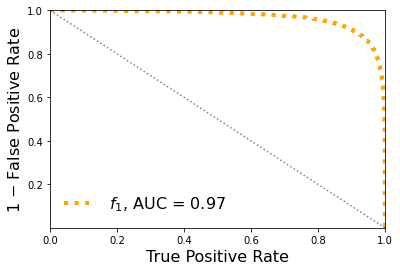

Classification score:


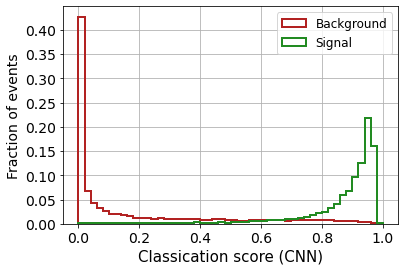


 ROC-AUC =  0.968003879235368


In [28]:

# define the keras model
model = Sequential()
model.add(Conv1D(16, 3, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [29]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.968003879235368


Epoch 1/500
319/319 [==============================] - 1s 2ms/step - loss: 33.3731 - accuracy: 0.5297 - val_loss: 1.3599 - val_accuracy: 0.6123
Epoch 2/500
319/319 [==============================] - 0s 2ms/step - loss: 2.3279 - accuracy: 0.6010 - val_loss: 0.9588 - val_accuracy: 0.7343
Epoch 3/500
319/319 [==============================] - 0s 2ms/step - loss: 1.6459 - accuracy: 0.6428 - val_loss: 0.7174 - val_accuracy: 0.7680
Epoch 4/500
319/319 [==============================] - 0s 2ms/step - loss: 1.2963 - accuracy: 0.6726 - val_loss: 0.6235 - val_accuracy: 0.7803
Epoch 5/500
319/319 [==============================] - 0s 2ms/step - loss: 0.9874 - accuracy: 0.7079 - val_loss: 0.4791 - val_accuracy: 0.8207
Epoch 6/500
319/319 [==============================] - 0s 2ms/step - loss: 0.7984 - accuracy: 0.7310 - val_loss: 0.4590 - val_accuracy: 0.8269
Epoch 7/500
319/319 [==============================] - 0s 1ms/step - loss: 0.6581 - accuracy: 0.7585 - val_loss: 0.4167 - val_accuracy: 0.841

Epoch 58/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2748 - accuracy: 0.8946 - val_loss: 0.2797 - val_accuracy: 0.8837
Epoch 59/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2769 - accuracy: 0.8930 - val_loss: 0.3203 - val_accuracy: 0.8613
Epoch 60/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2734 - accuracy: 0.8939 - val_loss: 0.2349 - val_accuracy: 0.9192
Epoch 61/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2749 - accuracy: 0.8925 - val_loss: 0.2976 - val_accuracy: 0.8747
Epoch 62/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2704 - accuracy: 0.8968 - val_loss: 0.2770 - val_accuracy: 0.8881
Epoch 63/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2745 - accuracy: 0.8947 - val_loss: 0.2526 - val_accuracy: 0.9001
Epoch 64/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2782 - accuracy: 0.8934 - val_loss: 0.2978 - val_accuracy:

Epoch 115/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2734 - accuracy: 0.8950 - val_loss: 0.2325 - val_accuracy: 0.9117
Epoch 116/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2758 - accuracy: 0.8934 - val_loss: 0.2373 - val_accuracy: 0.9142
Restoring model weights from the end of the best epoch.
Epoch 00116: early stopping


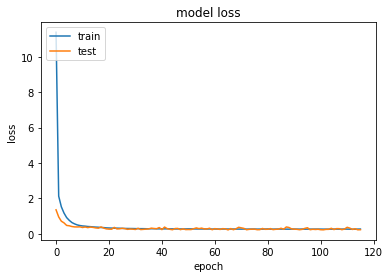

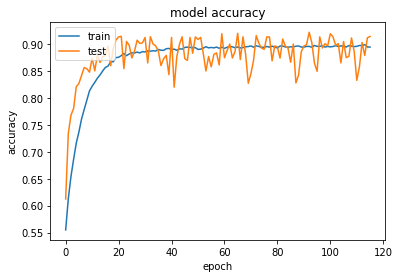

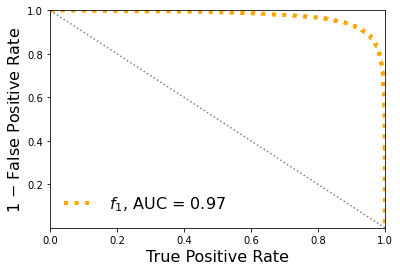

Classification score:


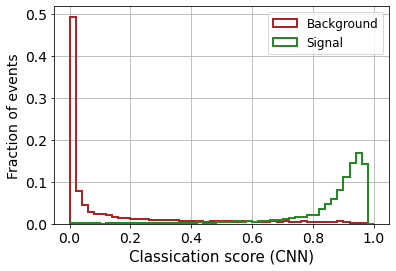


 ROC-AUC =  0.9740817080574419


In [30]:

# define the keras model
model = Sequential()
model.add(Conv1D(32, 3, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [31]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.9740817080574419


##### 2 conv layers

Epoch 1/500
319/319 [==============================] - 1s 2ms/step - loss: 25.7587 - accuracy: 0.5197 - val_loss: 1.2164 - val_accuracy: 0.6262
Epoch 2/500
319/319 [==============================] - 0s 1ms/step - loss: 1.9395 - accuracy: 0.6116 - val_loss: 0.6675 - val_accuracy: 0.7569
Epoch 3/500
319/319 [==============================] - 0s 1ms/step - loss: 0.9464 - accuracy: 0.6889 - val_loss: 0.5355 - val_accuracy: 0.8104
Epoch 4/500
319/319 [==============================] - 0s 1ms/step - loss: 0.6625 - accuracy: 0.7486 - val_loss: 0.5240 - val_accuracy: 0.8157
Epoch 5/500
319/319 [==============================] - 0s 1ms/step - loss: 0.5715 - accuracy: 0.7813 - val_loss: 0.5009 - val_accuracy: 0.8323
Epoch 6/500
319/319 [==============================] - 0s 1ms/step - loss: 0.5254 - accuracy: 0.8061 - val_loss: 0.4906 - val_accuracy: 0.8248
Epoch 7/500
319/319 [==============================] - 0s 1ms/step - loss: 0.4931 - accuracy: 0.8170 - val_loss: 0.4097 - val_accuracy: 0.869

Epoch 58/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2717 - accuracy: 0.8979 - val_loss: 0.4756 - val_accuracy: 0.7841
Epoch 59/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2754 - accuracy: 0.8978 - val_loss: 0.3981 - val_accuracy: 0.8358
Epoch 60/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2766 - accuracy: 0.8981 - val_loss: 0.3214 - val_accuracy: 0.8712
Epoch 61/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2749 - accuracy: 0.8995 - val_loss: 0.3538 - val_accuracy: 0.8554
Epoch 62/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2713 - accuracy: 0.8991 - val_loss: 0.4708 - val_accuracy: 0.7804
Epoch 63/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2709 - accuracy: 0.8996 - val_loss: 0.5019 - val_accuracy: 0.7712
Epoch 64/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2742 - accuracy: 0.8974 - val_loss: 0.4908 - val_accuracy:

Epoch 115/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2565 - accuracy: 0.9039 - val_loss: 0.4048 - val_accuracy: 0.8219
Epoch 116/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2541 - accuracy: 0.9052 - val_loss: 0.3748 - val_accuracy: 0.8454
Epoch 117/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2614 - accuracy: 0.9028 - val_loss: 0.4971 - val_accuracy: 0.7778
Epoch 118/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2525 - accuracy: 0.9052 - val_loss: 0.4108 - val_accuracy: 0.8248
Epoch 119/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2628 - accuracy: 0.9007 - val_loss: 0.3555 - val_accuracy: 0.8529
Epoch 120/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2572 - accuracy: 0.9044 - val_loss: 0.3483 - val_accuracy: 0.8524
Epoch 121/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2590 - accuracy: 0.9055 - val_loss: 0.2908 - val_ac

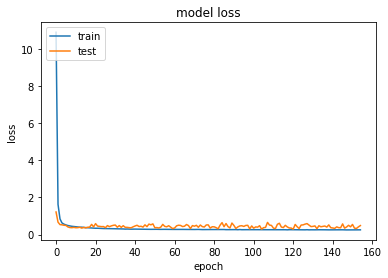

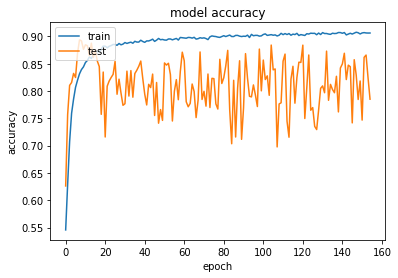

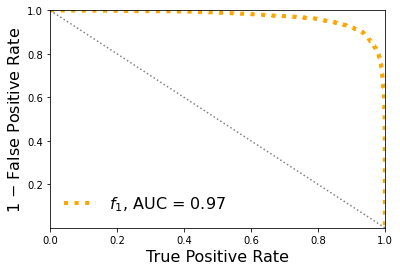

Classification score:


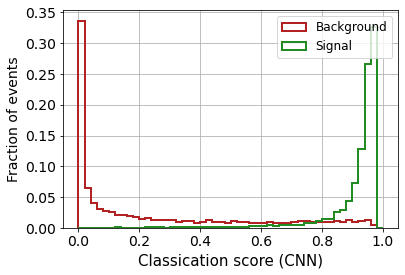


 ROC-AUC =  0.9704373148524228


In [32]:

# define the keras model
model = Sequential()
model.add(Conv1D(8, 2, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(8, 2, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [33]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.9704373148524228


Epoch 1/500
319/319 [==============================] - 1s 2ms/step - loss: 19.2501 - accuracy: 0.5432 - val_loss: 0.8003 - val_accuracy: 0.6953
Epoch 2/500
319/319 [==============================] - 0s 1ms/step - loss: 0.9252 - accuracy: 0.6592 - val_loss: 0.5776 - val_accuracy: 0.7785
Epoch 3/500
319/319 [==============================] - 0s 1ms/step - loss: 0.5951 - accuracy: 0.7746 - val_loss: 0.4776 - val_accuracy: 0.8379
Epoch 4/500
319/319 [==============================] - 0s 1ms/step - loss: 0.4982 - accuracy: 0.8324 - val_loss: 0.5161 - val_accuracy: 0.8082
Epoch 5/500
319/319 [==============================] - 0s 1ms/step - loss: 0.4674 - accuracy: 0.8481 - val_loss: 0.4026 - val_accuracy: 0.8767
Epoch 6/500
319/319 [==============================] - 0s 1ms/step - loss: 0.4404 - accuracy: 0.8586 - val_loss: 0.3704 - val_accuracy: 0.8998
Epoch 7/500
319/319 [==============================] - 0s 1ms/step - loss: 0.4340 - accuracy: 0.8558 - val_loss: 0.3852 - val_accuracy: 0.886

Epoch 58/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2854 - accuracy: 0.8969 - val_loss: 0.3831 - val_accuracy: 0.8408
Epoch 59/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2858 - accuracy: 0.8941 - val_loss: 0.3291 - val_accuracy: 0.8728
Epoch 60/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2904 - accuracy: 0.8929 - val_loss: 0.3514 - val_accuracy: 0.8551
Epoch 61/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2918 - accuracy: 0.8934 - val_loss: 0.3594 - val_accuracy: 0.8519
Epoch 62/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2889 - accuracy: 0.8939 - val_loss: 0.3725 - val_accuracy: 0.8369
Epoch 63/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2838 - accuracy: 0.8965 - val_loss: 0.4509 - val_accuracy: 0.8023
Epoch 64/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2870 - accuracy: 0.8957 - val_loss: 0.4007 - val_accuracy:

Epoch 115/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2702 - accuracy: 0.9005 - val_loss: 0.3624 - val_accuracy: 0.8452
Epoch 116/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2662 - accuracy: 0.9020 - val_loss: 0.3458 - val_accuracy: 0.8566
Epoch 117/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2708 - accuracy: 0.8981 - val_loss: 0.4243 - val_accuracy: 0.8083
Epoch 118/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2622 - accuracy: 0.9019 - val_loss: 0.3657 - val_accuracy: 0.8451
Epoch 119/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2639 - accuracy: 0.9031 - val_loss: 0.3523 - val_accuracy: 0.8470
Epoch 120/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2687 - accuracy: 0.9001 - val_loss: 0.3636 - val_accuracy: 0.8447
Epoch 121/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2733 - accuracy: 0.8972 - val_loss: 0.4042 - val_ac

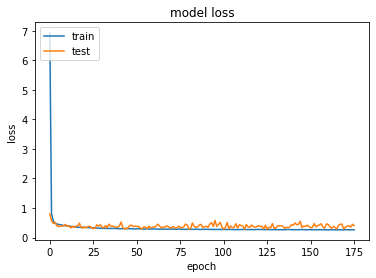

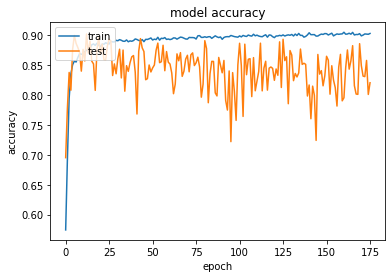

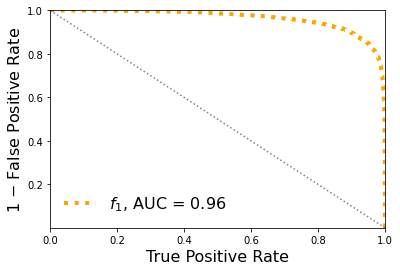

Classification score:


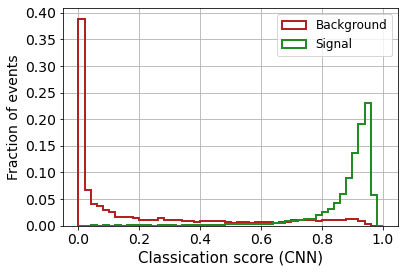


 ROC-AUC =  0.9632959448187729


In [34]:

# define the keras model
model = Sequential()
model.add(Conv1D(16, 2, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(16, 2, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [35]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.9632959448187729


Epoch 1/500
319/319 [==============================] - 2s 3ms/step - loss: 6.2137 - accuracy: 0.5785 - val_loss: 0.6568 - val_accuracy: 0.8011
Epoch 2/500
319/319 [==============================] - 1s 2ms/step - loss: 0.6467 - accuracy: 0.7832 - val_loss: 0.4758 - val_accuracy: 0.8773
Epoch 3/500
319/319 [==============================] - 1s 2ms/step - loss: 0.5292 - accuracy: 0.8398 - val_loss: 0.4506 - val_accuracy: 0.8809
Epoch 4/500
319/319 [==============================] - 1s 2ms/step - loss: 0.4827 - accuracy: 0.8601 - val_loss: 0.3993 - val_accuracy: 0.8971
Epoch 5/500
319/319 [==============================] - 1s 2ms/step - loss: 0.4514 - accuracy: 0.8710 - val_loss: 0.4119 - val_accuracy: 0.8948
Epoch 6/500
319/319 [==============================] - 1s 2ms/step - loss: 0.4421 - accuracy: 0.8699 - val_loss: 0.5474 - val_accuracy: 0.8002
Epoch 7/500
319/319 [==============================] - 1s 2ms/step - loss: 0.4226 - accuracy: 0.8757 - val_loss: 0.3800 - val_accuracy: 0.8887

Epoch 58/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2684 - accuracy: 0.9007 - val_loss: 0.3638 - val_accuracy: 0.8437
Epoch 59/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2705 - accuracy: 0.9028 - val_loss: 0.3445 - val_accuracy: 0.8566
Epoch 60/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2630 - accuracy: 0.9045 - val_loss: 0.2797 - val_accuracy: 0.8908
Epoch 61/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2693 - accuracy: 0.9016 - val_loss: 0.3092 - val_accuracy: 0.8805
Epoch 62/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2623 - accuracy: 0.9045 - val_loss: 0.3393 - val_accuracy: 0.8601
Epoch 63/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2660 - accuracy: 0.9028 - val_loss: 0.3538 - val_accuracy: 0.8533
Epoch 64/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2672 - accuracy: 0.9037 - val_loss: 0.4330 - val_accuracy:

Epoch 115/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2536 - accuracy: 0.9059 - val_loss: 0.3893 - val_accuracy: 0.8458
Epoch 116/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2527 - accuracy: 0.9048 - val_loss: 0.3234 - val_accuracy: 0.8749
Epoch 117/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2494 - accuracy: 0.9068 - val_loss: 0.3279 - val_accuracy: 0.8680
Epoch 118/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2488 - accuracy: 0.9088 - val_loss: 0.2725 - val_accuracy: 0.8892
Epoch 119/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2566 - accuracy: 0.9061 - val_loss: 0.4706 - val_accuracy: 0.7930
Epoch 120/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2543 - accuracy: 0.9044 - val_loss: 0.4074 - val_accuracy: 0.8300
Epoch 121/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2479 - accuracy: 0.9072 - val_loss: 0.2993 - val_ac

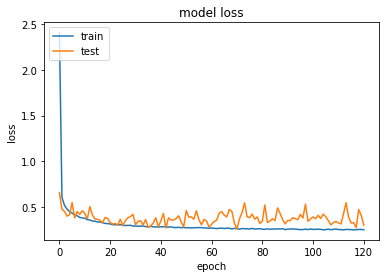

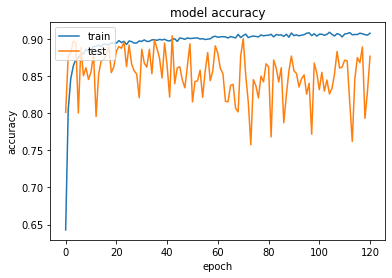

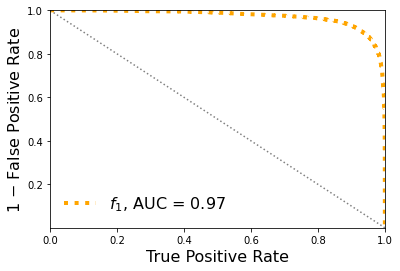

Classification score:


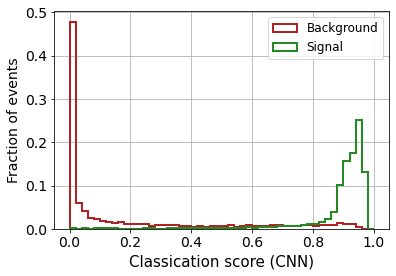


 ROC-AUC =  0.9717080210696694


In [36]:

# define the keras model
model = Sequential()
model.add(Conv1D(32, 2, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(32, 2, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [37]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.9717080210696694


Epoch 1/500
319/319 [==============================] - 1s 2ms/step - loss: 22.5627 - accuracy: 0.5316 - val_loss: 0.6107 - val_accuracy: 0.7249
Epoch 2/500
319/319 [==============================] - 0s 1ms/step - loss: 0.8362 - accuracy: 0.6565 - val_loss: 0.5741 - val_accuracy: 0.7604
Epoch 3/500
319/319 [==============================] - 0s 1ms/step - loss: 0.6017 - accuracy: 0.7490 - val_loss: 0.5085 - val_accuracy: 0.8248
Epoch 4/500
319/319 [==============================] - 0s 1ms/step - loss: 0.5450 - accuracy: 0.7862 - val_loss: 0.4840 - val_accuracy: 0.8286
Epoch 5/500
319/319 [==============================] - 0s 1ms/step - loss: 0.5203 - accuracy: 0.7950 - val_loss: 0.4491 - val_accuracy: 0.8386
Epoch 6/500
319/319 [==============================] - 0s 1ms/step - loss: 0.4975 - accuracy: 0.8072 - val_loss: 0.4438 - val_accuracy: 0.8408
Epoch 7/500
319/319 [==============================] - 0s 1ms/step - loss: 0.4772 - accuracy: 0.8196 - val_loss: 0.4159 - val_accuracy: 0.868

Epoch 58/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2739 - accuracy: 0.9054 - val_loss: 0.3818 - val_accuracy: 0.8390
Epoch 59/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2778 - accuracy: 0.9040 - val_loss: 0.5529 - val_accuracy: 0.7440
Epoch 60/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2723 - accuracy: 0.9059 - val_loss: 0.4449 - val_accuracy: 0.8120
Epoch 61/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2732 - accuracy: 0.9030 - val_loss: 0.7073 - val_accuracy: 0.7022
Epoch 62/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2812 - accuracy: 0.9015 - val_loss: 0.7128 - val_accuracy: 0.6925
Epoch 63/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2891 - accuracy: 0.8944 - val_loss: 0.5226 - val_accuracy: 0.7782
Epoch 64/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2811 - accuracy: 0.8987 - val_loss: 0.4080 - val_accuracy:

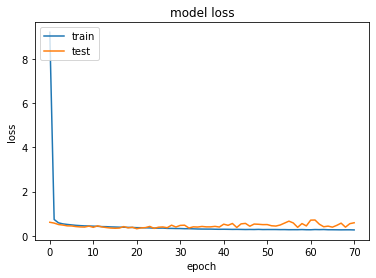

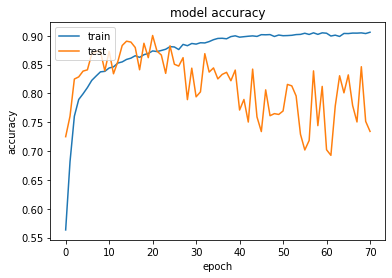

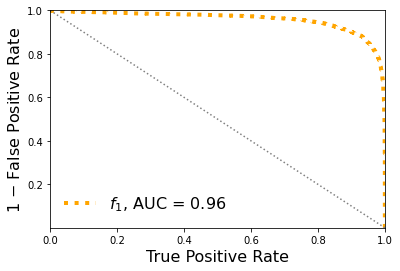

Classification score:


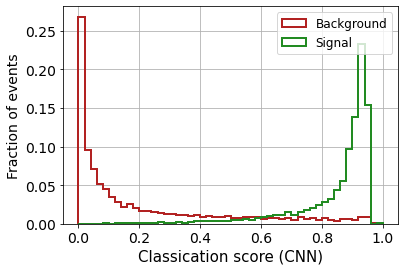


 ROC-AUC =  0.9585079839232712


In [38]:

# define the keras model
model = Sequential()
model.add(Conv1D(8, 3, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(8, 3, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [39]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.9585079839232712


Epoch 1/500
319/319 [==============================] - 1s 2ms/step - loss: 13.1064 - accuracy: 0.5452 - val_loss: 0.6110 - val_accuracy: 0.7762
Epoch 2/500
319/319 [==============================] - 0s 1ms/step - loss: 0.6155 - accuracy: 0.7690 - val_loss: 0.4979 - val_accuracy: 0.8505
Epoch 3/500
319/319 [==============================] - 0s 1ms/step - loss: 0.5179 - accuracy: 0.8270 - val_loss: 0.4557 - val_accuracy: 0.8634
Epoch 4/500
319/319 [==============================] - 0s 1ms/step - loss: 0.4896 - accuracy: 0.8390 - val_loss: 0.4240 - val_accuracy: 0.8772
Epoch 5/500
319/319 [==============================] - 0s 1ms/step - loss: 0.4662 - accuracy: 0.8486 - val_loss: 0.3951 - val_accuracy: 0.8902
Epoch 6/500
319/319 [==============================] - 0s 1ms/step - loss: 0.4543 - accuracy: 0.8543 - val_loss: 0.3845 - val_accuracy: 0.8858
Epoch 7/500
319/319 [==============================] - 0s 1ms/step - loss: 0.4360 - accuracy: 0.8617 - val_loss: 0.3918 - val_accuracy: 0.878

Epoch 58/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2771 - accuracy: 0.8966 - val_loss: 0.3009 - val_accuracy: 0.8835
Epoch 59/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2776 - accuracy: 0.8964 - val_loss: 0.3003 - val_accuracy: 0.8827
Epoch 60/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2709 - accuracy: 0.9002 - val_loss: 0.2835 - val_accuracy: 0.8891
Epoch 61/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2687 - accuracy: 0.8979 - val_loss: 0.3356 - val_accuracy: 0.8684
Epoch 62/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2801 - accuracy: 0.8937 - val_loss: 0.3205 - val_accuracy: 0.8712
Epoch 63/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2697 - accuracy: 0.8995 - val_loss: 0.3298 - val_accuracy: 0.8654
Epoch 64/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2674 - accuracy: 0.9007 - val_loss: 0.3236 - val_accuracy:

Epoch 115/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2634 - accuracy: 0.8995 - val_loss: 0.2532 - val_accuracy: 0.9017
Epoch 116/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2648 - accuracy: 0.9001 - val_loss: 0.3287 - val_accuracy: 0.8647
Epoch 117/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2500 - accuracy: 0.9046 - val_loss: 0.3357 - val_accuracy: 0.8620
Epoch 118/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2453 - accuracy: 0.9096 - val_loss: 0.2529 - val_accuracy: 0.9013
Epoch 119/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2660 - accuracy: 0.8990 - val_loss: 0.4056 - val_accuracy: 0.8273
Epoch 120/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2514 - accuracy: 0.9058 - val_loss: 0.3952 - val_accuracy: 0.8352
Epoch 121/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2505 - accuracy: 0.9055 - val_loss: 0.2929 - val_ac

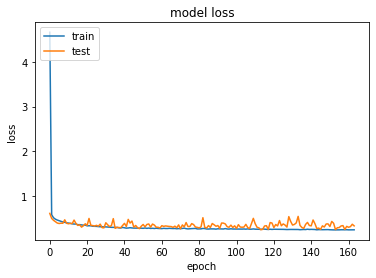

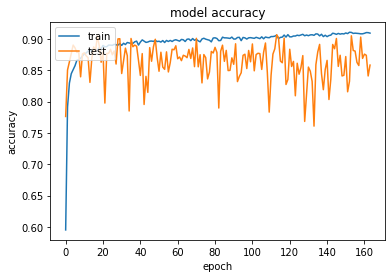

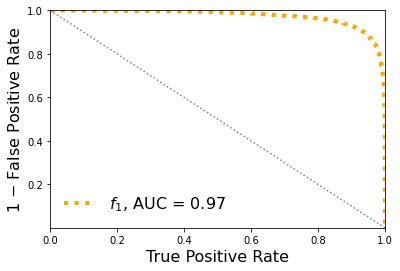

Classification score:


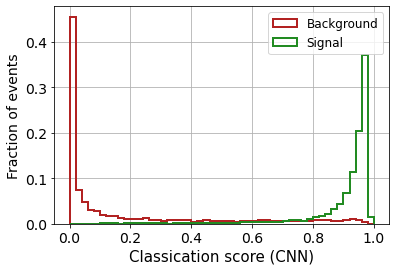


 ROC-AUC =  0.9731363840554159


In [40]:

# define the keras model
model = Sequential()
model.add(Conv1D(16, 3, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(16, 3, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [41]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.9731363840554159


Epoch 1/500
319/319 [==============================] - 2s 2ms/step - loss: 4.2272 - accuracy: 0.5531 - val_loss: 0.6749 - val_accuracy: 0.7581
Epoch 2/500
319/319 [==============================] - 1s 2ms/step - loss: 0.6885 - accuracy: 0.7636 - val_loss: 0.5261 - val_accuracy: 0.8627
Epoch 3/500
319/319 [==============================] - 1s 2ms/step - loss: 0.5508 - accuracy: 0.8375 - val_loss: 0.4425 - val_accuracy: 0.8848
Epoch 4/500
319/319 [==============================] - 1s 2ms/step - loss: 0.5035 - accuracy: 0.8546 - val_loss: 0.4376 - val_accuracy: 0.8780
Epoch 5/500
319/319 [==============================] - 1s 2ms/step - loss: 0.4660 - accuracy: 0.8673 - val_loss: 0.3994 - val_accuracy: 0.9028
Epoch 6/500
319/319 [==============================] - 1s 2ms/step - loss: 0.4421 - accuracy: 0.8736 - val_loss: 0.3902 - val_accuracy: 0.8923
Epoch 7/500
319/319 [==============================] - 1s 2ms/step - loss: 0.4157 - accuracy: 0.8808 - val_loss: 0.4016 - val_accuracy: 0.8802

Epoch 58/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2528 - accuracy: 0.9068 - val_loss: 0.3780 - val_accuracy: 0.8358
Epoch 59/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2535 - accuracy: 0.9049 - val_loss: 0.4113 - val_accuracy: 0.8286
Epoch 60/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2543 - accuracy: 0.9056 - val_loss: 0.3710 - val_accuracy: 0.8427
Epoch 61/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2514 - accuracy: 0.9080 - val_loss: 0.3690 - val_accuracy: 0.8362
Epoch 62/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2548 - accuracy: 0.9067 - val_loss: 0.2822 - val_accuracy: 0.8853
Epoch 63/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2597 - accuracy: 0.9011 - val_loss: 0.2812 - val_accuracy: 0.8848
Epoch 64/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2619 - accuracy: 0.9022 - val_loss: 0.2993 - val_accuracy:

Epoch 115/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2478 - accuracy: 0.9060 - val_loss: 0.3378 - val_accuracy: 0.8563
Epoch 116/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2411 - accuracy: 0.9108 - val_loss: 0.3310 - val_accuracy: 0.8583
Epoch 117/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.9077 - val_loss: 0.3093 - val_accuracy: 0.8688
Epoch 118/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2429 - accuracy: 0.9088 - val_loss: 0.3190 - val_accuracy: 0.8669
Epoch 119/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2396 - accuracy: 0.9073 - val_loss: 0.2845 - val_accuracy: 0.8867
Epoch 120/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2424 - accuracy: 0.9086 - val_loss: 0.3190 - val_accuracy: 0.8580
Epoch 121/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2460 - accuracy: 0.9096 - val_loss: 0.3690 - val_ac

319/319 [==============================] - 1s 2ms/step - loss: 0.2302 - accuracy: 0.9144 - val_loss: 0.2784 - val_accuracy: 0.8838
Epoch 228/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2273 - accuracy: 0.9138 - val_loss: 0.2507 - val_accuracy: 0.9016
Epoch 229/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2248 - accuracy: 0.9157 - val_loss: 0.2541 - val_accuracy: 0.9003
Epoch 230/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2315 - accuracy: 0.9150 - val_loss: 0.3143 - val_accuracy: 0.8638
Epoch 231/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2348 - accuracy: 0.9125 - val_loss: 0.2454 - val_accuracy: 0.9023
Epoch 232/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2266 - accuracy: 0.9143 - val_loss: 0.2412 - val_accuracy: 0.9057
Epoch 233/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2315 - accuracy: 0.9129 - val_loss: 0.2738 - val_accuracy: 0.8924

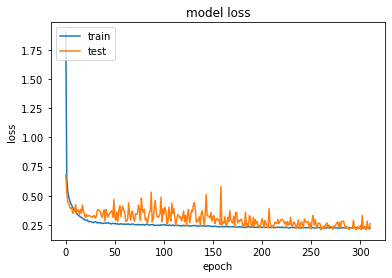

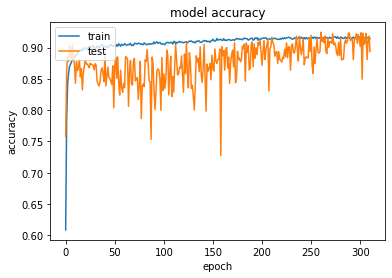

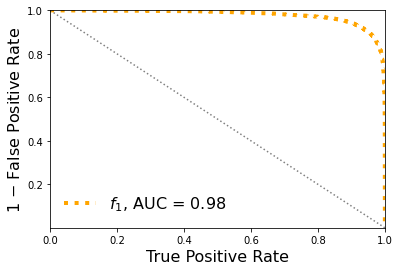

Classification score:


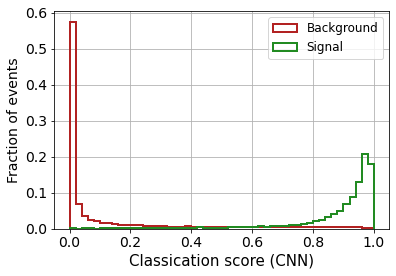


 ROC-AUC =  0.9781352954673918


In [42]:

# define the keras model
model = Sequential()
model.add(Conv1D(32, 3, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(32, 3, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [43]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.9781352954673918


##### 3 conv layers

Epoch 1/500
319/319 [==============================] - 2s 2ms/step - loss: 14.7402 - accuracy: 0.5150 - val_loss: 0.7364 - val_accuracy: 0.6077
Epoch 2/500
319/319 [==============================] - 0s 1ms/step - loss: 0.8889 - accuracy: 0.6111 - val_loss: 0.6574 - val_accuracy: 0.7338
Epoch 3/500
319/319 [==============================] - 0s 1ms/step - loss: 0.7025 - accuracy: 0.6915 - val_loss: 0.5973 - val_accuracy: 0.7792
Epoch 4/500
319/319 [==============================] - 0s 1ms/step - loss: 0.6307 - accuracy: 0.7555 - val_loss: 0.5544 - val_accuracy: 0.8213
Epoch 5/500
319/319 [==============================] - 0s 1ms/step - loss: 0.5752 - accuracy: 0.7913 - val_loss: 0.4879 - val_accuracy: 0.8388
Epoch 6/500
319/319 [==============================] - 0s 1ms/step - loss: 0.5152 - accuracy: 0.8235 - val_loss: 0.4468 - val_accuracy: 0.8634
Epoch 7/500
319/319 [==============================] - 0s 1ms/step - loss: 0.4875 - accuracy: 0.8377 - val_loss: 0.4355 - val_accuracy: 0.878

Epoch 58/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2621 - accuracy: 0.9063 - val_loss: 0.2632 - val_accuracy: 0.9035
Epoch 59/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2576 - accuracy: 0.9087 - val_loss: 0.3166 - val_accuracy: 0.8791
Epoch 60/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2510 - accuracy: 0.9085 - val_loss: 0.3800 - val_accuracy: 0.8472
Epoch 61/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2546 - accuracy: 0.9078 - val_loss: 0.2975 - val_accuracy: 0.8877
Epoch 62/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2562 - accuracy: 0.9080 - val_loss: 0.2828 - val_accuracy: 0.8842
Epoch 63/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2577 - accuracy: 0.9072 - val_loss: 0.3103 - val_accuracy: 0.8774
Epoch 64/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2554 - accuracy: 0.9088 - val_loss: 0.3241 - val_accuracy:

Epoch 115/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2350 - accuracy: 0.9129 - val_loss: 0.2349 - val_accuracy: 0.9102
Epoch 116/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2297 - accuracy: 0.9160 - val_loss: 0.2395 - val_accuracy: 0.9037
Epoch 117/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2286 - accuracy: 0.9174 - val_loss: 0.2782 - val_accuracy: 0.8892
Epoch 118/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2319 - accuracy: 0.9149 - val_loss: 0.2622 - val_accuracy: 0.8937
Epoch 119/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2353 - accuracy: 0.9125 - val_loss: 0.2449 - val_accuracy: 0.9037
Epoch 120/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2280 - accuracy: 0.9157 - val_loss: 0.2352 - val_accuracy: 0.9031
Epoch 121/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2338 - accuracy: 0.9128 - val_loss: 0.2669 - val_ac

319/319 [==============================] - 0s 1ms/step - loss: 0.2205 - accuracy: 0.9181 - val_loss: 0.2178 - val_accuracy: 0.9139
Epoch 228/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2160 - accuracy: 0.9185 - val_loss: 0.2137 - val_accuracy: 0.9199
Epoch 229/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2116 - accuracy: 0.9202 - val_loss: 0.2228 - val_accuracy: 0.9107
Epoch 230/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2125 - accuracy: 0.9211 - val_loss: 0.2221 - val_accuracy: 0.9150
Epoch 231/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2151 - accuracy: 0.9176 - val_loss: 0.2128 - val_accuracy: 0.9184
Epoch 232/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2153 - accuracy: 0.9198 - val_loss: 0.2111 - val_accuracy: 0.9239
Epoch 233/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2182 - accuracy: 0.9174 - val_loss: 0.2105 - val_accuracy: 0.9242

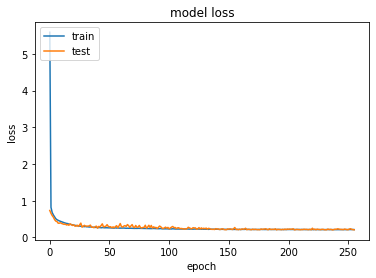

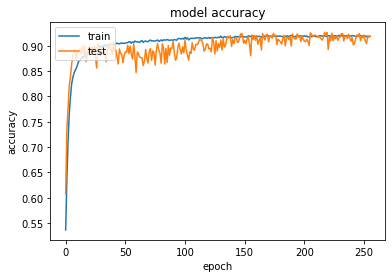

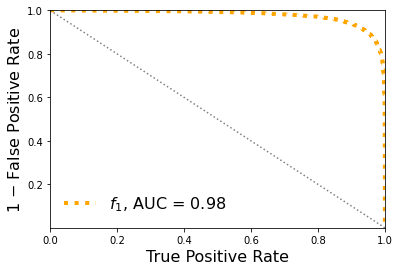

Classification score:


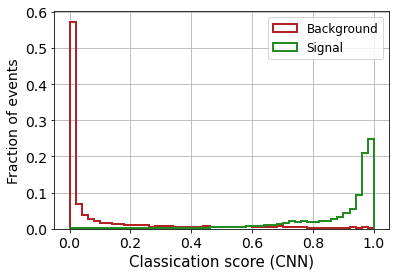


 ROC-AUC =  0.97704125942961


In [44]:

# define the keras model
model = Sequential()
model.add(Conv1D(8, 3, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(8, 3, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(8, 3, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [45]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.97704125942961


Epoch 1/500
319/319 [==============================] - 2s 2ms/step - loss: 14.0662 - accuracy: 0.5118 - val_loss: 0.8627 - val_accuracy: 0.5189
Epoch 2/500
319/319 [==============================] - 1s 2ms/step - loss: 0.9868 - accuracy: 0.5867 - val_loss: 0.7131 - val_accuracy: 0.7748
Epoch 3/500
319/319 [==============================] - 1s 2ms/step - loss: 0.7310 - accuracy: 0.7353 - val_loss: 0.6388 - val_accuracy: 0.7905
Epoch 4/500
319/319 [==============================] - 1s 2ms/step - loss: 0.6378 - accuracy: 0.7910 - val_loss: 0.5352 - val_accuracy: 0.8556
Epoch 5/500
319/319 [==============================] - 1s 2ms/step - loss: 0.5738 - accuracy: 0.8270 - val_loss: 0.4884 - val_accuracy: 0.8673
Epoch 6/500
319/319 [==============================] - 1s 2ms/step - loss: 0.5413 - accuracy: 0.8415 - val_loss: 0.4535 - val_accuracy: 0.8871
Epoch 7/500
319/319 [==============================] - 1s 2ms/step - loss: 0.5089 - accuracy: 0.8537 - val_loss: 0.4222 - val_accuracy: 0.895

Epoch 58/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2418 - accuracy: 0.9149 - val_loss: 0.2471 - val_accuracy: 0.9107
Epoch 59/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2490 - accuracy: 0.9137 - val_loss: 0.3012 - val_accuracy: 0.8813
Epoch 60/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2408 - accuracy: 0.9161 - val_loss: 0.2484 - val_accuracy: 0.9112
Epoch 61/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2484 - accuracy: 0.9109 - val_loss: 0.2593 - val_accuracy: 0.9030
Epoch 62/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2455 - accuracy: 0.9109 - val_loss: 0.2474 - val_accuracy: 0.9103
Epoch 63/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2353 - accuracy: 0.9156 - val_loss: 0.2839 - val_accuracy: 0.8885
Epoch 64/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2396 - accuracy: 0.9139 - val_loss: 0.2584 - val_accuracy:

Epoch 115/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2225 - accuracy: 0.9196 - val_loss: 0.2261 - val_accuracy: 0.9134
Epoch 116/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2301 - accuracy: 0.9146 - val_loss: 0.2209 - val_accuracy: 0.9189
Epoch 117/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2231 - accuracy: 0.9189 - val_loss: 0.2155 - val_accuracy: 0.9214
Epoch 118/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2318 - accuracy: 0.9149 - val_loss: 0.2144 - val_accuracy: 0.9202
Epoch 119/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2125 - accuracy: 0.9213 - val_loss: 0.2272 - val_accuracy: 0.9141
Epoch 120/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2253 - accuracy: 0.9164 - val_loss: 0.2242 - val_accuracy: 0.9205
Epoch 121/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2272 - accuracy: 0.9163 - val_loss: 0.2227 - val_ac

319/319 [==============================] - 1s 2ms/step - loss: 0.2110 - accuracy: 0.9208 - val_loss: 0.2124 - val_accuracy: 0.9228
Epoch 228/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2108 - accuracy: 0.9213 - val_loss: 0.2035 - val_accuracy: 0.9259
Epoch 229/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2132 - accuracy: 0.9197 - val_loss: 0.2103 - val_accuracy: 0.9157
Epoch 230/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2075 - accuracy: 0.9226 - val_loss: 0.2328 - val_accuracy: 0.9092
Epoch 231/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2074 - accuracy: 0.9198 - val_loss: 0.2082 - val_accuracy: 0.9217
Epoch 232/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2074 - accuracy: 0.9214 - val_loss: 0.2248 - val_accuracy: 0.9160
Epoch 233/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2098 - accuracy: 0.9211 - val_loss: 0.2072 - val_accuracy: 0.9231

319/319 [==============================] - 1s 2ms/step - loss: 0.2070 - accuracy: 0.9211 - val_loss: 0.2137 - val_accuracy: 0.9189
Epoch 340/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2068 - accuracy: 0.9208 - val_loss: 0.2118 - val_accuracy: 0.9171
Epoch 341/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2085 - accuracy: 0.9225 - val_loss: 0.2030 - val_accuracy: 0.9263
Epoch 342/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2112 - accuracy: 0.9185 - val_loss: 0.2046 - val_accuracy: 0.9235
Epoch 343/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2009 - accuracy: 0.9234 - val_loss: 0.2022 - val_accuracy: 0.9250
Epoch 344/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2053 - accuracy: 0.9238 - val_loss: 0.2046 - val_accuracy: 0.9217
Epoch 345/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2040 - accuracy: 0.9239 - val_loss: 0.2191 - val_accuracy: 0.9117

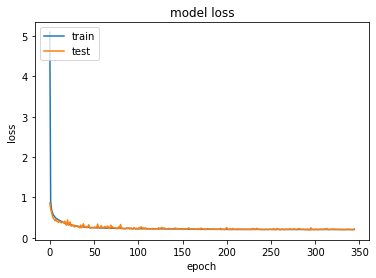

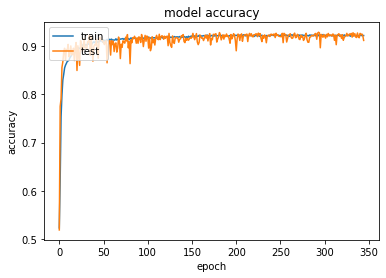

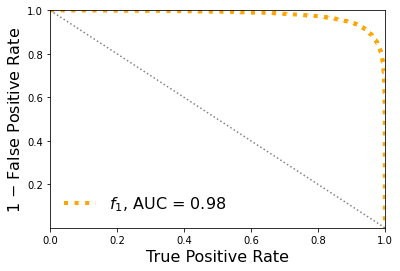

Classification score:


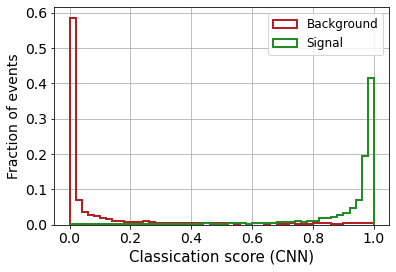


 ROC-AUC =  0.9790751480404002


In [46]:

# define the keras model
model = Sequential()
model.add(Conv1D(16, 3, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(16, 3, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(16, 3, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [47]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.9790751480404002


Epoch 1/500
319/319 [==============================] - 2s 3ms/step - loss: 4.7558 - accuracy: 0.5634 - val_loss: 0.8596 - val_accuracy: 0.7558
Epoch 2/500
319/319 [==============================] - 1s 2ms/step - loss: 0.8512 - accuracy: 0.7437 - val_loss: 0.7216 - val_accuracy: 0.8501
Epoch 3/500
319/319 [==============================] - 1s 2ms/step - loss: 0.7352 - accuracy: 0.8061 - val_loss: 0.6282 - val_accuracy: 0.8852
Epoch 4/500
319/319 [==============================] - 1s 2ms/step - loss: 0.6594 - accuracy: 0.8348 - val_loss: 0.5519 - val_accuracy: 0.8890
Epoch 5/500
319/319 [==============================] - 1s 2ms/step - loss: 0.6167 - accuracy: 0.8490 - val_loss: 0.5134 - val_accuracy: 0.9007
Epoch 6/500
319/319 [==============================] - 1s 2ms/step - loss: 0.5679 - accuracy: 0.8633 - val_loss: 0.5103 - val_accuracy: 0.8902
Epoch 7/500
319/319 [==============================] - 1s 2ms/step - loss: 0.5491 - accuracy: 0.8626 - val_loss: 0.4584 - val_accuracy: 0.9009

Epoch 58/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2292 - accuracy: 0.9161 - val_loss: 0.2165 - val_accuracy: 0.9216
Epoch 59/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2256 - accuracy: 0.9174 - val_loss: 0.2477 - val_accuracy: 0.9013
Epoch 60/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2258 - accuracy: 0.9185 - val_loss: 0.2337 - val_accuracy: 0.9167
Epoch 61/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2241 - accuracy: 0.9178 - val_loss: 0.2170 - val_accuracy: 0.9216
Epoch 62/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2259 - accuracy: 0.9181 - val_loss: 0.2224 - val_accuracy: 0.9185
Epoch 63/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2217 - accuracy: 0.9197 - val_loss: 0.2093 - val_accuracy: 0.9252
Epoch 64/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2219 - accuracy: 0.9194 - val_loss: 0.2213 - val_accuracy:

Epoch 115/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2139 - accuracy: 0.9223 - val_loss: 0.2293 - val_accuracy: 0.9164
Epoch 116/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2123 - accuracy: 0.9225 - val_loss: 0.2116 - val_accuracy: 0.9243
Epoch 117/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2142 - accuracy: 0.9199 - val_loss: 0.2036 - val_accuracy: 0.9278
Epoch 118/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2147 - accuracy: 0.9192 - val_loss: 0.2128 - val_accuracy: 0.9173
Epoch 119/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2156 - accuracy: 0.9216 - val_loss: 0.2046 - val_accuracy: 0.9248
Epoch 120/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2202 - accuracy: 0.9193 - val_loss: 0.2055 - val_accuracy: 0.9250
Epoch 121/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2158 - accuracy: 0.9205 - val_loss: 0.2099 - val_ac

319/319 [==============================] - 1s 2ms/step - loss: 0.2115 - accuracy: 0.9219 - val_loss: 0.2140 - val_accuracy: 0.9164
Epoch 228/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2072 - accuracy: 0.9231 - val_loss: 0.2167 - val_accuracy: 0.9144
Epoch 229/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2075 - accuracy: 0.9231 - val_loss: 0.2103 - val_accuracy: 0.9187
Epoch 230/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2082 - accuracy: 0.9228 - val_loss: 0.2228 - val_accuracy: 0.9132
Epoch 231/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2124 - accuracy: 0.9210 - val_loss: 0.1980 - val_accuracy: 0.9271
Epoch 232/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2052 - accuracy: 0.9245 - val_loss: 0.2040 - val_accuracy: 0.9242
Epoch 233/500
319/319 [==============================] - 1s 2ms/step - loss: 0.2107 - accuracy: 0.9220 - val_loss: 0.2159 - val_accuracy: 0.9169

319/319 [==============================] - 1s 2ms/step - loss: 0.2049 - accuracy: 0.9224 - val_loss: 0.2004 - val_accuracy: 0.9268
Restoring model weights from the end of the best epoch.
Epoch 00339: early stopping


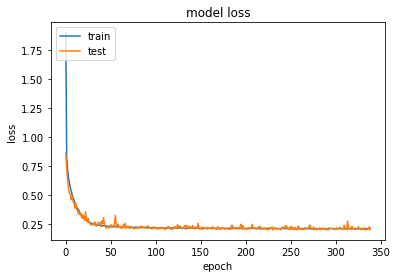

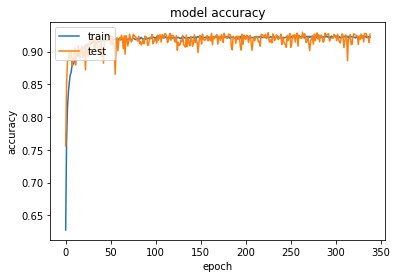

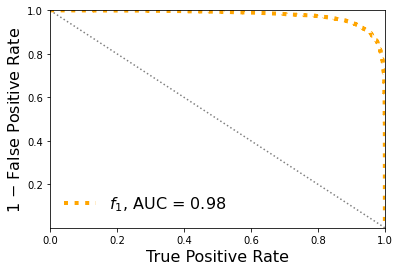

Classification score:


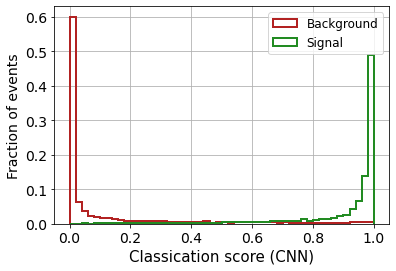


 ROC-AUC =  0.9789739070906394


In [48]:

# define the keras model
model = Sequential()
model.add(Conv1D(32, 3, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(32, 3, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(32, 3, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [49]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.9789739070906394


Epoch 1/500
319/319 [==============================] - 2s 1ms/step - loss: 21.0824 - accuracy: 0.5060 - val_loss: 0.7000 - val_accuracy: 0.5104
Epoch 2/500
319/319 [==============================] - 0s 929us/step - loss: 0.7009 - accuracy: 0.4981 - val_loss: 0.6993 - val_accuracy: 0.5104
Epoch 3/500
319/319 [==============================] - 0s 923us/step - loss: 0.7002 - accuracy: 0.4982 - val_loss: 0.7298 - val_accuracy: 0.5105
Epoch 4/500
319/319 [==============================] - 0s 919us/step - loss: 0.7008 - accuracy: 0.5047 - val_loss: 0.6984 - val_accuracy: 0.4931
Epoch 5/500
319/319 [==============================] - 0s 960us/step - loss: 0.6990 - accuracy: 0.5058 - val_loss: 0.6985 - val_accuracy: 0.4931
Epoch 6/500
319/319 [==============================] - 0s 930us/step - loss: 0.6986 - accuracy: 0.5047 - val_loss: 0.6981 - val_accuracy: 0.4931
Epoch 7/500
319/319 [==============================] - 0s 931us/step - loss: 0.6986 - accuracy: 0.5012 - val_loss: 0.6971 - val_acc

319/319 [==============================] - 0s 980us/step - loss: 0.6906 - accuracy: 0.5077 - val_loss: 0.6914 - val_accuracy: 0.5107
Epoch 114/500
319/319 [==============================] - 0s 984us/step - loss: 0.6909 - accuracy: 0.5015 - val_loss: 0.6914 - val_accuracy: 0.4931
Epoch 115/500
319/319 [==============================] - 0s 957us/step - loss: 0.6911 - accuracy: 0.5060 - val_loss: 0.6914 - val_accuracy: 0.4931
Epoch 116/500
319/319 [==============================] - 0s 975us/step - loss: 0.6904 - accuracy: 0.5015 - val_loss: 0.6911 - val_accuracy: 0.5107
Epoch 117/500
319/319 [==============================] - 0s 975us/step - loss: 0.6904 - accuracy: 0.5006 - val_loss: 0.6912 - val_accuracy: 0.5103
Epoch 118/500
319/319 [==============================] - 0s 946us/step - loss: 0.6904 - accuracy: 0.5044 - val_loss: 0.6916 - val_accuracy: 0.4931
Epoch 119/500
319/319 [==============================] - 0s 933us/step - loss: 0.6904 - accuracy: 0.4967 - val_loss: 0.6924 - val_ac

Epoch 169/500
319/319 [==============================] - 0s 942us/step - loss: 0.3739 - accuracy: 0.8432 - val_loss: 0.2685 - val_accuracy: 0.9173
Epoch 170/500
319/319 [==============================] - 0s 987us/step - loss: 0.3837 - accuracy: 0.8372 - val_loss: 0.2628 - val_accuracy: 0.9203
Epoch 171/500
319/319 [==============================] - 0s 985us/step - loss: 0.3771 - accuracy: 0.8400 - val_loss: 0.2530 - val_accuracy: 0.9253
Epoch 172/500
319/319 [==============================] - 0s 968us/step - loss: 0.3799 - accuracy: 0.8389 - val_loss: 0.2522 - val_accuracy: 0.9266
Epoch 173/500
319/319 [==============================] - 0s 960us/step - loss: 0.3790 - accuracy: 0.8383 - val_loss: 0.2515 - val_accuracy: 0.9263
Epoch 174/500
319/319 [==============================] - 0s 1000us/step - loss: 0.3828 - accuracy: 0.8377 - val_loss: 0.2580 - val_accuracy: 0.9205
Epoch 175/500
319/319 [==============================] - 0s 978us/step - loss: 0.3787 - accuracy: 0.8399 - val_loss: 

Epoch 225/500
319/319 [==============================] - 0s 961us/step - loss: 0.3782 - accuracy: 0.8393 - val_loss: 0.2486 - val_accuracy: 0.9264
Epoch 226/500
319/319 [==============================] - 0s 953us/step - loss: 0.3741 - accuracy: 0.8435 - val_loss: 0.2488 - val_accuracy: 0.9259
Epoch 227/500
319/319 [==============================] - 0s 961us/step - loss: 0.3784 - accuracy: 0.8391 - val_loss: 0.2537 - val_accuracy: 0.9231
Epoch 228/500
319/319 [==============================] - 0s 963us/step - loss: 0.3826 - accuracy: 0.8390 - val_loss: 0.2482 - val_accuracy: 0.9273
Epoch 229/500
319/319 [==============================] - 0s 959us/step - loss: 0.3780 - accuracy: 0.8399 - val_loss: 0.2526 - val_accuracy: 0.9255
Epoch 230/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3764 - accuracy: 0.8408 - val_loss: 0.2487 - val_accuracy: 0.9268
Epoch 231/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3806 - accuracy: 0.8372 - val_loss: 0.253

Epoch 281/500
319/319 [==============================] - 0s 929us/step - loss: 0.3831 - accuracy: 0.8367 - val_loss: 0.2505 - val_accuracy: 0.9274
Epoch 282/500
319/319 [==============================] - 0s 944us/step - loss: 0.3726 - accuracy: 0.8430 - val_loss: 0.2472 - val_accuracy: 0.9266
Epoch 283/500
319/319 [==============================] - 0s 946us/step - loss: 0.3800 - accuracy: 0.8374 - val_loss: 0.2497 - val_accuracy: 0.9266
Epoch 284/500
319/319 [==============================] - 0s 935us/step - loss: 0.3736 - accuracy: 0.8422 - val_loss: 0.2716 - val_accuracy: 0.9149
Epoch 285/500
319/319 [==============================] - 0s 943us/step - loss: 0.3797 - accuracy: 0.8395 - val_loss: 0.2522 - val_accuracy: 0.9252
Epoch 286/500
319/319 [==============================] - 0s 946us/step - loss: 0.3726 - accuracy: 0.8441 - val_loss: 0.2486 - val_accuracy: 0.9266
Epoch 287/500
319/319 [==============================] - 0s 957us/step - loss: 0.3733 - accuracy: 0.8436 - val_loss: 0

Epoch 337/500
319/319 [==============================] - 0s 923us/step - loss: 0.2673 - accuracy: 0.9023 - val_loss: 0.2148 - val_accuracy: 0.9246
Epoch 338/500
319/319 [==============================] - 0s 938us/step - loss: 0.2618 - accuracy: 0.9025 - val_loss: 0.2085 - val_accuracy: 0.9262
Epoch 339/500
319/319 [==============================] - 0s 938us/step - loss: 0.2631 - accuracy: 0.9023 - val_loss: 0.2140 - val_accuracy: 0.9249
Epoch 340/500
319/319 [==============================] - 0s 944us/step - loss: 0.2676 - accuracy: 0.8992 - val_loss: 0.2228 - val_accuracy: 0.9185
Epoch 341/500
319/319 [==============================] - 0s 945us/step - loss: 0.2632 - accuracy: 0.9026 - val_loss: 0.2072 - val_accuracy: 0.9263
Epoch 342/500
319/319 [==============================] - 0s 932us/step - loss: 0.2631 - accuracy: 0.9026 - val_loss: 0.2130 - val_accuracy: 0.9232
Epoch 343/500
319/319 [==============================] - 0s 950us/step - loss: 0.2611 - accuracy: 0.9034 - val_loss: 0

Epoch 393/500
319/319 [==============================] - 0s 942us/step - loss: 0.2603 - accuracy: 0.9039 - val_loss: 0.2100 - val_accuracy: 0.9237
Epoch 394/500
319/319 [==============================] - 0s 982us/step - loss: 0.2620 - accuracy: 0.9027 - val_loss: 0.2076 - val_accuracy: 0.9262
Epoch 395/500
319/319 [==============================] - 0s 954us/step - loss: 0.2593 - accuracy: 0.9030 - val_loss: 0.2099 - val_accuracy: 0.9255
Epoch 396/500
319/319 [==============================] - 0s 932us/step - loss: 0.2659 - accuracy: 0.9005 - val_loss: 0.2068 - val_accuracy: 0.9259
Epoch 397/500
319/319 [==============================] - 0s 939us/step - loss: 0.2611 - accuracy: 0.9037 - val_loss: 0.2135 - val_accuracy: 0.9252
Epoch 398/500
319/319 [==============================] - 0s 939us/step - loss: 0.2570 - accuracy: 0.9043 - val_loss: 0.2141 - val_accuracy: 0.9224
Epoch 399/500
319/319 [==============================] - 0s 939us/step - loss: 0.2576 - accuracy: 0.9043 - val_loss: 0

Epoch 449/500
319/319 [==============================] - 0s 984us/step - loss: 0.2555 - accuracy: 0.9057 - val_loss: 0.2066 - val_accuracy: 0.9264
Epoch 450/500
319/319 [==============================] - 0s 964us/step - loss: 0.2596 - accuracy: 0.9041 - val_loss: 0.2086 - val_accuracy: 0.9267
Epoch 451/500
319/319 [==============================] - 0s 934us/step - loss: 0.2704 - accuracy: 0.8998 - val_loss: 0.2107 - val_accuracy: 0.9246
Epoch 452/500
319/319 [==============================] - 0s 944us/step - loss: 0.2586 - accuracy: 0.9036 - val_loss: 0.2066 - val_accuracy: 0.9273
Epoch 453/500
319/319 [==============================] - 0s 934us/step - loss: 0.2564 - accuracy: 0.9059 - val_loss: 0.2070 - val_accuracy: 0.9273
Epoch 454/500
319/319 [==============================] - 0s 947us/step - loss: 0.2640 - accuracy: 0.9014 - val_loss: 0.2048 - val_accuracy: 0.9268
Epoch 455/500
319/319 [==============================] - 0s 936us/step - loss: 0.2584 - accuracy: 0.9051 - val_loss: 0

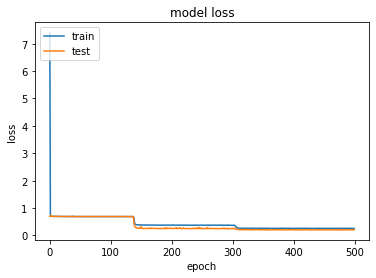

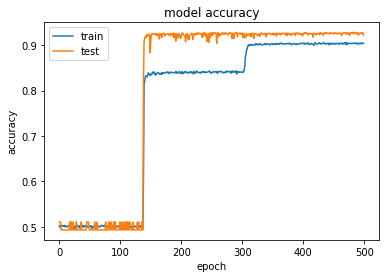

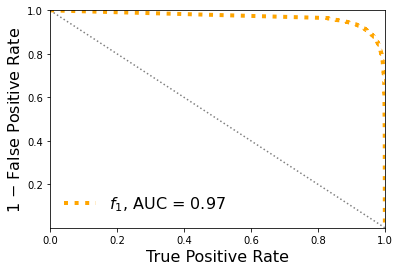

Classification score:


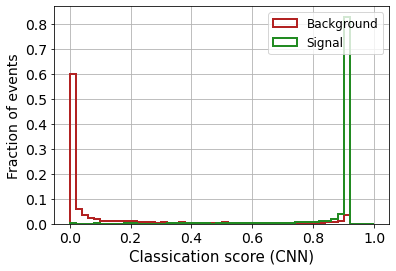


 ROC-AUC =  0.9701441211867984


In [27]:

# define the keras model
model = Sequential()
model.add(Conv1D(16, 2, input_shape=(X_mon_train.shape[1],1), activation='relu', strides = (1),kernel_regularizer=l2(0.005)))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Flatten())
model.add(Dense(10, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

## 1A. Remove HITS and diff T (14 feats)

In [62]:
# concatenate the data
X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2 ],axis=1)
X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2 ],axis=1)

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

X_mon_B.shape:  (32015, 14)
X_mon_S.shape:  (32015, 14)
X_mon.shape:  (64030, 14)

X_mon_train :  (40818, 14)
y_mon_train :  (40818,)
X_mon_val :  (7204, 14)
y_mon_val :  (7204,)
X_mon_test :  (16008, 14)
y_mon_test :  (16008,)



### XGBoost

[0]	validation_0-logloss:0.68743	validation_1-logloss:0.68739
[1]	validation_0-logloss:0.68183	validation_1-logloss:0.68174
[2]	validation_0-logloss:0.67630	validation_1-logloss:0.67620
[3]	validation_0-logloss:0.67089	validation_1-logloss:0.67077
[4]	validation_0-logloss:0.66558	validation_1-logloss:0.66546


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[5]	validation_0-logloss:0.66038	validation_1-logloss:0.66022
[6]	validation_0-logloss:0.65526	validation_1-logloss:0.65511
[7]	validation_0-logloss:0.65024	validation_1-logloss:0.65005
[8]	validation_0-logloss:0.64530	validation_1-logloss:0.64513
[9]	validation_0-logloss:0.64047	validation_1-logloss:0.64025
[10]	validation_0-logloss:0.63572	validation_1-logloss:0.63552
[11]	validation_0-logloss:0.63103	validation_1-logloss:0.63078
[12]	validation_0-logloss:0.62645	validation_1-logloss:0.62619
[13]	validation_0-logloss:0.62195	validation_1-logloss:0.62165
[14]	validation_0-logloss:0.61752	validation_1-logloss:0.61724
[15]	validation_0-logloss:0.61313	validation_1-logloss:0.61281
[16]	validation_0-logloss:0.60885	validation_1-logloss:0.60854
[17]	validation_0-logloss:0.60463	validation_1-logloss:0.60428
[18]	validation_0-logloss:0.60049	validation_1-logloss:0.60015
[19]	validation_0-logloss:0.59641	validation_1-logloss:0.59603
[20]	validation_0-logloss:0.59239	validation_1-logloss:0.592

[135]	validation_0-logloss:0.36435	validation_1-logloss:0.36577
[136]	validation_0-logloss:0.36347	validation_1-logloss:0.36492
[137]	validation_0-logloss:0.36257	validation_1-logloss:0.36406
[138]	validation_0-logloss:0.36164	validation_1-logloss:0.36318
[139]	validation_0-logloss:0.36076	validation_1-logloss:0.36233
[140]	validation_0-logloss:0.35992	validation_1-logloss:0.36153
[141]	validation_0-logloss:0.35904	validation_1-logloss:0.36069
[142]	validation_0-logloss:0.35821	validation_1-logloss:0.35989
[143]	validation_0-logloss:0.35734	validation_1-logloss:0.35907
[144]	validation_0-logloss:0.35648	validation_1-logloss:0.35825
[145]	validation_0-logloss:0.35563	validation_1-logloss:0.35745
[146]	validation_0-logloss:0.35480	validation_1-logloss:0.35665
[147]	validation_0-logloss:0.35401	validation_1-logloss:0.35591
[148]	validation_0-logloss:0.35319	validation_1-logloss:0.35514
[149]	validation_0-logloss:0.35240	validation_1-logloss:0.35439
[150]	validation_0-logloss:0.35158	valid

[264]	validation_0-logloss:0.29678	validation_1-logloss:0.30307
[265]	validation_0-logloss:0.29652	validation_1-logloss:0.30286
[266]	validation_0-logloss:0.29626	validation_1-logloss:0.30264
[267]	validation_0-logloss:0.29598	validation_1-logloss:0.30239
[268]	validation_0-logloss:0.29570	validation_1-logloss:0.30213
[269]	validation_0-logloss:0.29542	validation_1-logloss:0.30188
[270]	validation_0-logloss:0.29514	validation_1-logloss:0.30164
[271]	validation_0-logloss:0.29490	validation_1-logloss:0.30145
[272]	validation_0-logloss:0.29463	validation_1-logloss:0.30121
[273]	validation_0-logloss:0.29434	validation_1-logloss:0.30096
[274]	validation_0-logloss:0.29409	validation_1-logloss:0.30071
[275]	validation_0-logloss:0.29381	validation_1-logloss:0.30048
[276]	validation_0-logloss:0.29355	validation_1-logloss:0.30025
[277]	validation_0-logloss:0.29329	validation_1-logloss:0.30001
[278]	validation_0-logloss:0.29304	validation_1-logloss:0.29979
[279]	validation_0-logloss:0.29282	valid

[393]	validation_0-logloss:0.27189	validation_1-logloss:0.28267
[394]	validation_0-logloss:0.27174	validation_1-logloss:0.28254
[395]	validation_0-logloss:0.27159	validation_1-logloss:0.28244
[396]	validation_0-logloss:0.27146	validation_1-logloss:0.28234
[397]	validation_0-logloss:0.27135	validation_1-logloss:0.28225
[398]	validation_0-logloss:0.27122	validation_1-logloss:0.28215
[399]	validation_0-logloss:0.27111	validation_1-logloss:0.28208
[400]	validation_0-logloss:0.27097	validation_1-logloss:0.28197
[401]	validation_0-logloss:0.27084	validation_1-logloss:0.28189
[402]	validation_0-logloss:0.27069	validation_1-logloss:0.28177
[403]	validation_0-logloss:0.27057	validation_1-logloss:0.28167
[404]	validation_0-logloss:0.27046	validation_1-logloss:0.28159
[405]	validation_0-logloss:0.27031	validation_1-logloss:0.28149
[406]	validation_0-logloss:0.27017	validation_1-logloss:0.28140
[407]	validation_0-logloss:0.27005	validation_1-logloss:0.28131
[408]	validation_0-logloss:0.26992	valid

[522]	validation_0-logloss:0.25832	validation_1-logloss:0.27401
[523]	validation_0-logloss:0.25825	validation_1-logloss:0.27397
[524]	validation_0-logloss:0.25817	validation_1-logloss:0.27392
[525]	validation_0-logloss:0.25810	validation_1-logloss:0.27389
[526]	validation_0-logloss:0.25803	validation_1-logloss:0.27384
[527]	validation_0-logloss:0.25794	validation_1-logloss:0.27379
[528]	validation_0-logloss:0.25787	validation_1-logloss:0.27375
[529]	validation_0-logloss:0.25779	validation_1-logloss:0.27370
[530]	validation_0-logloss:0.25771	validation_1-logloss:0.27366
[531]	validation_0-logloss:0.25765	validation_1-logloss:0.27362
[532]	validation_0-logloss:0.25756	validation_1-logloss:0.27357
[533]	validation_0-logloss:0.25749	validation_1-logloss:0.27353
[534]	validation_0-logloss:0.25740	validation_1-logloss:0.27348
[535]	validation_0-logloss:0.25732	validation_1-logloss:0.27343
[536]	validation_0-logloss:0.25724	validation_1-logloss:0.27338
[537]	validation_0-logloss:0.25716	valid

[651]	validation_0-logloss:0.24929	validation_1-logloss:0.26928
[652]	validation_0-logloss:0.24923	validation_1-logloss:0.26925
[653]	validation_0-logloss:0.24917	validation_1-logloss:0.26922
[654]	validation_0-logloss:0.24912	validation_1-logloss:0.26919
[655]	validation_0-logloss:0.24905	validation_1-logloss:0.26916
[656]	validation_0-logloss:0.24899	validation_1-logloss:0.26913
[657]	validation_0-logloss:0.24892	validation_1-logloss:0.26910
[658]	validation_0-logloss:0.24885	validation_1-logloss:0.26907
[659]	validation_0-logloss:0.24876	validation_1-logloss:0.26903
[660]	validation_0-logloss:0.24871	validation_1-logloss:0.26900
[661]	validation_0-logloss:0.24863	validation_1-logloss:0.26896
[662]	validation_0-logloss:0.24858	validation_1-logloss:0.26895
[663]	validation_0-logloss:0.24854	validation_1-logloss:0.26893
[664]	validation_0-logloss:0.24848	validation_1-logloss:0.26890
[665]	validation_0-logloss:0.24843	validation_1-logloss:0.26885
[666]	validation_0-logloss:0.24837	valid

[780]	validation_0-logloss:0.24238	validation_1-logloss:0.26615
[781]	validation_0-logloss:0.24233	validation_1-logloss:0.26613
[782]	validation_0-logloss:0.24228	validation_1-logloss:0.26610
[783]	validation_0-logloss:0.24223	validation_1-logloss:0.26607
[784]	validation_0-logloss:0.24218	validation_1-logloss:0.26605
[785]	validation_0-logloss:0.24212	validation_1-logloss:0.26603
[786]	validation_0-logloss:0.24208	validation_1-logloss:0.26603
[787]	validation_0-logloss:0.24203	validation_1-logloss:0.26599
[788]	validation_0-logloss:0.24199	validation_1-logloss:0.26597
[789]	validation_0-logloss:0.24196	validation_1-logloss:0.26597
[790]	validation_0-logloss:0.24189	validation_1-logloss:0.26595
[791]	validation_0-logloss:0.24185	validation_1-logloss:0.26593
[792]	validation_0-logloss:0.24181	validation_1-logloss:0.26591
[793]	validation_0-logloss:0.24175	validation_1-logloss:0.26590
[794]	validation_0-logloss:0.24171	validation_1-logloss:0.26589
[795]	validation_0-logloss:0.24168	valid

[909]	validation_0-logloss:0.23702	validation_1-logloss:0.26419
[910]	validation_0-logloss:0.23700	validation_1-logloss:0.26419
[911]	validation_0-logloss:0.23697	validation_1-logloss:0.26418
[912]	validation_0-logloss:0.23692	validation_1-logloss:0.26416
[913]	validation_0-logloss:0.23688	validation_1-logloss:0.26415
[914]	validation_0-logloss:0.23686	validation_1-logloss:0.26415
[915]	validation_0-logloss:0.23681	validation_1-logloss:0.26413
[916]	validation_0-logloss:0.23678	validation_1-logloss:0.26411
[917]	validation_0-logloss:0.23673	validation_1-logloss:0.26409
[918]	validation_0-logloss:0.23670	validation_1-logloss:0.26408
[919]	validation_0-logloss:0.23668	validation_1-logloss:0.26408
[920]	validation_0-logloss:0.23665	validation_1-logloss:0.26409
[921]	validation_0-logloss:0.23661	validation_1-logloss:0.26408
[922]	validation_0-logloss:0.23657	validation_1-logloss:0.26407
[923]	validation_0-logloss:0.23652	validation_1-logloss:0.26406
[924]	validation_0-logloss:0.23648	valid

[1037]	validation_0-logloss:0.23214	validation_1-logloss:0.26268
[1038]	validation_0-logloss:0.23209	validation_1-logloss:0.26266
[1039]	validation_0-logloss:0.23205	validation_1-logloss:0.26266
[1040]	validation_0-logloss:0.23201	validation_1-logloss:0.26266
[1041]	validation_0-logloss:0.23196	validation_1-logloss:0.26263
[1042]	validation_0-logloss:0.23193	validation_1-logloss:0.26262
[1043]	validation_0-logloss:0.23189	validation_1-logloss:0.26261
[1044]	validation_0-logloss:0.23186	validation_1-logloss:0.26261
[1045]	validation_0-logloss:0.23183	validation_1-logloss:0.26261
[1046]	validation_0-logloss:0.23180	validation_1-logloss:0.26260
[1047]	validation_0-logloss:0.23178	validation_1-logloss:0.26260
[1048]	validation_0-logloss:0.23174	validation_1-logloss:0.26259
[1049]	validation_0-logloss:0.23170	validation_1-logloss:0.26258
[1050]	validation_0-logloss:0.23168	validation_1-logloss:0.26257
[1051]	validation_0-logloss:0.23165	validation_1-logloss:0.26256
[1052]	validation_0-loglo

[1164]	validation_0-logloss:0.22792	validation_1-logloss:0.26181
[1165]	validation_0-logloss:0.22789	validation_1-logloss:0.26181
[1166]	validation_0-logloss:0.22787	validation_1-logloss:0.26180
[1167]	validation_0-logloss:0.22784	validation_1-logloss:0.26179
[1168]	validation_0-logloss:0.22780	validation_1-logloss:0.26178
[1169]	validation_0-logloss:0.22778	validation_1-logloss:0.26177
[1170]	validation_0-logloss:0.22776	validation_1-logloss:0.26177
[1171]	validation_0-logloss:0.22773	validation_1-logloss:0.26175
[1172]	validation_0-logloss:0.22769	validation_1-logloss:0.26175
[1173]	validation_0-logloss:0.22766	validation_1-logloss:0.26173
[1174]	validation_0-logloss:0.22762	validation_1-logloss:0.26173
[1175]	validation_0-logloss:0.22759	validation_1-logloss:0.26173
[1176]	validation_0-logloss:0.22756	validation_1-logloss:0.26173
[1177]	validation_0-logloss:0.22753	validation_1-logloss:0.26172
[1178]	validation_0-logloss:0.22751	validation_1-logloss:0.26172
[1179]	validation_0-loglo

[1291]	validation_0-logloss:0.22423	validation_1-logloss:0.26128
[1292]	validation_0-logloss:0.22419	validation_1-logloss:0.26127
[1293]	validation_0-logloss:0.22417	validation_1-logloss:0.26126
[1294]	validation_0-logloss:0.22414	validation_1-logloss:0.26127
[1295]	validation_0-logloss:0.22412	validation_1-logloss:0.26126
[1296]	validation_0-logloss:0.22409	validation_1-logloss:0.26126
[1297]	validation_0-logloss:0.22405	validation_1-logloss:0.26125
[1298]	validation_0-logloss:0.22403	validation_1-logloss:0.26125
[1299]	validation_0-logloss:0.22401	validation_1-logloss:0.26124
[1300]	validation_0-logloss:0.22399	validation_1-logloss:0.26124
[1301]	validation_0-logloss:0.22398	validation_1-logloss:0.26124
[1302]	validation_0-logloss:0.22394	validation_1-logloss:0.26123
[1303]	validation_0-logloss:0.22392	validation_1-logloss:0.26124
[1304]	validation_0-logloss:0.22389	validation_1-logloss:0.26123
[1305]	validation_0-logloss:0.22386	validation_1-logloss:0.26121
[1306]	validation_0-loglo

[1418]	validation_0-logloss:0.22054	validation_1-logloss:0.26091
[1419]	validation_0-logloss:0.22052	validation_1-logloss:0.26091
[1420]	validation_0-logloss:0.22048	validation_1-logloss:0.26090
[1421]	validation_0-logloss:0.22045	validation_1-logloss:0.26089
[1422]	validation_0-logloss:0.22041	validation_1-logloss:0.26088
[1423]	validation_0-logloss:0.22038	validation_1-logloss:0.26087
[1424]	validation_0-logloss:0.22034	validation_1-logloss:0.26088
[1425]	validation_0-logloss:0.22032	validation_1-logloss:0.26088
[1426]	validation_0-logloss:0.22029	validation_1-logloss:0.26086
[1427]	validation_0-logloss:0.22026	validation_1-logloss:0.26085
[1428]	validation_0-logloss:0.22024	validation_1-logloss:0.26085
[1429]	validation_0-logloss:0.22021	validation_1-logloss:0.26085
[1430]	validation_0-logloss:0.22017	validation_1-logloss:0.26084
[1431]	validation_0-logloss:0.22014	validation_1-logloss:0.26084
[1432]	validation_0-logloss:0.22011	validation_1-logloss:0.26085
[1433]	validation_0-loglo

[1545]	validation_0-logloss:0.21710	validation_1-logloss:0.26050
[1546]	validation_0-logloss:0.21709	validation_1-logloss:0.26049
[1547]	validation_0-logloss:0.21706	validation_1-logloss:0.26049
[1548]	validation_0-logloss:0.21704	validation_1-logloss:0.26048
[1549]	validation_0-logloss:0.21701	validation_1-logloss:0.26048
[1550]	validation_0-logloss:0.21697	validation_1-logloss:0.26047
[1551]	validation_0-logloss:0.21695	validation_1-logloss:0.26047
[1552]	validation_0-logloss:0.21692	validation_1-logloss:0.26048
[1553]	validation_0-logloss:0.21691	validation_1-logloss:0.26049
[1554]	validation_0-logloss:0.21688	validation_1-logloss:0.26050
[1555]	validation_0-logloss:0.21685	validation_1-logloss:0.26050
[1556]	validation_0-logloss:0.21682	validation_1-logloss:0.26050
[1557]	validation_0-logloss:0.21680	validation_1-logloss:0.26049
[1558]	validation_0-logloss:0.21678	validation_1-logloss:0.26049
[1559]	validation_0-logloss:0.21676	validation_1-logloss:0.26050
[1560]	validation_0-loglo

[1672]	validation_0-logloss:0.21385	validation_1-logloss:0.26025
[1673]	validation_0-logloss:0.21383	validation_1-logloss:0.26025
[1674]	validation_0-logloss:0.21382	validation_1-logloss:0.26025
[1675]	validation_0-logloss:0.21381	validation_1-logloss:0.26025
[1676]	validation_0-logloss:0.21377	validation_1-logloss:0.26025
[1677]	validation_0-logloss:0.21372	validation_1-logloss:0.26024
[1678]	validation_0-logloss:0.21369	validation_1-logloss:0.26025
[1679]	validation_0-logloss:0.21365	validation_1-logloss:0.26025
[1680]	validation_0-logloss:0.21362	validation_1-logloss:0.26026
[1681]	validation_0-logloss:0.21359	validation_1-logloss:0.26024
[1682]	validation_0-logloss:0.21356	validation_1-logloss:0.26024
[1683]	validation_0-logloss:0.21355	validation_1-logloss:0.26024
[1684]	validation_0-logloss:0.21352	validation_1-logloss:0.26023
[1685]	validation_0-logloss:0.21349	validation_1-logloss:0.26023
[1686]	validation_0-logloss:0.21346	validation_1-logloss:0.26023
[1687]	validation_0-loglo

[1799]	validation_0-logloss:0.21075	validation_1-logloss:0.25994
[1800]	validation_0-logloss:0.21071	validation_1-logloss:0.25994
[1801]	validation_0-logloss:0.21069	validation_1-logloss:0.25994
[1802]	validation_0-logloss:0.21066	validation_1-logloss:0.25993
[1803]	validation_0-logloss:0.21064	validation_1-logloss:0.25993
[1804]	validation_0-logloss:0.21062	validation_1-logloss:0.25993
[1805]	validation_0-logloss:0.21059	validation_1-logloss:0.25993
[1806]	validation_0-logloss:0.21057	validation_1-logloss:0.25993
[1807]	validation_0-logloss:0.21054	validation_1-logloss:0.25993
[1808]	validation_0-logloss:0.21051	validation_1-logloss:0.25993
[1809]	validation_0-logloss:0.21050	validation_1-logloss:0.25993
[1810]	validation_0-logloss:0.21047	validation_1-logloss:0.25991
[1811]	validation_0-logloss:0.21045	validation_1-logloss:0.25992
[1812]	validation_0-logloss:0.21042	validation_1-logloss:0.25992
[1813]	validation_0-logloss:0.21040	validation_1-logloss:0.25991
[1814]	validation_0-loglo

[1926]	validation_0-logloss:0.20763	validation_1-logloss:0.25966
[1927]	validation_0-logloss:0.20762	validation_1-logloss:0.25966
[1928]	validation_0-logloss:0.20760	validation_1-logloss:0.25966
[1929]	validation_0-logloss:0.20757	validation_1-logloss:0.25965
[1930]	validation_0-logloss:0.20754	validation_1-logloss:0.25965
[1931]	validation_0-logloss:0.20752	validation_1-logloss:0.25964
[1932]	validation_0-logloss:0.20750	validation_1-logloss:0.25965
[1933]	validation_0-logloss:0.20747	validation_1-logloss:0.25965
[1934]	validation_0-logloss:0.20746	validation_1-logloss:0.25966
[1935]	validation_0-logloss:0.20744	validation_1-logloss:0.25964
[1936]	validation_0-logloss:0.20742	validation_1-logloss:0.25965
[1937]	validation_0-logloss:0.20740	validation_1-logloss:0.25965
[1938]	validation_0-logloss:0.20739	validation_1-logloss:0.25965
[1939]	validation_0-logloss:0.20737	validation_1-logloss:0.25964
[1940]	validation_0-logloss:0.20735	validation_1-logloss:0.25964
[1941]	validation_0-loglo

[2053]	validation_0-logloss:0.20479	validation_1-logloss:0.25954
[2054]	validation_0-logloss:0.20476	validation_1-logloss:0.25954
[2055]	validation_0-logloss:0.20473	validation_1-logloss:0.25954
[2056]	validation_0-logloss:0.20471	validation_1-logloss:0.25954
[2057]	validation_0-logloss:0.20469	validation_1-logloss:0.25954
[2058]	validation_0-logloss:0.20468	validation_1-logloss:0.25955
[2059]	validation_0-logloss:0.20466	validation_1-logloss:0.25955
[2060]	validation_0-logloss:0.20465	validation_1-logloss:0.25955
[2061]	validation_0-logloss:0.20464	validation_1-logloss:0.25954
[2062]	validation_0-logloss:0.20462	validation_1-logloss:0.25955
[2063]	validation_0-logloss:0.20459	validation_1-logloss:0.25954
[2064]	validation_0-logloss:0.20458	validation_1-logloss:0.25954
[2065]	validation_0-logloss:0.20456	validation_1-logloss:0.25953
[2066]	validation_0-logloss:0.20454	validation_1-logloss:0.25952
[2067]	validation_0-logloss:0.20451	validation_1-logloss:0.25951
[2068]	validation_0-loglo

[2180]	validation_0-logloss:0.20204	validation_1-logloss:0.25950
[2181]	validation_0-logloss:0.20202	validation_1-logloss:0.25950
[2182]	validation_0-logloss:0.20200	validation_1-logloss:0.25950
[2183]	validation_0-logloss:0.20197	validation_1-logloss:0.25950
[2184]	validation_0-logloss:0.20195	validation_1-logloss:0.25950
[2185]	validation_0-logloss:0.20193	validation_1-logloss:0.25950
[2186]	validation_0-logloss:0.20190	validation_1-logloss:0.25950
[2187]	validation_0-logloss:0.20190	validation_1-logloss:0.25951
[2188]	validation_0-logloss:0.20189	validation_1-logloss:0.25951
[2189]	validation_0-logloss:0.20186	validation_1-logloss:0.25952
[2190]	validation_0-logloss:0.20183	validation_1-logloss:0.25951
[2191]	validation_0-logloss:0.20181	validation_1-logloss:0.25952
[2192]	validation_0-logloss:0.20179	validation_1-logloss:0.25952
[2193]	validation_0-logloss:0.20178	validation_1-logloss:0.25952
[2194]	validation_0-logloss:0.20175	validation_1-logloss:0.25953
[2195]	validation_0-loglo

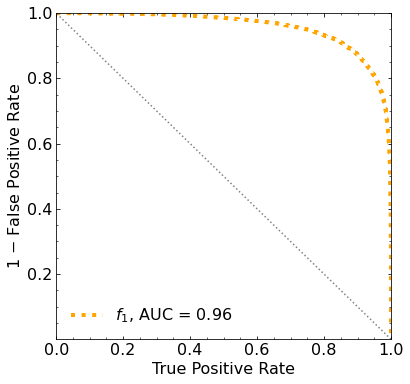

Classification score:


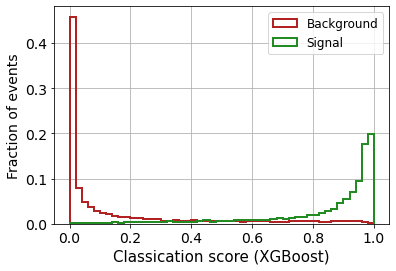


 ROC-AUC =  0.9562283961483824


In [63]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg)

In [64]:
np.savetxt('rocs/roc_14feats.txt', [tpr_mon_xg, fpr_mon_xg])

print('\n ROC-AUC = ', roc_auc_xg)


 ROC-AUC =  0.9562283961483824


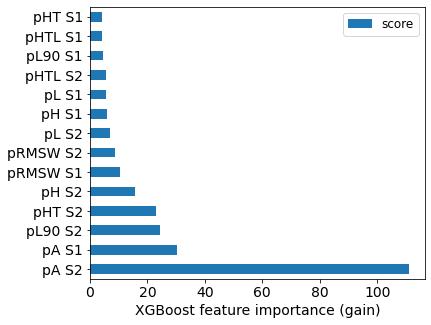

In [66]:
feature_important = classifier.get_booster().get_score(importance_type='gain')
keys = list(feature_important.keys())
keys = ['pA_S1','pH_S1','pHT_S1','pL_S1','pL90_S1','pRMSW_S1','pHTL_S1','pA_S2','pH_S2','pHT_S2','pL_S2','pL90_S2','pRMSW_S2','pHTL_S2','pbot', 'ptop','pdiffT']
keys = ['pA S1','pH S1','pHT S1','pL S1','pL90 S1','pRMSW S1','pHTL S1',
        'pA S2','pH S2','pHT S2','pL S2','pL90 S2','pRMSW S2','pHTL S2'
        ]
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(40, columns="score").plot(kind='barh', figsize = (6,5)) ## plot top 40 features
plt.xlabel('XGBoost feature importance (gain)', fontsize = 14)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(loc="upper right", fontsize=12)
# plt.savefig('feat_importance_15feats.pdf',bbox_inches='tight')
plt.show()

### DNN

Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_52 (Dense)             (None, 128)               1920      
_________________________________________________________________
leaky_re_lu_33 (LeakyReLU)   (None, 128)               0         
_________________________________________________________________
dropout_41 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_53 (Dense)             (None, 64)                8256      
_________________________________________________________________
leaky_re_lu_34 (LeakyReLU)   (None, 64)                0         
_________________________________________________________________
dropout_42 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_54 (Dense)             (None, 32)              

319/319 [==============================] - 0s 979us/step - loss: 0.3148 - accuracy: 0.8689 - val_loss: 0.2972 - val_accuracy: 0.8677
Epoch 94/500
319/319 [==============================] - 0s 953us/step - loss: 0.3172 - accuracy: 0.8694 - val_loss: 0.2795 - val_accuracy: 0.8846
Epoch 95/500
319/319 [==============================] - 0s 951us/step - loss: 0.3096 - accuracy: 0.8730 - val_loss: 0.2765 - val_accuracy: 0.8852
Epoch 96/500
319/319 [==============================] - 0s 989us/step - loss: 0.3184 - accuracy: 0.8683 - val_loss: 0.2839 - val_accuracy: 0.8760
Epoch 97/500
319/319 [==============================] - 0s 994us/step - loss: 0.3107 - accuracy: 0.8716 - val_loss: 0.3438 - val_accuracy: 0.8430
Epoch 98/500
319/319 [==============================] - 0s 974us/step - loss: 0.3141 - accuracy: 0.8685 - val_loss: 0.2819 - val_accuracy: 0.8798
Epoch 99/500
319/319 [==============================] - 0s 964us/step - loss: 0.3105 - accuracy: 0.8728 - val_loss: 0.2800 - val_accuracy

Epoch 149/500
319/319 [==============================] - 0s 962us/step - loss: 0.3056 - accuracy: 0.8746 - val_loss: 0.2753 - val_accuracy: 0.8852
Epoch 150/500
319/319 [==============================] - 0s 964us/step - loss: 0.3017 - accuracy: 0.8791 - val_loss: 0.2884 - val_accuracy: 0.8773
Epoch 151/500
319/319 [==============================] - 0s 954us/step - loss: 0.3082 - accuracy: 0.8713 - val_loss: 0.2721 - val_accuracy: 0.8860
Epoch 152/500
319/319 [==============================] - 0s 960us/step - loss: 0.2994 - accuracy: 0.8753 - val_loss: 0.2835 - val_accuracy: 0.8791
Epoch 153/500
319/319 [==============================] - 0s 950us/step - loss: 0.3051 - accuracy: 0.8773 - val_loss: 0.2895 - val_accuracy: 0.8780
Epoch 154/500
319/319 [==============================] - 0s 963us/step - loss: 0.3123 - accuracy: 0.8738 - val_loss: 0.2732 - val_accuracy: 0.8842
Epoch 155/500
319/319 [==============================] - 0s 959us/step - loss: 0.3038 - accuracy: 0.8769 - val_loss: 0

Epoch 205/500
319/319 [==============================] - 0s 986us/step - loss: 0.3012 - accuracy: 0.8747 - val_loss: 0.2790 - val_accuracy: 0.8812
Epoch 206/500
319/319 [==============================] - 0s 965us/step - loss: 0.2970 - accuracy: 0.8777 - val_loss: 0.2703 - val_accuracy: 0.8856
Epoch 207/500
319/319 [==============================] - 0s 958us/step - loss: 0.3010 - accuracy: 0.8759 - val_loss: 0.2713 - val_accuracy: 0.8852
Epoch 208/500
319/319 [==============================] - 0s 946us/step - loss: 0.3043 - accuracy: 0.8734 - val_loss: 0.2651 - val_accuracy: 0.8877
Epoch 209/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2954 - accuracy: 0.8780 - val_loss: 0.2710 - val_accuracy: 0.8824
Epoch 210/500
319/319 [==============================] - 0s 978us/step - loss: 0.2971 - accuracy: 0.8751 - val_loss: 0.2754 - val_accuracy: 0.8810
Epoch 211/500
319/319 [==============================] - 0s 963us/step - loss: 0.3023 - accuracy: 0.8758 - val_loss: 0.2

Epoch 261/500
319/319 [==============================] - 0s 967us/step - loss: 0.3031 - accuracy: 0.8738 - val_loss: 0.2715 - val_accuracy: 0.8823
Epoch 262/500
319/319 [==============================] - 0s 981us/step - loss: 0.3033 - accuracy: 0.8731 - val_loss: 0.2637 - val_accuracy: 0.8874
Epoch 263/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2915 - accuracy: 0.8798 - val_loss: 0.2629 - val_accuracy: 0.8871
Epoch 264/500
319/319 [==============================] - 0s 959us/step - loss: 0.3007 - accuracy: 0.8767 - val_loss: 0.2625 - val_accuracy: 0.8883
Epoch 265/500
319/319 [==============================] - 0s 958us/step - loss: 0.2982 - accuracy: 0.8764 - val_loss: 0.2650 - val_accuracy: 0.8876
Epoch 266/500
319/319 [==============================] - 0s 958us/step - loss: 0.2941 - accuracy: 0.8786 - val_loss: 0.2722 - val_accuracy: 0.8848
Epoch 267/500
319/319 [==============================] - 0s 950us/step - loss: 0.3004 - accuracy: 0.8761 - val_loss: 0.2

Epoch 317/500
319/319 [==============================] - 0s 948us/step - loss: 0.3009 - accuracy: 0.8759 - val_loss: 0.2642 - val_accuracy: 0.8869
Epoch 318/500
319/319 [==============================] - 0s 960us/step - loss: 0.2948 - accuracy: 0.8790 - val_loss: 0.2678 - val_accuracy: 0.8878
Epoch 319/500
319/319 [==============================] - 0s 958us/step - loss: 0.2946 - accuracy: 0.8799 - val_loss: 0.2750 - val_accuracy: 0.8831
Epoch 320/500
319/319 [==============================] - 0s 953us/step - loss: 0.2926 - accuracy: 0.8804 - val_loss: 0.2693 - val_accuracy: 0.8855
Epoch 321/500
319/319 [==============================] - 0s 953us/step - loss: 0.2967 - accuracy: 0.8822 - val_loss: 0.2604 - val_accuracy: 0.8903
Epoch 322/500
319/319 [==============================] - 0s 954us/step - loss: 0.2950 - accuracy: 0.8788 - val_loss: 0.2707 - val_accuracy: 0.8851
Epoch 323/500
319/319 [==============================] - 0s 957us/step - loss: 0.2935 - accuracy: 0.8790 - val_loss: 0

Epoch 373/500
319/319 [==============================] - 0s 976us/step - loss: 0.2887 - accuracy: 0.8793 - val_loss: 0.2671 - val_accuracy: 0.8849
Epoch 374/500
319/319 [==============================] - 0s 962us/step - loss: 0.2940 - accuracy: 0.8808 - val_loss: 0.2626 - val_accuracy: 0.8871
Epoch 375/500
319/319 [==============================] - 0s 969us/step - loss: 0.2962 - accuracy: 0.8763 - val_loss: 0.2634 - val_accuracy: 0.8888
Epoch 376/500
319/319 [==============================] - 0s 968us/step - loss: 0.2903 - accuracy: 0.8797 - val_loss: 0.2656 - val_accuracy: 0.8842
Epoch 377/500
319/319 [==============================] - 0s 967us/step - loss: 0.2809 - accuracy: 0.8856 - val_loss: 0.2629 - val_accuracy: 0.8877
Epoch 378/500
319/319 [==============================] - 0s 973us/step - loss: 0.2886 - accuracy: 0.8826 - val_loss: 0.2722 - val_accuracy: 0.8780
Epoch 379/500
319/319 [==============================] - 0s 979us/step - loss: 0.2890 - accuracy: 0.8823 - val_loss: 0

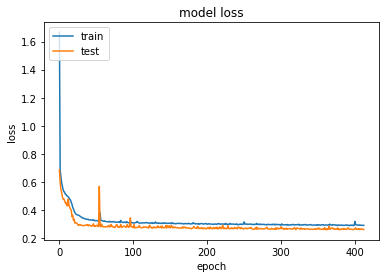

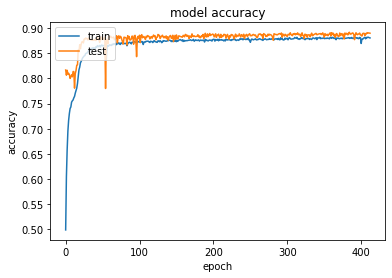

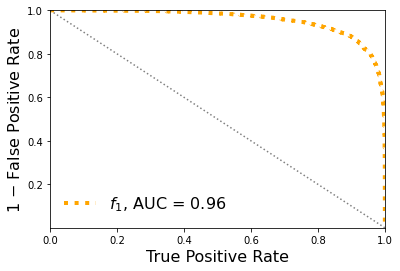

Classification score:


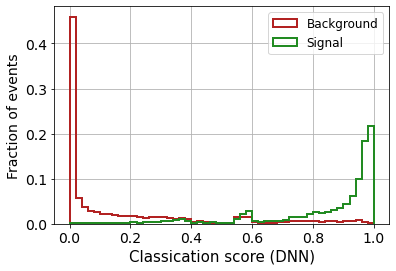


 ROC-AUC =  0.9562676561882636


In [67]:

# define the keras model
model = Sequential()
model.add(Dense(128, input_shape=(X_mon_train.shape[1],)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(64))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(32))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(16))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(8))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(4))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

In [68]:
print('\n ROC-AUC = ', roc_auc_dnn)


 ROC-AUC =  0.9562676561882636


Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_59 (Dense)             (None, 4)                 60        
_________________________________________________________________
dropout_47 (Dropout)         (None, 4)                 0         
_________________________________________________________________
dense_60 (Dense)             (None, 16)                80        
_________________________________________________________________
dropout_48 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_61 (Dense)             (None, 4)                 68        
_________________________________________________________________
dropout_49 (Dropout)         (None, 4)                 0         
_________________________________________________________________
dense_62 (Dense)             (None, 1)               

319/319 [==============================] - 0s 537us/step - loss: 0.4220 - accuracy: 0.7806 - val_loss: 0.3444 - val_accuracy: 0.8522
Epoch 105/500
319/319 [==============================] - 0s 543us/step - loss: 0.4192 - accuracy: 0.7802 - val_loss: 0.3338 - val_accuracy: 0.8513
Epoch 106/500
319/319 [==============================] - 0s 545us/step - loss: 0.4219 - accuracy: 0.7824 - val_loss: 0.3464 - val_accuracy: 0.8419
Epoch 107/500
319/319 [==============================] - 0s 540us/step - loss: 0.4224 - accuracy: 0.7796 - val_loss: 0.3785 - val_accuracy: 0.8255
Epoch 108/500
319/319 [==============================] - 0s 528us/step - loss: 0.4180 - accuracy: 0.7826 - val_loss: 0.3445 - val_accuracy: 0.8487
Epoch 109/500
319/319 [==============================] - 0s 541us/step - loss: 0.4209 - accuracy: 0.7804 - val_loss: 0.3558 - val_accuracy: 0.8423
Epoch 110/500
319/319 [==============================] - 0s 525us/step - loss: 0.4190 - accuracy: 0.7825 - val_loss: 0.3334 - val_ac

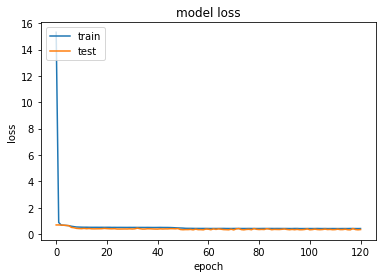

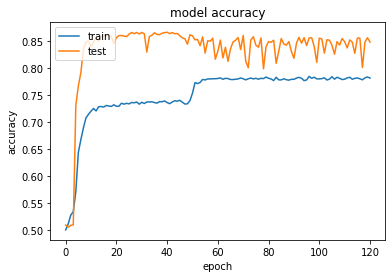

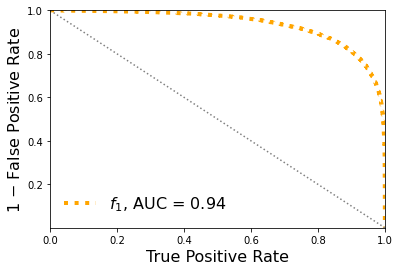

Classification score:


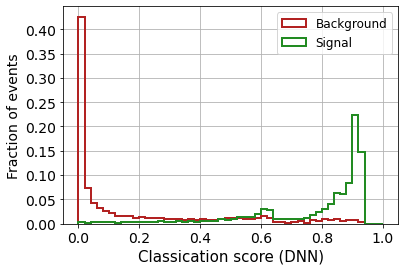


 ROC-AUC =  0.9352693262931887


In [69]:

# define the keras model
model = Sequential()
model.add(Dense(4, input_shape=(X_mon_train.shape[1],), activation='relu'))
model.add(Dropout(0.20))
# model.add(Dense(8, activation='relu'))
# model.add(Dropout(0.20))
model.add(Dense(16, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(4, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

### CNN

In [70]:
# prepare the dataset
X_mon_train_cn = X_mon_train.reshape(X_mon_train.shape[0], X_mon_train.shape[1], 1)
X_mon_test_cn = X_mon_test.reshape(X_mon_test.shape[0], X_mon_test.shape[1], 1)
X_mon_val_cn = X_mon_val.reshape(X_mon_val.shape[0], X_mon_val.shape[1], 1)

Epoch 1/500
319/319 [==============================] - 2s 2ms/step - loss: 11.6464 - accuracy: 0.5106 - val_loss: 0.7815 - val_accuracy: 0.5970
Epoch 2/500
319/319 [==============================] - 0s 1ms/step - loss: 0.8645 - accuracy: 0.6118 - val_loss: 0.7260 - val_accuracy: 0.7718
Epoch 3/500
319/319 [==============================] - 0s 1ms/step - loss: 0.7452 - accuracy: 0.7362 - val_loss: 0.6363 - val_accuracy: 0.8183
Epoch 4/500
319/319 [==============================] - 0s 1ms/step - loss: 0.6492 - accuracy: 0.7892 - val_loss: 0.6008 - val_accuracy: 0.8082
Epoch 5/500
319/319 [==============================] - 0s 1ms/step - loss: 0.6211 - accuracy: 0.7953 - val_loss: 0.5769 - val_accuracy: 0.8166
Epoch 6/500
319/319 [==============================] - 0s 1ms/step - loss: 0.6036 - accuracy: 0.8002 - val_loss: 0.5618 - val_accuracy: 0.8175
Epoch 7/500
319/319 [==============================] - 0s 1ms/step - loss: 0.5830 - accuracy: 0.8071 - val_loss: 0.5563 - val_accuracy: 0.816

Epoch 58/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3247 - accuracy: 0.8729 - val_loss: 0.3212 - val_accuracy: 0.8765
Epoch 59/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3288 - accuracy: 0.8711 - val_loss: 0.3036 - val_accuracy: 0.8841
Epoch 60/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3271 - accuracy: 0.8695 - val_loss: 0.3309 - val_accuracy: 0.8713
Epoch 61/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3297 - accuracy: 0.8698 - val_loss: 0.3012 - val_accuracy: 0.8826
Epoch 62/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3247 - accuracy: 0.8715 - val_loss: 0.3027 - val_accuracy: 0.8846
Epoch 63/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3312 - accuracy: 0.8721 - val_loss: 0.3054 - val_accuracy: 0.8835
Epoch 64/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3271 - accuracy: 0.8717 - val_loss: 0.3085 - val_accuracy:

Epoch 115/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3144 - accuracy: 0.8760 - val_loss: 0.2955 - val_accuracy: 0.8820
Epoch 116/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3078 - accuracy: 0.8787 - val_loss: 0.3011 - val_accuracy: 0.8785
Epoch 117/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3221 - accuracy: 0.8718 - val_loss: 0.3000 - val_accuracy: 0.8809
Epoch 118/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3180 - accuracy: 0.8739 - val_loss: 0.2950 - val_accuracy: 0.8863
Epoch 119/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3121 - accuracy: 0.8774 - val_loss: 0.2953 - val_accuracy: 0.8830
Epoch 120/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3172 - accuracy: 0.8756 - val_loss: 0.2959 - val_accuracy: 0.8858
Epoch 121/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3161 - accuracy: 0.8763 - val_loss: 0.2969 - val_ac

319/319 [==============================] - 0s 1ms/step - loss: 0.3074 - accuracy: 0.8794 - val_loss: 0.2976 - val_accuracy: 0.8848
Epoch 228/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3050 - accuracy: 0.8804 - val_loss: 0.2913 - val_accuracy: 0.8855
Epoch 229/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3111 - accuracy: 0.8772 - val_loss: 0.2883 - val_accuracy: 0.8851
Epoch 230/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3034 - accuracy: 0.8815 - val_loss: 0.2984 - val_accuracy: 0.8842
Epoch 231/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3055 - accuracy: 0.8794 - val_loss: 0.2913 - val_accuracy: 0.8855
Epoch 232/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3108 - accuracy: 0.8776 - val_loss: 0.2975 - val_accuracy: 0.8859
Epoch 233/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3139 - accuracy: 0.8747 - val_loss: 0.2952 - val_accuracy: 0.8860

319/319 [==============================] - 0s 1ms/step - loss: 0.3096 - accuracy: 0.8775 - val_loss: 0.2885 - val_accuracy: 0.8866
Epoch 340/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3043 - accuracy: 0.8823 - val_loss: 0.2858 - val_accuracy: 0.8885
Epoch 341/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3021 - accuracy: 0.8814 - val_loss: 0.2882 - val_accuracy: 0.8884
Epoch 342/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3126 - accuracy: 0.8750 - val_loss: 0.2852 - val_accuracy: 0.8891
Epoch 343/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3045 - accuracy: 0.8833 - val_loss: 0.2981 - val_accuracy: 0.8792
Epoch 344/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3067 - accuracy: 0.8782 - val_loss: 0.2830 - val_accuracy: 0.8874
Epoch 345/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3067 - accuracy: 0.8774 - val_loss: 0.2864 - val_accuracy: 0.8899

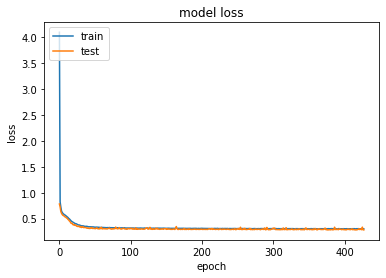

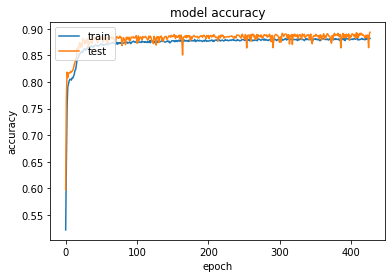

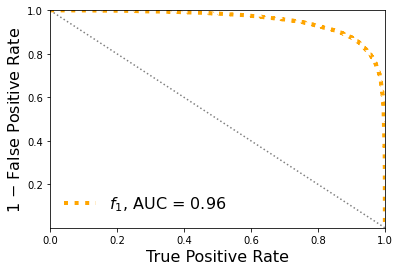

Classification score:


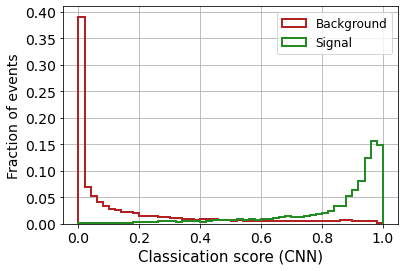


 ROC-AUC =  0.9553482765943021


In [71]:

# define the keras model
model = Sequential()
model.add(Conv1D(16, 3, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(16, 3, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(16, 3, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [72]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.9553482765943021


Epoch 1/500
319/319 [==============================] - 1s 1ms/step - loss: 83.3893 - accuracy: 0.5163 - val_loss: 0.6980 - val_accuracy: 0.5069
Epoch 2/500
319/319 [==============================] - 0s 799us/step - loss: 0.6980 - accuracy: 0.4924 - val_loss: 0.6963 - val_accuracy: 0.5069
Epoch 3/500
319/319 [==============================] - 0s 794us/step - loss: 0.6965 - accuracy: 0.4938 - val_loss: 0.6961 - val_accuracy: 0.5069
Epoch 4/500
319/319 [==============================] - 0s 765us/step - loss: 0.6962 - accuracy: 0.4979 - val_loss: 0.6962 - val_accuracy: 0.4925
Epoch 5/500
319/319 [==============================] - 0s 769us/step - loss: 0.6952 - accuracy: 0.4951 - val_loss: 0.5843 - val_accuracy: 0.7692
Epoch 6/500
319/319 [==============================] - 0s 765us/step - loss: 0.5836 - accuracy: 0.7057 - val_loss: 0.5022 - val_accuracy: 0.8137
Epoch 7/500
319/319 [==============================] - 0s 760us/step - loss: 0.5411 - accuracy: 0.7373 - val_loss: 0.4643 - val_acc

319/319 [==============================] - 0s 796us/step - loss: 0.4490 - accuracy: 0.7966 - val_loss: 0.3599 - val_accuracy: 0.8672
Epoch 114/500
319/319 [==============================] - 0s 770us/step - loss: 0.4557 - accuracy: 0.7906 - val_loss: 0.3461 - val_accuracy: 0.8720
Epoch 115/500
319/319 [==============================] - 0s 792us/step - loss: 0.4476 - accuracy: 0.7974 - val_loss: 0.3449 - val_accuracy: 0.8738
Epoch 116/500
319/319 [==============================] - 0s 773us/step - loss: 0.4517 - accuracy: 0.7931 - val_loss: 0.3464 - val_accuracy: 0.8752
Epoch 117/500
319/319 [==============================] - 0s 778us/step - loss: 0.4502 - accuracy: 0.7938 - val_loss: 0.3487 - val_accuracy: 0.8709
Epoch 118/500
319/319 [==============================] - 0s 779us/step - loss: 0.4515 - accuracy: 0.7939 - val_loss: 0.3518 - val_accuracy: 0.8717
Epoch 119/500
319/319 [==============================] - 0s 775us/step - loss: 0.4535 - accuracy: 0.7929 - val_loss: 0.3882 - val_ac

Epoch 169/500
319/319 [==============================] - 0s 785us/step - loss: 0.4612 - accuracy: 0.7877 - val_loss: 0.3500 - val_accuracy: 0.8734
Epoch 170/500
319/319 [==============================] - 0s 786us/step - loss: 0.4427 - accuracy: 0.8010 - val_loss: 0.3445 - val_accuracy: 0.8740
Epoch 171/500
319/319 [==============================] - 0s 777us/step - loss: 0.4504 - accuracy: 0.7942 - val_loss: 0.3486 - val_accuracy: 0.8737
Epoch 172/500
319/319 [==============================] - 0s 765us/step - loss: 0.4553 - accuracy: 0.7902 - val_loss: 0.3490 - val_accuracy: 0.8740
Epoch 173/500
319/319 [==============================] - 0s 783us/step - loss: 0.4421 - accuracy: 0.8022 - val_loss: 0.3441 - val_accuracy: 0.8751
Epoch 174/500
319/319 [==============================] - 0s 781us/step - loss: 0.4445 - accuracy: 0.7992 - val_loss: 0.3445 - val_accuracy: 0.8734
Epoch 175/500
319/319 [==============================] - 0s 782us/step - loss: 0.4489 - accuracy: 0.7962 - val_loss: 0

Epoch 225/500
319/319 [==============================] - 0s 805us/step - loss: 0.4454 - accuracy: 0.7978 - val_loss: 0.3402 - val_accuracy: 0.8766
Epoch 226/500
319/319 [==============================] - 0s 802us/step - loss: 0.4418 - accuracy: 0.8002 - val_loss: 0.3384 - val_accuracy: 0.8765
Epoch 227/500
319/319 [==============================] - 0s 784us/step - loss: 0.4404 - accuracy: 0.8000 - val_loss: 0.3594 - val_accuracy: 0.8677
Epoch 228/500
319/319 [==============================] - 0s 790us/step - loss: 0.4450 - accuracy: 0.7980 - val_loss: 0.3528 - val_accuracy: 0.8722
Epoch 229/500
319/319 [==============================] - 0s 780us/step - loss: 0.4439 - accuracy: 0.8012 - val_loss: 0.3421 - val_accuracy: 0.8783
Epoch 230/500
319/319 [==============================] - 0s 780us/step - loss: 0.4416 - accuracy: 0.7997 - val_loss: 0.3365 - val_accuracy: 0.8766
Epoch 231/500
319/319 [==============================] - 0s 787us/step - loss: 0.4475 - accuracy: 0.7962 - val_loss: 0

Epoch 281/500
319/319 [==============================] - 0s 775us/step - loss: 0.4431 - accuracy: 0.7989 - val_loss: 0.3458 - val_accuracy: 0.8755
Epoch 282/500
319/319 [==============================] - 0s 846us/step - loss: 0.4498 - accuracy: 0.7950 - val_loss: 0.3368 - val_accuracy: 0.8790
Epoch 283/500
319/319 [==============================] - 0s 808us/step - loss: 0.4421 - accuracy: 0.8019 - val_loss: 0.3549 - val_accuracy: 0.8702
Epoch 284/500
319/319 [==============================] - 0s 773us/step - loss: 0.4424 - accuracy: 0.8002 - val_loss: 0.3354 - val_accuracy: 0.8806
Epoch 285/500
319/319 [==============================] - 0s 760us/step - loss: 0.4442 - accuracy: 0.7976 - val_loss: 0.3364 - val_accuracy: 0.8776
Epoch 286/500
319/319 [==============================] - 0s 799us/step - loss: 0.4379 - accuracy: 0.8047 - val_loss: 0.3352 - val_accuracy: 0.8784
Epoch 287/500
319/319 [==============================] - 0s 809us/step - loss: 0.4418 - accuracy: 0.8004 - val_loss: 0

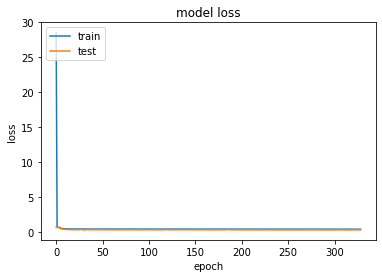

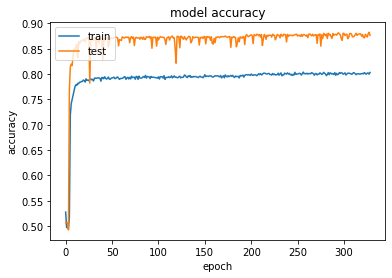

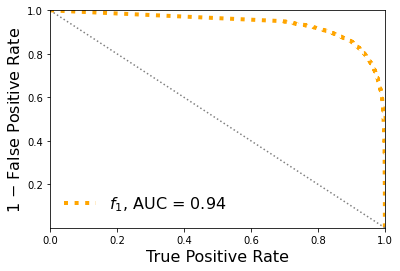

Classification score:


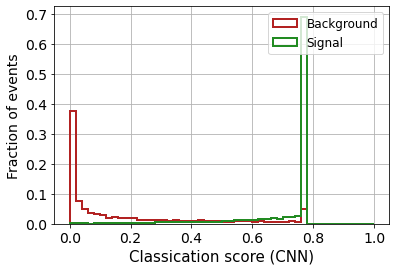


 ROC-AUC =  0.9396170439899927


In [73]:

# define the keras model
model = Sequential()
model.add(Conv1D(8, 2, input_shape=(X_mon_train.shape[1],1), activation='relu', strides = (1),kernel_regularizer=l2(0.005)))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Flatten())
model.add(Dense(10, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

## 1B. Remove HITS (15 feats)

In [74]:
# concatenate the data
X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

X_mon_B.shape:  (32015, 15)
X_mon_S.shape:  (32015, 15)
X_mon.shape:  (64030, 15)

X_mon_train :  (40818, 15)
y_mon_train :  (40818,)
X_mon_val :  (7204, 15)
y_mon_val :  (7204,)
X_mon_test :  (16008, 15)
y_mon_test :  (16008,)



### XGBoost

[0]	validation_0-logloss:0.68667	validation_1-logloss:0.68669
[1]	validation_0-logloss:0.68036	validation_1-logloss:0.68042


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[2]	validation_0-logloss:0.67412	validation_1-logloss:0.67420
[3]	validation_0-logloss:0.66805	validation_1-logloss:0.66815
[4]	validation_0-logloss:0.66205	validation_1-logloss:0.66216
[5]	validation_0-logloss:0.65620	validation_1-logloss:0.65636
[6]	validation_0-logloss:0.65043	validation_1-logloss:0.65060
[7]	validation_0-logloss:0.64480	validation_1-logloss:0.64502
[8]	validation_0-logloss:0.63917	validation_1-logloss:0.63941
[9]	validation_0-logloss:0.63373	validation_1-logloss:0.63400
[10]	validation_0-logloss:0.62831	validation_1-logloss:0.62858
[11]	validation_0-logloss:0.62307	validation_1-logloss:0.62338
[12]	validation_0-logloss:0.61783	validation_1-logloss:0.61814
[13]	validation_0-logloss:0.61277	validation_1-logloss:0.61311
[14]	validation_0-logloss:0.60765	validation_1-logloss:0.60804
[15]	validation_0-logloss:0.60274	validation_1-logloss:0.60317
[16]	validation_0-logloss:0.59783	validation_1-logloss:0.59828
[17]	validation_0-logloss:0.59296	validation_1-logloss:0.59345


[132]	validation_0-logloss:0.31387	validation_1-logloss:0.31763
[133]	validation_0-logloss:0.31264	validation_1-logloss:0.31646
[134]	validation_0-logloss:0.31143	validation_1-logloss:0.31528
[135]	validation_0-logloss:0.31035	validation_1-logloss:0.31427
[136]	validation_0-logloss:0.30916	validation_1-logloss:0.31312
[137]	validation_0-logloss:0.30802	validation_1-logloss:0.31196
[138]	validation_0-logloss:0.30687	validation_1-logloss:0.31089
[139]	validation_0-logloss:0.30573	validation_1-logloss:0.30977
[140]	validation_0-logloss:0.30470	validation_1-logloss:0.30880
[141]	validation_0-logloss:0.30354	validation_1-logloss:0.30769
[142]	validation_0-logloss:0.30242	validation_1-logloss:0.30658
[143]	validation_0-logloss:0.30128	validation_1-logloss:0.30548
[144]	validation_0-logloss:0.30019	validation_1-logloss:0.30447
[145]	validation_0-logloss:0.29912	validation_1-logloss:0.30336
[146]	validation_0-logloss:0.29802	validation_1-logloss:0.30234
[147]	validation_0-logloss:0.29698	valid

[261]	validation_0-logloss:0.22234	validation_1-logloss:0.23144
[262]	validation_0-logloss:0.22195	validation_1-logloss:0.23106
[263]	validation_0-logloss:0.22159	validation_1-logloss:0.23076
[264]	validation_0-logloss:0.22117	validation_1-logloss:0.23037
[265]	validation_0-logloss:0.22077	validation_1-logloss:0.23004
[266]	validation_0-logloss:0.22039	validation_1-logloss:0.22972
[267]	validation_0-logloss:0.22001	validation_1-logloss:0.22936
[268]	validation_0-logloss:0.21959	validation_1-logloss:0.22902
[269]	validation_0-logloss:0.21925	validation_1-logloss:0.22870
[270]	validation_0-logloss:0.21887	validation_1-logloss:0.22837
[271]	validation_0-logloss:0.21850	validation_1-logloss:0.22806
[272]	validation_0-logloss:0.21810	validation_1-logloss:0.22768
[273]	validation_0-logloss:0.21775	validation_1-logloss:0.22732
[274]	validation_0-logloss:0.21741	validation_1-logloss:0.22703
[275]	validation_0-logloss:0.21704	validation_1-logloss:0.22670
[276]	validation_0-logloss:0.21669	valid

[390]	validation_0-logloss:0.18941	validation_1-logloss:0.20279
[391]	validation_0-logloss:0.18924	validation_1-logloss:0.20265
[392]	validation_0-logloss:0.18909	validation_1-logloss:0.20251
[393]	validation_0-logloss:0.18892	validation_1-logloss:0.20237
[394]	validation_0-logloss:0.18876	validation_1-logloss:0.20223
[395]	validation_0-logloss:0.18857	validation_1-logloss:0.20210
[396]	validation_0-logloss:0.18841	validation_1-logloss:0.20198
[397]	validation_0-logloss:0.18829	validation_1-logloss:0.20188
[398]	validation_0-logloss:0.18812	validation_1-logloss:0.20176
[399]	validation_0-logloss:0.18795	validation_1-logloss:0.20161
[400]	validation_0-logloss:0.18776	validation_1-logloss:0.20147
[401]	validation_0-logloss:0.18759	validation_1-logloss:0.20134
[402]	validation_0-logloss:0.18747	validation_1-logloss:0.20124
[403]	validation_0-logloss:0.18728	validation_1-logloss:0.20109
[404]	validation_0-logloss:0.18711	validation_1-logloss:0.20097
[405]	validation_0-logloss:0.18694	valid

[519]	validation_0-logloss:0.17256	validation_1-logloss:0.19047
[520]	validation_0-logloss:0.17248	validation_1-logloss:0.19043
[521]	validation_0-logloss:0.17238	validation_1-logloss:0.19036
[522]	validation_0-logloss:0.17228	validation_1-logloss:0.19028
[523]	validation_0-logloss:0.17219	validation_1-logloss:0.19023
[524]	validation_0-logloss:0.17210	validation_1-logloss:0.19018
[525]	validation_0-logloss:0.17203	validation_1-logloss:0.19012
[526]	validation_0-logloss:0.17194	validation_1-logloss:0.19007
[527]	validation_0-logloss:0.17186	validation_1-logloss:0.19001
[528]	validation_0-logloss:0.17177	validation_1-logloss:0.18994
[529]	validation_0-logloss:0.17166	validation_1-logloss:0.18988
[530]	validation_0-logloss:0.17159	validation_1-logloss:0.18983
[531]	validation_0-logloss:0.17150	validation_1-logloss:0.18978
[532]	validation_0-logloss:0.17142	validation_1-logloss:0.18973
[533]	validation_0-logloss:0.17134	validation_1-logloss:0.18966
[534]	validation_0-logloss:0.17126	valid

[648]	validation_0-logloss:0.16343	validation_1-logloss:0.18466
[649]	validation_0-logloss:0.16337	validation_1-logloss:0.18463
[650]	validation_0-logloss:0.16331	validation_1-logloss:0.18459
[651]	validation_0-logloss:0.16326	validation_1-logloss:0.18457
[652]	validation_0-logloss:0.16319	validation_1-logloss:0.18452
[653]	validation_0-logloss:0.16313	validation_1-logloss:0.18451
[654]	validation_0-logloss:0.16309	validation_1-logloss:0.18448
[655]	validation_0-logloss:0.16304	validation_1-logloss:0.18444
[656]	validation_0-logloss:0.16297	validation_1-logloss:0.18441
[657]	validation_0-logloss:0.16292	validation_1-logloss:0.18438
[658]	validation_0-logloss:0.16287	validation_1-logloss:0.18435
[659]	validation_0-logloss:0.16281	validation_1-logloss:0.18430
[660]	validation_0-logloss:0.16276	validation_1-logloss:0.18427
[661]	validation_0-logloss:0.16272	validation_1-logloss:0.18424
[662]	validation_0-logloss:0.16265	validation_1-logloss:0.18422
[663]	validation_0-logloss:0.16260	valid

[777]	validation_0-logloss:0.15737	validation_1-logloss:0.18159
[778]	validation_0-logloss:0.15734	validation_1-logloss:0.18158
[779]	validation_0-logloss:0.15730	validation_1-logloss:0.18156
[780]	validation_0-logloss:0.15727	validation_1-logloss:0.18155
[781]	validation_0-logloss:0.15724	validation_1-logloss:0.18155
[782]	validation_0-logloss:0.15719	validation_1-logloss:0.18154
[783]	validation_0-logloss:0.15715	validation_1-logloss:0.18151
[784]	validation_0-logloss:0.15712	validation_1-logloss:0.18150
[785]	validation_0-logloss:0.15709	validation_1-logloss:0.18149
[786]	validation_0-logloss:0.15704	validation_1-logloss:0.18148
[787]	validation_0-logloss:0.15701	validation_1-logloss:0.18146
[788]	validation_0-logloss:0.15696	validation_1-logloss:0.18144
[789]	validation_0-logloss:0.15692	validation_1-logloss:0.18141
[790]	validation_0-logloss:0.15688	validation_1-logloss:0.18139
[791]	validation_0-logloss:0.15685	validation_1-logloss:0.18138
[792]	validation_0-logloss:0.15682	valid

[1033]	validation_0-logloss:0.14948	validation_1-logloss:0.17891
[1034]	validation_0-logloss:0.14945	validation_1-logloss:0.17890
[1035]	validation_0-logloss:0.14942	validation_1-logloss:0.17890
[1036]	validation_0-logloss:0.14939	validation_1-logloss:0.17889
[1037]	validation_0-logloss:0.14937	validation_1-logloss:0.17888
[1038]	validation_0-logloss:0.14935	validation_1-logloss:0.17887
[1039]	validation_0-logloss:0.14932	validation_1-logloss:0.17887
[1040]	validation_0-logloss:0.14929	validation_1-logloss:0.17885
[1041]	validation_0-logloss:0.14928	validation_1-logloss:0.17885
[1042]	validation_0-logloss:0.14925	validation_1-logloss:0.17883
[1043]	validation_0-logloss:0.14920	validation_1-logloss:0.17882
[1044]	validation_0-logloss:0.14919	validation_1-logloss:0.17882
[1045]	validation_0-logloss:0.14916	validation_1-logloss:0.17881
[1046]	validation_0-logloss:0.14914	validation_1-logloss:0.17881
[1047]	validation_0-logloss:0.14913	validation_1-logloss:0.17881
[1048]	validation_0-loglo

[1160]	validation_0-logloss:0.14650	validation_1-logloss:0.17827
[1161]	validation_0-logloss:0.14647	validation_1-logloss:0.17827
[1162]	validation_0-logloss:0.14646	validation_1-logloss:0.17827
[1163]	validation_0-logloss:0.14642	validation_1-logloss:0.17826
[1164]	validation_0-logloss:0.14641	validation_1-logloss:0.17825
[1165]	validation_0-logloss:0.14637	validation_1-logloss:0.17823
[1166]	validation_0-logloss:0.14635	validation_1-logloss:0.17823
[1167]	validation_0-logloss:0.14633	validation_1-logloss:0.17822
[1168]	validation_0-logloss:0.14630	validation_1-logloss:0.17821
[1169]	validation_0-logloss:0.14628	validation_1-logloss:0.17821
[1170]	validation_0-logloss:0.14626	validation_1-logloss:0.17821
[1171]	validation_0-logloss:0.14624	validation_1-logloss:0.17821
[1172]	validation_0-logloss:0.14623	validation_1-logloss:0.17820
[1173]	validation_0-logloss:0.14620	validation_1-logloss:0.17820
[1174]	validation_0-logloss:0.14619	validation_1-logloss:0.17820
[1175]	validation_0-loglo

[1287]	validation_0-logloss:0.14380	validation_1-logloss:0.17778
[1288]	validation_0-logloss:0.14379	validation_1-logloss:0.17777
[1289]	validation_0-logloss:0.14376	validation_1-logloss:0.17776
[1290]	validation_0-logloss:0.14375	validation_1-logloss:0.17775
[1291]	validation_0-logloss:0.14372	validation_1-logloss:0.17775
[1292]	validation_0-logloss:0.14371	validation_1-logloss:0.17775
[1293]	validation_0-logloss:0.14369	validation_1-logloss:0.17775
[1294]	validation_0-logloss:0.14367	validation_1-logloss:0.17775
[1295]	validation_0-logloss:0.14365	validation_1-logloss:0.17776
[1296]	validation_0-logloss:0.14364	validation_1-logloss:0.17776
[1297]	validation_0-logloss:0.14361	validation_1-logloss:0.17775
[1298]	validation_0-logloss:0.14360	validation_1-logloss:0.17776
[1299]	validation_0-logloss:0.14358	validation_1-logloss:0.17776
[1300]	validation_0-logloss:0.14355	validation_1-logloss:0.17775
[1301]	validation_0-logloss:0.14354	validation_1-logloss:0.17775
[1302]	validation_0-loglo

[1414]	validation_0-logloss:0.14120	validation_1-logloss:0.17747
[1415]	validation_0-logloss:0.14119	validation_1-logloss:0.17747
[1416]	validation_0-logloss:0.14118	validation_1-logloss:0.17747
[1417]	validation_0-logloss:0.14115	validation_1-logloss:0.17748
[1418]	validation_0-logloss:0.14113	validation_1-logloss:0.17747
[1419]	validation_0-logloss:0.14111	validation_1-logloss:0.17747
[1420]	validation_0-logloss:0.14111	validation_1-logloss:0.17748
[1421]	validation_0-logloss:0.14107	validation_1-logloss:0.17748
[1422]	validation_0-logloss:0.14104	validation_1-logloss:0.17747
[1423]	validation_0-logloss:0.14103	validation_1-logloss:0.17746
[1424]	validation_0-logloss:0.14100	validation_1-logloss:0.17747
[1425]	validation_0-logloss:0.14098	validation_1-logloss:0.17747
[1426]	validation_0-logloss:0.14096	validation_1-logloss:0.17747
[1427]	validation_0-logloss:0.14095	validation_1-logloss:0.17747
[1428]	validation_0-logloss:0.14093	validation_1-logloss:0.17746
[1429]	validation_0-loglo

[1541]	validation_0-logloss:0.13872	validation_1-logloss:0.17731
[1542]	validation_0-logloss:0.13869	validation_1-logloss:0.17730
[1543]	validation_0-logloss:0.13867	validation_1-logloss:0.17729
[1544]	validation_0-logloss:0.13866	validation_1-logloss:0.17728
[1545]	validation_0-logloss:0.13864	validation_1-logloss:0.17728
[1546]	validation_0-logloss:0.13862	validation_1-logloss:0.17728
[1547]	validation_0-logloss:0.13861	validation_1-logloss:0.17727
[1548]	validation_0-logloss:0.13859	validation_1-logloss:0.17726
[1549]	validation_0-logloss:0.13857	validation_1-logloss:0.17726
[1550]	validation_0-logloss:0.13856	validation_1-logloss:0.17725
[1551]	validation_0-logloss:0.13855	validation_1-logloss:0.17725
[1552]	validation_0-logloss:0.13853	validation_1-logloss:0.17724
[1553]	validation_0-logloss:0.13852	validation_1-logloss:0.17724
[1554]	validation_0-logloss:0.13851	validation_1-logloss:0.17724
[1555]	validation_0-logloss:0.13850	validation_1-logloss:0.17723
[1556]	validation_0-loglo

[1668]	validation_0-logloss:0.13650	validation_1-logloss:0.17704
[1669]	validation_0-logloss:0.13649	validation_1-logloss:0.17705
[1670]	validation_0-logloss:0.13647	validation_1-logloss:0.17705
[1671]	validation_0-logloss:0.13644	validation_1-logloss:0.17705
[1672]	validation_0-logloss:0.13641	validation_1-logloss:0.17705
[1673]	validation_0-logloss:0.13639	validation_1-logloss:0.17705
[1674]	validation_0-logloss:0.13637	validation_1-logloss:0.17705
[1675]	validation_0-logloss:0.13636	validation_1-logloss:0.17704
[1676]	validation_0-logloss:0.13636	validation_1-logloss:0.17704
[1677]	validation_0-logloss:0.13634	validation_1-logloss:0.17703
[1678]	validation_0-logloss:0.13633	validation_1-logloss:0.17703
[1679]	validation_0-logloss:0.13630	validation_1-logloss:0.17704
[1680]	validation_0-logloss:0.13628	validation_1-logloss:0.17704
[1681]	validation_0-logloss:0.13627	validation_1-logloss:0.17704
[1682]	validation_0-logloss:0.13624	validation_1-logloss:0.17704
[1683]	validation_0-loglo

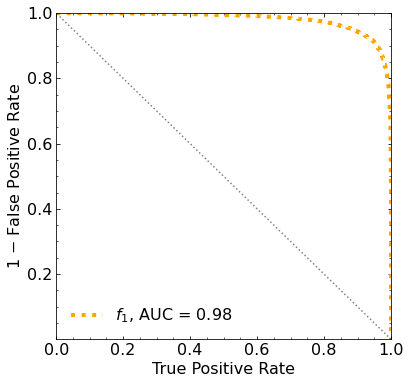

Classification score:


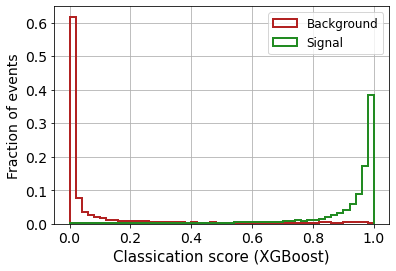


 ROC-AUC =  0.9796536833636728


In [75]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg)

In [76]:
np.savetxt('rocs/roc_15feats.txt', [tpr_mon_xg, fpr_mon_xg])

print('\n ROC-AUC = ', roc_auc_xg)


 ROC-AUC =  0.9796536833636728


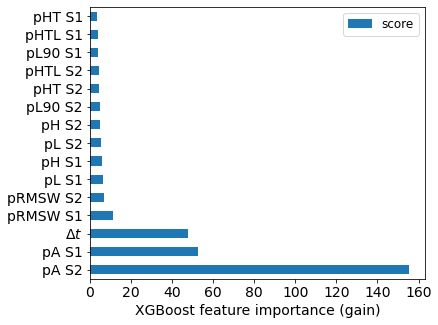

In [77]:
feature_important = classifier.get_booster().get_score(importance_type='gain')
keys = list(feature_important.keys())
keys = ['pA_S1','pH_S1','pHT_S1','pL_S1','pL90_S1','pRMSW_S1','pHTL_S1','pA_S2','pH_S2','pHT_S2','pL_S2','pL90_S2','pRMSW_S2','pHTL_S2','pbot', 'ptop','pdiffT']
keys = ['pA S1','pH S1','pHT S1','pL S1','pL90 S1','pRMSW S1','pHTL S1',
        'pA S2','pH S2','pHT S2','pL S2','pL90 S2','pRMSW S2','pHTL S2',
        '$\Delta t$']
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(40, columns="score").plot(kind='barh', figsize = (6,5)) ## plot top 40 features
plt.xlabel('XGBoost feature importance (gain)', fontsize = 14)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(loc="upper right", fontsize=12)
plt.savefig('feat_importance_15feats.pdf',bbox_inches='tight')
plt.show()

### DNN

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 128)               2048      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 128)               0         
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                8256      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 64)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2

319/319 [==============================] - 0s 966us/step - loss: 0.2217 - accuracy: 0.9125 - val_loss: 0.1825 - val_accuracy: 0.9259
Epoch 94/500
319/319 [==============================] - 0s 949us/step - loss: 0.2244 - accuracy: 0.9140 - val_loss: 0.1926 - val_accuracy: 0.9255
Epoch 95/500
319/319 [==============================] - 0s 962us/step - loss: 0.2174 - accuracy: 0.9162 - val_loss: 0.1918 - val_accuracy: 0.9231
Epoch 96/500
319/319 [==============================] - 0s 960us/step - loss: 0.2202 - accuracy: 0.9139 - val_loss: 0.1917 - val_accuracy: 0.9231
Epoch 97/500
319/319 [==============================] - 0s 964us/step - loss: 0.2261 - accuracy: 0.9131 - val_loss: 0.1821 - val_accuracy: 0.9250
Epoch 98/500
319/319 [==============================] - 0s 955us/step - loss: 0.2223 - accuracy: 0.9111 - val_loss: 0.1921 - val_accuracy: 0.9221
Epoch 99/500
319/319 [==============================] - 0s 958us/step - loss: 0.2251 - accuracy: 0.9122 - val_loss: 0.2014 - val_accuracy

Epoch 149/500
319/319 [==============================] - 0s 942us/step - loss: 0.2191 - accuracy: 0.9149 - val_loss: 0.1854 - val_accuracy: 0.9274
Epoch 150/500
319/319 [==============================] - 0s 951us/step - loss: 0.2161 - accuracy: 0.9163 - val_loss: 0.1832 - val_accuracy: 0.9277
Epoch 151/500
319/319 [==============================] - 0s 978us/step - loss: 0.2166 - accuracy: 0.9166 - val_loss: 0.1871 - val_accuracy: 0.9207
Epoch 152/500
319/319 [==============================] - 0s 958us/step - loss: 0.2178 - accuracy: 0.9155 - val_loss: 0.1920 - val_accuracy: 0.9220
Epoch 153/500
319/319 [==============================] - 0s 954us/step - loss: 0.2101 - accuracy: 0.9186 - val_loss: 0.1910 - val_accuracy: 0.9260
Epoch 154/500
319/319 [==============================] - 0s 954us/step - loss: 0.2178 - accuracy: 0.9161 - val_loss: 0.1811 - val_accuracy: 0.9273
Epoch 155/500
319/319 [==============================] - 0s 948us/step - loss: 0.2159 - accuracy: 0.9186 - val_loss: 0

Epoch 205/500
319/319 [==============================] - 0s 955us/step - loss: 0.2116 - accuracy: 0.9191 - val_loss: 0.2119 - val_accuracy: 0.9102
Epoch 206/500
319/319 [==============================] - 0s 942us/step - loss: 0.2108 - accuracy: 0.9190 - val_loss: 0.1970 - val_accuracy: 0.9205
Epoch 207/500
319/319 [==============================] - 0s 946us/step - loss: 0.2134 - accuracy: 0.9165 - val_loss: 0.1809 - val_accuracy: 0.9293
Epoch 208/500
319/319 [==============================] - 0s 954us/step - loss: 0.2083 - accuracy: 0.9180 - val_loss: 0.1891 - val_accuracy: 0.9220
Epoch 209/500
319/319 [==============================] - 0s 949us/step - loss: 0.2113 - accuracy: 0.9184 - val_loss: 0.1916 - val_accuracy: 0.9221
Epoch 210/500
319/319 [==============================] - 0s 948us/step - loss: 0.2097 - accuracy: 0.9203 - val_loss: 0.1808 - val_accuracy: 0.9282
Epoch 211/500
319/319 [==============================] - 0s 948us/step - loss: 0.2091 - accuracy: 0.9204 - val_loss: 0

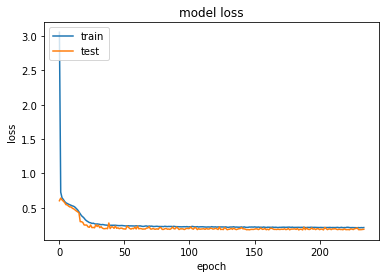

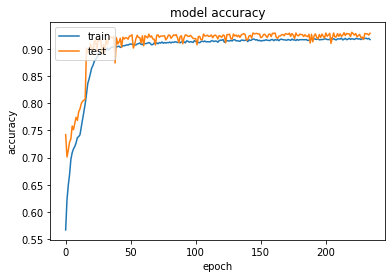

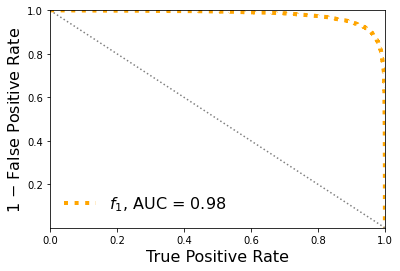

Classification score:


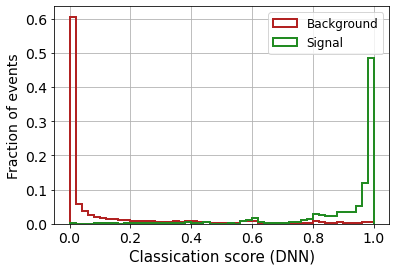


 ROC-AUC =  0.9799164524496837


In [20]:

# define the keras model
model = Sequential()
model.add(Dense(128, input_shape=(X_mon_train.shape[1],)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(64))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(32))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(16))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(8))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(4))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

In [21]:
print('\n ROC-AUC = ', roc_auc_dnn)


 ROC-AUC =  0.9799164524496837


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_7 (Dense)              (None, 4)                 64        
_________________________________________________________________
dropout_6 (Dropout)          (None, 4)                 0         
_________________________________________________________________
dense_8 (Dense)              (None, 16)                80        
_________________________________________________________________
dropout_7 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_9 (Dense)              (None, 4)                 68        
_________________________________________________________________
dropout_8 (Dropout)          (None, 4)                 0         
_________________________________________________________________
dense_10 (Dense)             (None, 1)                

319/319 [==============================] - 0s 532us/step - loss: 0.3114 - accuracy: 0.8670 - val_loss: 0.3258 - val_accuracy: 0.8608
Epoch 105/500
319/319 [==============================] - 0s 533us/step - loss: 0.3134 - accuracy: 0.8656 - val_loss: 0.2756 - val_accuracy: 0.8735
Epoch 106/500
319/319 [==============================] - 0s 542us/step - loss: 0.3122 - accuracy: 0.8701 - val_loss: 0.3024 - val_accuracy: 0.8742
Epoch 107/500
319/319 [==============================] - 0s 536us/step - loss: 0.3084 - accuracy: 0.8688 - val_loss: 0.2831 - val_accuracy: 0.8806
Epoch 108/500
319/319 [==============================] - 0s 553us/step - loss: 0.3109 - accuracy: 0.8653 - val_loss: 0.2749 - val_accuracy: 0.8815
Epoch 109/500
319/319 [==============================] - 0s 532us/step - loss: 0.3086 - accuracy: 0.8688 - val_loss: 0.3001 - val_accuracy: 0.8672
Epoch 110/500
319/319 [==============================] - 0s 570us/step - loss: 0.3115 - accuracy: 0.8651 - val_loss: 0.3110 - val_ac

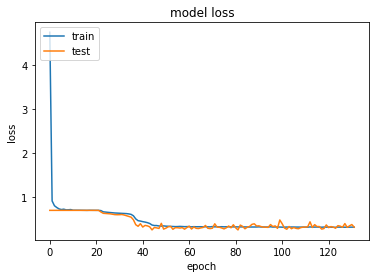

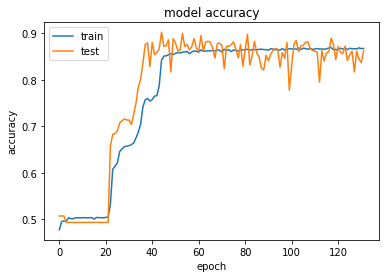

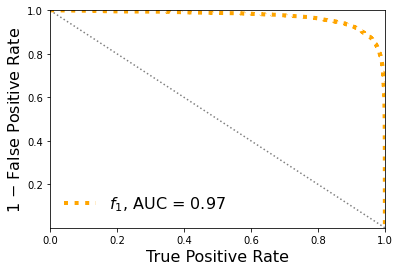

Classification score:


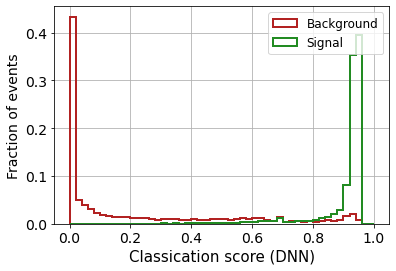


 ROC-AUC =  0.9718716956295708


In [22]:

# define the keras model
model = Sequential()
model.add(Dense(4, input_shape=(X_mon_train.shape[1],), activation='relu'))
model.add(Dropout(0.20))
# model.add(Dense(8, activation='relu'))
# model.add(Dropout(0.20))
model.add(Dense(16, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(4, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

### CNN

In [23]:
# prepare the dataset
X_mon_train_cn = X_mon_train.reshape(X_mon_train.shape[0], X_mon_train.shape[1], 1)
X_mon_test_cn = X_mon_test.reshape(X_mon_test.shape[0], X_mon_test.shape[1], 1)
X_mon_val_cn = X_mon_val.reshape(X_mon_val.shape[0], X_mon_val.shape[1], 1)

Epoch 1/500
319/319 [==============================] - 2s 2ms/step - loss: 3.7359 - accuracy: 0.5657 - val_loss: 0.7545 - val_accuracy: 0.7550
Epoch 2/500
319/319 [==============================] - 0s 2ms/step - loss: 0.7485 - accuracy: 0.7185 - val_loss: 0.6426 - val_accuracy: 0.8043
Epoch 3/500
319/319 [==============================] - 1s 2ms/step - loss: 0.6399 - accuracy: 0.7874 - val_loss: 0.5283 - val_accuracy: 0.8652
Epoch 4/500
319/319 [==============================] - 1s 2ms/step - loss: 0.5570 - accuracy: 0.8320 - val_loss: 0.4741 - val_accuracy: 0.8677
Epoch 5/500
319/319 [==============================] - 1s 2ms/step - loss: 0.5079 - accuracy: 0.8562 - val_loss: 0.4344 - val_accuracy: 0.8799
Epoch 6/500
319/319 [==============================] - 1s 2ms/step - loss: 0.4852 - accuracy: 0.8627 - val_loss: 0.4105 - val_accuracy: 0.8959
Epoch 7/500
319/319 [==============================] - 1s 2ms/step - loss: 0.4606 - accuracy: 0.8687 - val_loss: 0.3960 - val_accuracy: 0.8969

Epoch 58/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2359 - accuracy: 0.9129 - val_loss: 0.2244 - val_accuracy: 0.9192
Epoch 59/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2414 - accuracy: 0.9114 - val_loss: 0.2080 - val_accuracy: 0.9239
Epoch 60/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2315 - accuracy: 0.9147 - val_loss: 0.2182 - val_accuracy: 0.9232
Epoch 61/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2350 - accuracy: 0.9136 - val_loss: 0.2168 - val_accuracy: 0.9210
Epoch 62/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2408 - accuracy: 0.9121 - val_loss: 0.2126 - val_accuracy: 0.9241
Epoch 63/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2358 - accuracy: 0.9137 - val_loss: 0.2177 - val_accuracy: 0.9231
Epoch 64/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2375 - accuracy: 0.9126 - val_loss: 0.2111 - val_accuracy:

Epoch 115/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2320 - accuracy: 0.9121 - val_loss: 0.2047 - val_accuracy: 0.9262
Epoch 116/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2279 - accuracy: 0.9146 - val_loss: 0.2101 - val_accuracy: 0.9253
Epoch 117/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2297 - accuracy: 0.9144 - val_loss: 0.2137 - val_accuracy: 0.9230
Epoch 118/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2308 - accuracy: 0.9131 - val_loss: 0.2134 - val_accuracy: 0.9224
Epoch 119/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2312 - accuracy: 0.9140 - val_loss: 0.2213 - val_accuracy: 0.9170
Epoch 120/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2269 - accuracy: 0.9158 - val_loss: 0.2069 - val_accuracy: 0.9266
Epoch 121/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2275 - accuracy: 0.9159 - val_loss: 0.2399 - val_ac

319/319 [==============================] - 0s 2ms/step - loss: 0.2227 - accuracy: 0.9172 - val_loss: 0.2054 - val_accuracy: 0.9266
Epoch 228/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2293 - accuracy: 0.9174 - val_loss: 0.2048 - val_accuracy: 0.9250
Epoch 229/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2203 - accuracy: 0.9154 - val_loss: 0.2335 - val_accuracy: 0.9089
Epoch 230/500
319/319 [==============================] - 0s 2ms/step - loss: 0.2280 - accuracy: 0.9131 - val_loss: 0.2083 - val_accuracy: 0.9227
Epoch 231/500
319/319 [==============================] - 0s 1ms/step - loss: 0.2217 - accuracy: 0.9168 - val_loss: 0.2110 - val_accuracy: 0.9250
Restoring model weights from the end of the best epoch.
Epoch 00231: early stopping


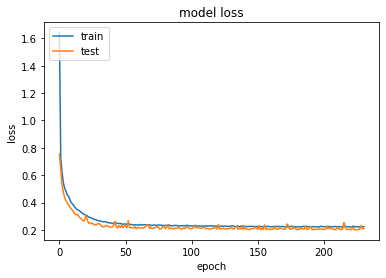

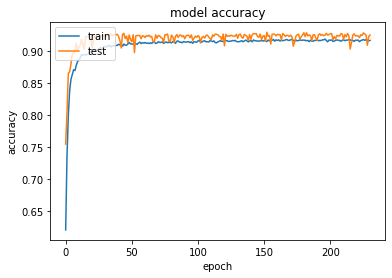

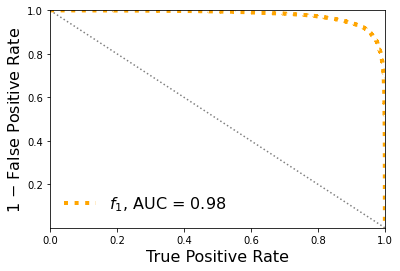

Classification score:


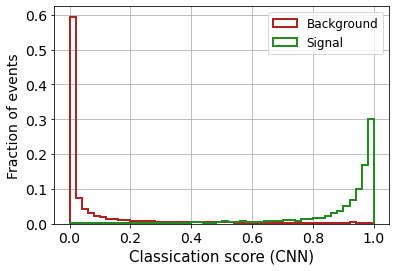


 ROC-AUC =  0.9788692084475055


In [24]:

# define the keras model
model = Sequential()
model.add(Conv1D(16, 3, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(16, 3, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(16, 3, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [25]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.9788692084475055


Epoch 1/500
319/319 [==============================] - 1s 1ms/step - loss: 4.3881 - accuracy: 0.5868 - val_loss: 0.5454 - val_accuracy: 0.7161
Epoch 2/500
319/319 [==============================] - 0s 808us/step - loss: 0.5878 - accuracy: 0.6578 - val_loss: 0.4827 - val_accuracy: 0.7792
Epoch 3/500
319/319 [==============================] - 0s 824us/step - loss: 0.5237 - accuracy: 0.7192 - val_loss: 0.4258 - val_accuracy: 0.8645
Epoch 4/500
319/319 [==============================] - 0s 811us/step - loss: 0.4394 - accuracy: 0.7754 - val_loss: 0.3079 - val_accuracy: 0.8931
Epoch 5/500
319/319 [==============================] - 0s 797us/step - loss: 0.3862 - accuracy: 0.8020 - val_loss: 0.2770 - val_accuracy: 0.9046
Epoch 6/500
319/319 [==============================] - 0s 804us/step - loss: 0.3699 - accuracy: 0.8049 - val_loss: 0.2732 - val_accuracy: 0.9042
Epoch 7/500
319/319 [==============================] - 0s 794us/step - loss: 0.3529 - accuracy: 0.8128 - val_loss: 0.2953 - val_accu

319/319 [==============================] - 0s 805us/step - loss: 0.2647 - accuracy: 0.8997 - val_loss: 0.2011 - val_accuracy: 0.9202
Epoch 114/500
319/319 [==============================] - 0s 815us/step - loss: 0.2684 - accuracy: 0.8939 - val_loss: 0.2029 - val_accuracy: 0.9170
Epoch 115/500
319/319 [==============================] - 0s 810us/step - loss: 0.2585 - accuracy: 0.8999 - val_loss: 0.2187 - val_accuracy: 0.9175
Epoch 116/500
319/319 [==============================] - 0s 808us/step - loss: 0.2595 - accuracy: 0.8996 - val_loss: 0.2049 - val_accuracy: 0.9174
Epoch 117/500
319/319 [==============================] - 0s 806us/step - loss: 0.2636 - accuracy: 0.9004 - val_loss: 0.2024 - val_accuracy: 0.9216
Epoch 118/500
319/319 [==============================] - 0s 802us/step - loss: 0.2650 - accuracy: 0.8998 - val_loss: 0.2023 - val_accuracy: 0.9171
Epoch 119/500
319/319 [==============================] - 0s 798us/step - loss: 0.2542 - accuracy: 0.9026 - val_loss: 0.1994 - val_ac

Epoch 169/500
319/319 [==============================] - 0s 800us/step - loss: 0.2610 - accuracy: 0.8997 - val_loss: 0.1958 - val_accuracy: 0.9216
Epoch 170/500
319/319 [==============================] - 0s 796us/step - loss: 0.2547 - accuracy: 0.9016 - val_loss: 0.1961 - val_accuracy: 0.9223
Epoch 171/500
319/319 [==============================] - 0s 801us/step - loss: 0.2628 - accuracy: 0.8995 - val_loss: 0.1955 - val_accuracy: 0.9231
Epoch 172/500
319/319 [==============================] - 0s 796us/step - loss: 0.2502 - accuracy: 0.9030 - val_loss: 0.1944 - val_accuracy: 0.9218
Epoch 173/500
319/319 [==============================] - 0s 791us/step - loss: 0.2542 - accuracy: 0.9022 - val_loss: 0.1952 - val_accuracy: 0.9220
Epoch 174/500
319/319 [==============================] - 0s 824us/step - loss: 0.2537 - accuracy: 0.9026 - val_loss: 0.2002 - val_accuracy: 0.9212
Epoch 175/500
319/319 [==============================] - 0s 814us/step - loss: 0.2566 - accuracy: 0.9025 - val_loss: 0

Epoch 225/500
319/319 [==============================] - 0s 832us/step - loss: 0.2564 - accuracy: 0.9017 - val_loss: 0.1969 - val_accuracy: 0.9216
Epoch 226/500
319/319 [==============================] - 0s 840us/step - loss: 0.2555 - accuracy: 0.9018 - val_loss: 0.1975 - val_accuracy: 0.9207
Epoch 227/500
319/319 [==============================] - 0s 819us/step - loss: 0.2487 - accuracy: 0.9067 - val_loss: 0.1950 - val_accuracy: 0.9199
Epoch 228/500
319/319 [==============================] - 0s 799us/step - loss: 0.2530 - accuracy: 0.9022 - val_loss: 0.1945 - val_accuracy: 0.9206
Epoch 229/500
319/319 [==============================] - 0s 806us/step - loss: 0.2506 - accuracy: 0.9059 - val_loss: 0.1962 - val_accuracy: 0.9228
Epoch 230/500
319/319 [==============================] - 0s 797us/step - loss: 0.2508 - accuracy: 0.9027 - val_loss: 0.1947 - val_accuracy: 0.9223
Epoch 231/500
319/319 [==============================] - 0s 801us/step - loss: 0.2487 - accuracy: 0.9037 - val_loss: 0

Epoch 281/500
319/319 [==============================] - 0s 798us/step - loss: 0.2503 - accuracy: 0.9040 - val_loss: 0.1929 - val_accuracy: 0.9224
Epoch 282/500
319/319 [==============================] - 0s 793us/step - loss: 0.2478 - accuracy: 0.9032 - val_loss: 0.2042 - val_accuracy: 0.9155
Epoch 283/500
319/319 [==============================] - 0s 805us/step - loss: 0.2480 - accuracy: 0.9055 - val_loss: 0.1954 - val_accuracy: 0.9228
Epoch 284/500
319/319 [==============================] - 0s 794us/step - loss: 0.2524 - accuracy: 0.9012 - val_loss: 0.1981 - val_accuracy: 0.9231
Epoch 285/500
319/319 [==============================] - 0s 800us/step - loss: 0.2496 - accuracy: 0.9043 - val_loss: 0.2000 - val_accuracy: 0.9206
Epoch 286/500
319/319 [==============================] - 0s 811us/step - loss: 0.2524 - accuracy: 0.9030 - val_loss: 0.2042 - val_accuracy: 0.9206
Epoch 287/500
319/319 [==============================] - 0s 800us/step - loss: 0.2542 - accuracy: 0.9035 - val_loss: 0

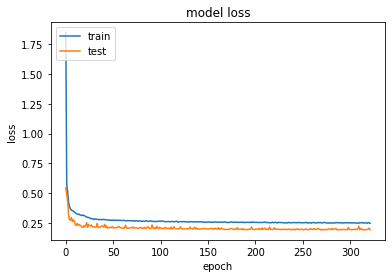

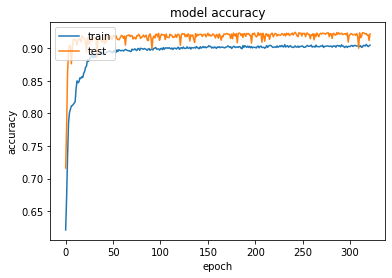

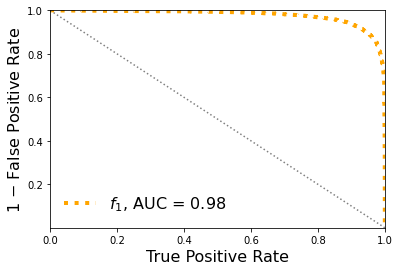

Classification score:


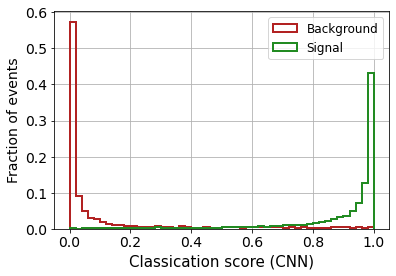


 ROC-AUC =  0.9762964738380541


In [26]:

# define the keras model
model = Sequential()
model.add(Conv1D(8, 2, input_shape=(X_mon_train.shape[1],1), activation='relu', strides = (1),kernel_regularizer=l2(0.005)))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Flatten())
model.add(Dense(10, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

## 1C. Keep the 5 most important features

##### Remove some columns or features (if you want)

In [78]:
# features = ['pA','pH','pHT','pL','pL90','pRMSW','pHTL']
remove_col_S1 = [1,2,3,4,6]
remove_col_S2 = [1,2,3,4,6]

B_pbot = B_pbot
B_ptop = B_ptop
B_ppeakS1 = np.delete(B_ppeakS1, remove_col_S1, axis=1)
B_ppeakS2 = np.delete(B_ppeakS2, remove_col_S2, axis=1)

print('B_pbot.shape: ', B_pbot.shape)
print('B_ptop.shape: ', B_ptop.shape)
print('B_ppeakS1.shape :', B_ppeakS1.shape)
print('B_ppeakS2.shape: ', B_ppeakS2.shape)


S_pbot = S_pbot
S_ptop = S_ptop
S_ppeakS1 = np.delete(S_ppeakS1, remove_col_S1, axis=1)
S_ppeakS2 = np.delete(S_ppeakS2, remove_col_S2, axis=1)

print('S_pbot.shape: ', S_pbot.shape)
print('S_ptop.shape: ', S_ptop.shape)
print('S_ppeakS1.shape :', S_ppeakS1.shape)
print('S_ppeakS2.shape: ', S_ppeakS2.shape)

B_pbot.shape:  (32015,)
B_ptop.shape:  (32015,)
B_ppeakS1.shape : (32015, 2)
B_ppeakS2.shape:  (32015, 2)
S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 2)
S_ppeakS2.shape:  (32015, 2)


In [79]:
# concatenate the data
X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

X_mon_B.shape:  (32015, 5)
X_mon_S.shape:  (32015, 5)
X_mon.shape:  (64030, 5)

X_mon_train :  (40818, 5)
y_mon_train :  (40818,)
X_mon_val :  (7204, 5)
y_mon_val :  (7204,)
X_mon_test :  (16008, 5)
y_mon_test :  (16008,)



### XGBoost

[0]	validation_0-logloss:0.68667	validation_1-logloss:0.68669


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[1]	validation_0-logloss:0.68036	validation_1-logloss:0.68042
[2]	validation_0-logloss:0.67413	validation_1-logloss:0.67421
[3]	validation_0-logloss:0.66805	validation_1-logloss:0.66816
[4]	validation_0-logloss:0.66205	validation_1-logloss:0.66217
[5]	validation_0-logloss:0.65621	validation_1-logloss:0.65637
[6]	validation_0-logloss:0.65043	validation_1-logloss:0.65061
[7]	validation_0-logloss:0.64480	validation_1-logloss:0.64503
[8]	validation_0-logloss:0.63917	validation_1-logloss:0.63943
[9]	validation_0-logloss:0.63373	validation_1-logloss:0.63402
[10]	validation_0-logloss:0.62831	validation_1-logloss:0.62860
[11]	validation_0-logloss:0.62308	validation_1-logloss:0.62341
[12]	validation_0-logloss:0.61784	validation_1-logloss:0.61816
[13]	validation_0-logloss:0.61278	validation_1-logloss:0.61314
[14]	validation_0-logloss:0.60765	validation_1-logloss:0.60807
[15]	validation_0-logloss:0.60276	validation_1-logloss:0.60320
[16]	validation_0-logloss:0.59784	validation_1-logloss:0.59830
[

[131]	validation_0-logloss:0.31485	validation_1-logloss:0.31837
[132]	validation_0-logloss:0.31361	validation_1-logloss:0.31717
[133]	validation_0-logloss:0.31246	validation_1-logloss:0.31604
[134]	validation_0-logloss:0.31126	validation_1-logloss:0.31490
[135]	validation_0-logloss:0.31007	validation_1-logloss:0.31375
[136]	validation_0-logloss:0.30893	validation_1-logloss:0.31267
[137]	validation_0-logloss:0.30773	validation_1-logloss:0.31152
[138]	validation_0-logloss:0.30661	validation_1-logloss:0.31038
[139]	validation_0-logloss:0.30556	validation_1-logloss:0.30937
[140]	validation_0-logloss:0.30441	validation_1-logloss:0.30826
[141]	validation_0-logloss:0.30332	validation_1-logloss:0.30723
[142]	validation_0-logloss:0.30223	validation_1-logloss:0.30614
[143]	validation_0-logloss:0.30106	validation_1-logloss:0.30501
[144]	validation_0-logloss:0.29994	validation_1-logloss:0.30393
[145]	validation_0-logloss:0.29887	validation_1-logloss:0.30288
[146]	validation_0-logloss:0.29788	valid

[260]	validation_0-logloss:0.22255	validation_1-logloss:0.23114
[261]	validation_0-logloss:0.22214	validation_1-logloss:0.23078
[262]	validation_0-logloss:0.22176	validation_1-logloss:0.23038
[263]	validation_0-logloss:0.22140	validation_1-logloss:0.23007
[264]	validation_0-logloss:0.22106	validation_1-logloss:0.22975
[265]	validation_0-logloss:0.22064	validation_1-logloss:0.22939
[266]	validation_0-logloss:0.22026	validation_1-logloss:0.22902
[267]	validation_0-logloss:0.21989	validation_1-logloss:0.22872
[268]	validation_0-logloss:0.21948	validation_1-logloss:0.22836
[269]	validation_0-logloss:0.21911	validation_1-logloss:0.22802
[270]	validation_0-logloss:0.21875	validation_1-logloss:0.22772
[271]	validation_0-logloss:0.21841	validation_1-logloss:0.22741
[272]	validation_0-logloss:0.21802	validation_1-logloss:0.22705
[273]	validation_0-logloss:0.21765	validation_1-logloss:0.22667
[274]	validation_0-logloss:0.21730	validation_1-logloss:0.22637
[275]	validation_0-logloss:0.21695	valid

[389]	validation_0-logloss:0.18946	validation_1-logloss:0.20206
[390]	validation_0-logloss:0.18927	validation_1-logloss:0.20187
[391]	validation_0-logloss:0.18907	validation_1-logloss:0.20170
[392]	validation_0-logloss:0.18889	validation_1-logloss:0.20156
[393]	validation_0-logloss:0.18876	validation_1-logloss:0.20145
[394]	validation_0-logloss:0.18860	validation_1-logloss:0.20132
[395]	validation_0-logloss:0.18845	validation_1-logloss:0.20119
[396]	validation_0-logloss:0.18826	validation_1-logloss:0.20105
[397]	validation_0-logloss:0.18810	validation_1-logloss:0.20093
[398]	validation_0-logloss:0.18794	validation_1-logloss:0.20081
[399]	validation_0-logloss:0.18776	validation_1-logloss:0.20065
[400]	validation_0-logloss:0.18760	validation_1-logloss:0.20052
[401]	validation_0-logloss:0.18743	validation_1-logloss:0.20039
[402]	validation_0-logloss:0.18731	validation_1-logloss:0.20030
[403]	validation_0-logloss:0.18715	validation_1-logloss:0.20018
[404]	validation_0-logloss:0.18698	valid

[518]	validation_0-logloss:0.17330	validation_1-logloss:0.18951
[519]	validation_0-logloss:0.17322	validation_1-logloss:0.18944
[520]	validation_0-logloss:0.17311	validation_1-logloss:0.18938
[521]	validation_0-logloss:0.17303	validation_1-logloss:0.18932
[522]	validation_0-logloss:0.17294	validation_1-logloss:0.18925
[523]	validation_0-logloss:0.17286	validation_1-logloss:0.18918
[524]	validation_0-logloss:0.17278	validation_1-logloss:0.18911
[525]	validation_0-logloss:0.17268	validation_1-logloss:0.18904
[526]	validation_0-logloss:0.17261	validation_1-logloss:0.18899
[527]	validation_0-logloss:0.17254	validation_1-logloss:0.18893
[528]	validation_0-logloss:0.17245	validation_1-logloss:0.18886
[529]	validation_0-logloss:0.17237	validation_1-logloss:0.18879
[530]	validation_0-logloss:0.17229	validation_1-logloss:0.18872
[531]	validation_0-logloss:0.17220	validation_1-logloss:0.18867
[532]	validation_0-logloss:0.17210	validation_1-logloss:0.18859
[533]	validation_0-logloss:0.17203	valid

[647]	validation_0-logloss:0.16478	validation_1-logloss:0.18355
[648]	validation_0-logloss:0.16474	validation_1-logloss:0.18352
[649]	validation_0-logloss:0.16467	validation_1-logloss:0.18348
[650]	validation_0-logloss:0.16461	validation_1-logloss:0.18344
[651]	validation_0-logloss:0.16456	validation_1-logloss:0.18341
[652]	validation_0-logloss:0.16451	validation_1-logloss:0.18337
[653]	validation_0-logloss:0.16446	validation_1-logloss:0.18334
[654]	validation_0-logloss:0.16441	validation_1-logloss:0.18331
[655]	validation_0-logloss:0.16437	validation_1-logloss:0.18328
[656]	validation_0-logloss:0.16431	validation_1-logloss:0.18325
[657]	validation_0-logloss:0.16425	validation_1-logloss:0.18322
[658]	validation_0-logloss:0.16420	validation_1-logloss:0.18319
[659]	validation_0-logloss:0.16414	validation_1-logloss:0.18315
[660]	validation_0-logloss:0.16410	validation_1-logloss:0.18311
[661]	validation_0-logloss:0.16406	validation_1-logloss:0.18309
[662]	validation_0-logloss:0.16401	valid

[776]	validation_0-logloss:0.15921	validation_1-logloss:0.18024
[777]	validation_0-logloss:0.15917	validation_1-logloss:0.18022
[778]	validation_0-logloss:0.15913	validation_1-logloss:0.18021
[779]	validation_0-logloss:0.15910	validation_1-logloss:0.18020
[780]	validation_0-logloss:0.15907	validation_1-logloss:0.18018
[781]	validation_0-logloss:0.15904	validation_1-logloss:0.18016
[782]	validation_0-logloss:0.15901	validation_1-logloss:0.18014
[783]	validation_0-logloss:0.15899	validation_1-logloss:0.18013
[784]	validation_0-logloss:0.15896	validation_1-logloss:0.18011
[785]	validation_0-logloss:0.15892	validation_1-logloss:0.18010
[786]	validation_0-logloss:0.15889	validation_1-logloss:0.18010
[787]	validation_0-logloss:0.15886	validation_1-logloss:0.18008
[788]	validation_0-logloss:0.15882	validation_1-logloss:0.18006
[789]	validation_0-logloss:0.15879	validation_1-logloss:0.18004
[790]	validation_0-logloss:0.15876	validation_1-logloss:0.18002
[791]	validation_0-logloss:0.15873	valid

[905]	validation_0-logloss:0.15549	validation_1-logloss:0.17861
[906]	validation_0-logloss:0.15547	validation_1-logloss:0.17860
[907]	validation_0-logloss:0.15544	validation_1-logloss:0.17859
[908]	validation_0-logloss:0.15541	validation_1-logloss:0.17858
[909]	validation_0-logloss:0.15539	validation_1-logloss:0.17857
[910]	validation_0-logloss:0.15538	validation_1-logloss:0.17857
[911]	validation_0-logloss:0.15535	validation_1-logloss:0.17857
[912]	validation_0-logloss:0.15532	validation_1-logloss:0.17855
[913]	validation_0-logloss:0.15530	validation_1-logloss:0.17855
[914]	validation_0-logloss:0.15527	validation_1-logloss:0.17853
[915]	validation_0-logloss:0.15525	validation_1-logloss:0.17853
[916]	validation_0-logloss:0.15522	validation_1-logloss:0.17852
[917]	validation_0-logloss:0.15519	validation_1-logloss:0.17851
[918]	validation_0-logloss:0.15516	validation_1-logloss:0.17851
[919]	validation_0-logloss:0.15513	validation_1-logloss:0.17850
[920]	validation_0-logloss:0.15511	valid

[1033]	validation_0-logloss:0.15263	validation_1-logloss:0.17770
[1034]	validation_0-logloss:0.15261	validation_1-logloss:0.17771
[1035]	validation_0-logloss:0.15260	validation_1-logloss:0.17769
[1036]	validation_0-logloss:0.15258	validation_1-logloss:0.17769
[1037]	validation_0-logloss:0.15255	validation_1-logloss:0.17769
[1038]	validation_0-logloss:0.15254	validation_1-logloss:0.17768
[1039]	validation_0-logloss:0.15252	validation_1-logloss:0.17768
[1040]	validation_0-logloss:0.15250	validation_1-logloss:0.17768
[1041]	validation_0-logloss:0.15249	validation_1-logloss:0.17768
[1042]	validation_0-logloss:0.15246	validation_1-logloss:0.17767
[1043]	validation_0-logloss:0.15244	validation_1-logloss:0.17768
[1044]	validation_0-logloss:0.15242	validation_1-logloss:0.17767
[1045]	validation_0-logloss:0.15241	validation_1-logloss:0.17767
[1046]	validation_0-logloss:0.15239	validation_1-logloss:0.17766
[1047]	validation_0-logloss:0.15237	validation_1-logloss:0.17766
[1048]	validation_0-loglo

[1160]	validation_0-logloss:0.15033	validation_1-logloss:0.17730
[1161]	validation_0-logloss:0.15030	validation_1-logloss:0.17730
[1162]	validation_0-logloss:0.15029	validation_1-logloss:0.17731
[1163]	validation_0-logloss:0.15027	validation_1-logloss:0.17731
[1164]	validation_0-logloss:0.15025	validation_1-logloss:0.17730
[1165]	validation_0-logloss:0.15023	validation_1-logloss:0.17730
[1166]	validation_0-logloss:0.15021	validation_1-logloss:0.17729
[1167]	validation_0-logloss:0.15020	validation_1-logloss:0.17728
[1168]	validation_0-logloss:0.15017	validation_1-logloss:0.17727
[1169]	validation_0-logloss:0.15016	validation_1-logloss:0.17727
[1170]	validation_0-logloss:0.15015	validation_1-logloss:0.17726
[1171]	validation_0-logloss:0.15013	validation_1-logloss:0.17725
[1172]	validation_0-logloss:0.15012	validation_1-logloss:0.17725
[1173]	validation_0-logloss:0.15010	validation_1-logloss:0.17725
[1174]	validation_0-logloss:0.15008	validation_1-logloss:0.17725
[1175]	validation_0-loglo

[1287]	validation_0-logloss:0.14824	validation_1-logloss:0.17714
[1288]	validation_0-logloss:0.14821	validation_1-logloss:0.17715
[1289]	validation_0-logloss:0.14819	validation_1-logloss:0.17714
[1290]	validation_0-logloss:0.14816	validation_1-logloss:0.17714
[1291]	validation_0-logloss:0.14814	validation_1-logloss:0.17714
[1292]	validation_0-logloss:0.14813	validation_1-logloss:0.17713
[1293]	validation_0-logloss:0.14812	validation_1-logloss:0.17712
[1294]	validation_0-logloss:0.14811	validation_1-logloss:0.17712
[1295]	validation_0-logloss:0.14810	validation_1-logloss:0.17712
[1296]	validation_0-logloss:0.14809	validation_1-logloss:0.17712
[1297]	validation_0-logloss:0.14808	validation_1-logloss:0.17712
[1298]	validation_0-logloss:0.14805	validation_1-logloss:0.17712
[1299]	validation_0-logloss:0.14804	validation_1-logloss:0.17711
[1300]	validation_0-logloss:0.14803	validation_1-logloss:0.17711
[1301]	validation_0-logloss:0.14802	validation_1-logloss:0.17712
[1302]	validation_0-loglo

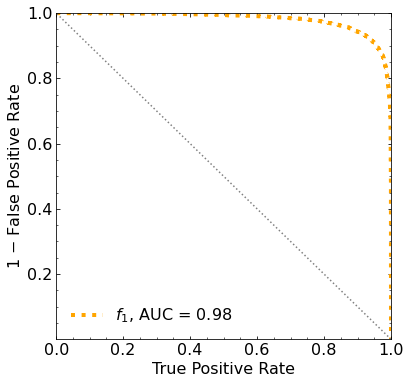

Classification score:


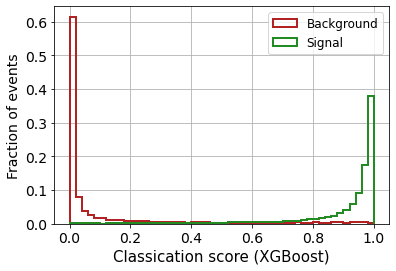


 ROC-AUC =  0.97985455739675


In [29]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg)

In [30]:
np.savetxt('rocs/roc_5feats.txt', [tpr_mon_xg, fpr_mon_xg])

print('\n ROC-AUC = ', roc_auc_xg)


 ROC-AUC =  0.97985455739675


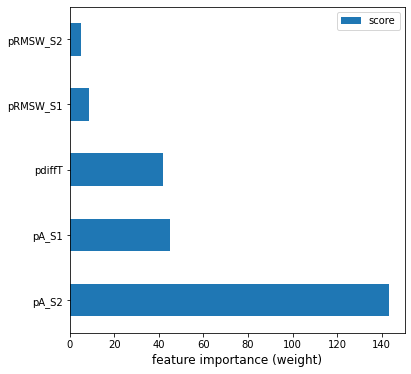

In [31]:
feature_important = classifier.get_booster().get_score(importance_type='gain')
# keys = list(feature_important.keys())
keys = ['pA_S1','pRMSW_S1', 'pA_S2', 'pRMSW_S2', 'pdiffT']
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(40, columns="score").plot(kind='barh', figsize = (6,6)) ## plot top 40 features
plt.xlabel('feature importance (weight)', fontsize = 12)
plt.show()

### DNN

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_15 (Dense)             (None, 128)               768       
_________________________________________________________________
leaky_re_lu_10 (LeakyReLU)   (None, 128)               0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_16 (Dense)             (None, 64)                8256      
_________________________________________________________________
leaky_re_lu_11 (LeakyReLU)   (None, 64)                0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_17 (Dense)             (None, 32)               

319/319 [==============================] - 0s 941us/step - loss: 0.2506 - accuracy: 0.9042 - val_loss: 0.2291 - val_accuracy: 0.9049
Epoch 94/500
319/319 [==============================] - 0s 946us/step - loss: 0.2544 - accuracy: 0.9023 - val_loss: 0.2070 - val_accuracy: 0.9192
Epoch 95/500
319/319 [==============================] - 0s 949us/step - loss: 0.2455 - accuracy: 0.9044 - val_loss: 0.2025 - val_accuracy: 0.9238
Epoch 96/500
319/319 [==============================] - 0s 949us/step - loss: 0.2562 - accuracy: 0.9013 - val_loss: 0.3165 - val_accuracy: 0.8688
Epoch 97/500
319/319 [==============================] - 0s 947us/step - loss: 0.3475 - accuracy: 0.8960 - val_loss: 0.3056 - val_accuracy: 0.8821
Epoch 98/500
319/319 [==============================] - 0s 936us/step - loss: 0.2685 - accuracy: 0.8936 - val_loss: 0.2300 - val_accuracy: 0.9120
Epoch 99/500
319/319 [==============================] - 0s 949us/step - loss: 0.2615 - accuracy: 0.8975 - val_loss: 0.2223 - val_accuracy

Epoch 149/500
319/319 [==============================] - 0s 951us/step - loss: 0.2460 - accuracy: 0.9076 - val_loss: 0.2442 - val_accuracy: 0.9002
Epoch 150/500
319/319 [==============================] - 0s 946us/step - loss: 0.2469 - accuracy: 0.9043 - val_loss: 0.2096 - val_accuracy: 0.9187
Epoch 151/500
319/319 [==============================] - 0s 933us/step - loss: 0.2952 - accuracy: 0.9083 - val_loss: 0.1925 - val_accuracy: 0.9232
Epoch 152/500
319/319 [==============================] - 0s 944us/step - loss: 0.2496 - accuracy: 0.9044 - val_loss: 0.2088 - val_accuracy: 0.9214
Epoch 153/500
319/319 [==============================] - 0s 938us/step - loss: 0.2456 - accuracy: 0.9078 - val_loss: 0.1922 - val_accuracy: 0.9245
Epoch 154/500
319/319 [==============================] - 0s 958us/step - loss: 0.2440 - accuracy: 0.9079 - val_loss: 0.2300 - val_accuracy: 0.9098
Epoch 155/500
319/319 [==============================] - 0s 977us/step - loss: 0.2508 - accuracy: 0.9018 - val_loss: 0

Epoch 205/500
319/319 [==============================] - 0s 941us/step - loss: 0.2363 - accuracy: 0.9095 - val_loss: 0.1903 - val_accuracy: 0.9259
Epoch 206/500
319/319 [==============================] - 0s 951us/step - loss: 0.2502 - accuracy: 0.9040 - val_loss: 0.2506 - val_accuracy: 0.9257
Epoch 207/500
319/319 [==============================] - 0s 939us/step - loss: 0.2627 - accuracy: 0.8952 - val_loss: 0.2174 - val_accuracy: 0.9178
Epoch 208/500
319/319 [==============================] - 0s 961us/step - loss: 0.2312 - accuracy: 0.9070 - val_loss: 0.2137 - val_accuracy: 0.9117
Epoch 209/500
319/319 [==============================] - 0s 941us/step - loss: 0.2332 - accuracy: 0.9091 - val_loss: 0.1972 - val_accuracy: 0.9249
Epoch 210/500
319/319 [==============================] - 0s 942us/step - loss: 0.2339 - accuracy: 0.9108 - val_loss: 0.1926 - val_accuracy: 0.9246
Epoch 211/500
319/319 [==============================] - 0s 935us/step - loss: 0.2345 - accuracy: 0.9103 - val_loss: 0

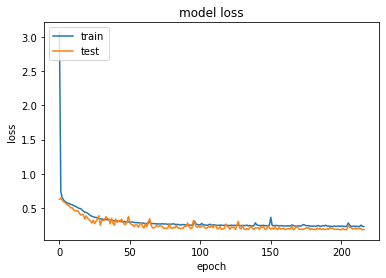

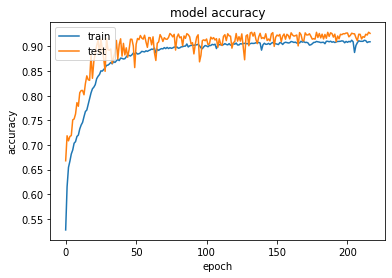

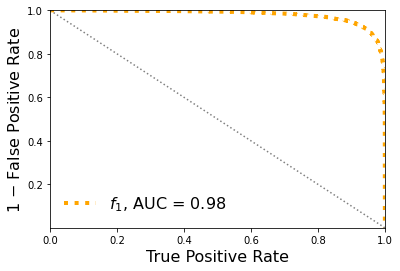

Classification score:


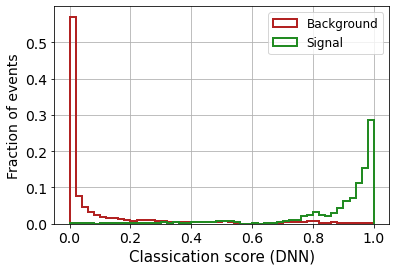


 ROC-AUC =  0.979395136878373


In [32]:

# define the keras model
model = Sequential()
model.add(Dense(128, input_shape=(X_mon_train.shape[1],)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(64))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(32))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(16))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(8))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(4))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

In [33]:
print('\n ROC-AUC = ', roc_auc_dnn)


 ROC-AUC =  0.979395136878373


Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_22 (Dense)             (None, 4)                 24        
_________________________________________________________________
dropout_18 (Dropout)         (None, 4)                 0         
_________________________________________________________________
dense_23 (Dense)             (None, 16)                80        
_________________________________________________________________
dropout_19 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_24 (Dense)             (None, 4)                 68        
_________________________________________________________________
dropout_20 (Dropout)         (None, 4)                 0         
_________________________________________________________________
dense_25 (Dense)             (None, 1)                

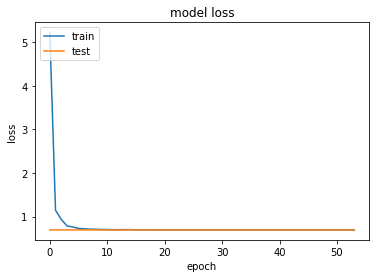

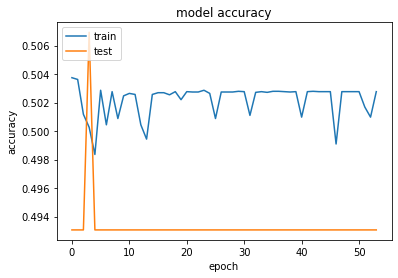

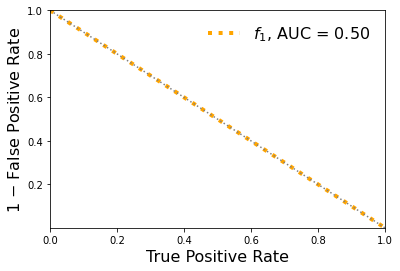

Classification score:


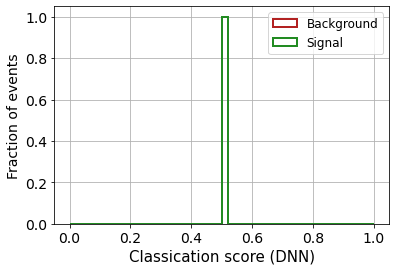


 ROC-AUC =  0.5


In [34]:

# define the keras model
model = Sequential()
model.add(Dense(4, input_shape=(X_mon_train.shape[1],), activation='relu'))
model.add(Dropout(0.20))
# model.add(Dense(8, activation='relu'))
# model.add(Dropout(0.20))
model.add(Dense(16, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(4, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

### CNN

In [80]:
# prepare the dataset
X_mon_train_cn = X_mon_train.reshape(X_mon_train.shape[0], X_mon_train.shape[1], 1)
X_mon_test_cn = X_mon_test.reshape(X_mon_test.shape[0], X_mon_test.shape[1], 1)
X_mon_val_cn = X_mon_val.reshape(X_mon_val.shape[0], X_mon_val.shape[1], 1)

Epoch 1/500
319/319 [==============================] - 1s 2ms/step - loss: 21.4309 - accuracy: 0.5767 - val_loss: 0.7067 - val_accuracy: 0.7139
Epoch 2/500
319/319 [==============================] - 0s 832us/step - loss: 0.7734 - accuracy: 0.6777 - val_loss: 0.6849 - val_accuracy: 0.7750
Epoch 3/500
319/319 [==============================] - 0s 830us/step - loss: 0.7143 - accuracy: 0.7247 - val_loss: 0.6397 - val_accuracy: 0.7773
Epoch 4/500
319/319 [==============================] - 0s 842us/step - loss: 0.6685 - accuracy: 0.7577 - val_loss: 0.6046 - val_accuracy: 0.8073
Epoch 5/500
319/319 [==============================] - 0s 843us/step - loss: 0.6341 - accuracy: 0.7788 - val_loss: 0.5904 - val_accuracy: 0.8263
Epoch 6/500
319/319 [==============================] - 0s 833us/step - loss: 0.6142 - accuracy: 0.7861 - val_loss: 0.5613 - val_accuracy: 0.8198
Epoch 7/500
319/319 [==============================] - 0s 818us/step - loss: 0.5867 - accuracy: 0.7994 - val_loss: 0.5397 - val_acc

319/319 [==============================] - 0s 822us/step - loss: 0.2337 - accuracy: 0.9157 - val_loss: 0.3082 - val_accuracy: 0.8687
Epoch 114/500
319/319 [==============================] - 0s 815us/step - loss: 0.2403 - accuracy: 0.9135 - val_loss: 0.2606 - val_accuracy: 0.8970
Epoch 115/500
319/319 [==============================] - 0s 815us/step - loss: 0.2454 - accuracy: 0.9096 - val_loss: 0.4094 - val_accuracy: 0.8111
Epoch 116/500
319/319 [==============================] - 0s 830us/step - loss: 0.2375 - accuracy: 0.9111 - val_loss: 0.4162 - val_accuracy: 0.8220
Epoch 117/500
319/319 [==============================] - 0s 835us/step - loss: 0.2389 - accuracy: 0.9131 - val_loss: 0.3942 - val_accuracy: 0.8155
Epoch 118/500
319/319 [==============================] - 0s 836us/step - loss: 0.2398 - accuracy: 0.9152 - val_loss: 0.3436 - val_accuracy: 0.8511
Epoch 119/500
319/319 [==============================] - 0s 824us/step - loss: 0.2362 - accuracy: 0.9147 - val_loss: 0.3872 - val_ac

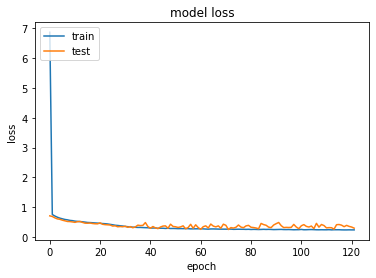

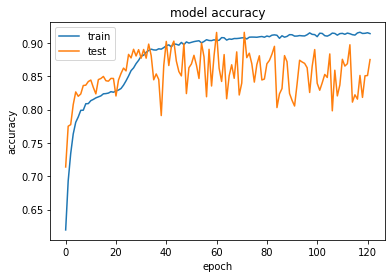

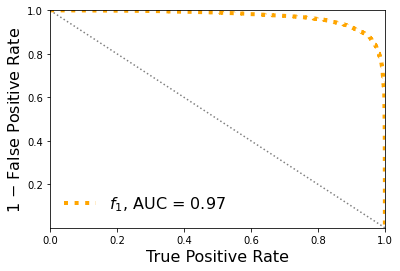

Classification score:


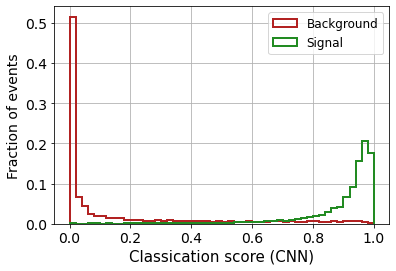


 ROC-AUC =  0.971538086757882


In [85]:

# define the keras model
model = Sequential()
model.add(Conv1D(32, 3, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(32, 2, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [86]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.971538086757882


Epoch 1/500
319/319 [==============================] - 1s 1ms/step - loss: 25.1925 - accuracy: 0.5380 - val_loss: 0.6306 - val_accuracy: 0.6988
Epoch 2/500
319/319 [==============================] - 0s 610us/step - loss: 0.6488 - accuracy: 0.6460 - val_loss: 0.6208 - val_accuracy: 0.6938
Epoch 3/500
319/319 [==============================] - 0s 581us/step - loss: 0.6484 - accuracy: 0.6424 - val_loss: 0.6303 - val_accuracy: 0.6735
Epoch 4/500
319/319 [==============================] - 0s 583us/step - loss: 0.6457 - accuracy: 0.6385 - val_loss: 0.6296 - val_accuracy: 0.6646
Epoch 5/500
319/319 [==============================] - 0s 587us/step - loss: 0.6440 - accuracy: 0.6394 - val_loss: 0.6166 - val_accuracy: 0.6843
Epoch 6/500
319/319 [==============================] - 0s 593us/step - loss: 0.6403 - accuracy: 0.6476 - val_loss: 0.6269 - val_accuracy: 0.6721
Epoch 7/500
319/319 [==============================] - 0s 584us/step - loss: 0.6440 - accuracy: 0.6385 - val_loss: 0.6176 - val_acc

319/319 [==============================] - 0s 588us/step - loss: 0.4414 - accuracy: 0.8302 - val_loss: 0.3293 - val_accuracy: 0.9221
Epoch 114/500
319/319 [==============================] - 0s 584us/step - loss: 0.4374 - accuracy: 0.8335 - val_loss: 0.3658 - val_accuracy: 0.8899
Epoch 115/500
319/319 [==============================] - 0s 588us/step - loss: 0.4445 - accuracy: 0.8309 - val_loss: 0.3217 - val_accuracy: 0.9212
Epoch 116/500
319/319 [==============================] - 0s 581us/step - loss: 0.4402 - accuracy: 0.8307 - val_loss: 0.3463 - val_accuracy: 0.9091
Epoch 117/500
319/319 [==============================] - 0s 580us/step - loss: 0.4512 - accuracy: 0.8251 - val_loss: 0.3191 - val_accuracy: 0.9195
Epoch 118/500
319/319 [==============================] - 0s 589us/step - loss: 0.4428 - accuracy: 0.8292 - val_loss: 0.3230 - val_accuracy: 0.9228
Epoch 119/500
319/319 [==============================] - 0s 580us/step - loss: 0.4407 - accuracy: 0.8290 - val_loss: 0.3219 - val_ac

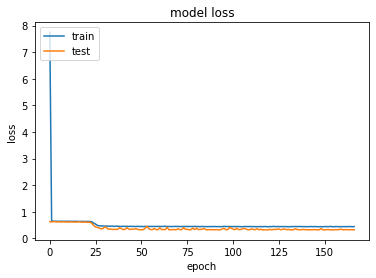

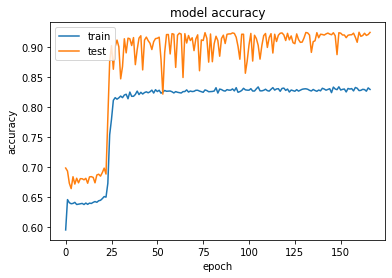

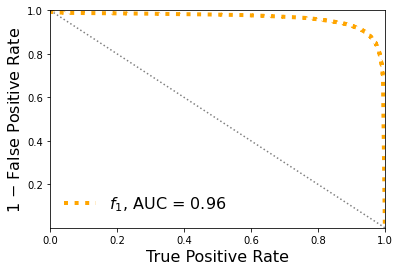

Classification score:


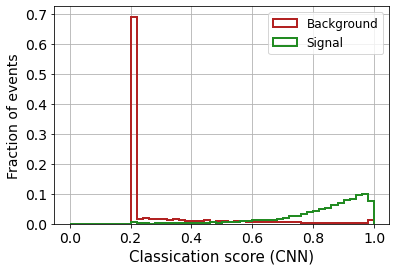


 ROC-AUC =  0.9637564502567412


In [42]:

# define the keras model
model = Sequential()
model.add(Conv1D(8, 2, input_shape=(X_mon_train.shape[1],1), activation='relu', strides = (1),kernel_regularizer=l2(0.005)))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Flatten())
model.add(Dense(4, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

## 1D. Keep the 3 features (pA_s1, pA_s2, diffT)

##### Remove some columns or features (if you want)

In [87]:
# features = ['pA','pRMSW']
remove_col_S1 = [1]
remove_col_S2 = [1]

B_pbot = B_pbot
B_ptop = B_ptop
B_ppeakS1 = np.delete(B_ppeakS1, remove_col_S1, axis=1)
B_ppeakS2 = np.delete(B_ppeakS2, remove_col_S2, axis=1)

print('B_pbot.shape: ', B_pbot.shape)
print('B_ptop.shape: ', B_ptop.shape)
print('B_ppeakS1.shape :', B_ppeakS1.shape)
print('B_ppeakS2.shape: ', B_ppeakS2.shape)


S_pbot = S_pbot
S_ptop = S_ptop
S_ppeakS1 = np.delete(S_ppeakS1, remove_col_S1, axis=1)
S_ppeakS2 = np.delete(S_ppeakS2, remove_col_S2, axis=1)

print('S_pbot.shape: ', S_pbot.shape)
print('S_ptop.shape: ', S_ptop.shape)
print('S_ppeakS1.shape :', S_ppeakS1.shape)
print('S_ppeakS2.shape: ', S_ppeakS2.shape)

B_pbot.shape:  (32015,)
B_ptop.shape:  (32015,)
B_ppeakS1.shape : (32015, 1)
B_ppeakS2.shape:  (32015, 1)
S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 1)
S_ppeakS2.shape:  (32015, 1)


In [88]:
# concatenate the data
X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

X_mon_B.shape:  (32015, 3)
X_mon_S.shape:  (32015, 3)
X_mon.shape:  (64030, 3)

X_mon_train :  (40818, 3)
y_mon_train :  (40818,)
X_mon_val :  (7204, 3)
y_mon_val :  (7204,)
X_mon_test :  (16008, 3)
y_mon_test :  (16008,)



### XGBoost

[0]	validation_0-logloss:0.68667	validation_1-logloss:0.68669
[1]	validation_0-logloss:0.68036	validation_1-logloss:0.68042
[2]	validation_0-logloss:0.67413	validation_1-logloss:0.67420
[3]	validation_0-logloss:0.66805	validation_1-logloss:0.66816


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[4]	validation_0-logloss:0.66205	validation_1-logloss:0.66217
[5]	validation_0-logloss:0.65622	validation_1-logloss:0.65636
[6]	validation_0-logloss:0.65043	validation_1-logloss:0.65061
[7]	validation_0-logloss:0.64481	validation_1-logloss:0.64502
[8]	validation_0-logloss:0.63919	validation_1-logloss:0.63941
[9]	validation_0-logloss:0.63375	validation_1-logloss:0.63400
[10]	validation_0-logloss:0.62832	validation_1-logloss:0.62859
[11]	validation_0-logloss:0.62308	validation_1-logloss:0.62339
[12]	validation_0-logloss:0.61784	validation_1-logloss:0.61814
[13]	validation_0-logloss:0.61279	validation_1-logloss:0.61312
[14]	validation_0-logloss:0.60767	validation_1-logloss:0.60805
[15]	validation_0-logloss:0.60276	validation_1-logloss:0.60318
[16]	validation_0-logloss:0.59786	validation_1-logloss:0.59828
[17]	validation_0-logloss:0.59298	validation_1-logloss:0.59346
[18]	validation_0-logloss:0.58836	validation_1-logloss:0.58886
[19]	validation_0-logloss:0.58366	validation_1-logloss:0.5842

[134]	validation_0-logloss:0.31130	validation_1-logloss:0.31493
[135]	validation_0-logloss:0.31009	validation_1-logloss:0.31376
[136]	validation_0-logloss:0.30896	validation_1-logloss:0.31266
[137]	validation_0-logloss:0.30788	validation_1-logloss:0.31162
[138]	validation_0-logloss:0.30671	validation_1-logloss:0.31046
[139]	validation_0-logloss:0.30559	validation_1-logloss:0.30942
[140]	validation_0-logloss:0.30444	validation_1-logloss:0.30831
[141]	validation_0-logloss:0.30329	validation_1-logloss:0.30720
[142]	validation_0-logloss:0.30217	validation_1-logloss:0.30610
[143]	validation_0-logloss:0.30108	validation_1-logloss:0.30498
[144]	validation_0-logloss:0.30000	validation_1-logloss:0.30394
[145]	validation_0-logloss:0.29900	validation_1-logloss:0.30300
[146]	validation_0-logloss:0.29794	validation_1-logloss:0.30196
[147]	validation_0-logloss:0.29686	validation_1-logloss:0.30093
[148]	validation_0-logloss:0.29580	validation_1-logloss:0.29989
[149]	validation_0-logloss:0.29481	valid

[263]	validation_0-logloss:0.22165	validation_1-logloss:0.23017
[264]	validation_0-logloss:0.22126	validation_1-logloss:0.22985
[265]	validation_0-logloss:0.22089	validation_1-logloss:0.22949
[266]	validation_0-logloss:0.22055	validation_1-logloss:0.22917
[267]	validation_0-logloss:0.22014	validation_1-logloss:0.22880
[268]	validation_0-logloss:0.21976	validation_1-logloss:0.22839
[269]	validation_0-logloss:0.21937	validation_1-logloss:0.22804
[270]	validation_0-logloss:0.21903	validation_1-logloss:0.22773
[271]	validation_0-logloss:0.21867	validation_1-logloss:0.22738
[272]	validation_0-logloss:0.21833	validation_1-logloss:0.22709
[273]	validation_0-logloss:0.21797	validation_1-logloss:0.22675
[274]	validation_0-logloss:0.21759	validation_1-logloss:0.22640
[275]	validation_0-logloss:0.21719	validation_1-logloss:0.22604
[276]	validation_0-logloss:0.21688	validation_1-logloss:0.22575
[277]	validation_0-logloss:0.21653	validation_1-logloss:0.22545
[278]	validation_0-logloss:0.21619	valid

[392]	validation_0-logloss:0.18910	validation_1-logloss:0.20161
[393]	validation_0-logloss:0.18898	validation_1-logloss:0.20151
[394]	validation_0-logloss:0.18880	validation_1-logloss:0.20138
[395]	validation_0-logloss:0.18863	validation_1-logloss:0.20124
[396]	validation_0-logloss:0.18846	validation_1-logloss:0.20109
[397]	validation_0-logloss:0.18828	validation_1-logloss:0.20097
[398]	validation_0-logloss:0.18812	validation_1-logloss:0.20085
[399]	validation_0-logloss:0.18794	validation_1-logloss:0.20067
[400]	validation_0-logloss:0.18782	validation_1-logloss:0.20056
[401]	validation_0-logloss:0.18765	validation_1-logloss:0.20042
[402]	validation_0-logloss:0.18751	validation_1-logloss:0.20030
[403]	validation_0-logloss:0.18736	validation_1-logloss:0.20017
[404]	validation_0-logloss:0.18718	validation_1-logloss:0.20003
[405]	validation_0-logloss:0.18700	validation_1-logloss:0.19989
[406]	validation_0-logloss:0.18685	validation_1-logloss:0.19976
[407]	validation_0-logloss:0.18669	valid

[521]	validation_0-logloss:0.17336	validation_1-logloss:0.18918
[522]	validation_0-logloss:0.17328	validation_1-logloss:0.18912
[523]	validation_0-logloss:0.17319	validation_1-logloss:0.18905
[524]	validation_0-logloss:0.17309	validation_1-logloss:0.18898
[525]	validation_0-logloss:0.17302	validation_1-logloss:0.18894
[526]	validation_0-logloss:0.17294	validation_1-logloss:0.18888
[527]	validation_0-logloss:0.17285	validation_1-logloss:0.18880
[528]	validation_0-logloss:0.17277	validation_1-logloss:0.18874
[529]	validation_0-logloss:0.17271	validation_1-logloss:0.18869
[530]	validation_0-logloss:0.17264	validation_1-logloss:0.18864
[531]	validation_0-logloss:0.17256	validation_1-logloss:0.18858
[532]	validation_0-logloss:0.17247	validation_1-logloss:0.18853
[533]	validation_0-logloss:0.17239	validation_1-logloss:0.18848
[534]	validation_0-logloss:0.17232	validation_1-logloss:0.18843
[535]	validation_0-logloss:0.17224	validation_1-logloss:0.18838
[536]	validation_0-logloss:0.17217	valid

[650]	validation_0-logloss:0.16509	validation_1-logloss:0.18327
[651]	validation_0-logloss:0.16504	validation_1-logloss:0.18324
[652]	validation_0-logloss:0.16498	validation_1-logloss:0.18319
[653]	validation_0-logloss:0.16493	validation_1-logloss:0.18316
[654]	validation_0-logloss:0.16488	validation_1-logloss:0.18314
[655]	validation_0-logloss:0.16483	validation_1-logloss:0.18311
[656]	validation_0-logloss:0.16478	validation_1-logloss:0.18308
[657]	validation_0-logloss:0.16473	validation_1-logloss:0.18305
[658]	validation_0-logloss:0.16468	validation_1-logloss:0.18301
[659]	validation_0-logloss:0.16463	validation_1-logloss:0.18298
[660]	validation_0-logloss:0.16458	validation_1-logloss:0.18295
[661]	validation_0-logloss:0.16453	validation_1-logloss:0.18292
[662]	validation_0-logloss:0.16447	validation_1-logloss:0.18289
[663]	validation_0-logloss:0.16442	validation_1-logloss:0.18285
[664]	validation_0-logloss:0.16437	validation_1-logloss:0.18281
[665]	validation_0-logloss:0.16432	valid

[779]	validation_0-logloss:0.15986	validation_1-logloss:0.18003
[780]	validation_0-logloss:0.15981	validation_1-logloss:0.18002
[781]	validation_0-logloss:0.15978	validation_1-logloss:0.18000
[782]	validation_0-logloss:0.15976	validation_1-logloss:0.17999
[783]	validation_0-logloss:0.15973	validation_1-logloss:0.17996
[784]	validation_0-logloss:0.15970	validation_1-logloss:0.17994
[785]	validation_0-logloss:0.15967	validation_1-logloss:0.17992
[786]	validation_0-logloss:0.15965	validation_1-logloss:0.17991
[787]	validation_0-logloss:0.15962	validation_1-logloss:0.17988
[788]	validation_0-logloss:0.15959	validation_1-logloss:0.17987
[789]	validation_0-logloss:0.15955	validation_1-logloss:0.17985
[790]	validation_0-logloss:0.15951	validation_1-logloss:0.17983
[791]	validation_0-logloss:0.15948	validation_1-logloss:0.17981
[792]	validation_0-logloss:0.15945	validation_1-logloss:0.17979
[793]	validation_0-logloss:0.15941	validation_1-logloss:0.17976
[794]	validation_0-logloss:0.15938	valid

[908]	validation_0-logloss:0.15642	validation_1-logloss:0.17838
[909]	validation_0-logloss:0.15641	validation_1-logloss:0.17836
[910]	validation_0-logloss:0.15639	validation_1-logloss:0.17836
[911]	validation_0-logloss:0.15637	validation_1-logloss:0.17834
[912]	validation_0-logloss:0.15634	validation_1-logloss:0.17833
[913]	validation_0-logloss:0.15632	validation_1-logloss:0.17833
[914]	validation_0-logloss:0.15630	validation_1-logloss:0.17832
[915]	validation_0-logloss:0.15628	validation_1-logloss:0.17831
[916]	validation_0-logloss:0.15627	validation_1-logloss:0.17830
[917]	validation_0-logloss:0.15625	validation_1-logloss:0.17828
[918]	validation_0-logloss:0.15623	validation_1-logloss:0.17828
[919]	validation_0-logloss:0.15621	validation_1-logloss:0.17827
[920]	validation_0-logloss:0.15618	validation_1-logloss:0.17826
[921]	validation_0-logloss:0.15616	validation_1-logloss:0.17826
[922]	validation_0-logloss:0.15613	validation_1-logloss:0.17824
[923]	validation_0-logloss:0.15611	valid

[1036]	validation_0-logloss:0.15393	validation_1-logloss:0.17764
[1037]	validation_0-logloss:0.15391	validation_1-logloss:0.17764
[1038]	validation_0-logloss:0.15388	validation_1-logloss:0.17763
[1039]	validation_0-logloss:0.15386	validation_1-logloss:0.17763
[1040]	validation_0-logloss:0.15385	validation_1-logloss:0.17762
[1041]	validation_0-logloss:0.15384	validation_1-logloss:0.17762
[1042]	validation_0-logloss:0.15381	validation_1-logloss:0.17762
[1043]	validation_0-logloss:0.15380	validation_1-logloss:0.17762
[1044]	validation_0-logloss:0.15379	validation_1-logloss:0.17762
[1045]	validation_0-logloss:0.15377	validation_1-logloss:0.17761
[1046]	validation_0-logloss:0.15375	validation_1-logloss:0.17760
[1047]	validation_0-logloss:0.15374	validation_1-logloss:0.17760
[1048]	validation_0-logloss:0.15372	validation_1-logloss:0.17759
[1049]	validation_0-logloss:0.15371	validation_1-logloss:0.17758
[1050]	validation_0-logloss:0.15369	validation_1-logloss:0.17758
[1051]	validation_0-loglo

[1163]	validation_0-logloss:0.15195	validation_1-logloss:0.17730
[1164]	validation_0-logloss:0.15194	validation_1-logloss:0.17730
[1165]	validation_0-logloss:0.15192	validation_1-logloss:0.17729
[1166]	validation_0-logloss:0.15191	validation_1-logloss:0.17730
[1167]	validation_0-logloss:0.15189	validation_1-logloss:0.17730
[1168]	validation_0-logloss:0.15187	validation_1-logloss:0.17730
[1169]	validation_0-logloss:0.15186	validation_1-logloss:0.17730
[1170]	validation_0-logloss:0.15185	validation_1-logloss:0.17730
[1171]	validation_0-logloss:0.15183	validation_1-logloss:0.17730
[1172]	validation_0-logloss:0.15183	validation_1-logloss:0.17731
[1173]	validation_0-logloss:0.15182	validation_1-logloss:0.17730
[1174]	validation_0-logloss:0.15180	validation_1-logloss:0.17729
[1175]	validation_0-logloss:0.15179	validation_1-logloss:0.17730
[1176]	validation_0-logloss:0.15177	validation_1-logloss:0.17730
[1177]	validation_0-logloss:0.15175	validation_1-logloss:0.17729
[1178]	validation_0-loglo

[1290]	validation_0-logloss:0.15016	validation_1-logloss:0.17710
[1291]	validation_0-logloss:0.15014	validation_1-logloss:0.17710
[1292]	validation_0-logloss:0.15013	validation_1-logloss:0.17710
[1293]	validation_0-logloss:0.15011	validation_1-logloss:0.17710
[1294]	validation_0-logloss:0.15010	validation_1-logloss:0.17710
[1295]	validation_0-logloss:0.15009	validation_1-logloss:0.17710
[1296]	validation_0-logloss:0.15008	validation_1-logloss:0.17710
[1297]	validation_0-logloss:0.15007	validation_1-logloss:0.17710
[1298]	validation_0-logloss:0.15005	validation_1-logloss:0.17710
[1299]	validation_0-logloss:0.15004	validation_1-logloss:0.17709
[1300]	validation_0-logloss:0.15003	validation_1-logloss:0.17709
[1301]	validation_0-logloss:0.15002	validation_1-logloss:0.17709
[1302]	validation_0-logloss:0.15000	validation_1-logloss:0.17709
[1303]	validation_0-logloss:0.14999	validation_1-logloss:0.17710
[1304]	validation_0-logloss:0.14999	validation_1-logloss:0.17710
[1305]	validation_0-loglo

[1417]	validation_0-logloss:0.14859	validation_1-logloss:0.17692
[1418]	validation_0-logloss:0.14858	validation_1-logloss:0.17693
[1419]	validation_0-logloss:0.14856	validation_1-logloss:0.17693
[1420]	validation_0-logloss:0.14855	validation_1-logloss:0.17694
[1421]	validation_0-logloss:0.14854	validation_1-logloss:0.17693
[1422]	validation_0-logloss:0.14852	validation_1-logloss:0.17693
[1423]	validation_0-logloss:0.14851	validation_1-logloss:0.17692
[1424]	validation_0-logloss:0.14850	validation_1-logloss:0.17691
[1425]	validation_0-logloss:0.14848	validation_1-logloss:0.17691
[1426]	validation_0-logloss:0.14847	validation_1-logloss:0.17690
[1427]	validation_0-logloss:0.14847	validation_1-logloss:0.17690
[1428]	validation_0-logloss:0.14845	validation_1-logloss:0.17690
[1429]	validation_0-logloss:0.14844	validation_1-logloss:0.17690
[1430]	validation_0-logloss:0.14843	validation_1-logloss:0.17690
[1431]	validation_0-logloss:0.14841	validation_1-logloss:0.17689
[1432]	validation_0-loglo

[1544]	validation_0-logloss:0.14715	validation_1-logloss:0.17683
[1545]	validation_0-logloss:0.14714	validation_1-logloss:0.17682
[1546]	validation_0-logloss:0.14713	validation_1-logloss:0.17682
[1547]	validation_0-logloss:0.14712	validation_1-logloss:0.17682
[1548]	validation_0-logloss:0.14711	validation_1-logloss:0.17681
[1549]	validation_0-logloss:0.14710	validation_1-logloss:0.17681
[1550]	validation_0-logloss:0.14708	validation_1-logloss:0.17682
[1551]	validation_0-logloss:0.14707	validation_1-logloss:0.17681
[1552]	validation_0-logloss:0.14706	validation_1-logloss:0.17681
[1553]	validation_0-logloss:0.14704	validation_1-logloss:0.17681
[1554]	validation_0-logloss:0.14704	validation_1-logloss:0.17682
[1555]	validation_0-logloss:0.14702	validation_1-logloss:0.17681
[1556]	validation_0-logloss:0.14701	validation_1-logloss:0.17682
[1557]	validation_0-logloss:0.14700	validation_1-logloss:0.17681
[1558]	validation_0-logloss:0.14699	validation_1-logloss:0.17681
[1559]	validation_0-loglo

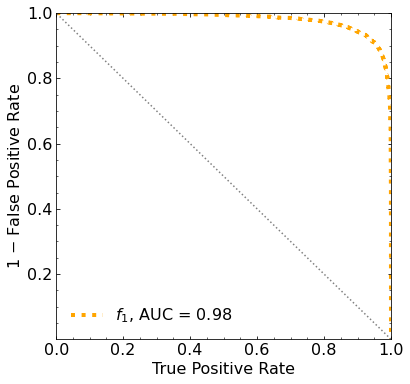

Classification score:


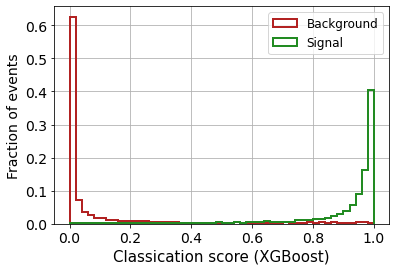


 ROC-AUC =  0.9798427091381934


In [45]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg)

In [46]:
np.savetxt('rocs/roc_3featsvD.txt', [tpr_mon_xg, fpr_mon_xg])

print('\n ROC-AUC = ', roc_auc_xg)


 ROC-AUC =  0.9798427091381934


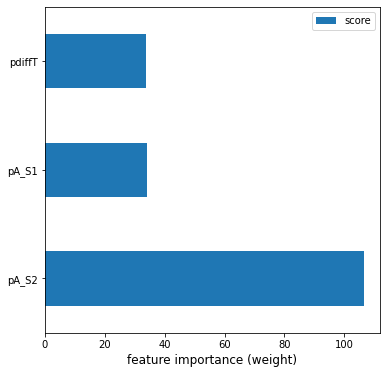

In [47]:
feature_important = classifier.get_booster().get_score(importance_type='gain')
# keys = list(feature_important.keys())
keys = ['pA_S1', 'pA_S2', 'pdiffT']
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(40, columns="score").plot(kind='barh', figsize = (6,6)) ## plot top 40 features
plt.xlabel('feature importance (weight)', fontsize = 12)
plt.show()

### DNN

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_39 (Dense)             (None, 128)               512       
_________________________________________________________________
leaky_re_lu_26 (LeakyReLU)   (None, 128)               0         
_________________________________________________________________
dropout_31 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_40 (Dense)             (None, 64)                8256      
_________________________________________________________________
leaky_re_lu_27 (LeakyReLU)   (None, 64)                0         
_________________________________________________________________
dropout_32 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_41 (Dense)             (None, 32)              

319/319 [==============================] - 0s 928us/step - loss: 0.2440 - accuracy: 0.9041 - val_loss: 0.2859 - val_accuracy: 0.8834
Restoring model weights from the end of the best epoch.
Epoch 00093: early stopping


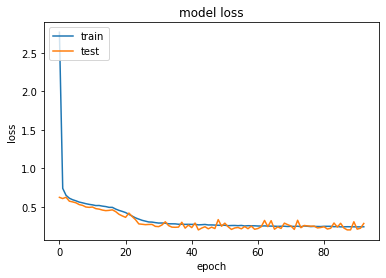

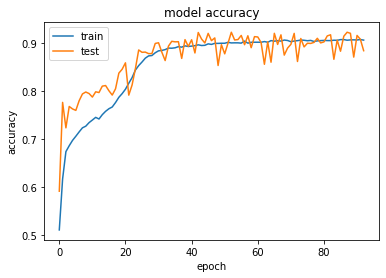

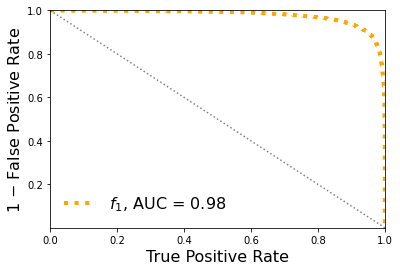

Classification score:


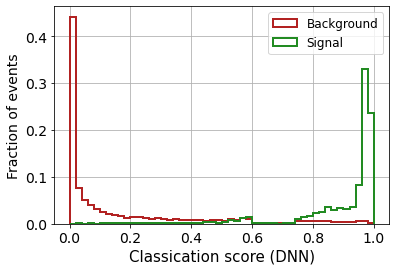


 ROC-AUC =  0.9760588062010008


In [48]:

# define the keras model
model = Sequential()
model.add(Dense(128, input_shape=(X_mon_train.shape[1],)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(64))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(32))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(16))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(8))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(4))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

In [49]:
print('\n ROC-AUC = ', roc_auc_dnn)


 ROC-AUC =  0.9760588062010008


Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_46 (Dense)             (None, 4)                 16        
_________________________________________________________________
dropout_37 (Dropout)         (None, 4)                 0         
_________________________________________________________________
dense_47 (Dense)             (None, 16)                80        
_________________________________________________________________
dropout_38 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_48 (Dense)             (None, 4)                 68        
_________________________________________________________________
dropout_39 (Dropout)         (None, 4)                 0         
_________________________________________________________________
dense_49 (Dense)             (None, 1)               

319/319 [==============================] - 0s 569us/step - loss: 0.3079 - accuracy: 0.8806 - val_loss: 0.6266 - val_accuracy: 0.6998
Epoch 105/500
319/319 [==============================] - 0s 544us/step - loss: 0.3081 - accuracy: 0.8789 - val_loss: 0.6507 - val_accuracy: 0.6825
Epoch 106/500
319/319 [==============================] - 0s 536us/step - loss: 0.3174 - accuracy: 0.8755 - val_loss: 0.5715 - val_accuracy: 0.7232
Restoring model weights from the end of the best epoch.
Epoch 00106: early stopping


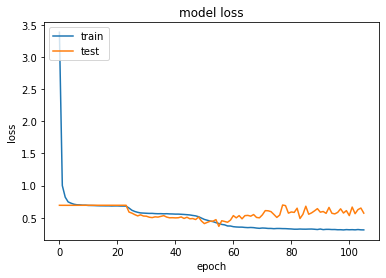

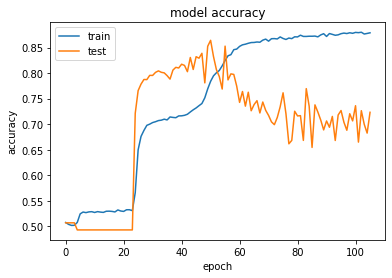

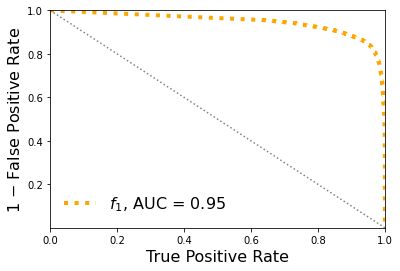

Classification score:


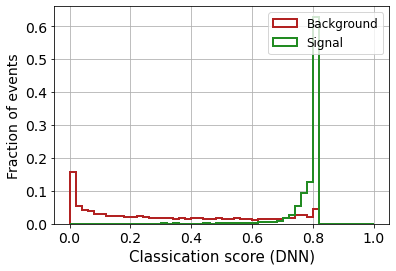


 ROC-AUC =  0.9477556112314435


In [50]:

# define the keras model
model = Sequential()
model.add(Dense(4, input_shape=(X_mon_train.shape[1],), activation='relu'))
model.add(Dropout(0.20))
# model.add(Dense(8, activation='relu'))
# model.add(Dropout(0.20))
model.add(Dense(16, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(4, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

### CNN

In [89]:
# prepare the dataset
X_mon_train_cn = X_mon_train.reshape(X_mon_train.shape[0], X_mon_train.shape[1], 1)
X_mon_test_cn = X_mon_test.reshape(X_mon_test.shape[0], X_mon_test.shape[1], 1)
X_mon_val_cn = X_mon_val.reshape(X_mon_val.shape[0], X_mon_val.shape[1], 1)

Epoch 1/500
319/319 [==============================] - 1s 1ms/step - loss: 35.1495 - accuracy: 0.5451 - val_loss: 0.8193 - val_accuracy: 0.7024
Epoch 2/500
319/319 [==============================] - 0s 667us/step - loss: 3.1380 - accuracy: 0.5875 - val_loss: 0.7046 - val_accuracy: 0.7217
Epoch 3/500
319/319 [==============================] - 0s 669us/step - loss: 1.7329 - accuracy: 0.6196 - val_loss: 0.5979 - val_accuracy: 0.7363
Epoch 4/500
319/319 [==============================] - 0s 686us/step - loss: 1.1195 - accuracy: 0.6461 - val_loss: 0.5457 - val_accuracy: 0.7542
Epoch 5/500
319/319 [==============================] - 0s 648us/step - loss: 0.8147 - accuracy: 0.6732 - val_loss: 0.5199 - val_accuracy: 0.7757
Epoch 6/500
319/319 [==============================] - 0s 663us/step - loss: 0.6641 - accuracy: 0.7112 - val_loss: 0.4981 - val_accuracy: 0.7953
Epoch 7/500
319/319 [==============================] - 0s 660us/step - loss: 0.5719 - accuracy: 0.7414 - val_loss: 0.4876 - val_acc

319/319 [==============================] - 0s 660us/step - loss: 0.2660 - accuracy: 0.8966 - val_loss: 0.2188 - val_accuracy: 0.9200
Epoch 114/500
319/319 [==============================] - 0s 659us/step - loss: 0.2714 - accuracy: 0.8955 - val_loss: 0.3335 - val_accuracy: 0.8583
Epoch 115/500
319/319 [==============================] - 0s 653us/step - loss: 0.2685 - accuracy: 0.8954 - val_loss: 0.2761 - val_accuracy: 0.8926
Epoch 116/500
319/319 [==============================] - 0s 669us/step - loss: 0.2635 - accuracy: 0.8965 - val_loss: 0.2149 - val_accuracy: 0.9227
Epoch 117/500
319/319 [==============================] - 0s 659us/step - loss: 0.2618 - accuracy: 0.8978 - val_loss: 0.2501 - val_accuracy: 0.9051
Epoch 118/500
319/319 [==============================] - 0s 664us/step - loss: 0.2636 - accuracy: 0.9007 - val_loss: 0.2171 - val_accuracy: 0.9243
Epoch 119/500
319/319 [==============================] - 0s 656us/step - loss: 0.2708 - accuracy: 0.8963 - val_loss: 0.2085 - val_ac

Epoch 169/500
319/319 [==============================] - 0s 687us/step - loss: 0.2626 - accuracy: 0.8985 - val_loss: 0.2214 - val_accuracy: 0.9232
Restoring model weights from the end of the best epoch.
Epoch 00169: early stopping


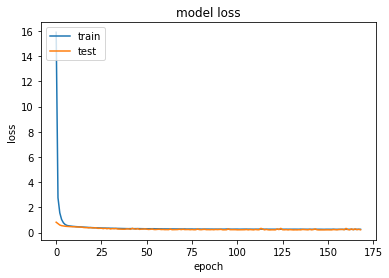

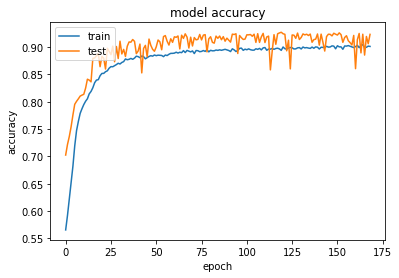

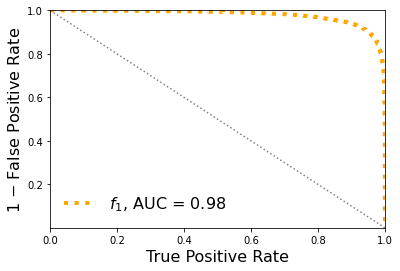

Classification score:


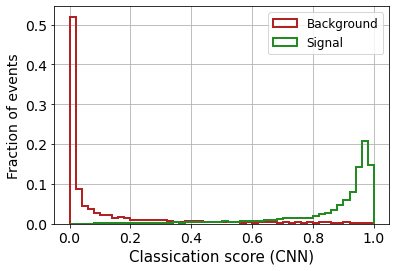


 ROC-AUC =  0.9771340239572412


In [98]:

# define the keras model
model = Sequential()
model.add(Conv1D(32, 2, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
# model.add(Conv1D(8, 2, kernel_regularizer=l2(0.005)))
# model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [99]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.9771340239572412


Epoch 1/500
319/319 [==============================] - 1s 1ms/step - loss: 42.7444 - accuracy: 0.5704 - val_loss: 0.7263 - val_accuracy: 0.5872
Epoch 2/500
319/319 [==============================] - 0s 579us/step - loss: 0.7341 - accuracy: 0.5691 - val_loss: 0.6846 - val_accuracy: 0.5669
Epoch 3/500
319/319 [==============================] - 0s 557us/step - loss: 0.6923 - accuracy: 0.5550 - val_loss: 0.6817 - val_accuracy: 0.5611
Epoch 4/500
319/319 [==============================] - 0s 558us/step - loss: 0.6865 - accuracy: 0.5574 - val_loss: 0.6776 - val_accuracy: 0.5632
Epoch 5/500
319/319 [==============================] - 0s 534us/step - loss: 0.6770 - accuracy: 0.5558 - val_loss: 0.6731 - val_accuracy: 0.5679
Epoch 6/500
319/319 [==============================] - 0s 536us/step - loss: 0.6745 - accuracy: 0.5635 - val_loss: 0.6739 - val_accuracy: 0.5825
Epoch 7/500
319/319 [==============================] - 0s 559us/step - loss: 0.6751 - accuracy: 0.5590 - val_loss: 0.6632 - val_acc

319/319 [==============================] - 0s 606us/step - loss: 0.4560 - accuracy: 0.8153 - val_loss: 0.3428 - val_accuracy: 0.8967
Epoch 114/500
319/319 [==============================] - 0s 542us/step - loss: 0.4580 - accuracy: 0.8119 - val_loss: 0.3441 - val_accuracy: 0.8969
Epoch 115/500
319/319 [==============================] - 0s 565us/step - loss: 0.4592 - accuracy: 0.8089 - val_loss: 0.3731 - val_accuracy: 0.8865
Epoch 116/500
319/319 [==============================] - 0s 553us/step - loss: 0.4583 - accuracy: 0.8109 - val_loss: 0.3435 - val_accuracy: 0.9009
Epoch 117/500
319/319 [==============================] - 0s 586us/step - loss: 0.4578 - accuracy: 0.8132 - val_loss: 0.3423 - val_accuracy: 0.8973
Epoch 118/500
319/319 [==============================] - 0s 569us/step - loss: 0.4585 - accuracy: 0.8098 - val_loss: 0.3451 - val_accuracy: 0.8928
Epoch 119/500
319/319 [==============================] - 0s 563us/step - loss: 0.4719 - accuracy: 0.8016 - val_loss: 0.3512 - val_ac

Epoch 169/500
319/319 [==============================] - 0s 557us/step - loss: 0.4565 - accuracy: 0.8138 - val_loss: 0.4620 - val_accuracy: 0.8094
Epoch 170/500
319/319 [==============================] - 0s 558us/step - loss: 0.4658 - accuracy: 0.8075 - val_loss: 0.3458 - val_accuracy: 0.9031
Epoch 171/500
319/319 [==============================] - 0s 552us/step - loss: 0.4557 - accuracy: 0.8140 - val_loss: 0.3954 - val_accuracy: 0.8655
Epoch 172/500
319/319 [==============================] - 0s 566us/step - loss: 0.4584 - accuracy: 0.8095 - val_loss: 0.3452 - val_accuracy: 0.9026
Epoch 173/500
319/319 [==============================] - 0s 577us/step - loss: 0.4582 - accuracy: 0.8128 - val_loss: 0.3768 - val_accuracy: 0.8806
Epoch 174/500
319/319 [==============================] - 0s 587us/step - loss: 0.4625 - accuracy: 0.8097 - val_loss: 0.3524 - val_accuracy: 0.8819
Epoch 175/500
319/319 [==============================] - 0s 582us/step - loss: 0.4612 - accuracy: 0.8098 - val_loss: 0

Epoch 225/500
319/319 [==============================] - 0s 544us/step - loss: 0.4558 - accuracy: 0.8126 - val_loss: 0.3418 - val_accuracy: 0.9020
Restoring model weights from the end of the best epoch.
Epoch 00225: early stopping


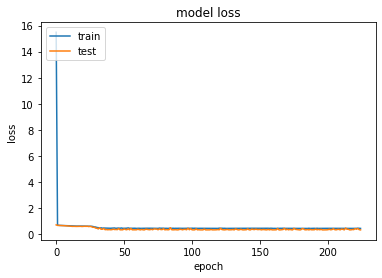

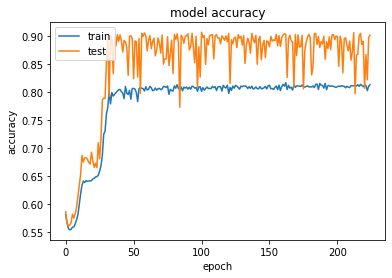

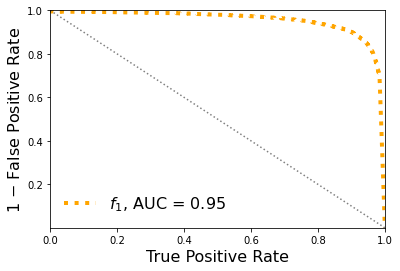

Classification score:


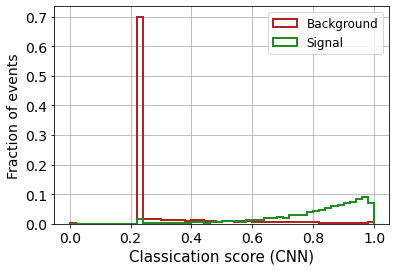


 ROC-AUC =  0.9528435562964854


In [53]:

# define the keras model
model = Sequential()
model.add(Conv1D(8, 2, input_shape=(X_mon_train.shape[1],1), activation='relu', strides = (1),kernel_regularizer=l2(0.005)))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Flatten())
model.add(Dense(4, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

## 2. All but Remove time diff between pulses (16 feats) (reload features)

In [15]:
# concatenate the data
X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(B_ptop,(len(B_ptop),1)) ],axis=1)
X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pbot,(len(S_pbot),1)), np.reshape(S_ptop,(len(S_ptop),1)) ],axis=1)

print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

X_mon_B.shape:  (32015, 16)
X_mon_S.shape:  (32015, 16)
X_mon.shape:  (64030, 16)

X_mon_train :  (40818, 16)
y_mon_train :  (40818,)
X_mon_val :  (7204, 16)
y_mon_val :  (7204,)
X_mon_test :  (16008, 16)
y_mon_test :  (16008,)



### XGBoost

[0]	validation_0-logloss:0.68746	validation_1-logloss:0.68743
[1]	validation_0-logloss:0.68185	validation_1-logloss:0.68179


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[2]	validation_0-logloss:0.67635	validation_1-logloss:0.67626
[3]	validation_0-logloss:0.67096	validation_1-logloss:0.67085
[4]	validation_0-logloss:0.66564	validation_1-logloss:0.66548
[5]	validation_0-logloss:0.66046	validation_1-logloss:0.66028
[6]	validation_0-logloss:0.65535	validation_1-logloss:0.65518
[7]	validation_0-logloss:0.65035	validation_1-logloss:0.65012
[8]	validation_0-logloss:0.64543	validation_1-logloss:0.64521
[9]	validation_0-logloss:0.64060	validation_1-logloss:0.64033
[10]	validation_0-logloss:0.63585	validation_1-logloss:0.63559
[11]	validation_0-logloss:0.63118	validation_1-logloss:0.63092
[12]	validation_0-logloss:0.62661	validation_1-logloss:0.62639
[13]	validation_0-logloss:0.62209	validation_1-logloss:0.62186
[14]	validation_0-logloss:0.61766	validation_1-logloss:0.61746
[15]	validation_0-logloss:0.61331	validation_1-logloss:0.61312
[16]	validation_0-logloss:0.60902	validation_1-logloss:0.60882
[17]	validation_0-logloss:0.60481	validation_1-logloss:0.60459


[132]	validation_0-logloss:0.36755	validation_1-logloss:0.36930
[133]	validation_0-logloss:0.36663	validation_1-logloss:0.36840
[134]	validation_0-logloss:0.36573	validation_1-logloss:0.36754
[135]	validation_0-logloss:0.36479	validation_1-logloss:0.36663
[136]	validation_0-logloss:0.36386	validation_1-logloss:0.36571
[137]	validation_0-logloss:0.36292	validation_1-logloss:0.36483
[138]	validation_0-logloss:0.36205	validation_1-logloss:0.36399
[139]	validation_0-logloss:0.36120	validation_1-logloss:0.36317
[140]	validation_0-logloss:0.36037	validation_1-logloss:0.36236
[141]	validation_0-logloss:0.35949	validation_1-logloss:0.36152
[142]	validation_0-logloss:0.35861	validation_1-logloss:0.36067
[143]	validation_0-logloss:0.35775	validation_1-logloss:0.35983
[144]	validation_0-logloss:0.35690	validation_1-logloss:0.35903
[145]	validation_0-logloss:0.35608	validation_1-logloss:0.35826
[146]	validation_0-logloss:0.35525	validation_1-logloss:0.35745
[147]	validation_0-logloss:0.35445	valid

[261]	validation_0-logloss:0.29783	validation_1-logloss:0.30449
[262]	validation_0-logloss:0.29753	validation_1-logloss:0.30426
[263]	validation_0-logloss:0.29725	validation_1-logloss:0.30400
[264]	validation_0-logloss:0.29700	validation_1-logloss:0.30379
[265]	validation_0-logloss:0.29673	validation_1-logloss:0.30353
[266]	validation_0-logloss:0.29644	validation_1-logloss:0.30329
[267]	validation_0-logloss:0.29614	validation_1-logloss:0.30303
[268]	validation_0-logloss:0.29588	validation_1-logloss:0.30279
[269]	validation_0-logloss:0.29562	validation_1-logloss:0.30254
[270]	validation_0-logloss:0.29538	validation_1-logloss:0.30234
[271]	validation_0-logloss:0.29509	validation_1-logloss:0.30208
[272]	validation_0-logloss:0.29483	validation_1-logloss:0.30183
[273]	validation_0-logloss:0.29456	validation_1-logloss:0.30158
[274]	validation_0-logloss:0.29429	validation_1-logloss:0.30136
[275]	validation_0-logloss:0.29406	validation_1-logloss:0.30116
[276]	validation_0-logloss:0.29378	valid

[390]	validation_0-logloss:0.27239	validation_1-logloss:0.28355
[391]	validation_0-logloss:0.27223	validation_1-logloss:0.28346
[392]	validation_0-logloss:0.27209	validation_1-logloss:0.28334
[393]	validation_0-logloss:0.27195	validation_1-logloss:0.28326
[394]	validation_0-logloss:0.27182	validation_1-logloss:0.28315
[395]	validation_0-logloss:0.27166	validation_1-logloss:0.28303
[396]	validation_0-logloss:0.27153	validation_1-logloss:0.28294
[397]	validation_0-logloss:0.27140	validation_1-logloss:0.28284
[398]	validation_0-logloss:0.27128	validation_1-logloss:0.28275
[399]	validation_0-logloss:0.27114	validation_1-logloss:0.28267
[400]	validation_0-logloss:0.27099	validation_1-logloss:0.28257
[401]	validation_0-logloss:0.27088	validation_1-logloss:0.28248
[402]	validation_0-logloss:0.27073	validation_1-logloss:0.28237
[403]	validation_0-logloss:0.27060	validation_1-logloss:0.28229
[404]	validation_0-logloss:0.27046	validation_1-logloss:0.28218
[405]	validation_0-logloss:0.27031	valid

[519]	validation_0-logloss:0.25843	validation_1-logloss:0.27465
[520]	validation_0-logloss:0.25834	validation_1-logloss:0.27462
[521]	validation_0-logloss:0.25824	validation_1-logloss:0.27455
[522]	validation_0-logloss:0.25814	validation_1-logloss:0.27449
[523]	validation_0-logloss:0.25808	validation_1-logloss:0.27444
[524]	validation_0-logloss:0.25799	validation_1-logloss:0.27440
[525]	validation_0-logloss:0.25793	validation_1-logloss:0.27437
[526]	validation_0-logloss:0.25785	validation_1-logloss:0.27432
[527]	validation_0-logloss:0.25778	validation_1-logloss:0.27429
[528]	validation_0-logloss:0.25770	validation_1-logloss:0.27423
[529]	validation_0-logloss:0.25761	validation_1-logloss:0.27417
[530]	validation_0-logloss:0.25752	validation_1-logloss:0.27411
[531]	validation_0-logloss:0.25743	validation_1-logloss:0.27407
[532]	validation_0-logloss:0.25735	validation_1-logloss:0.27401
[533]	validation_0-logloss:0.25725	validation_1-logloss:0.27395
[534]	validation_0-logloss:0.25716	valid

[648]	validation_0-logloss:0.24866	validation_1-logloss:0.26958
[649]	validation_0-logloss:0.24860	validation_1-logloss:0.26954
[650]	validation_0-logloss:0.24854	validation_1-logloss:0.26951
[651]	validation_0-logloss:0.24848	validation_1-logloss:0.26949
[652]	validation_0-logloss:0.24844	validation_1-logloss:0.26947
[653]	validation_0-logloss:0.24837	validation_1-logloss:0.26944
[654]	validation_0-logloss:0.24830	validation_1-logloss:0.26940
[655]	validation_0-logloss:0.24822	validation_1-logloss:0.26935
[656]	validation_0-logloss:0.24814	validation_1-logloss:0.26930
[657]	validation_0-logloss:0.24807	validation_1-logloss:0.26928
[658]	validation_0-logloss:0.24801	validation_1-logloss:0.26924
[659]	validation_0-logloss:0.24797	validation_1-logloss:0.26922
[660]	validation_0-logloss:0.24791	validation_1-logloss:0.26920
[661]	validation_0-logloss:0.24783	validation_1-logloss:0.26916
[662]	validation_0-logloss:0.24777	validation_1-logloss:0.26914
[663]	validation_0-logloss:0.24770	valid

[777]	validation_0-logloss:0.24090	validation_1-logloss:0.26616
[778]	validation_0-logloss:0.24085	validation_1-logloss:0.26613
[779]	validation_0-logloss:0.24081	validation_1-logloss:0.26611
[780]	validation_0-logloss:0.24073	validation_1-logloss:0.26607
[781]	validation_0-logloss:0.24069	validation_1-logloss:0.26604
[782]	validation_0-logloss:0.24063	validation_1-logloss:0.26602
[783]	validation_0-logloss:0.24059	validation_1-logloss:0.26599
[784]	validation_0-logloss:0.24054	validation_1-logloss:0.26597
[785]	validation_0-logloss:0.24048	validation_1-logloss:0.26597
[786]	validation_0-logloss:0.24044	validation_1-logloss:0.26596
[787]	validation_0-logloss:0.24039	validation_1-logloss:0.26595
[788]	validation_0-logloss:0.24036	validation_1-logloss:0.26593
[789]	validation_0-logloss:0.24028	validation_1-logloss:0.26591
[790]	validation_0-logloss:0.24024	validation_1-logloss:0.26589
[791]	validation_0-logloss:0.24019	validation_1-logloss:0.26588
[792]	validation_0-logloss:0.24013	valid

[906]	validation_0-logloss:0.23467	validation_1-logloss:0.26356
[907]	validation_0-logloss:0.23463	validation_1-logloss:0.26354
[908]	validation_0-logloss:0.23456	validation_1-logloss:0.26350
[909]	validation_0-logloss:0.23452	validation_1-logloss:0.26348
[910]	validation_0-logloss:0.23447	validation_1-logloss:0.26347
[911]	validation_0-logloss:0.23442	validation_1-logloss:0.26345
[912]	validation_0-logloss:0.23438	validation_1-logloss:0.26344
[913]	validation_0-logloss:0.23435	validation_1-logloss:0.26342
[914]	validation_0-logloss:0.23432	validation_1-logloss:0.26341
[915]	validation_0-logloss:0.23427	validation_1-logloss:0.26338
[916]	validation_0-logloss:0.23424	validation_1-logloss:0.26337
[917]	validation_0-logloss:0.23418	validation_1-logloss:0.26335
[918]	validation_0-logloss:0.23413	validation_1-logloss:0.26331
[919]	validation_0-logloss:0.23408	validation_1-logloss:0.26329
[920]	validation_0-logloss:0.23402	validation_1-logloss:0.26327
[921]	validation_0-logloss:0.23397	valid

[1034]	validation_0-logloss:0.22927	validation_1-logloss:0.26150
[1035]	validation_0-logloss:0.22923	validation_1-logloss:0.26147
[1036]	validation_0-logloss:0.22920	validation_1-logloss:0.26146
[1037]	validation_0-logloss:0.22915	validation_1-logloss:0.26144
[1038]	validation_0-logloss:0.22911	validation_1-logloss:0.26142
[1039]	validation_0-logloss:0.22908	validation_1-logloss:0.26141
[1040]	validation_0-logloss:0.22905	validation_1-logloss:0.26140
[1041]	validation_0-logloss:0.22901	validation_1-logloss:0.26138
[1042]	validation_0-logloss:0.22895	validation_1-logloss:0.26136
[1043]	validation_0-logloss:0.22890	validation_1-logloss:0.26134
[1044]	validation_0-logloss:0.22886	validation_1-logloss:0.26132
[1045]	validation_0-logloss:0.22881	validation_1-logloss:0.26130
[1046]	validation_0-logloss:0.22879	validation_1-logloss:0.26129
[1047]	validation_0-logloss:0.22874	validation_1-logloss:0.26128
[1048]	validation_0-logloss:0.22871	validation_1-logloss:0.26128
[1049]	validation_0-loglo

[1161]	validation_0-logloss:0.22464	validation_1-logloss:0.25994
[1162]	validation_0-logloss:0.22461	validation_1-logloss:0.25993
[1163]	validation_0-logloss:0.22457	validation_1-logloss:0.25994
[1164]	validation_0-logloss:0.22454	validation_1-logloss:0.25993
[1165]	validation_0-logloss:0.22451	validation_1-logloss:0.25991
[1166]	validation_0-logloss:0.22446	validation_1-logloss:0.25991
[1167]	validation_0-logloss:0.22444	validation_1-logloss:0.25990
[1168]	validation_0-logloss:0.22437	validation_1-logloss:0.25989
[1169]	validation_0-logloss:0.22434	validation_1-logloss:0.25987
[1170]	validation_0-logloss:0.22429	validation_1-logloss:0.25986
[1171]	validation_0-logloss:0.22427	validation_1-logloss:0.25986
[1172]	validation_0-logloss:0.22422	validation_1-logloss:0.25983
[1173]	validation_0-logloss:0.22418	validation_1-logloss:0.25982
[1174]	validation_0-logloss:0.22416	validation_1-logloss:0.25982
[1175]	validation_0-logloss:0.22412	validation_1-logloss:0.25980
[1176]	validation_0-loglo

[1288]	validation_0-logloss:0.22000	validation_1-logloss:0.25850
[1289]	validation_0-logloss:0.21999	validation_1-logloss:0.25849
[1290]	validation_0-logloss:0.21994	validation_1-logloss:0.25848
[1291]	validation_0-logloss:0.21990	validation_1-logloss:0.25847
[1292]	validation_0-logloss:0.21988	validation_1-logloss:0.25845
[1293]	validation_0-logloss:0.21983	validation_1-logloss:0.25845
[1294]	validation_0-logloss:0.21978	validation_1-logloss:0.25844
[1295]	validation_0-logloss:0.21976	validation_1-logloss:0.25844
[1296]	validation_0-logloss:0.21971	validation_1-logloss:0.25843
[1297]	validation_0-logloss:0.21968	validation_1-logloss:0.25840
[1298]	validation_0-logloss:0.21965	validation_1-logloss:0.25840
[1299]	validation_0-logloss:0.21961	validation_1-logloss:0.25839
[1300]	validation_0-logloss:0.21958	validation_1-logloss:0.25837
[1301]	validation_0-logloss:0.21955	validation_1-logloss:0.25835
[1302]	validation_0-logloss:0.21952	validation_1-logloss:0.25834
[1303]	validation_0-loglo

[1541]	validation_0-logloss:0.21212	validation_1-logloss:0.25689
[1542]	validation_0-logloss:0.21209	validation_1-logloss:0.25688
[1543]	validation_0-logloss:0.21206	validation_1-logloss:0.25686
[1544]	validation_0-logloss:0.21205	validation_1-logloss:0.25686
[1545]	validation_0-logloss:0.21200	validation_1-logloss:0.25685
[1546]	validation_0-logloss:0.21198	validation_1-logloss:0.25685
[1547]	validation_0-logloss:0.21195	validation_1-logloss:0.25684
[1548]	validation_0-logloss:0.21193	validation_1-logloss:0.25685
[1549]	validation_0-logloss:0.21191	validation_1-logloss:0.25684
[1550]	validation_0-logloss:0.21189	validation_1-logloss:0.25684
[1551]	validation_0-logloss:0.21185	validation_1-logloss:0.25683
[1552]	validation_0-logloss:0.21182	validation_1-logloss:0.25683
[1553]	validation_0-logloss:0.21179	validation_1-logloss:0.25682
[1554]	validation_0-logloss:0.21177	validation_1-logloss:0.25682
[1555]	validation_0-logloss:0.21175	validation_1-logloss:0.25681
[1556]	validation_0-loglo

[1668]	validation_0-logloss:0.20882	validation_1-logloss:0.25649
[1669]	validation_0-logloss:0.20881	validation_1-logloss:0.25649
[1670]	validation_0-logloss:0.20880	validation_1-logloss:0.25650
[1671]	validation_0-logloss:0.20878	validation_1-logloss:0.25649
[1672]	validation_0-logloss:0.20874	validation_1-logloss:0.25649
[1673]	validation_0-logloss:0.20873	validation_1-logloss:0.25649
[1674]	validation_0-logloss:0.20870	validation_1-logloss:0.25649
[1675]	validation_0-logloss:0.20866	validation_1-logloss:0.25648
[1676]	validation_0-logloss:0.20864	validation_1-logloss:0.25647
[1677]	validation_0-logloss:0.20860	validation_1-logloss:0.25647
[1678]	validation_0-logloss:0.20859	validation_1-logloss:0.25647
[1679]	validation_0-logloss:0.20856	validation_1-logloss:0.25647
[1680]	validation_0-logloss:0.20853	validation_1-logloss:0.25646
[1681]	validation_0-logloss:0.20849	validation_1-logloss:0.25647
[1682]	validation_0-logloss:0.20846	validation_1-logloss:0.25646
[1683]	validation_0-loglo

[1795]	validation_0-logloss:0.20547	validation_1-logloss:0.25618
[1796]	validation_0-logloss:0.20543	validation_1-logloss:0.25617
[1797]	validation_0-logloss:0.20541	validation_1-logloss:0.25617
[1798]	validation_0-logloss:0.20539	validation_1-logloss:0.25616
[1799]	validation_0-logloss:0.20538	validation_1-logloss:0.25616
[1800]	validation_0-logloss:0.20535	validation_1-logloss:0.25617
[1801]	validation_0-logloss:0.20532	validation_1-logloss:0.25616
[1802]	validation_0-logloss:0.20531	validation_1-logloss:0.25616
[1803]	validation_0-logloss:0.20531	validation_1-logloss:0.25616
[1804]	validation_0-logloss:0.20528	validation_1-logloss:0.25616
[1805]	validation_0-logloss:0.20526	validation_1-logloss:0.25616
[1806]	validation_0-logloss:0.20524	validation_1-logloss:0.25616
[1807]	validation_0-logloss:0.20521	validation_1-logloss:0.25615
[1808]	validation_0-logloss:0.20519	validation_1-logloss:0.25614
[1809]	validation_0-logloss:0.20517	validation_1-logloss:0.25614
[1810]	validation_0-loglo

[1922]	validation_0-logloss:0.20245	validation_1-logloss:0.25594
[1923]	validation_0-logloss:0.20243	validation_1-logloss:0.25594
[1924]	validation_0-logloss:0.20239	validation_1-logloss:0.25593
[1925]	validation_0-logloss:0.20238	validation_1-logloss:0.25593
[1926]	validation_0-logloss:0.20237	validation_1-logloss:0.25594
[1927]	validation_0-logloss:0.20235	validation_1-logloss:0.25594
[1928]	validation_0-logloss:0.20232	validation_1-logloss:0.25593
[1929]	validation_0-logloss:0.20230	validation_1-logloss:0.25593
[1930]	validation_0-logloss:0.20227	validation_1-logloss:0.25593
[1931]	validation_0-logloss:0.20224	validation_1-logloss:0.25593
[1932]	validation_0-logloss:0.20220	validation_1-logloss:0.25593
[1933]	validation_0-logloss:0.20217	validation_1-logloss:0.25593
[1934]	validation_0-logloss:0.20212	validation_1-logloss:0.25592
[1935]	validation_0-logloss:0.20210	validation_1-logloss:0.25592
[1936]	validation_0-logloss:0.20207	validation_1-logloss:0.25592
[1937]	validation_0-loglo

[2049]	validation_0-logloss:0.19951	validation_1-logloss:0.25582
[2050]	validation_0-logloss:0.19948	validation_1-logloss:0.25582
[2051]	validation_0-logloss:0.19946	validation_1-logloss:0.25582
[2052]	validation_0-logloss:0.19945	validation_1-logloss:0.25582
[2053]	validation_0-logloss:0.19944	validation_1-logloss:0.25582
[2054]	validation_0-logloss:0.19942	validation_1-logloss:0.25581
[2055]	validation_0-logloss:0.19937	validation_1-logloss:0.25582
[2056]	validation_0-logloss:0.19935	validation_1-logloss:0.25582
[2057]	validation_0-logloss:0.19931	validation_1-logloss:0.25583
[2058]	validation_0-logloss:0.19926	validation_1-logloss:0.25582
[2059]	validation_0-logloss:0.19923	validation_1-logloss:0.25581
[2060]	validation_0-logloss:0.19921	validation_1-logloss:0.25582
[2061]	validation_0-logloss:0.19918	validation_1-logloss:0.25581
[2062]	validation_0-logloss:0.19917	validation_1-logloss:0.25582
[2063]	validation_0-logloss:0.19912	validation_1-logloss:0.25580
[2064]	validation_0-loglo

[2176]	validation_0-logloss:0.19662	validation_1-logloss:0.25576
[2177]	validation_0-logloss:0.19660	validation_1-logloss:0.25575
[2178]	validation_0-logloss:0.19657	validation_1-logloss:0.25574
[2179]	validation_0-logloss:0.19656	validation_1-logloss:0.25575
[2180]	validation_0-logloss:0.19654	validation_1-logloss:0.25576
[2181]	validation_0-logloss:0.19650	validation_1-logloss:0.25575
[2182]	validation_0-logloss:0.19647	validation_1-logloss:0.25576
[2183]	validation_0-logloss:0.19645	validation_1-logloss:0.25576
[2184]	validation_0-logloss:0.19642	validation_1-logloss:0.25576
[2185]	validation_0-logloss:0.19639	validation_1-logloss:0.25577
[2186]	validation_0-logloss:0.19637	validation_1-logloss:0.25577


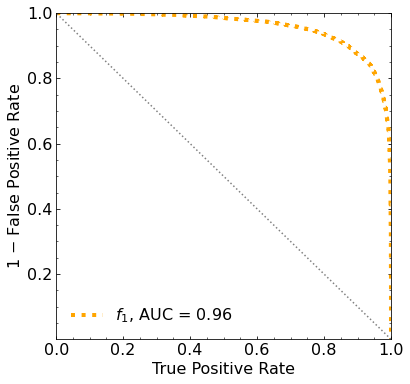

Classification score:


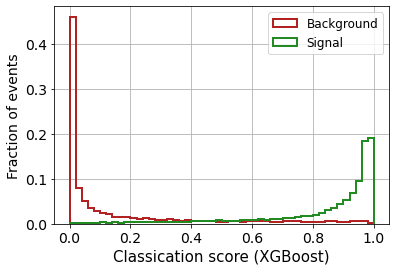


 ROC-AUC =  0.9576023258303261


In [16]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg)

In [17]:
np.savetxt('rocs/roc_16feats.txt', [tpr_mon_xg, fpr_mon_xg])

print('\n ROC-AUC = ', roc_auc_xg)


 ROC-AUC =  0.9576023258303261


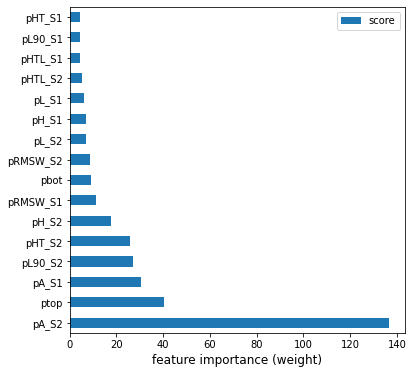

In [43]:
feature_important = classifier.get_booster().get_score(importance_type='gain')
# keys = list(feature_important.keys())
keys = ['pA_S1','pH_S1','pHT_S1','pL_S1','pL90_S1','pRMSW_S1','pHTL_S1','pA_S2','pH_S2','pHT_S2','pL_S2','pL90_S2','pRMSW_S2','pHTL_S2','pbot', 'ptop']
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(40, columns="score").plot(kind='barh', figsize = (6,6)) ## plot top 40 features
plt.xlabel('feature importance (weight)', fontsize = 12)
plt.show()

### DNN

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_40 (Dense)             (None, 128)               2176      
_________________________________________________________________
leaky_re_lu_33 (LeakyReLU)   (None, 128)               0         
_________________________________________________________________
dropout_33 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_41 (Dense)             (None, 64)                8256      
_________________________________________________________________
leaky_re_lu_34 (LeakyReLU)   (None, 64)                0         
_________________________________________________________________
dropout_34 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_42 (Dense)             (None, 32)               

319/319 [==============================] - 0s 928us/step - loss: 0.3113 - accuracy: 0.8739 - val_loss: 0.2782 - val_accuracy: 0.8855
Epoch 94/500
319/319 [==============================] - 0s 932us/step - loss: 0.3059 - accuracy: 0.8733 - val_loss: 0.2850 - val_accuracy: 0.8808
Epoch 95/500
319/319 [==============================] - 0s 927us/step - loss: 0.3004 - accuracy: 0.8783 - val_loss: 0.2730 - val_accuracy: 0.8873
Epoch 96/500
319/319 [==============================] - 0s 926us/step - loss: 0.3093 - accuracy: 0.8727 - val_loss: 0.2689 - val_accuracy: 0.8860
Epoch 97/500
319/319 [==============================] - 0s 924us/step - loss: 0.3110 - accuracy: 0.8715 - val_loss: 0.2716 - val_accuracy: 0.8876
Epoch 98/500
319/319 [==============================] - 0s 926us/step - loss: 0.3052 - accuracy: 0.8764 - val_loss: 0.2650 - val_accuracy: 0.8894
Epoch 99/500
319/319 [==============================] - 0s 934us/step - loss: 0.3033 - accuracy: 0.8751 - val_loss: 0.2859 - val_accuracy

Epoch 149/500
319/319 [==============================] - 0s 927us/step - loss: 0.2939 - accuracy: 0.8819 - val_loss: 0.2621 - val_accuracy: 0.8898
Epoch 150/500
319/319 [==============================] - 0s 924us/step - loss: 0.2957 - accuracy: 0.8786 - val_loss: 0.2614 - val_accuracy: 0.8901
Epoch 151/500
319/319 [==============================] - 0s 920us/step - loss: 0.2913 - accuracy: 0.8818 - val_loss: 0.2684 - val_accuracy: 0.8891
Epoch 152/500
319/319 [==============================] - 0s 923us/step - loss: 0.2958 - accuracy: 0.8770 - val_loss: 0.2638 - val_accuracy: 0.8913
Epoch 153/500
319/319 [==============================] - 0s 933us/step - loss: 0.2958 - accuracy: 0.8773 - val_loss: 0.2660 - val_accuracy: 0.8913
Epoch 154/500
319/319 [==============================] - 0s 929us/step - loss: 0.3011 - accuracy: 0.8762 - val_loss: 0.2596 - val_accuracy: 0.8917
Epoch 155/500
319/319 [==============================] - 0s 927us/step - loss: 0.2951 - accuracy: 0.8787 - val_loss: 0

Epoch 205/500
319/319 [==============================] - 0s 930us/step - loss: 0.2966 - accuracy: 0.8747 - val_loss: 0.2604 - val_accuracy: 0.8934
Epoch 206/500
319/319 [==============================] - 0s 921us/step - loss: 0.2956 - accuracy: 0.8815 - val_loss: 0.2595 - val_accuracy: 0.8913
Epoch 207/500
319/319 [==============================] - 0s 922us/step - loss: 0.2988 - accuracy: 0.8767 - val_loss: 0.2608 - val_accuracy: 0.8920
Epoch 208/500
319/319 [==============================] - 0s 932us/step - loss: 0.2949 - accuracy: 0.8770 - val_loss: 0.2597 - val_accuracy: 0.8912
Epoch 209/500
319/319 [==============================] - 0s 958us/step - loss: 0.2908 - accuracy: 0.8809 - val_loss: 0.2613 - val_accuracy: 0.8902
Epoch 210/500
319/319 [==============================] - 0s 934us/step - loss: 0.2929 - accuracy: 0.8796 - val_loss: 0.2615 - val_accuracy: 0.8887
Epoch 211/500
319/319 [==============================] - 0s 935us/step - loss: 0.2935 - accuracy: 0.8790 - val_loss: 0

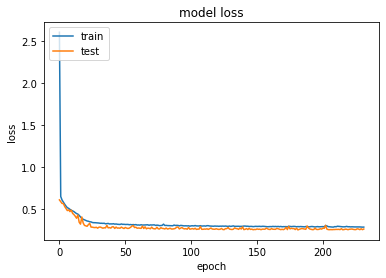

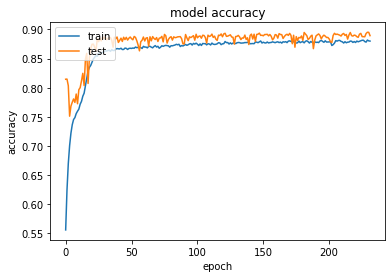

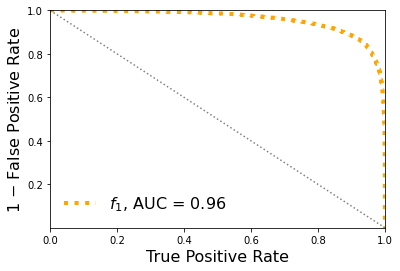

Classification score:


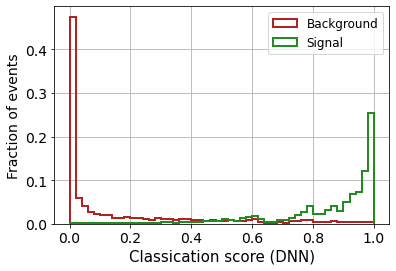


 ROC-AUC =  0.9581622067807726


In [44]:

# define the keras model
model = Sequential()
model.add(Dense(128, input_shape=(X_mon_train.shape[1],)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(64))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(32))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(16))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(8))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(4))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

In [45]:
print('\n ROC-AUC = ', roc_auc_dnn)


 ROC-AUC =  0.9581622067807726


Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_16 (Dense)             (None, 4)                 68        
_________________________________________________________________
dropout_11 (Dropout)         (None, 4)                 0         
_________________________________________________________________
dense_17 (Dense)             (None, 16)                80        
_________________________________________________________________
dropout_12 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_18 (Dense)             (None, 4)                 68        
_________________________________________________________________
dropout_13 (Dropout)         (None, 4)                 0         
_________________________________________________________________
dense_19 (Dense)             (None, 1)                

319/319 [==============================] - 0s 529us/step - loss: 0.4298 - accuracy: 0.7808 - val_loss: 0.4007 - val_accuracy: 0.8155
Epoch 105/500
319/319 [==============================] - 0s 547us/step - loss: 0.4235 - accuracy: 0.7857 - val_loss: 0.5090 - val_accuracy: 0.7461
Epoch 106/500
319/319 [==============================] - 0s 535us/step - loss: 0.4301 - accuracy: 0.7807 - val_loss: 0.4240 - val_accuracy: 0.7991
Epoch 107/500
319/319 [==============================] - 0s 526us/step - loss: 0.4230 - accuracy: 0.7860 - val_loss: 0.3443 - val_accuracy: 0.8479
Epoch 108/500
319/319 [==============================] - 0s 531us/step - loss: 0.4266 - accuracy: 0.7850 - val_loss: 0.3824 - val_accuracy: 0.8298
Epoch 109/500
319/319 [==============================] - 0s 550us/step - loss: 0.4217 - accuracy: 0.7854 - val_loss: 0.3704 - val_accuracy: 0.8334
Epoch 110/500
319/319 [==============================] - 0s 544us/step - loss: 0.4238 - accuracy: 0.7875 - val_loss: 0.3803 - val_ac

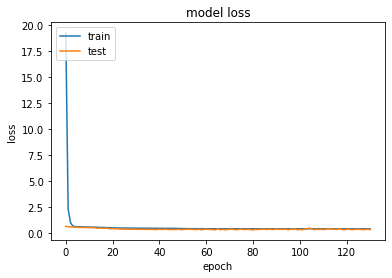

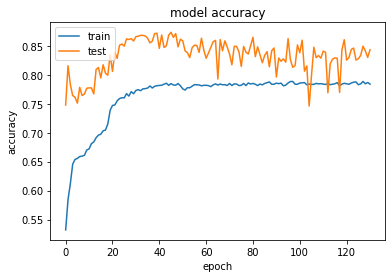

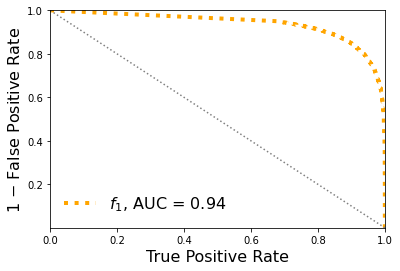

Classification score:


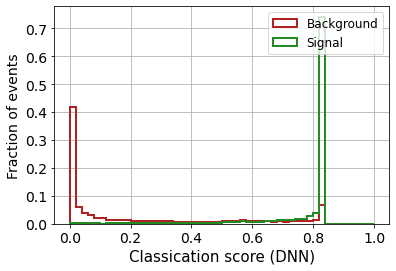


 ROC-AUC =  0.9379555013439186


In [35]:

# define the keras model
model = Sequential()
model.add(Dense(4, input_shape=(X_mon_train.shape[1],), activation='relu'))
model.add(Dropout(0.20))
# model.add(Dense(8, activation='relu'))
# model.add(Dropout(0.20))
model.add(Dense(16, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(4, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

### CNN

In [51]:
# prepare the dataset
X_mon_train_cn = X_mon_train.reshape(X_mon_train.shape[0], X_mon_train.shape[1], 1)
X_mon_test_cn = X_mon_test.reshape(X_mon_test.shape[0], X_mon_test.shape[1], 1)
X_mon_val_cn = X_mon_val.reshape(X_mon_val.shape[0], X_mon_val.shape[1], 1)

Epoch 1/500
319/319 [==============================] - 2s 2ms/step - loss: 5.2530 - accuracy: 0.5095 - val_loss: 0.7725 - val_accuracy: 0.6149
Epoch 2/500
319/319 [==============================] - 1s 2ms/step - loss: 0.7931 - accuracy: 0.6705 - val_loss: 0.6348 - val_accuracy: 0.7959
Epoch 3/500
319/319 [==============================] - 1s 2ms/step - loss: 0.6672 - accuracy: 0.7791 - val_loss: 0.5920 - val_accuracy: 0.8170
Epoch 4/500
319/319 [==============================] - 0s 2ms/step - loss: 0.6217 - accuracy: 0.7944 - val_loss: 0.5610 - val_accuracy: 0.8232
Epoch 5/500
319/319 [==============================] - 1s 2ms/step - loss: 0.5924 - accuracy: 0.8040 - val_loss: 0.5322 - val_accuracy: 0.8320
Epoch 6/500
319/319 [==============================] - 0s 2ms/step - loss: 0.5598 - accuracy: 0.8173 - val_loss: 0.5066 - val_accuracy: 0.8441
Epoch 7/500
319/319 [==============================] - 0s 2ms/step - loss: 0.5463 - accuracy: 0.8201 - val_loss: 0.4919 - val_accuracy: 0.8437

Epoch 58/500
319/319 [==============================] - 0s 2ms/step - loss: 0.3309 - accuracy: 0.8710 - val_loss: 0.3105 - val_accuracy: 0.8777
Epoch 59/500
319/319 [==============================] - 1s 2ms/step - loss: 0.3309 - accuracy: 0.8697 - val_loss: 0.3047 - val_accuracy: 0.8834
Epoch 60/500
319/319 [==============================] - 0s 2ms/step - loss: 0.3309 - accuracy: 0.8703 - val_loss: 0.3052 - val_accuracy: 0.8837
Epoch 61/500
319/319 [==============================] - 0s 2ms/step - loss: 0.3272 - accuracy: 0.8739 - val_loss: 0.3029 - val_accuracy: 0.8840
Epoch 62/500
319/319 [==============================] - 1s 2ms/step - loss: 0.3373 - accuracy: 0.8689 - val_loss: 0.3025 - val_accuracy: 0.8813
Epoch 63/500
319/319 [==============================] - 0s 2ms/step - loss: 0.3282 - accuracy: 0.8697 - val_loss: 0.3051 - val_accuracy: 0.8791
Epoch 64/500
319/319 [==============================] - 1s 2ms/step - loss: 0.3329 - accuracy: 0.8676 - val_loss: 0.3061 - val_accuracy:

Epoch 115/500
319/319 [==============================] - 0s 2ms/step - loss: 0.3192 - accuracy: 0.8741 - val_loss: 0.3008 - val_accuracy: 0.8810
Epoch 116/500
319/319 [==============================] - 1s 2ms/step - loss: 0.3253 - accuracy: 0.8702 - val_loss: 0.2986 - val_accuracy: 0.8817
Epoch 117/500
319/319 [==============================] - 1s 2ms/step - loss: 0.3168 - accuracy: 0.8749 - val_loss: 0.3046 - val_accuracy: 0.8812
Epoch 118/500
319/319 [==============================] - 1s 2ms/step - loss: 0.3159 - accuracy: 0.8760 - val_loss: 0.2917 - val_accuracy: 0.8874
Epoch 119/500
319/319 [==============================] - 1s 2ms/step - loss: 0.3243 - accuracy: 0.8715 - val_loss: 0.2939 - val_accuracy: 0.8860
Epoch 120/500
319/319 [==============================] - 1s 2ms/step - loss: 0.3200 - accuracy: 0.8739 - val_loss: 0.2931 - val_accuracy: 0.8848
Epoch 121/500
319/319 [==============================] - 0s 2ms/step - loss: 0.3157 - accuracy: 0.8769 - val_loss: 0.3083 - val_ac

319/319 [==============================] - 0s 1ms/step - loss: 0.3122 - accuracy: 0.8756 - val_loss: 0.2980 - val_accuracy: 0.8828
Epoch 228/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3170 - accuracy: 0.8750 - val_loss: 0.2870 - val_accuracy: 0.8899
Epoch 229/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3047 - accuracy: 0.8812 - val_loss: 0.2868 - val_accuracy: 0.8892
Epoch 230/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3099 - accuracy: 0.8756 - val_loss: 0.2898 - val_accuracy: 0.8871
Epoch 231/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3078 - accuracy: 0.8768 - val_loss: 0.2869 - val_accuracy: 0.8894
Epoch 232/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3096 - accuracy: 0.8769 - val_loss: 0.2912 - val_accuracy: 0.8851
Epoch 233/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3058 - accuracy: 0.8766 - val_loss: 0.2847 - val_accuracy: 0.8895

319/319 [==============================] - 0s 1ms/step - loss: 0.3061 - accuracy: 0.8791 - val_loss: 0.2837 - val_accuracy: 0.8905
Epoch 340/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3105 - accuracy: 0.8768 - val_loss: 0.2834 - val_accuracy: 0.8910
Epoch 341/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3089 - accuracy: 0.8778 - val_loss: 0.2881 - val_accuracy: 0.8852
Epoch 342/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3077 - accuracy: 0.8771 - val_loss: 0.2964 - val_accuracy: 0.8837
Epoch 343/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3023 - accuracy: 0.8792 - val_loss: 0.2846 - val_accuracy: 0.8891
Epoch 344/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3085 - accuracy: 0.8782 - val_loss: 0.2949 - val_accuracy: 0.8845
Epoch 345/500
319/319 [==============================] - 0s 1ms/step - loss: 0.3100 - accuracy: 0.8762 - val_loss: 0.3202 - val_accuracy: 0.8723

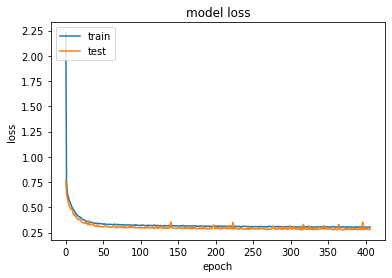

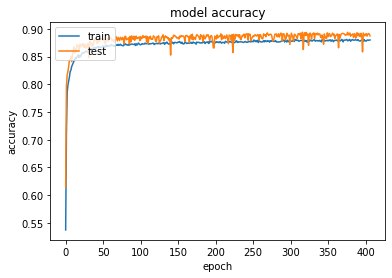

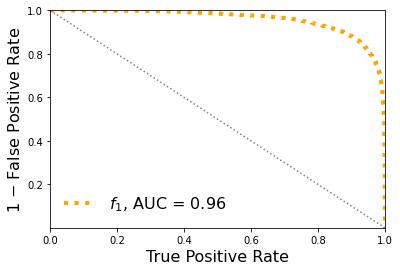

Classification score:


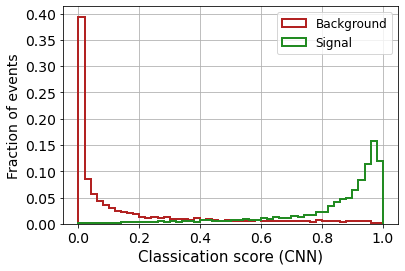


 ROC-AUC =  0.9581619335995804


In [52]:

# define the keras model
model = Sequential()
model.add(Conv1D(16, 3, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(16, 3, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(16, 3, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [53]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.9581619335995804


Epoch 1/500
319/319 [==============================] - 1s 1ms/step - loss: 21.5861 - accuracy: 0.5368 - val_loss: 0.4792 - val_accuracy: 0.7972
Epoch 2/500
319/319 [==============================] - 0s 811us/step - loss: 0.4975 - accuracy: 0.7774 - val_loss: 0.4164 - val_accuracy: 0.8191
Epoch 3/500
319/319 [==============================] - 0s 812us/step - loss: 0.4586 - accuracy: 0.7993 - val_loss: 0.4019 - val_accuracy: 0.8215
Epoch 4/500
319/319 [==============================] - 0s 840us/step - loss: 0.4551 - accuracy: 0.7910 - val_loss: 0.3874 - val_accuracy: 0.8269
Epoch 5/500
319/319 [==============================] - 0s 814us/step - loss: 0.4341 - accuracy: 0.8088 - val_loss: 0.3868 - val_accuracy: 0.8211
Epoch 6/500
319/319 [==============================] - 0s 799us/step - loss: 0.4232 - accuracy: 0.8103 - val_loss: 0.3780 - val_accuracy: 0.8300
Epoch 7/500
319/319 [==============================] - 0s 797us/step - loss: 0.4205 - accuracy: 0.8114 - val_loss: 0.3687 - val_acc

319/319 [==============================] - 0s 797us/step - loss: 0.3168 - accuracy: 0.8685 - val_loss: 0.2724 - val_accuracy: 0.8913
Epoch 114/500
319/319 [==============================] - 0s 793us/step - loss: 0.3157 - accuracy: 0.8701 - val_loss: 0.2816 - val_accuracy: 0.8819
Epoch 115/500
319/319 [==============================] - 0s 804us/step - loss: 0.3138 - accuracy: 0.8692 - val_loss: 0.2712 - val_accuracy: 0.8856
Epoch 116/500
319/319 [==============================] - 0s 856us/step - loss: 0.3181 - accuracy: 0.8690 - val_loss: 0.2649 - val_accuracy: 0.8910
Epoch 117/500
319/319 [==============================] - 0s 833us/step - loss: 0.3216 - accuracy: 0.8676 - val_loss: 0.2657 - val_accuracy: 0.8919
Epoch 118/500
319/319 [==============================] - 0s 836us/step - loss: 0.3215 - accuracy: 0.8660 - val_loss: 0.2780 - val_accuracy: 0.8837
Epoch 119/500
319/319 [==============================] - 0s 804us/step - loss: 0.3182 - accuracy: 0.8685 - val_loss: 0.2665 - val_ac

Epoch 169/500
319/319 [==============================] - 0s 825us/step - loss: 0.3126 - accuracy: 0.8704 - val_loss: 0.2650 - val_accuracy: 0.8906
Epoch 170/500
319/319 [==============================] - 0s 816us/step - loss: 0.3171 - accuracy: 0.8695 - val_loss: 0.2615 - val_accuracy: 0.8926
Epoch 171/500
319/319 [==============================] - 0s 796us/step - loss: 0.3175 - accuracy: 0.8682 - val_loss: 0.2696 - val_accuracy: 0.8916
Epoch 172/500
319/319 [==============================] - 0s 813us/step - loss: 0.3165 - accuracy: 0.8659 - val_loss: 0.2832 - val_accuracy: 0.8799
Epoch 173/500
319/319 [==============================] - 0s 841us/step - loss: 0.3177 - accuracy: 0.8668 - val_loss: 0.2678 - val_accuracy: 0.8874
Epoch 174/500
319/319 [==============================] - 0s 812us/step - loss: 0.3182 - accuracy: 0.8681 - val_loss: 0.2647 - val_accuracy: 0.8923
Epoch 175/500
319/319 [==============================] - 0s 809us/step - loss: 0.3126 - accuracy: 0.8681 - val_loss: 0

Epoch 225/500
319/319 [==============================] - 0s 796us/step - loss: 0.3112 - accuracy: 0.8699 - val_loss: 0.2614 - val_accuracy: 0.8927
Epoch 226/500
319/319 [==============================] - 0s 798us/step - loss: 0.3095 - accuracy: 0.8701 - val_loss: 0.2649 - val_accuracy: 0.8926
Epoch 227/500
319/319 [==============================] - 0s 801us/step - loss: 0.3187 - accuracy: 0.8665 - val_loss: 0.2625 - val_accuracy: 0.8919
Epoch 228/500
319/319 [==============================] - 0s 791us/step - loss: 0.3134 - accuracy: 0.8695 - val_loss: 0.2651 - val_accuracy: 0.8920
Epoch 229/500
319/319 [==============================] - 0s 794us/step - loss: 0.3080 - accuracy: 0.8709 - val_loss: 0.2729 - val_accuracy: 0.8859
Epoch 230/500
319/319 [==============================] - 0s 795us/step - loss: 0.3116 - accuracy: 0.8707 - val_loss: 0.2661 - val_accuracy: 0.8930
Epoch 231/500
319/319 [==============================] - 0s 798us/step - loss: 0.3135 - accuracy: 0.8679 - val_loss: 0

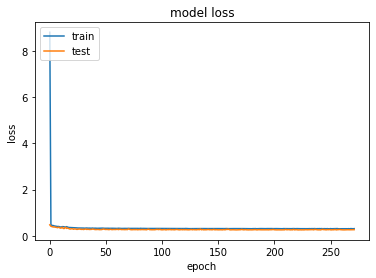

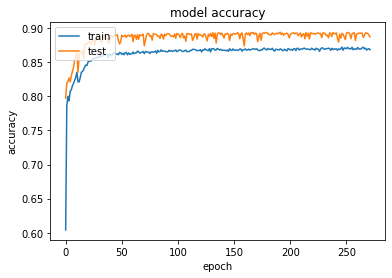

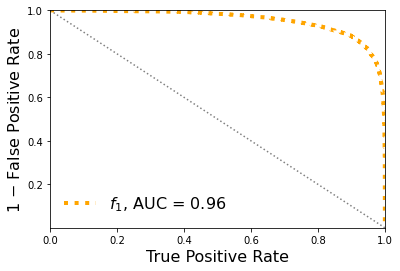

Classification score:


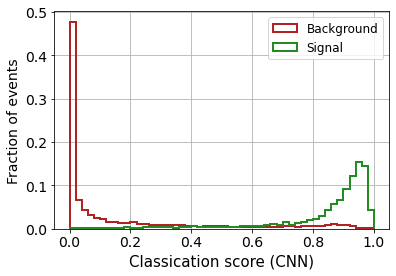


 ROC-AUC =  0.9559572286920114


In [33]:

# define the keras model
model = Sequential()
model.add(Conv1D(8, 2, input_shape=(X_mon_train.shape[1],1), activation='relu', strides = (1),kernel_regularizer=l2(0.005)))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Flatten())
model.add(Dense(10, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

## 3. Keep 4 variables, pA_S1, pA_S2, ptop, pbot

In [12]:
remove_col = [1,2,3,4,5,6]

B_pbot = B_pbot
B_ptop = B_ptop
B_ppeakS1 = np.delete(B_ppeakS1, remove_col, axis=1)
B_ppeakS2 = np.delete(B_ppeakS2, remove_col, axis=1)

print('B_pbot.shape: ', B_pbot.shape)
print('B_ptop.shape: ', B_ptop.shape)
print('B_ppeakS1.shape :', B_ppeakS1.shape)
print('B_ppeakS2.shape: ', B_ppeakS2.shape)


S_pbot = S_pbot
S_ptop = S_ptop
S_ppeakS1 = np.delete(S_ppeakS1, remove_col, axis=1)
S_ppeakS2 = np.delete(S_ppeakS2, remove_col, axis=1)

print('S_pbot.shape: ', S_pbot.shape)
print('S_ptop.shape: ', S_ptop.shape)
print('S_ppeakS1.shape :', S_ppeakS1.shape)
print('S_ppeakS2.shape: ', S_ppeakS2.shape)

B_pbot.shape:  (32015,)
B_ptop.shape:  (32015,)
B_ppeakS1.shape : (32015, 1)
B_ppeakS2.shape:  (32015, 1)
S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 1)
S_ppeakS2.shape:  (32015, 1)


In [13]:
# concatenate the data
X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(B_ptop,(len(B_ptop),1)) ],axis=1)
X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pbot,(len(S_pbot),1)), np.reshape(S_ptop,(len(S_ptop),1)) ],axis=1)

print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

X_mon_B.shape:  (32015, 4)
X_mon_S.shape:  (32015, 4)
X_mon.shape:  (64030, 4)

X_mon_train :  (40818, 4)
y_mon_train :  (40818,)
X_mon_val :  (7204, 4)
y_mon_val :  (7204,)
X_mon_test :  (16008, 4)
y_mon_test :  (16008,)



### XGBoost

[0]	validation_0-logloss:0.68799	validation_1-logloss:0.68793
[1]	validation_0-logloss:0.68292	validation_1-logloss:0.68281
[2]	validation_0-logloss:0.67798	validation_1-logloss:0.67779
[3]	validation_0-logloss:0.67312	validation_1-logloss:0.67287
[4]	validation_0-logloss:0.66837	validation_1-logloss:0.66807
[5]	validation_0-logloss:0.66369	validation_1-logloss:0.66334
[6]	validation_0-logloss:0.65910	validation_1-logloss:0.65870
[7]	validation_0-logloss:0.65462	validation_1-logloss:0.65417
[8]	validation_0-logloss:0.65018	validation_1-logloss:0.64970
[9]	validation_0-logloss:0.64586	validation_1-logloss:0.64533
[10]	validation_0-logloss:0.64159	validation_1-logloss:0.64102
[11]	validation_0-logloss:0.63742	validation_1-logloss:0.63683


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12]	validation_0-logloss:0.63330	validation_1-logloss:0.63267
[13]	validation_0-logloss:0.62927	validation_1-logloss:0.62859
[14]	validation_0-logloss:0.62530	validation_1-logloss:0.62458
[15]	validation_0-logloss:0.62142	validation_1-logloss:0.62067
[16]	validation_0-logloss:0.61758	validation_1-logloss:0.61681
[17]	validation_0-logloss:0.61381	validation_1-logloss:0.61299
[18]	validation_0-logloss:0.61011	validation_1-logloss:0.60927
[19]	validation_0-logloss:0.60646	validation_1-logloss:0.60558
[20]	validation_0-logloss:0.60289	validation_1-logloss:0.60198
[21]	validation_0-logloss:0.59937	validation_1-logloss:0.59842
[22]	validation_0-logloss:0.59591	validation_1-logloss:0.59495
[23]	validation_0-logloss:0.59253	validation_1-logloss:0.59151
[24]	validation_0-logloss:0.58919	validation_1-logloss:0.58815
[25]	validation_0-logloss:0.58590	validation_1-logloss:0.58483
[26]	validation_0-logloss:0.58267	validation_1-logloss:0.58158
[27]	validation_0-logloss:0.57949	validation_1-logloss:

[142]	validation_0-logloss:0.40505	validation_1-logloss:0.40425
[143]	validation_0-logloss:0.40442	validation_1-logloss:0.40365
[144]	validation_0-logloss:0.40380	validation_1-logloss:0.40307
[145]	validation_0-logloss:0.40316	validation_1-logloss:0.40246
[146]	validation_0-logloss:0.40254	validation_1-logloss:0.40187
[147]	validation_0-logloss:0.40193	validation_1-logloss:0.40130
[148]	validation_0-logloss:0.40133	validation_1-logloss:0.40073
[149]	validation_0-logloss:0.40074	validation_1-logloss:0.40016
[150]	validation_0-logloss:0.40015	validation_1-logloss:0.39960
[151]	validation_0-logloss:0.39953	validation_1-logloss:0.39902
[152]	validation_0-logloss:0.39894	validation_1-logloss:0.39849
[153]	validation_0-logloss:0.39835	validation_1-logloss:0.39794
[154]	validation_0-logloss:0.39777	validation_1-logloss:0.39740
[155]	validation_0-logloss:0.39722	validation_1-logloss:0.39688
[156]	validation_0-logloss:0.39667	validation_1-logloss:0.39637
[157]	validation_0-logloss:0.39613	valid

[271]	validation_0-logloss:0.35888	validation_1-logloss:0.36181
[272]	validation_0-logloss:0.35872	validation_1-logloss:0.36167
[273]	validation_0-logloss:0.35853	validation_1-logloss:0.36154
[274]	validation_0-logloss:0.35837	validation_1-logloss:0.36142
[275]	validation_0-logloss:0.35815	validation_1-logloss:0.36125
[276]	validation_0-logloss:0.35800	validation_1-logloss:0.36113
[277]	validation_0-logloss:0.35785	validation_1-logloss:0.36100
[278]	validation_0-logloss:0.35769	validation_1-logloss:0.36086
[279]	validation_0-logloss:0.35754	validation_1-logloss:0.36074
[280]	validation_0-logloss:0.35739	validation_1-logloss:0.36063
[281]	validation_0-logloss:0.35720	validation_1-logloss:0.36046
[282]	validation_0-logloss:0.35705	validation_1-logloss:0.36035
[283]	validation_0-logloss:0.35689	validation_1-logloss:0.36022
[284]	validation_0-logloss:0.35673	validation_1-logloss:0.36010
[285]	validation_0-logloss:0.35653	validation_1-logloss:0.35993
[286]	validation_0-logloss:0.35635	valid

[400]	validation_0-logloss:0.34058	validation_1-logloss:0.34819
[401]	validation_0-logloss:0.34049	validation_1-logloss:0.34814
[402]	validation_0-logloss:0.34036	validation_1-logloss:0.34804
[403]	validation_0-logloss:0.34029	validation_1-logloss:0.34799
[404]	validation_0-logloss:0.34018	validation_1-logloss:0.34791
[405]	validation_0-logloss:0.34012	validation_1-logloss:0.34787
[406]	validation_0-logloss:0.34004	validation_1-logloss:0.34782
[407]	validation_0-logloss:0.33994	validation_1-logloss:0.34777
[408]	validation_0-logloss:0.33987	validation_1-logloss:0.34773
[409]	validation_0-logloss:0.33981	validation_1-logloss:0.34769
[410]	validation_0-logloss:0.33971	validation_1-logloss:0.34764
[411]	validation_0-logloss:0.33965	validation_1-logloss:0.34760
[412]	validation_0-logloss:0.33960	validation_1-logloss:0.34756
[413]	validation_0-logloss:0.33950	validation_1-logloss:0.34751
[414]	validation_0-logloss:0.33937	validation_1-logloss:0.34742
[415]	validation_0-logloss:0.33929	valid

[529]	validation_0-logloss:0.32802	validation_1-logloss:0.33922
[530]	validation_0-logloss:0.32792	validation_1-logloss:0.33916
[531]	validation_0-logloss:0.32782	validation_1-logloss:0.33909
[532]	validation_0-logloss:0.32771	validation_1-logloss:0.33903
[533]	validation_0-logloss:0.32759	validation_1-logloss:0.33897
[534]	validation_0-logloss:0.32744	validation_1-logloss:0.33888
[535]	validation_0-logloss:0.32736	validation_1-logloss:0.33880
[536]	validation_0-logloss:0.32726	validation_1-logloss:0.33872
[537]	validation_0-logloss:0.32715	validation_1-logloss:0.33864
[538]	validation_0-logloss:0.32709	validation_1-logloss:0.33861
[539]	validation_0-logloss:0.32698	validation_1-logloss:0.33852
[540]	validation_0-logloss:0.32685	validation_1-logloss:0.33842
[541]	validation_0-logloss:0.32680	validation_1-logloss:0.33840
[542]	validation_0-logloss:0.32670	validation_1-logloss:0.33832
[543]	validation_0-logloss:0.32661	validation_1-logloss:0.33826
[544]	validation_0-logloss:0.32651	valid

[658]	validation_0-logloss:0.31721	validation_1-logloss:0.33223
[659]	validation_0-logloss:0.31712	validation_1-logloss:0.33217
[660]	validation_0-logloss:0.31701	validation_1-logloss:0.33210
[661]	validation_0-logloss:0.31694	validation_1-logloss:0.33205
[662]	validation_0-logloss:0.31688	validation_1-logloss:0.33203
[663]	validation_0-logloss:0.31683	validation_1-logloss:0.33201
[664]	validation_0-logloss:0.31678	validation_1-logloss:0.33198
[665]	validation_0-logloss:0.31669	validation_1-logloss:0.33193
[666]	validation_0-logloss:0.31662	validation_1-logloss:0.33188
[667]	validation_0-logloss:0.31654	validation_1-logloss:0.33185
[668]	validation_0-logloss:0.31649	validation_1-logloss:0.33182
[669]	validation_0-logloss:0.31643	validation_1-logloss:0.33178
[670]	validation_0-logloss:0.31637	validation_1-logloss:0.33175
[671]	validation_0-logloss:0.31629	validation_1-logloss:0.33170
[672]	validation_0-logloss:0.31619	validation_1-logloss:0.33163
[673]	validation_0-logloss:0.31613	valid

[787]	validation_0-logloss:0.30972	validation_1-logloss:0.32827
[788]	validation_0-logloss:0.30968	validation_1-logloss:0.32826
[789]	validation_0-logloss:0.30962	validation_1-logloss:0.32823
[790]	validation_0-logloss:0.30960	validation_1-logloss:0.32822
[791]	validation_0-logloss:0.30955	validation_1-logloss:0.32820
[792]	validation_0-logloss:0.30949	validation_1-logloss:0.32817
[793]	validation_0-logloss:0.30944	validation_1-logloss:0.32816
[794]	validation_0-logloss:0.30938	validation_1-logloss:0.32814
[795]	validation_0-logloss:0.30935	validation_1-logloss:0.32813
[796]	validation_0-logloss:0.30930	validation_1-logloss:0.32810
[797]	validation_0-logloss:0.30927	validation_1-logloss:0.32808
[798]	validation_0-logloss:0.30920	validation_1-logloss:0.32805
[799]	validation_0-logloss:0.30917	validation_1-logloss:0.32804
[800]	validation_0-logloss:0.30912	validation_1-logloss:0.32800
[801]	validation_0-logloss:0.30907	validation_1-logloss:0.32798
[802]	validation_0-logloss:0.30902	valid

[1043]	validation_0-logloss:0.30032	validation_1-logloss:0.32465
[1044]	validation_0-logloss:0.30029	validation_1-logloss:0.32465
[1045]	validation_0-logloss:0.30027	validation_1-logloss:0.32463
[1046]	validation_0-logloss:0.30024	validation_1-logloss:0.32463
[1047]	validation_0-logloss:0.30023	validation_1-logloss:0.32462
[1048]	validation_0-logloss:0.30018	validation_1-logloss:0.32460
[1049]	validation_0-logloss:0.30014	validation_1-logloss:0.32460
[1050]	validation_0-logloss:0.30011	validation_1-logloss:0.32458
[1051]	validation_0-logloss:0.30010	validation_1-logloss:0.32459
[1052]	validation_0-logloss:0.30007	validation_1-logloss:0.32456
[1053]	validation_0-logloss:0.30002	validation_1-logloss:0.32455
[1054]	validation_0-logloss:0.29998	validation_1-logloss:0.32453
[1055]	validation_0-logloss:0.29996	validation_1-logloss:0.32452
[1056]	validation_0-logloss:0.29993	validation_1-logloss:0.32450
[1057]	validation_0-logloss:0.29990	validation_1-logloss:0.32450
[1058]	validation_0-loglo

[1170]	validation_0-logloss:0.29703	validation_1-logloss:0.32371
[1171]	validation_0-logloss:0.29701	validation_1-logloss:0.32370
[1172]	validation_0-logloss:0.29698	validation_1-logloss:0.32369
[1173]	validation_0-logloss:0.29697	validation_1-logloss:0.32369
[1174]	validation_0-logloss:0.29696	validation_1-logloss:0.32369
[1175]	validation_0-logloss:0.29695	validation_1-logloss:0.32370
[1176]	validation_0-logloss:0.29691	validation_1-logloss:0.32369
[1177]	validation_0-logloss:0.29690	validation_1-logloss:0.32369
[1178]	validation_0-logloss:0.29687	validation_1-logloss:0.32368
[1179]	validation_0-logloss:0.29685	validation_1-logloss:0.32367
[1180]	validation_0-logloss:0.29684	validation_1-logloss:0.32367
[1181]	validation_0-logloss:0.29683	validation_1-logloss:0.32367
[1182]	validation_0-logloss:0.29682	validation_1-logloss:0.32367
[1183]	validation_0-logloss:0.29680	validation_1-logloss:0.32367
[1184]	validation_0-logloss:0.29678	validation_1-logloss:0.32368
[1185]	validation_0-loglo

[1423]	validation_0-logloss:0.29200	validation_1-logloss:0.32293
[1424]	validation_0-logloss:0.29198	validation_1-logloss:0.32292
[1425]	validation_0-logloss:0.29196	validation_1-logloss:0.32292
[1426]	validation_0-logloss:0.29195	validation_1-logloss:0.32292
[1427]	validation_0-logloss:0.29192	validation_1-logloss:0.32291
[1428]	validation_0-logloss:0.29192	validation_1-logloss:0.32291
[1429]	validation_0-logloss:0.29189	validation_1-logloss:0.32291
[1430]	validation_0-logloss:0.29187	validation_1-logloss:0.32290
[1431]	validation_0-logloss:0.29185	validation_1-logloss:0.32289
[1432]	validation_0-logloss:0.29181	validation_1-logloss:0.32290
[1433]	validation_0-logloss:0.29179	validation_1-logloss:0.32289
[1434]	validation_0-logloss:0.29177	validation_1-logloss:0.32289
[1435]	validation_0-logloss:0.29175	validation_1-logloss:0.32289
[1436]	validation_0-logloss:0.29173	validation_1-logloss:0.32289
[1437]	validation_0-logloss:0.29173	validation_1-logloss:0.32289
[1438]	validation_0-loglo

[1550]	validation_0-logloss:0.28944	validation_1-logloss:0.32259
[1551]	validation_0-logloss:0.28942	validation_1-logloss:0.32259
[1552]	validation_0-logloss:0.28942	validation_1-logloss:0.32259
[1553]	validation_0-logloss:0.28941	validation_1-logloss:0.32259
[1554]	validation_0-logloss:0.28939	validation_1-logloss:0.32258
[1555]	validation_0-logloss:0.28938	validation_1-logloss:0.32258
[1556]	validation_0-logloss:0.28936	validation_1-logloss:0.32258
[1557]	validation_0-logloss:0.28934	validation_1-logloss:0.32259
[1558]	validation_0-logloss:0.28931	validation_1-logloss:0.32259
[1559]	validation_0-logloss:0.28929	validation_1-logloss:0.32259
[1560]	validation_0-logloss:0.28926	validation_1-logloss:0.32259
[1561]	validation_0-logloss:0.28924	validation_1-logloss:0.32259
[1562]	validation_0-logloss:0.28922	validation_1-logloss:0.32259
[1563]	validation_0-logloss:0.28918	validation_1-logloss:0.32258
[1564]	validation_0-logloss:0.28916	validation_1-logloss:0.32256
[1565]	validation_0-loglo

[1677]	validation_0-logloss:0.28699	validation_1-logloss:0.32233
[1678]	validation_0-logloss:0.28697	validation_1-logloss:0.32233
[1679]	validation_0-logloss:0.28694	validation_1-logloss:0.32232
[1680]	validation_0-logloss:0.28692	validation_1-logloss:0.32232
[1681]	validation_0-logloss:0.28691	validation_1-logloss:0.32233
[1682]	validation_0-logloss:0.28690	validation_1-logloss:0.32233
[1683]	validation_0-logloss:0.28689	validation_1-logloss:0.32233
[1684]	validation_0-logloss:0.28687	validation_1-logloss:0.32232
[1685]	validation_0-logloss:0.28687	validation_1-logloss:0.32232
[1686]	validation_0-logloss:0.28685	validation_1-logloss:0.32233
[1687]	validation_0-logloss:0.28684	validation_1-logloss:0.32232
[1688]	validation_0-logloss:0.28681	validation_1-logloss:0.32233
[1689]	validation_0-logloss:0.28679	validation_1-logloss:0.32232
[1690]	validation_0-logloss:0.28677	validation_1-logloss:0.32232
[1691]	validation_0-logloss:0.28676	validation_1-logloss:0.32233
[1692]	validation_0-loglo

[1804]	validation_0-logloss:0.28462	validation_1-logloss:0.32218
[1805]	validation_0-logloss:0.28462	validation_1-logloss:0.32218
[1806]	validation_0-logloss:0.28460	validation_1-logloss:0.32218
[1807]	validation_0-logloss:0.28458	validation_1-logloss:0.32218
[1808]	validation_0-logloss:0.28456	validation_1-logloss:0.32217
[1809]	validation_0-logloss:0.28455	validation_1-logloss:0.32218
[1810]	validation_0-logloss:0.28453	validation_1-logloss:0.32216
[1811]	validation_0-logloss:0.28452	validation_1-logloss:0.32216
[1812]	validation_0-logloss:0.28450	validation_1-logloss:0.32216
[1813]	validation_0-logloss:0.28449	validation_1-logloss:0.32216
[1814]	validation_0-logloss:0.28447	validation_1-logloss:0.32217
[1815]	validation_0-logloss:0.28446	validation_1-logloss:0.32217
[1816]	validation_0-logloss:0.28444	validation_1-logloss:0.32217
[1817]	validation_0-logloss:0.28443	validation_1-logloss:0.32217
[1818]	validation_0-logloss:0.28441	validation_1-logloss:0.32217
[1819]	validation_0-loglo

[1931]	validation_0-logloss:0.28254	validation_1-logloss:0.32209
[1932]	validation_0-logloss:0.28252	validation_1-logloss:0.32208
[1933]	validation_0-logloss:0.28250	validation_1-logloss:0.32208
[1934]	validation_0-logloss:0.28249	validation_1-logloss:0.32208
[1935]	validation_0-logloss:0.28247	validation_1-logloss:0.32209
[1936]	validation_0-logloss:0.28246	validation_1-logloss:0.32209
[1937]	validation_0-logloss:0.28245	validation_1-logloss:0.32209
[1938]	validation_0-logloss:0.28242	validation_1-logloss:0.32208
[1939]	validation_0-logloss:0.28241	validation_1-logloss:0.32208
[1940]	validation_0-logloss:0.28238	validation_1-logloss:0.32208
[1941]	validation_0-logloss:0.28236	validation_1-logloss:0.32207
[1942]	validation_0-logloss:0.28234	validation_1-logloss:0.32207
[1943]	validation_0-logloss:0.28232	validation_1-logloss:0.32207
[1944]	validation_0-logloss:0.28231	validation_1-logloss:0.32208
[1945]	validation_0-logloss:0.28228	validation_1-logloss:0.32207
[1946]	validation_0-loglo

[2058]	validation_0-logloss:0.28022	validation_1-logloss:0.32194
[2059]	validation_0-logloss:0.28021	validation_1-logloss:0.32194
[2060]	validation_0-logloss:0.28019	validation_1-logloss:0.32193
[2061]	validation_0-logloss:0.28017	validation_1-logloss:0.32194
[2062]	validation_0-logloss:0.28014	validation_1-logloss:0.32193
[2063]	validation_0-logloss:0.28012	validation_1-logloss:0.32193
[2064]	validation_0-logloss:0.28010	validation_1-logloss:0.32194
[2065]	validation_0-logloss:0.28009	validation_1-logloss:0.32195
[2066]	validation_0-logloss:0.28008	validation_1-logloss:0.32195
[2067]	validation_0-logloss:0.28005	validation_1-logloss:0.32195
[2068]	validation_0-logloss:0.28003	validation_1-logloss:0.32195
[2069]	validation_0-logloss:0.28001	validation_1-logloss:0.32195
[2070]	validation_0-logloss:0.28000	validation_1-logloss:0.32195
[2071]	validation_0-logloss:0.27999	validation_1-logloss:0.32194
[2072]	validation_0-logloss:0.27996	validation_1-logloss:0.32194
[2073]	validation_0-loglo

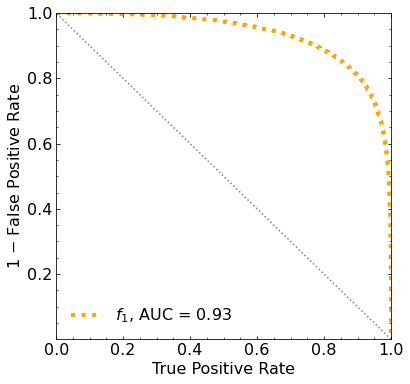

Classification score:


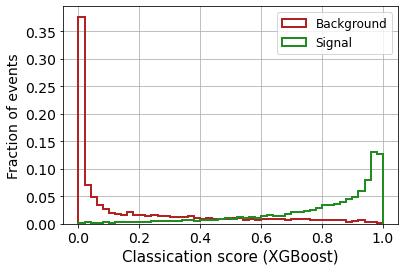


 ROC-AUC =  0.93290708949995


In [48]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg)

In [49]:
print('\n ROC-AUC = ', roc_auc_xg)


 ROC-AUC =  0.93290708949995


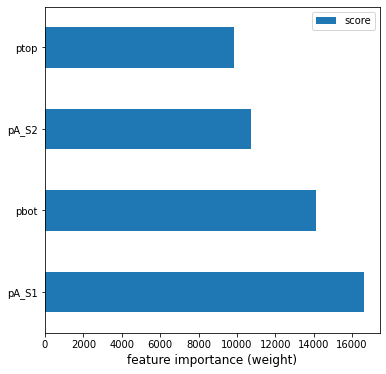

In [50]:
feature_important = classifier.get_booster().get_score(importance_type='weight')
# keys = list(feature_important.keys())
keys = ['pA_S1','pA_S2','pbot', 'ptop']
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(40, columns="score").plot(kind='barh', figsize = (6,6)) ## plot top 40 features
plt.xlabel('feature importance (weight)', fontsize = 12)
plt.show()

### DNN

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_47 (Dense)             (None, 128)               640       
_________________________________________________________________
leaky_re_lu_39 (LeakyReLU)   (None, 128)               0         
_________________________________________________________________
dropout_39 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_48 (Dense)             (None, 64)                8256      
_________________________________________________________________
leaky_re_lu_40 (LeakyReLU)   (None, 64)                0         
_________________________________________________________________
dropout_40 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_49 (Dense)             (None, 32)               

319/319 [==============================] - 0s 905us/step - loss: 0.3695 - accuracy: 0.8357 - val_loss: 0.3335 - val_accuracy: 0.8522
Epoch 94/500
319/319 [==============================] - 0s 914us/step - loss: 0.3658 - accuracy: 0.8420 - val_loss: 0.3325 - val_accuracy: 0.8531
Epoch 95/500
319/319 [==============================] - 0s 914us/step - loss: 0.3647 - accuracy: 0.8389 - val_loss: 0.3344 - val_accuracy: 0.8519
Epoch 96/500
319/319 [==============================] - 0s 906us/step - loss: 0.3667 - accuracy: 0.8403 - val_loss: 0.3414 - val_accuracy: 0.8493
Epoch 97/500
319/319 [==============================] - 0s 910us/step - loss: 0.3670 - accuracy: 0.8387 - val_loss: 0.3416 - val_accuracy: 0.8516
Epoch 98/500
319/319 [==============================] - 0s 912us/step - loss: 0.3664 - accuracy: 0.8361 - val_loss: 0.3301 - val_accuracy: 0.8559
Epoch 99/500
319/319 [==============================] - 0s 906us/step - loss: 0.3700 - accuracy: 0.8378 - val_loss: 0.3382 - val_accuracy

Epoch 149/500
319/319 [==============================] - 0s 908us/step - loss: 0.3569 - accuracy: 0.8421 - val_loss: 0.3817 - val_accuracy: 0.8251
Epoch 150/500
319/319 [==============================] - 0s 910us/step - loss: 0.3632 - accuracy: 0.8399 - val_loss: 0.3465 - val_accuracy: 0.8443
Epoch 151/500
319/319 [==============================] - 0s 909us/step - loss: 0.3603 - accuracy: 0.8411 - val_loss: 0.3321 - val_accuracy: 0.8545
Epoch 152/500
319/319 [==============================] - 0s 907us/step - loss: 0.3609 - accuracy: 0.8401 - val_loss: 0.3385 - val_accuracy: 0.8511
Epoch 153/500
319/319 [==============================] - 0s 904us/step - loss: 0.3616 - accuracy: 0.8439 - val_loss: 0.3337 - val_accuracy: 0.8537
Epoch 154/500
319/319 [==============================] - 0s 910us/step - loss: 0.3594 - accuracy: 0.8433 - val_loss: 0.3418 - val_accuracy: 0.8506
Epoch 155/500
319/319 [==============================] - 0s 903us/step - loss: 0.3591 - accuracy: 0.8446 - val_loss: 0

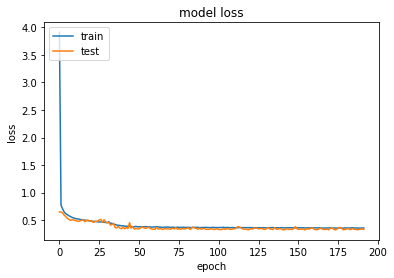

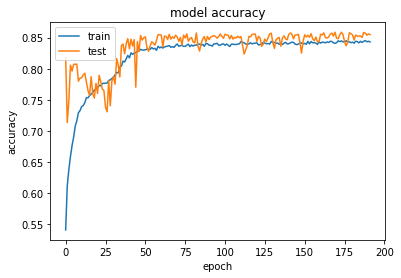

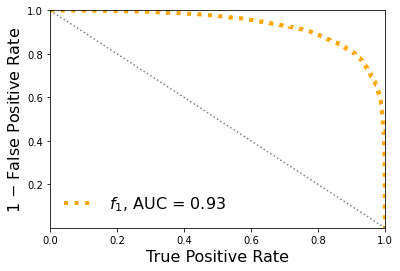

Classification score:


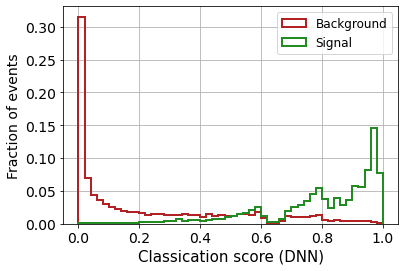


 ROC-AUC =  0.9333507201454286


In [51]:

# define the keras model
model = Sequential()
model.add(Dense(128, input_shape=(X_mon_train.shape[1],)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(64))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(32))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(16))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(8))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(4))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

In [52]:
print('\n ROC-AUC = ', roc_auc_dnn)


 ROC-AUC =  0.9333507201454286


Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_26 (Dense)             (None, 4)                 20        
_________________________________________________________________
dropout_18 (Dropout)         (None, 4)                 0         
_________________________________________________________________
dense_27 (Dense)             (None, 16)                80        
_________________________________________________________________
dropout_19 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_28 (Dense)             (None, 4)                 68        
_________________________________________________________________
dropout_20 (Dropout)         (None, 4)                 0         
_________________________________________________________________
dense_29 (Dense)             (None, 1)                

319/319 [==============================] - 0s 598us/step - loss: 0.4835 - accuracy: 0.7532 - val_loss: 0.4142 - val_accuracy: 0.8159
Epoch 105/500
319/319 [==============================] - 0s 529us/step - loss: 0.4831 - accuracy: 0.7506 - val_loss: 0.4203 - val_accuracy: 0.8101
Epoch 106/500
319/319 [==============================] - 0s 510us/step - loss: 0.4812 - accuracy: 0.7523 - val_loss: 0.3993 - val_accuracy: 0.8263
Epoch 107/500
319/319 [==============================] - 0s 521us/step - loss: 0.4813 - accuracy: 0.7528 - val_loss: 0.3953 - val_accuracy: 0.8270
Epoch 108/500
319/319 [==============================] - 0s 524us/step - loss: 0.4793 - accuracy: 0.7555 - val_loss: 0.4064 - val_accuracy: 0.8212
Epoch 109/500
319/319 [==============================] - 0s 506us/step - loss: 0.4774 - accuracy: 0.7544 - val_loss: 0.3958 - val_accuracy: 0.8265
Epoch 110/500
319/319 [==============================] - 0s 499us/step - loss: 0.4820 - accuracy: 0.7514 - val_loss: 0.3810 - val_ac

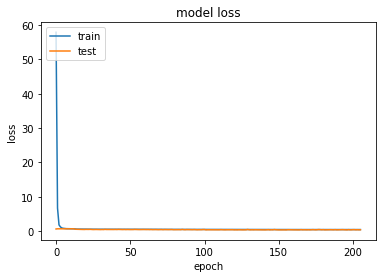

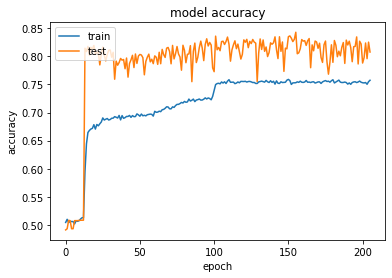

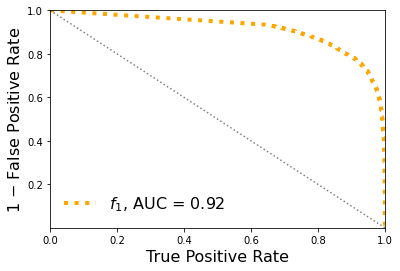

Classification score:


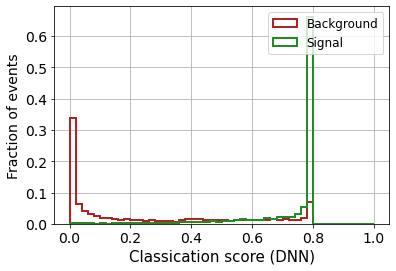


 ROC-AUC =  0.9150950513664157


In [43]:

# define the keras model
model = Sequential()
model.add(Dense(4, input_shape=(X_mon_train.shape[1],), activation='relu'))
model.add(Dropout(0.20))
# model.add(Dense(8, activation='relu'))
# model.add(Dropout(0.20))
model.add(Dense(16, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(4, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

### CNN

In [14]:
# prepare the dataset
X_mon_train_cn = X_mon_train.reshape(X_mon_train.shape[0], X_mon_train.shape[1], 1)
X_mon_test_cn = X_mon_test.reshape(X_mon_test.shape[0], X_mon_test.shape[1], 1)
X_mon_val_cn = X_mon_val.reshape(X_mon_val.shape[0], X_mon_val.shape[1], 1)

Epoch 1/500
319/319 [==============================] - 10s 2ms/step - loss: 35.8913 - accuracy: 0.5045 - val_loss: 1.6397 - val_accuracy: 0.4919
Epoch 2/500
319/319 [==============================] - 0s 718us/step - loss: 3.4326 - accuracy: 0.5075 - val_loss: 0.7997 - val_accuracy: 0.5194
Epoch 3/500
319/319 [==============================] - 0s 704us/step - loss: 1.8158 - accuracy: 0.5344 - val_loss: 0.6883 - val_accuracy: 0.6052
Epoch 4/500
319/319 [==============================] - 0s 704us/step - loss: 1.0885 - accuracy: 0.5929 - val_loss: 0.5589 - val_accuracy: 0.7515
Epoch 5/500
319/319 [==============================] - 0s 707us/step - loss: 0.7299 - accuracy: 0.6773 - val_loss: 0.5225 - val_accuracy: 0.8029
Epoch 6/500
319/319 [==============================] - 0s 710us/step - loss: 0.6056 - accuracy: 0.7354 - val_loss: 0.5063 - val_accuracy: 0.8133
Epoch 7/500
319/319 [==============================] - 0s 710us/step - loss: 0.5453 - accuracy: 0.7680 - val_loss: 0.4935 - val_ac

319/319 [==============================] - 0s 706us/step - loss: 0.3988 - accuracy: 0.8177 - val_loss: 0.3729 - val_accuracy: 0.8340
Epoch 114/500
319/319 [==============================] - 0s 706us/step - loss: 0.3965 - accuracy: 0.8206 - val_loss: 0.3670 - val_accuracy: 0.8365
Epoch 115/500
319/319 [==============================] - 0s 704us/step - loss: 0.3960 - accuracy: 0.8201 - val_loss: 0.3636 - val_accuracy: 0.8365
Epoch 116/500
319/319 [==============================] - 0s 717us/step - loss: 0.3963 - accuracy: 0.8219 - val_loss: 0.3698 - val_accuracy: 0.8361
Epoch 117/500
319/319 [==============================] - 0s 708us/step - loss: 0.3956 - accuracy: 0.8190 - val_loss: 0.3623 - val_accuracy: 0.8370
Epoch 118/500
319/319 [==============================] - 0s 709us/step - loss: 0.3920 - accuracy: 0.8244 - val_loss: 0.3631 - val_accuracy: 0.8406
Epoch 119/500
319/319 [==============================] - 0s 709us/step - loss: 0.3966 - accuracy: 0.8188 - val_loss: 0.3776 - val_ac

Epoch 169/500
319/319 [==============================] - 0s 717us/step - loss: 0.3905 - accuracy: 0.8242 - val_loss: 0.3992 - val_accuracy: 0.8233
Epoch 170/500
319/319 [==============================] - 0s 704us/step - loss: 0.3954 - accuracy: 0.8199 - val_loss: 0.3735 - val_accuracy: 0.8323
Epoch 171/500
319/319 [==============================] - 0s 705us/step - loss: 0.3947 - accuracy: 0.8200 - val_loss: 0.3942 - val_accuracy: 0.8236
Epoch 172/500
319/319 [==============================] - 0s 709us/step - loss: 0.3929 - accuracy: 0.8194 - val_loss: 0.3680 - val_accuracy: 0.8326
Epoch 173/500
319/319 [==============================] - 0s 706us/step - loss: 0.3900 - accuracy: 0.8202 - val_loss: 0.3672 - val_accuracy: 0.8348
Epoch 174/500
319/319 [==============================] - 0s 702us/step - loss: 0.3902 - accuracy: 0.8246 - val_loss: 0.3690 - val_accuracy: 0.8304
Epoch 175/500
319/319 [==============================] - 0s 708us/step - loss: 0.3912 - accuracy: 0.8202 - val_loss: 0

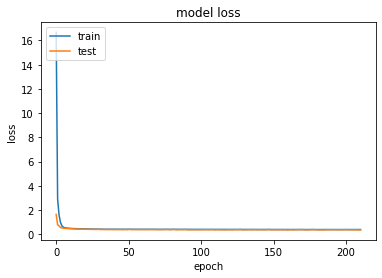

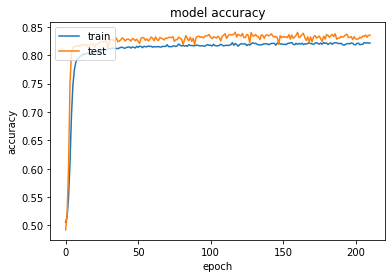

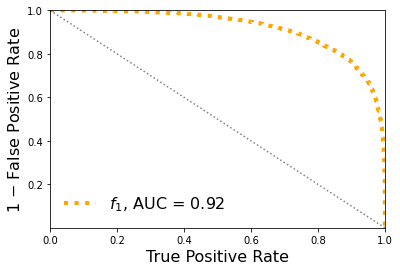

Classification score:


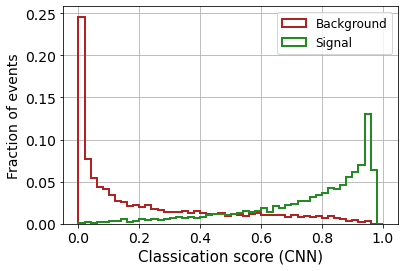


 ROC-AUC =  0.9184006374519207


In [16]:

# define the keras model
model = Sequential()
model.add(Conv1D(32, 2, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [17]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.9184006374519207


Epoch 1/500
319/319 [==============================] - 1s 1ms/step - loss: 462.7204 - accuracy: 0.4998 - val_loss: 1.0050 - val_accuracy: 0.4921
Epoch 2/500
319/319 [==============================] - 0s 564us/step - loss: 0.8635 - accuracy: 0.5005 - val_loss: 0.9944 - val_accuracy: 0.4925
Epoch 3/500
319/319 [==============================] - 0s 568us/step - loss: 0.8398 - accuracy: 0.5027 - val_loss: 0.9829 - val_accuracy: 0.4925
Epoch 4/500
319/319 [==============================] - 0s 565us/step - loss: 0.8332 - accuracy: 0.4987 - val_loss: 0.9682 - val_accuracy: 0.4925
Epoch 5/500
319/319 [==============================] - 0s 566us/step - loss: 0.7881 - accuracy: 0.5011 - val_loss: 0.9499 - val_accuracy: 0.4925
Epoch 6/500
319/319 [==============================] - 0s 551us/step - loss: 0.8782 - accuracy: 0.5033 - val_loss: 0.9253 - val_accuracy: 0.4925
Epoch 7/500
319/319 [==============================] - 0s 551us/step - loss: 0.8892 - accuracy: 0.5034 - val_loss: 0.8977 - val_ac

319/319 [==============================] - 0s 576us/step - loss: 0.4828 - accuracy: 0.7744 - val_loss: 0.4070 - val_accuracy: 0.8443
Epoch 114/500
319/319 [==============================] - 0s 573us/step - loss: 0.4868 - accuracy: 0.7702 - val_loss: 0.4041 - val_accuracy: 0.8437
Epoch 115/500
319/319 [==============================] - 0s 560us/step - loss: 0.4876 - accuracy: 0.7715 - val_loss: 0.4186 - val_accuracy: 0.8348
Epoch 116/500
319/319 [==============================] - 0s 566us/step - loss: 0.4884 - accuracy: 0.7719 - val_loss: 0.3953 - val_accuracy: 0.8498
Epoch 117/500
319/319 [==============================] - 0s 564us/step - loss: 0.4892 - accuracy: 0.7691 - val_loss: 0.3945 - val_accuracy: 0.8498
Epoch 118/500
319/319 [==============================] - 0s 544us/step - loss: 0.4818 - accuracy: 0.7759 - val_loss: 0.5429 - val_accuracy: 0.7360
Epoch 119/500
319/319 [==============================] - 0s 560us/step - loss: 0.4921 - accuracy: 0.7689 - val_loss: 0.3957 - val_ac

Epoch 169/500
319/319 [==============================] - 0s 593us/step - loss: 0.4866 - accuracy: 0.7712 - val_loss: 0.4057 - val_accuracy: 0.8409
Epoch 170/500
319/319 [==============================] - 0s 562us/step - loss: 0.4799 - accuracy: 0.7775 - val_loss: 0.4058 - val_accuracy: 0.8397
Epoch 171/500
319/319 [==============================] - 0s 552us/step - loss: 0.4914 - accuracy: 0.7675 - val_loss: 0.3978 - val_accuracy: 0.8472
Epoch 172/500
319/319 [==============================] - 0s 549us/step - loss: 0.4874 - accuracy: 0.7710 - val_loss: 0.3994 - val_accuracy: 0.8466
Epoch 173/500
319/319 [==============================] - 0s 549us/step - loss: 0.4835 - accuracy: 0.7737 - val_loss: 0.3985 - val_accuracy: 0.8448
Epoch 174/500
319/319 [==============================] - 0s 557us/step - loss: 0.4812 - accuracy: 0.7727 - val_loss: 0.4167 - val_accuracy: 0.8361
Epoch 175/500
319/319 [==============================] - 0s 550us/step - loss: 0.4864 - accuracy: 0.7695 - val_loss: 0

Epoch 225/500
319/319 [==============================] - 0s 563us/step - loss: 0.4871 - accuracy: 0.7676 - val_loss: 0.4027 - val_accuracy: 0.8433
Epoch 226/500
319/319 [==============================] - 0s 559us/step - loss: 0.4855 - accuracy: 0.7689 - val_loss: 0.3898 - val_accuracy: 0.8509
Epoch 227/500
319/319 [==============================] - 0s 569us/step - loss: 0.4807 - accuracy: 0.7732 - val_loss: 0.4089 - val_accuracy: 0.8384
Epoch 228/500
319/319 [==============================] - 0s 552us/step - loss: 0.4811 - accuracy: 0.7746 - val_loss: 0.3883 - val_accuracy: 0.8499
Epoch 229/500
319/319 [==============================] - 0s 552us/step - loss: 0.4825 - accuracy: 0.7748 - val_loss: 0.3892 - val_accuracy: 0.8501
Epoch 230/500
319/319 [==============================] - 0s 556us/step - loss: 0.4947 - accuracy: 0.7672 - val_loss: 0.3988 - val_accuracy: 0.8470
Epoch 231/500
319/319 [==============================] - 0s 550us/step - loss: 0.4829 - accuracy: 0.7712 - val_loss: 0

Epoch 281/500
319/319 [==============================] - 0s 554us/step - loss: 0.4832 - accuracy: 0.7719 - val_loss: 0.3890 - val_accuracy: 0.8523
Epoch 282/500
319/319 [==============================] - 0s 567us/step - loss: 0.4868 - accuracy: 0.7689 - val_loss: 0.3868 - val_accuracy: 0.8499
Epoch 283/500
319/319 [==============================] - 0s 548us/step - loss: 0.4792 - accuracy: 0.7724 - val_loss: 0.3885 - val_accuracy: 0.8523
Epoch 284/500
319/319 [==============================] - 0s 552us/step - loss: 0.4828 - accuracy: 0.7708 - val_loss: 0.3910 - val_accuracy: 0.8487
Epoch 285/500
319/319 [==============================] - 0s 557us/step - loss: 0.4754 - accuracy: 0.7774 - val_loss: 0.4114 - val_accuracy: 0.8365
Epoch 286/500
319/319 [==============================] - 0s 559us/step - loss: 0.4802 - accuracy: 0.7732 - val_loss: 0.4156 - val_accuracy: 0.8345
Epoch 287/500
319/319 [==============================] - 0s 572us/step - loss: 0.4825 - accuracy: 0.7706 - val_loss: 0

Epoch 337/500
319/319 [==============================] - 0s 565us/step - loss: 0.4745 - accuracy: 0.7766 - val_loss: 0.3850 - val_accuracy: 0.8512
Epoch 338/500
319/319 [==============================] - 0s 560us/step - loss: 0.4754 - accuracy: 0.7758 - val_loss: 0.3874 - val_accuracy: 0.8516
Epoch 339/500
319/319 [==============================] - 0s 565us/step - loss: 0.4749 - accuracy: 0.7763 - val_loss: 0.3969 - val_accuracy: 0.8447
Epoch 340/500
319/319 [==============================] - 0s 546us/step - loss: 0.4817 - accuracy: 0.7706 - val_loss: 0.3872 - val_accuracy: 0.8523
Epoch 341/500
319/319 [==============================] - 0s 547us/step - loss: 0.4781 - accuracy: 0.7743 - val_loss: 0.3857 - val_accuracy: 0.8520
Epoch 342/500
319/319 [==============================] - 0s 540us/step - loss: 0.4812 - accuracy: 0.7711 - val_loss: 0.3963 - val_accuracy: 0.8458
Epoch 343/500
319/319 [==============================] - 0s 548us/step - loss: 0.4755 - accuracy: 0.7760 - val_loss: 0

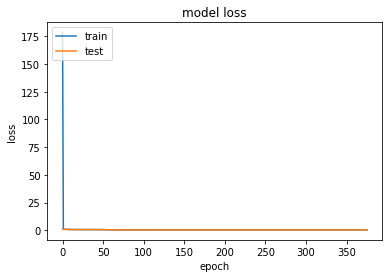

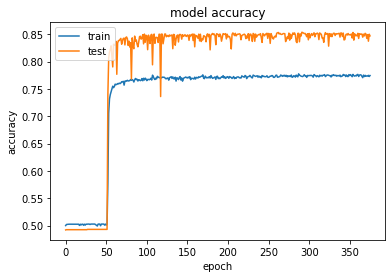

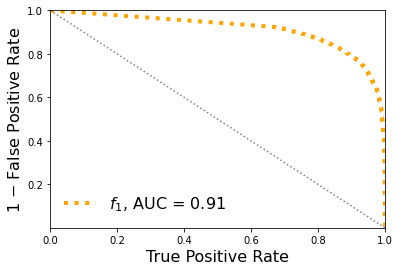

Classification score:


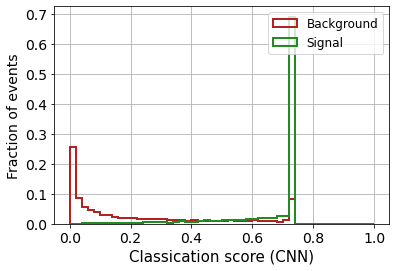


 ROC-AUC =  0.9129459193184795


In [46]:

# define the keras model
model = Sequential()
model.add(Conv1D(8, 2, input_shape=(X_mon_train.shape[1],1), activation='relu', strides = (1),kernel_regularizer=l2(0.005)))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Flatten())
model.add(Dense(4, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

## 4. Keep only diffT

In [ ]:
# concatenate the data
# X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(B_ptop,(len(B_ptop),1)), np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
# X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pbot,(len(S_pbot),1)), np.reshape(S_ptop,(len(S_ptop),1)), np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)

X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

### XGBoost

[0]	validation_0-logloss:0.69310	validation_1-logloss:0.69313
[1]	validation_0-logloss:0.69306	validation_1-logloss:0.69312


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[2]	validation_0-logloss:0.69300	validation_1-logloss:0.69311
[3]	validation_0-logloss:0.69295	validation_1-logloss:0.69310
[4]	validation_0-logloss:0.69292	validation_1-logloss:0.69310
[5]	validation_0-logloss:0.69289	validation_1-logloss:0.69308
[6]	validation_0-logloss:0.69284	validation_1-logloss:0.69308
[7]	validation_0-logloss:0.69279	validation_1-logloss:0.69307
[8]	validation_0-logloss:0.69274	validation_1-logloss:0.69306
[9]	validation_0-logloss:0.69273	validation_1-logloss:0.69306
[10]	validation_0-logloss:0.69269	validation_1-logloss:0.69304
[11]	validation_0-logloss:0.69264	validation_1-logloss:0.69304
[12]	validation_0-logloss:0.69261	validation_1-logloss:0.69302
[13]	validation_0-logloss:0.69258	validation_1-logloss:0.69302
[14]	validation_0-logloss:0.69254	validation_1-logloss:0.69301
[15]	validation_0-logloss:0.69251	validation_1-logloss:0.69301
[16]	validation_0-logloss:0.69248	validation_1-logloss:0.69300
[17]	validation_0-logloss:0.69244	validation_1-logloss:0.69299


[132]	validation_0-logloss:0.68997	validation_1-logloss:0.69323
[133]	validation_0-logloss:0.68995	validation_1-logloss:0.69324
[134]	validation_0-logloss:0.68994	validation_1-logloss:0.69324
[135]	validation_0-logloss:0.68992	validation_1-logloss:0.69325
[136]	validation_0-logloss:0.68991	validation_1-logloss:0.69325
[137]	validation_0-logloss:0.68990	validation_1-logloss:0.69325
[138]	validation_0-logloss:0.68989	validation_1-logloss:0.69325
[139]	validation_0-logloss:0.68986	validation_1-logloss:0.69326
[140]	validation_0-logloss:0.68985	validation_1-logloss:0.69326
[141]	validation_0-logloss:0.68984	validation_1-logloss:0.69326
[142]	validation_0-logloss:0.68983	validation_1-logloss:0.69326
[143]	validation_0-logloss:0.68982	validation_1-logloss:0.69327
[144]	validation_0-logloss:0.68980	validation_1-logloss:0.69328
[145]	validation_0-logloss:0.68978	validation_1-logloss:0.69328
[146]	validation_0-logloss:0.68977	validation_1-logloss:0.69328
[147]	validation_0-logloss:0.68975	valid

[261]	validation_0-logloss:0.68817	validation_1-logloss:0.69367
[262]	validation_0-logloss:0.68815	validation_1-logloss:0.69367
[263]	validation_0-logloss:0.68814	validation_1-logloss:0.69368
[264]	validation_0-logloss:0.68813	validation_1-logloss:0.69368
[265]	validation_0-logloss:0.68811	validation_1-logloss:0.69369
[266]	validation_0-logloss:0.68810	validation_1-logloss:0.69368
[267]	validation_0-logloss:0.68809	validation_1-logloss:0.69369
[268]	validation_0-logloss:0.68807	validation_1-logloss:0.69370
[269]	validation_0-logloss:0.68806	validation_1-logloss:0.69370
[270]	validation_0-logloss:0.68804	validation_1-logloss:0.69369
[271]	validation_0-logloss:0.68802	validation_1-logloss:0.69370
[272]	validation_0-logloss:0.68801	validation_1-logloss:0.69371
[273]	validation_0-logloss:0.68800	validation_1-logloss:0.69371
[274]	validation_0-logloss:0.68799	validation_1-logloss:0.69371
[275]	validation_0-logloss:0.68797	validation_1-logloss:0.69372
[276]	validation_0-logloss:0.68795	valid

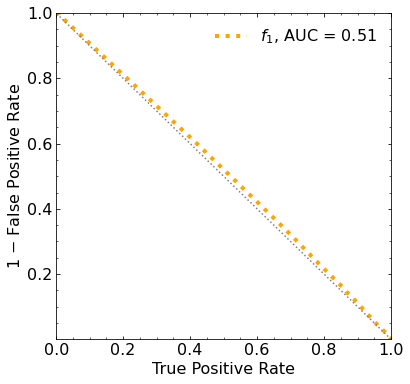

Classification score:


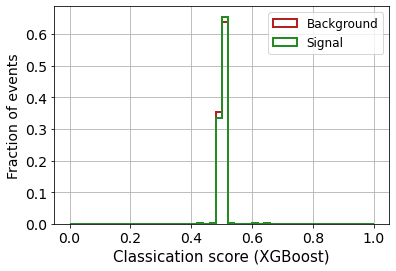


 ROC-AUC =  0.5145559212593148


In [54]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=300,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg)

In [55]:
print('\n ROC-AUC = ', roc_auc_xg)


 ROC-AUC =  0.5145559212593148


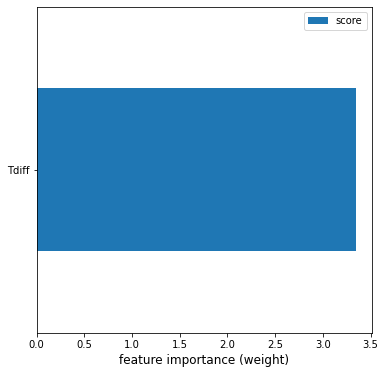

In [56]:
feature_important = classifier.get_booster().get_score(importance_type='gain')
# keys = list(feature_important.keys())
keys = ['Tdiff']
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(40, columns="score").plot(kind='barh', figsize = (6,6)) ## plot top 40 features
plt.xlabel('feature importance (weight)', fontsize = 12)
plt.show()

### DNN

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_54 (Dense)             (None, 128)               256       
_________________________________________________________________
leaky_re_lu_45 (LeakyReLU)   (None, 128)               0         
_________________________________________________________________
dropout_45 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_55 (Dense)             (None, 64)                8256      
_________________________________________________________________
leaky_re_lu_46 (LeakyReLU)   (None, 64)                0         
_________________________________________________________________
dropout_46 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_56 (Dense)             (None, 32)               

319/319 [==============================] - 0s 893us/step - loss: 0.6926 - accuracy: 0.5089 - val_loss: 0.6928 - val_accuracy: 0.5031
Epoch 94/500
319/319 [==============================] - 0s 910us/step - loss: 0.6928 - accuracy: 0.5041 - val_loss: 0.6930 - val_accuracy: 0.4946
Epoch 95/500
319/319 [==============================] - 0s 944us/step - loss: 0.6923 - accuracy: 0.5051 - val_loss: 0.6928 - val_accuracy: 0.4999
Epoch 96/500
319/319 [==============================] - 0s 941us/step - loss: 0.6933 - accuracy: 0.5038 - val_loss: 0.6930 - val_accuracy: 0.4928
Epoch 97/500
319/319 [==============================] - 0s 936us/step - loss: 0.6926 - accuracy: 0.5039 - val_loss: 0.6929 - val_accuracy: 0.4924
Epoch 98/500
319/319 [==============================] - 0s 931us/step - loss: 0.6926 - accuracy: 0.5086 - val_loss: 0.6928 - val_accuracy: 0.4979
Epoch 99/500
319/319 [==============================] - 0s 951us/step - loss: 0.6929 - accuracy: 0.5046 - val_loss: 0.6928 - val_accuracy

Epoch 149/500
319/319 [==============================] - 0s 926us/step - loss: 0.6924 - accuracy: 0.5085 - val_loss: 0.6927 - val_accuracy: 0.5057
Epoch 150/500
319/319 [==============================] - 0s 955us/step - loss: 0.6925 - accuracy: 0.5041 - val_loss: 0.6927 - val_accuracy: 0.4947
Epoch 151/500
319/319 [==============================] - 0s 948us/step - loss: 0.6926 - accuracy: 0.5016 - val_loss: 0.6930 - val_accuracy: 0.4947
Epoch 152/500
319/319 [==============================] - 0s 940us/step - loss: 0.6921 - accuracy: 0.5084 - val_loss: 0.6927 - val_accuracy: 0.5032
Epoch 153/500
319/319 [==============================] - 0s 926us/step - loss: 0.6926 - accuracy: 0.5069 - val_loss: 0.6927 - val_accuracy: 0.5021
Epoch 154/500
319/319 [==============================] - 0s 940us/step - loss: 0.6925 - accuracy: 0.5069 - val_loss: 0.6929 - val_accuracy: 0.4949
Epoch 155/500
319/319 [==============================] - 0s 942us/step - loss: 0.6929 - accuracy: 0.5059 - val_loss: 0

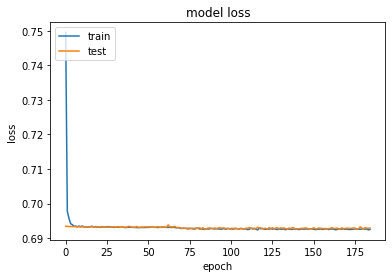

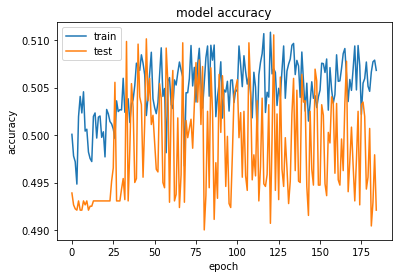

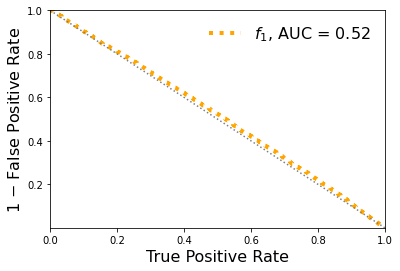

Classification score:


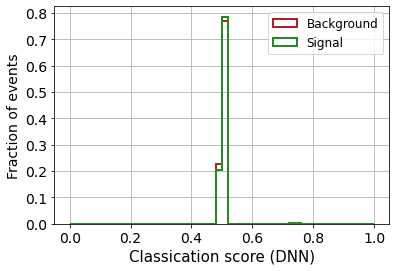


 ROC-AUC =  0.5152482560620039


In [57]:

# define the keras model
model = Sequential()
model.add(Dense(128, input_shape=(X_mon_train.shape[1],)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(64))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(32))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(16))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(8))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(4))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

In [58]:
print('\n ROC-AUC = ', roc_auc_dnn)


 ROC-AUC =  0.5152482560620039


Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_36 (Dense)             (None, 4)                 8         
_________________________________________________________________
dropout_24 (Dropout)         (None, 4)                 0         
_________________________________________________________________
dense_37 (Dense)             (None, 16)                80        
_________________________________________________________________
dropout_25 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_38 (Dense)             (None, 4)                 68        
_________________________________________________________________
dropout_26 (Dropout)         (None, 4)                 0         
_________________________________________________________________
dense_39 (Dense)             (None, 1)               

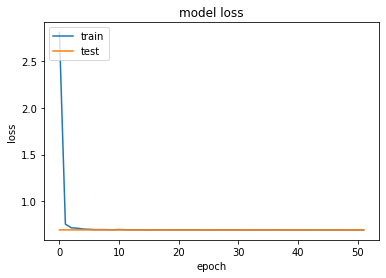

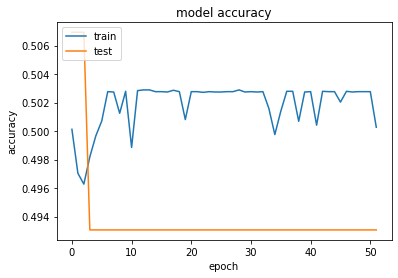

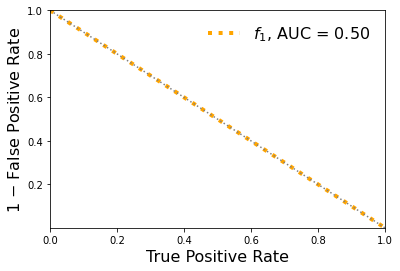

Classification score:


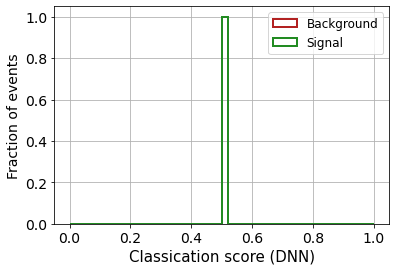


 ROC-AUC =  0.5


In [50]:

# define the keras model
model = Sequential()
model.add(Dense(4, input_shape=(X_mon_train.shape[1],), activation='relu'))
model.add(Dropout(0.20))
# model.add(Dense(8, activation='relu'))
# model.add(Dropout(0.20))
model.add(Dense(16, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(4, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

### CNN

In [ ]:
# prepare the dataset
X_mon_train_cn = X_mon_train.reshape(X_mon_train.shape[0], X_mon_train.shape[1], 1)
X_mon_test_cn = X_mon_test.reshape(X_mon_test.shape[0], X_mon_test.shape[1], 1)
X_mon_val_cn = X_mon_val.reshape(X_mon_val.shape[0], X_mon_val.shape[1], 1)

In [ ]:

# define the keras model
model = Sequential()
model.add(Conv1D(16, 3, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(16, 3, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(16, 3, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [ ]:
print('\n ROC-AUC = ', roc_auc_cnn)

In [52]:

# define the keras model
model = Sequential()
model.add(Conv1D(8, 2, input_shape=(X_mon_train.shape[1],1), activation='relu', strides = (1),kernel_regularizer=l2(0.005)))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Flatten())
model.add(Dense(4, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

ValueError: Negative dimension size caused by subtracting 2 from 1 for '{{node conv1d_6/conv1d}} = Conv2D[T=DT_FLOAT, data_format="NHWC", dilations=[1, 1, 1, 1], explicit_paddings=[], padding="VALID", strides=[1, 1, 1, 1], use_cudnn_on_gpu=true](conv1d_6/conv1d/ExpandDims, conv1d_6/conv1d/ExpandDims_1)' with input shapes: [?,1,1,1], [1,2,1,8].

## 5. Keep the 6 most important features (re-load the variables first)

##### Remove some columns or features (if you want)

In [11]:
# features = ['pT0','pA','pH','pHT','pL','pL90','pRMSW','pHTL']
remove_col_S1 = [0,2,3,4,5,7]
remove_col_S2 = [0,2,3,4,5,6,7]

B_pbot = B_pbot
B_ptop = B_ptop
B_ppeakS1 = np.delete(B_ppeakS1, remove_col_S1, axis=1)
B_ppeakS2 = np.delete(B_ppeakS2, remove_col_S2, axis=1)

print('B_pbot.shape: ', B_pbot.shape)
print('B_ptop.shape: ', B_ptop.shape)
print('B_ppeakS1.shape :', B_ppeakS1.shape)
print('B_ppeakS2.shape: ', B_ppeakS2.shape)


S_pbot = S_pbot
S_ptop = S_ptop
S_ppeakS1 = np.delete(S_ppeakS1, remove_col_S1, axis=1)
S_ppeakS2 = np.delete(S_ppeakS2, remove_col_S2, axis=1)

print('S_pbot.shape: ', S_pbot.shape)
print('S_ptop.shape: ', S_ptop.shape)
print('S_ppeakS1.shape :', S_ppeakS1.shape)
print('S_ppeakS2.shape: ', S_ppeakS2.shape)

B_pbot.shape:  (32015,)
B_ptop.shape:  (32015,)
B_ppeakS1.shape : (32015, 2)
B_ppeakS2.shape:  (32015, 1)
S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 2)
S_ppeakS2.shape:  (32015, 1)


In [12]:
# concatenate the data
X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(B_ptop,(len(B_ptop),1)), np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pbot,(len(S_pbot),1)), np.reshape(S_ptop,(len(S_ptop),1)), np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

X_mon_B.shape:  (32015, 6)
X_mon_S.shape:  (32015, 6)
X_mon.shape:  (64030, 6)

X_mon_train :  (40818, 6)
y_mon_train :  (40818,)
X_mon_val :  (7204, 6)
y_mon_val :  (7204,)
X_mon_test :  (16008, 6)
y_mon_test :  (16008,)



### XGBoost

[0]	validation_0-logloss:0.68665	validation_1-logloss:0.68672


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[1]	validation_0-logloss:0.68035	validation_1-logloss:0.68046
[2]	validation_0-logloss:0.67414	validation_1-logloss:0.67430
[3]	validation_0-logloss:0.66811	validation_1-logloss:0.66831
[4]	validation_0-logloss:0.66218	validation_1-logloss:0.66242
[5]	validation_0-logloss:0.65625	validation_1-logloss:0.65656
[6]	validation_0-logloss:0.65053	validation_1-logloss:0.65092
[7]	validation_0-logloss:0.64479	validation_1-logloss:0.64525
[8]	validation_0-logloss:0.63924	validation_1-logloss:0.63974
[9]	validation_0-logloss:0.63373	validation_1-logloss:0.63427
[10]	validation_0-logloss:0.62840	validation_1-logloss:0.62901
[11]	validation_0-logloss:0.62306	validation_1-logloss:0.62375
[12]	validation_0-logloss:0.61791	validation_1-logloss:0.61867
[13]	validation_0-logloss:0.61275	validation_1-logloss:0.61353
[14]	validation_0-logloss:0.60777	validation_1-logloss:0.60860
[15]	validation_0-logloss:0.60276	validation_1-logloss:0.60367
[16]	validation_0-logloss:0.59794	validation_1-logloss:0.59890
[

[131]	validation_0-logloss:0.31468	validation_1-logloss:0.31933
[132]	validation_0-logloss:0.31354	validation_1-logloss:0.31825
[133]	validation_0-logloss:0.31230	validation_1-logloss:0.31701
[134]	validation_0-logloss:0.31112	validation_1-logloss:0.31590
[135]	validation_0-logloss:0.30996	validation_1-logloss:0.31477
[136]	validation_0-logloss:0.30876	validation_1-logloss:0.31363
[137]	validation_0-logloss:0.30767	validation_1-logloss:0.31258
[138]	validation_0-logloss:0.30648	validation_1-logloss:0.31140
[139]	validation_0-logloss:0.30532	validation_1-logloss:0.31031
[140]	validation_0-logloss:0.30423	validation_1-logloss:0.30923
[141]	validation_0-logloss:0.30313	validation_1-logloss:0.30818
[142]	validation_0-logloss:0.30205	validation_1-logloss:0.30712
[143]	validation_0-logloss:0.30102	validation_1-logloss:0.30615
[144]	validation_0-logloss:0.29991	validation_1-logloss:0.30510
[145]	validation_0-logloss:0.29880	validation_1-logloss:0.30400
[146]	validation_0-logloss:0.29776	valid

[260]	validation_0-logloss:0.22239	validation_1-logloss:0.23217
[261]	validation_0-logloss:0.22196	validation_1-logloss:0.23178
[262]	validation_0-logloss:0.22154	validation_1-logloss:0.23142
[263]	validation_0-logloss:0.22114	validation_1-logloss:0.23105
[264]	validation_0-logloss:0.22076	validation_1-logloss:0.23075
[265]	validation_0-logloss:0.22035	validation_1-logloss:0.23039
[266]	validation_0-logloss:0.21997	validation_1-logloss:0.23002
[267]	validation_0-logloss:0.21959	validation_1-logloss:0.22970
[268]	validation_0-logloss:0.21922	validation_1-logloss:0.22932
[269]	validation_0-logloss:0.21883	validation_1-logloss:0.22896
[270]	validation_0-logloss:0.21848	validation_1-logloss:0.22866
[271]	validation_0-logloss:0.21813	validation_1-logloss:0.22837
[272]	validation_0-logloss:0.21774	validation_1-logloss:0.22805
[273]	validation_0-logloss:0.21739	validation_1-logloss:0.22774
[274]	validation_0-logloss:0.21706	validation_1-logloss:0.22747
[275]	validation_0-logloss:0.21668	valid

[389]	validation_0-logloss:0.18927	validation_1-logloss:0.20341
[390]	validation_0-logloss:0.18915	validation_1-logloss:0.20330
[391]	validation_0-logloss:0.18901	validation_1-logloss:0.20318
[392]	validation_0-logloss:0.18882	validation_1-logloss:0.20305
[393]	validation_0-logloss:0.18862	validation_1-logloss:0.20286
[394]	validation_0-logloss:0.18845	validation_1-logloss:0.20273
[395]	validation_0-logloss:0.18831	validation_1-logloss:0.20261
[396]	validation_0-logloss:0.18815	validation_1-logloss:0.20247
[397]	validation_0-logloss:0.18798	validation_1-logloss:0.20233
[398]	validation_0-logloss:0.18781	validation_1-logloss:0.20218
[399]	validation_0-logloss:0.18762	validation_1-logloss:0.20205
[400]	validation_0-logloss:0.18746	validation_1-logloss:0.20190
[401]	validation_0-logloss:0.18726	validation_1-logloss:0.20175
[402]	validation_0-logloss:0.18711	validation_1-logloss:0.20162
[403]	validation_0-logloss:0.18698	validation_1-logloss:0.20153
[404]	validation_0-logloss:0.18684	valid

[518]	validation_0-logloss:0.17327	validation_1-logloss:0.19106
[519]	validation_0-logloss:0.17317	validation_1-logloss:0.19099
[520]	validation_0-logloss:0.17308	validation_1-logloss:0.19093
[521]	validation_0-logloss:0.17297	validation_1-logloss:0.19085
[522]	validation_0-logloss:0.17287	validation_1-logloss:0.19078
[523]	validation_0-logloss:0.17280	validation_1-logloss:0.19072
[524]	validation_0-logloss:0.17269	validation_1-logloss:0.19065
[525]	validation_0-logloss:0.17261	validation_1-logloss:0.19057
[526]	validation_0-logloss:0.17253	validation_1-logloss:0.19052
[527]	validation_0-logloss:0.17244	validation_1-logloss:0.19046
[528]	validation_0-logloss:0.17236	validation_1-logloss:0.19039
[529]	validation_0-logloss:0.17228	validation_1-logloss:0.19034
[530]	validation_0-logloss:0.17219	validation_1-logloss:0.19029
[531]	validation_0-logloss:0.17211	validation_1-logloss:0.19021
[532]	validation_0-logloss:0.17203	validation_1-logloss:0.19015
[533]	validation_0-logloss:0.17196	valid

[647]	validation_0-logloss:0.16458	validation_1-logloss:0.18519
[648]	validation_0-logloss:0.16453	validation_1-logloss:0.18516
[649]	validation_0-logloss:0.16447	validation_1-logloss:0.18512
[650]	validation_0-logloss:0.16442	validation_1-logloss:0.18508
[651]	validation_0-logloss:0.16437	validation_1-logloss:0.18505
[652]	validation_0-logloss:0.16431	validation_1-logloss:0.18501
[653]	validation_0-logloss:0.16427	validation_1-logloss:0.18497
[654]	validation_0-logloss:0.16422	validation_1-logloss:0.18496
[655]	validation_0-logloss:0.16417	validation_1-logloss:0.18492
[656]	validation_0-logloss:0.16411	validation_1-logloss:0.18489
[657]	validation_0-logloss:0.16406	validation_1-logloss:0.18485
[658]	validation_0-logloss:0.16403	validation_1-logloss:0.18482
[659]	validation_0-logloss:0.16398	validation_1-logloss:0.18478
[660]	validation_0-logloss:0.16392	validation_1-logloss:0.18476
[661]	validation_0-logloss:0.16387	validation_1-logloss:0.18472
[662]	validation_0-logloss:0.16382	valid

[776]	validation_0-logloss:0.15906	validation_1-logloss:0.18188
[777]	validation_0-logloss:0.15903	validation_1-logloss:0.18186
[778]	validation_0-logloss:0.15900	validation_1-logloss:0.18185
[779]	validation_0-logloss:0.15896	validation_1-logloss:0.18183
[780]	validation_0-logloss:0.15893	validation_1-logloss:0.18180
[781]	validation_0-logloss:0.15890	validation_1-logloss:0.18178
[782]	validation_0-logloss:0.15886	validation_1-logloss:0.18175
[783]	validation_0-logloss:0.15884	validation_1-logloss:0.18174
[784]	validation_0-logloss:0.15879	validation_1-logloss:0.18173
[785]	validation_0-logloss:0.15876	validation_1-logloss:0.18171
[786]	validation_0-logloss:0.15874	validation_1-logloss:0.18169
[787]	validation_0-logloss:0.15870	validation_1-logloss:0.18166
[788]	validation_0-logloss:0.15866	validation_1-logloss:0.18164
[789]	validation_0-logloss:0.15864	validation_1-logloss:0.18163
[790]	validation_0-logloss:0.15861	validation_1-logloss:0.18161
[791]	validation_0-logloss:0.15859	valid

[905]	validation_0-logloss:0.15530	validation_1-logloss:0.18000
[906]	validation_0-logloss:0.15528	validation_1-logloss:0.17999
[907]	validation_0-logloss:0.15526	validation_1-logloss:0.17998
[908]	validation_0-logloss:0.15524	validation_1-logloss:0.17997
[909]	validation_0-logloss:0.15521	validation_1-logloss:0.17997
[910]	validation_0-logloss:0.15518	validation_1-logloss:0.17996
[911]	validation_0-logloss:0.15515	validation_1-logloss:0.17994
[912]	validation_0-logloss:0.15514	validation_1-logloss:0.17994
[913]	validation_0-logloss:0.15511	validation_1-logloss:0.17993
[914]	validation_0-logloss:0.15507	validation_1-logloss:0.17992
[915]	validation_0-logloss:0.15505	validation_1-logloss:0.17991
[916]	validation_0-logloss:0.15503	validation_1-logloss:0.17990
[917]	validation_0-logloss:0.15500	validation_1-logloss:0.17990
[918]	validation_0-logloss:0.15497	validation_1-logloss:0.17989
[919]	validation_0-logloss:0.15496	validation_1-logloss:0.17988
[920]	validation_0-logloss:0.15494	valid

[1033]	validation_0-logloss:0.15239	validation_1-logloss:0.17907
[1034]	validation_0-logloss:0.15237	validation_1-logloss:0.17905
[1035]	validation_0-logloss:0.15234	validation_1-logloss:0.17905
[1036]	validation_0-logloss:0.15232	validation_1-logloss:0.17903
[1037]	validation_0-logloss:0.15230	validation_1-logloss:0.17902
[1038]	validation_0-logloss:0.15229	validation_1-logloss:0.17902
[1039]	validation_0-logloss:0.15227	validation_1-logloss:0.17902
[1040]	validation_0-logloss:0.15224	validation_1-logloss:0.17903
[1041]	validation_0-logloss:0.15222	validation_1-logloss:0.17903
[1042]	validation_0-logloss:0.15221	validation_1-logloss:0.17902
[1043]	validation_0-logloss:0.15219	validation_1-logloss:0.17902
[1044]	validation_0-logloss:0.15217	validation_1-logloss:0.17901
[1045]	validation_0-logloss:0.15215	validation_1-logloss:0.17901
[1046]	validation_0-logloss:0.15213	validation_1-logloss:0.17901
[1047]	validation_0-logloss:0.15210	validation_1-logloss:0.17900
[1048]	validation_0-loglo

[1286]	validation_0-logloss:0.14803	validation_1-logloss:0.17860
[1287]	validation_0-logloss:0.14803	validation_1-logloss:0.17860
[1288]	validation_0-logloss:0.14801	validation_1-logloss:0.17860
[1289]	validation_0-logloss:0.14799	validation_1-logloss:0.17859
[1290]	validation_0-logloss:0.14798	validation_1-logloss:0.17859
[1291]	validation_0-logloss:0.14797	validation_1-logloss:0.17858
[1292]	validation_0-logloss:0.14796	validation_1-logloss:0.17859
[1293]	validation_0-logloss:0.14795	validation_1-logloss:0.17859
[1294]	validation_0-logloss:0.14794	validation_1-logloss:0.17858
[1295]	validation_0-logloss:0.14792	validation_1-logloss:0.17858
[1296]	validation_0-logloss:0.14791	validation_1-logloss:0.17858
[1297]	validation_0-logloss:0.14790	validation_1-logloss:0.17858
[1298]	validation_0-logloss:0.14788	validation_1-logloss:0.17859
[1299]	validation_0-logloss:0.14786	validation_1-logloss:0.17858
[1300]	validation_0-logloss:0.14784	validation_1-logloss:0.17859
[1301]	validation_0-loglo

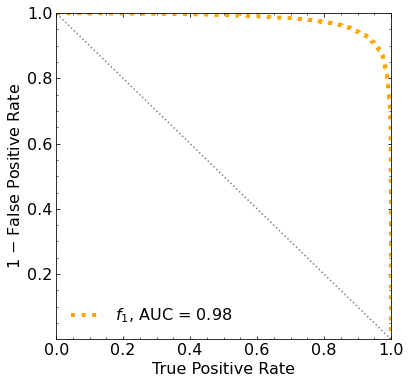

Classification score:


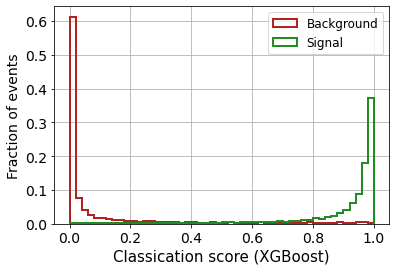


 ROC-AUC =  0.9796006003554758


In [13]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg)

In [14]:
np.savetxt('rocs/roc_6feats.txt', [tpr_mon_xg, fpr_mon_xg])

print('\n ROC-AUC = ', roc_auc_xg)


 ROC-AUC =  0.9796006003554758


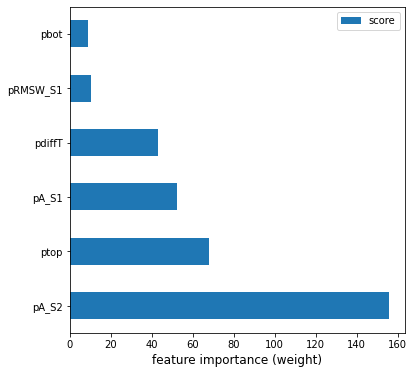

In [15]:
feature_important = classifier.get_booster().get_score(importance_type='gain')
# keys = list(feature_important.keys())
keys = ['pA_S1','pRMSW_S1', 'pA_S2','pbot', 'ptop', 'pdiffT']
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(40, columns="score").plot(kind='barh', figsize = (6,6)) ## plot top 40 features
plt.xlabel('feature importance (weight)', fontsize = 12)
plt.show()

### DNN

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 128)               896       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 128)               0         
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                8256      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 64)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2

319/319 [==============================] - 0s 957us/step - loss: 0.2478 - accuracy: 0.9055 - val_loss: 0.2963 - val_accuracy: 0.8674
Epoch 94/500
319/319 [==============================] - 0s 930us/step - loss: 0.2424 - accuracy: 0.9060 - val_loss: 0.2001 - val_accuracy: 0.9205
Epoch 95/500
319/319 [==============================] - 0s 938us/step - loss: 0.2405 - accuracy: 0.9057 - val_loss: 0.3636 - val_accuracy: 0.8315
Epoch 96/500
319/319 [==============================] - 0s 935us/step - loss: 0.2391 - accuracy: 0.9093 - val_loss: 0.3603 - val_accuracy: 0.8512
Epoch 97/500
319/319 [==============================] - 0s 936us/step - loss: 0.2466 - accuracy: 0.9037 - val_loss: 0.2654 - val_accuracy: 0.8806
Epoch 98/500
319/319 [==============================] - 0s 930us/step - loss: 0.2447 - accuracy: 0.9079 - val_loss: 0.2492 - val_accuracy: 0.8931
Epoch 99/500
319/319 [==============================] - 0s 942us/step - loss: 0.2469 - accuracy: 0.9044 - val_loss: 0.2946 - val_accuracy

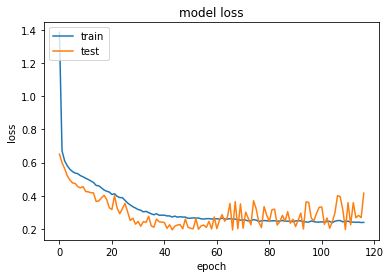

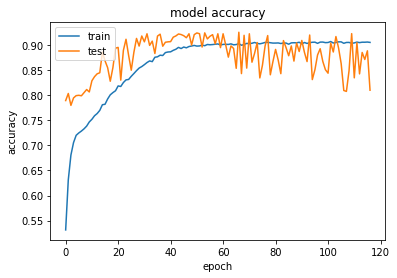

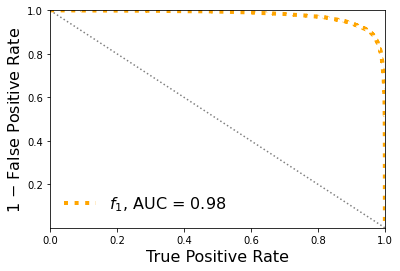

Classification score:


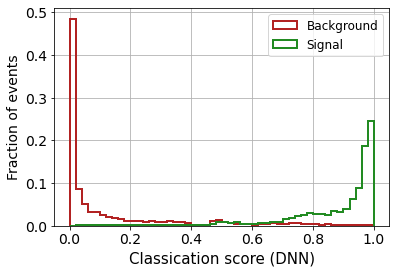


 ROC-AUC =  0.9783518032698288


In [16]:

# define the keras model
model = Sequential()
model.add(Dense(128, input_shape=(X_mon_train.shape[1],)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(64))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(32))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(16))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(8))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(4))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

In [17]:
print('\n ROC-AUC = ', roc_auc_dnn)


 ROC-AUC =  0.9783518032698288


Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_50 (Dense)             (None, 4)                 28        
_________________________________________________________________
dropout_34 (Dropout)         (None, 4)                 0         
_________________________________________________________________
dense_51 (Dense)             (None, 16)                80        
_________________________________________________________________
dropout_35 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_52 (Dense)             (None, 4)                 68        
_________________________________________________________________
dropout_36 (Dropout)         (None, 4)                 0         
_________________________________________________________________
dense_53 (Dense)             (None, 1)               

319/319 [==============================] - 0s 585us/step - loss: 0.3872 - accuracy: 0.8048 - val_loss: 0.4994 - val_accuracy: 0.6953
Epoch 105/500
319/319 [==============================] - 0s 595us/step - loss: 0.3828 - accuracy: 0.8066 - val_loss: 0.4654 - val_accuracy: 0.7496
Epoch 106/500
319/319 [==============================] - 0s 589us/step - loss: 0.3790 - accuracy: 0.8062 - val_loss: 0.4424 - val_accuracy: 0.7561
Epoch 107/500
319/319 [==============================] - 0s 612us/step - loss: 0.3865 - accuracy: 0.8064 - val_loss: 0.4539 - val_accuracy: 0.7497
Epoch 108/500
319/319 [==============================] - 0s 610us/step - loss: 0.3874 - accuracy: 0.8028 - val_loss: 0.4249 - val_accuracy: 0.8009
Epoch 109/500
319/319 [==============================] - 0s 607us/step - loss: 0.3816 - accuracy: 0.8073 - val_loss: 0.5183 - val_accuracy: 0.7217
Epoch 110/500
319/319 [==============================] - 0s 596us/step - loss: 0.3799 - accuracy: 0.8073 - val_loss: 0.4934 - val_ac

Epoch 160/500
319/319 [==============================] - 0s 595us/step - loss: 0.3764 - accuracy: 0.8081 - val_loss: 0.4202 - val_accuracy: 0.7959
Epoch 161/500
319/319 [==============================] - 0s 584us/step - loss: 0.3842 - accuracy: 0.8061 - val_loss: 0.4465 - val_accuracy: 0.7776
Epoch 162/500
319/319 [==============================] - 0s 587us/step - loss: 0.3725 - accuracy: 0.8100 - val_loss: 0.4565 - val_accuracy: 0.7657
Epoch 163/500
319/319 [==============================] - 0s 595us/step - loss: 0.3801 - accuracy: 0.8082 - val_loss: 0.3885 - val_accuracy: 0.8318
Epoch 164/500
319/319 [==============================] - 0s 590us/step - loss: 0.3792 - accuracy: 0.8068 - val_loss: 0.4224 - val_accuracy: 0.7901
Epoch 165/500
319/319 [==============================] - 0s 595us/step - loss: 0.3782 - accuracy: 0.8060 - val_loss: 0.4023 - val_accuracy: 0.8209
Epoch 166/500
319/319 [==============================] - 0s 603us/step - loss: 0.3767 - accuracy: 0.8109 - val_loss: 0

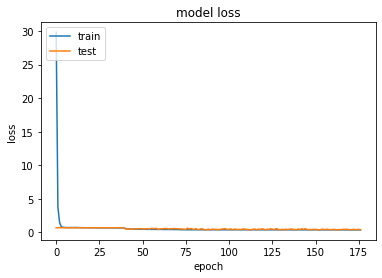

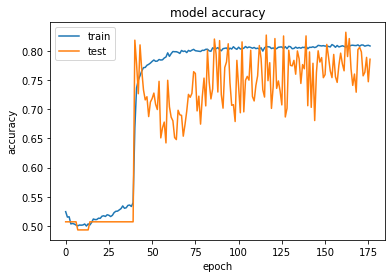

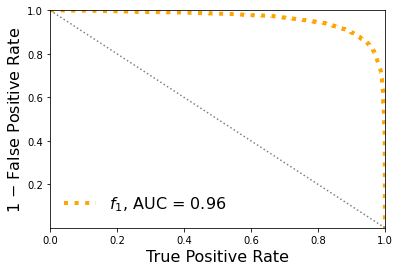

Classification score:


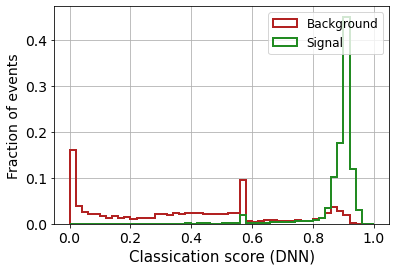


 ROC-AUC =  0.9621427455399777


In [70]:

# define the keras model
model = Sequential()
model.add(Dense(4, input_shape=(X_mon_train.shape[1],), activation='relu'))
model.add(Dropout(0.20))
# model.add(Dense(8, activation='relu'))
# model.add(Dropout(0.20))
model.add(Dense(16, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(4, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_dnn = model.predict(X_mon_test)

# Compute ROC curve and ROC area for each class
fpr_dnn = dict()
tpr_dnn = dict()
roc_auc_dnn = dict()
fpr_dnn, tpr_dnn, _ = roc_curve(y_mon_test, y_pred_dnn)
roc_auc_dnn = auc(fpr_dnn, tpr_dnn)


plt.figure()
plt.plot(tpr_dnn,1-fpr_dnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_dnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_dnn[i,0])
    else:
        pred_XG_NP.append(y_pred_dnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (DNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_dnn)

### CNN

In [13]:
# prepare the dataset
X_mon_train_cn = X_mon_train.reshape(X_mon_train.shape[0], X_mon_train.shape[1], 1)
X_mon_test_cn = X_mon_test.reshape(X_mon_test.shape[0], X_mon_test.shape[1], 1)
X_mon_val_cn = X_mon_val.reshape(X_mon_val.shape[0], X_mon_val.shape[1], 1)

Epoch 1/500
319/319 [==============================] - 5s 2ms/step - loss: 34.6777 - accuracy: 0.5511 - val_loss: 0.7128 - val_accuracy: 0.7078
Epoch 2/500
319/319 [==============================] - 0s 885us/step - loss: 0.7714 - accuracy: 0.6847 - val_loss: 0.6665 - val_accuracy: 0.7504
Epoch 3/500
319/319 [==============================] - 0s 902us/step - loss: 0.6990 - accuracy: 0.7446 - val_loss: 0.6222 - val_accuracy: 0.8008
Epoch 4/500
319/319 [==============================] - 0s 870us/step - loss: 0.6669 - accuracy: 0.7754 - val_loss: 0.5871 - val_accuracy: 0.8243
Epoch 5/500
319/319 [==============================] - 0s 882us/step - loss: 0.6372 - accuracy: 0.7867 - val_loss: 0.5782 - val_accuracy: 0.8291
Epoch 6/500
319/319 [==============================] - 0s 867us/step - loss: 0.6128 - accuracy: 0.7976 - val_loss: 0.5552 - val_accuracy: 0.8376
Epoch 7/500
319/319 [==============================] - 0s 860us/step - loss: 0.5994 - accuracy: 0.7978 - val_loss: 0.5233 - val_acc

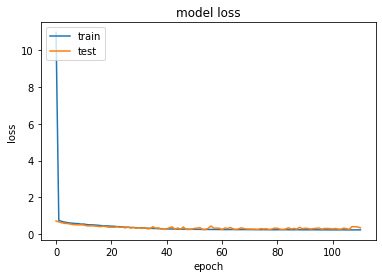

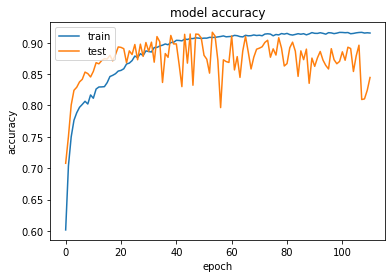

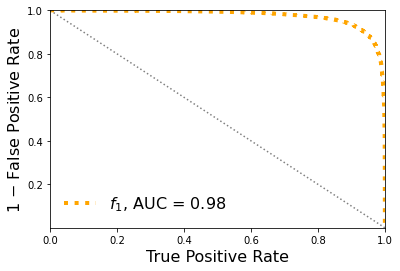

Classification score:


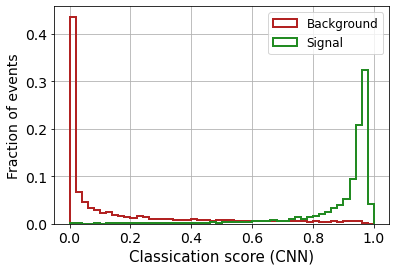


 ROC-AUC =  0.9751000182687971


In [22]:

# define the keras model
model = Sequential()
model.add(Conv1D(32, 3, input_shape=(X_mon_train.shape[1],1), strides = (1),kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(Conv1D(32, 3, kernel_regularizer=l2(0.005)))
model.add(keras.layers.LeakyReLU(alpha=0.05))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(32, bias_regularizer=regularizers.l2(0.001),kernel_regularizer=regularizers.l2(0.001)))
model.add(keras.layers.LeakyReLU(alpha=0.05))  
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

In [23]:
print('\n ROC-AUC = ', roc_auc_cnn)


 ROC-AUC =  0.9751000182687971


Epoch 1/500
319/319 [==============================] - 1s 1ms/step - loss: 37.0348 - accuracy: 0.4939 - val_loss: 0.6023 - val_accuracy: 0.6787
Epoch 2/500
319/319 [==============================] - 0s 625us/step - loss: 0.6321 - accuracy: 0.6505 - val_loss: 0.5640 - val_accuracy: 0.7393
Epoch 3/500
319/319 [==============================] - 0s 614us/step - loss: 0.6020 - accuracy: 0.6752 - val_loss: 0.5395 - val_accuracy: 0.7581
Epoch 4/500
319/319 [==============================] - 0s 600us/step - loss: 0.5920 - accuracy: 0.6877 - val_loss: 0.5197 - val_accuracy: 0.7725
Epoch 5/500
319/319 [==============================] - 0s 621us/step - loss: 0.5856 - accuracy: 0.6931 - val_loss: 0.5105 - val_accuracy: 0.7711
Epoch 6/500
319/319 [==============================] - 0s 607us/step - loss: 0.5686 - accuracy: 0.7114 - val_loss: 0.4618 - val_accuracy: 0.8282
Epoch 7/500
319/319 [==============================] - 0s 593us/step - loss: 0.5369 - accuracy: 0.7409 - val_loss: 0.4643 - val_acc

319/319 [==============================] - 0s 606us/step - loss: 0.4001 - accuracy: 0.8298 - val_loss: 0.2847 - val_accuracy: 0.9084
Epoch 114/500
319/319 [==============================] - 0s 597us/step - loss: 0.3966 - accuracy: 0.8307 - val_loss: 0.2703 - val_accuracy: 0.9203
Epoch 115/500
319/319 [==============================] - 0s 590us/step - loss: 0.3981 - accuracy: 0.8326 - val_loss: 0.2782 - val_accuracy: 0.9185
Epoch 116/500
319/319 [==============================] - 0s 593us/step - loss: 0.4063 - accuracy: 0.8274 - val_loss: 0.2897 - val_accuracy: 0.9044
Epoch 117/500
319/319 [==============================] - 0s 611us/step - loss: 0.3980 - accuracy: 0.8303 - val_loss: 0.2697 - val_accuracy: 0.9216
Epoch 118/500
319/319 [==============================] - 0s 597us/step - loss: 0.3942 - accuracy: 0.8343 - val_loss: 0.2729 - val_accuracy: 0.9198
Epoch 119/500
319/319 [==============================] - 0s 598us/step - loss: 0.3980 - accuracy: 0.8310 - val_loss: 0.2661 - val_ac

Epoch 169/500
319/319 [==============================] - 0s 596us/step - loss: 0.3945 - accuracy: 0.8323 - val_loss: 0.2711 - val_accuracy: 0.9153
Epoch 170/500
319/319 [==============================] - 0s 594us/step - loss: 0.3985 - accuracy: 0.8306 - val_loss: 0.2744 - val_accuracy: 0.9187
Epoch 171/500
319/319 [==============================] - 0s 595us/step - loss: 0.3943 - accuracy: 0.8326 - val_loss: 0.2741 - val_accuracy: 0.9141
Epoch 172/500
319/319 [==============================] - 0s 608us/step - loss: 0.4004 - accuracy: 0.8299 - val_loss: 0.2708 - val_accuracy: 0.9202
Epoch 173/500
319/319 [==============================] - 0s 607us/step - loss: 0.4040 - accuracy: 0.8266 - val_loss: 0.2640 - val_accuracy: 0.9234
Epoch 174/500
319/319 [==============================] - 0s 592us/step - loss: 0.4027 - accuracy: 0.8280 - val_loss: 0.2639 - val_accuracy: 0.9228
Epoch 175/500
319/319 [==============================] - 0s 618us/step - loss: 0.3957 - accuracy: 0.8345 - val_loss: 0

Epoch 225/500
319/319 [==============================] - 0s 602us/step - loss: 0.3929 - accuracy: 0.8332 - val_loss: 0.2685 - val_accuracy: 0.9206
Epoch 226/500
319/319 [==============================] - 0s 606us/step - loss: 0.3895 - accuracy: 0.8350 - val_loss: 0.2720 - val_accuracy: 0.9144
Epoch 227/500
319/319 [==============================] - 0s 603us/step - loss: 0.3911 - accuracy: 0.8329 - val_loss: 0.2900 - val_accuracy: 0.9102
Epoch 228/500
319/319 [==============================] - 0s 594us/step - loss: 0.3946 - accuracy: 0.8316 - val_loss: 0.2828 - val_accuracy: 0.9094
Epoch 229/500
319/319 [==============================] - 0s 603us/step - loss: 0.3943 - accuracy: 0.8323 - val_loss: 0.2934 - val_accuracy: 0.9077
Epoch 230/500
319/319 [==============================] - 0s 584us/step - loss: 0.3989 - accuracy: 0.8292 - val_loss: 0.2641 - val_accuracy: 0.9216
Epoch 231/500
319/319 [==============================] - 0s 581us/step - loss: 0.4049 - accuracy: 0.8253 - val_loss: 0

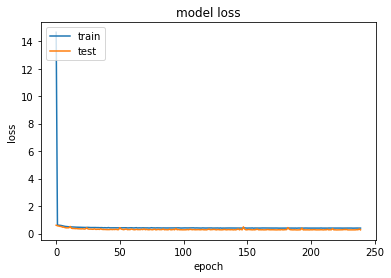

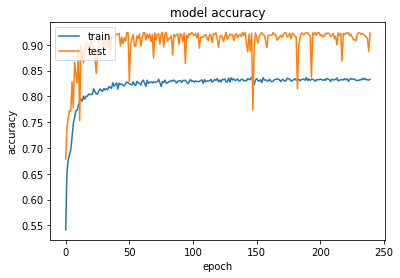

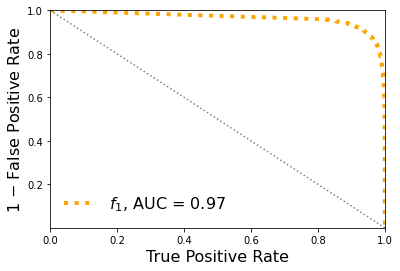

Classification score:


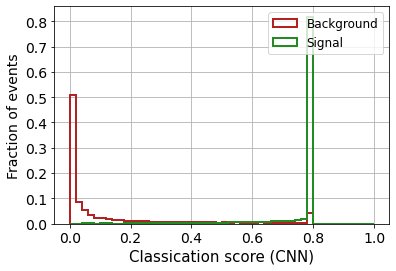


 ROC-AUC =  0.9654637312395353


In [68]:

# define the keras model
model = Sequential()
model.add(Conv1D(8, 2, input_shape=(X_mon_train.shape[1],1), activation='relu', strides = (1),kernel_regularizer=l2(0.005)))
model.add(MaxPooling1D(2, strides = (1)))
model.add(Flatten())
model.add(Dense(4, activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(1, activation='sigmoid'))


# Print the model summary
#model.summary()

# to stop the training if validation loss does not improve after patience number of epochs
stop_training = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


batch_size = 128
tot_epochs = 500


# Entrenamos el modelo
history = model.fit(X_mon_train_cn,
                    y_mon_train,
                    batch_size=batch_size,
                    epochs=tot_epochs,
                    callbacks=[stop_training],
                    verbose=1,
                    validation_data=(X_mon_val_cn, y_mon_val),
                    shuffle=True)


# Plot de la cost function para la train y test data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.legend(['train', 'test'], loc='upper left')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Plot de la accuracy function para la train y test data
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


#model.save(root_dir + 'CNN-histo-mix-v2/saved-models/' + 'conv-' + nameMIX_linear +'.h5') # Guardar el modelo.  # Predicción de la red entrenada
y_pred_cnn = model.predict(X_mon_test_cn)

# Compute ROC curve and ROC area for each class
fpr_cnn = dict()
tpr_cnn = dict()
roc_auc_cnn = dict()
fpr_cnn, tpr_cnn, _ = roc_curve(y_mon_test, y_pred_cnn)
roc_auc_cnn = auc(fpr_cnn, tpr_cnn)


plt.figure()
plt.plot(tpr_cnn,1-fpr_cnn,label="$f_{1}$, AUC = %0.2f" % roc_auc_cnn,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()








########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_cnn[i,0])
    else:
        pred_XG_NP.append(y_pred_cnn[i,0])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (CNN)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()






print('\n ROC-AUC = ', roc_auc_cnn)

## 5. Keep the 3 features (pbot, ptop, diffT) (re-load the variables first)

##### Remove some columns or features (if you want)

In [21]:
# concatenate the data
X_mon_B = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(B_ptop,(len(B_ptop),1)), np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
X_mon_S = np.concatenate([np.reshape(S_pbot,(len(S_pbot),1)), np.reshape(S_ptop,(len(S_ptop),1)), np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

X_mon_B.shape:  (32015, 3)
X_mon_S.shape:  (32015, 3)
X_mon.shape:  (64030, 3)

X_mon_train :  (40818, 3)
y_mon_train :  (40818,)
X_mon_val :  (7204, 3)
y_mon_val :  (7204,)
X_mon_test :  (16008, 3)
y_mon_test :  (16008,)



### XGBoost

[0]	validation_0-logloss:0.68686	validation_1-logloss:0.68688
[1]	validation_0-logloss:0.68072	validation_1-logloss:0.68073
[2]	validation_0-logloss:0.67463	validation_1-logloss:0.67467
[3]	validation_0-logloss:0.66866	validation_1-logloss:0.66873


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[4]	validation_0-logloss:0.66281	validation_1-logloss:0.66292
[5]	validation_0-logloss:0.65705	validation_1-logloss:0.65721
[6]	validation_0-logloss:0.65141	validation_1-logloss:0.65160
[7]	validation_0-logloss:0.64587	validation_1-logloss:0.64612
[8]	validation_0-logloss:0.64044	validation_1-logloss:0.64073
[9]	validation_0-logloss:0.63513	validation_1-logloss:0.63546
[10]	validation_0-logloss:0.62988	validation_1-logloss:0.63028
[11]	validation_0-logloss:0.62469	validation_1-logloss:0.62513
[12]	validation_0-logloss:0.61966	validation_1-logloss:0.62014
[13]	validation_0-logloss:0.61464	validation_1-logloss:0.61518
[14]	validation_0-logloss:0.60963	validation_1-logloss:0.61023
[15]	validation_0-logloss:0.60483	validation_1-logloss:0.60550
[16]	validation_0-logloss:0.59996	validation_1-logloss:0.60069
[17]	validation_0-logloss:0.59532	validation_1-logloss:0.59608
[18]	validation_0-logloss:0.59061	validation_1-logloss:0.59140
[19]	validation_0-logloss:0.58615	validation_1-logloss:0.5869

[134]	validation_0-logloss:0.31853	validation_1-logloss:0.32266
[135]	validation_0-logloss:0.31736	validation_1-logloss:0.32152
[136]	validation_0-logloss:0.31616	validation_1-logloss:0.32037
[137]	validation_0-logloss:0.31503	validation_1-logloss:0.31926
[138]	validation_0-logloss:0.31390	validation_1-logloss:0.31817
[139]	validation_0-logloss:0.31280	validation_1-logloss:0.31707
[140]	validation_0-logloss:0.31170	validation_1-logloss:0.31600
[141]	validation_0-logloss:0.31067	validation_1-logloss:0.31503
[142]	validation_0-logloss:0.30956	validation_1-logloss:0.31395
[143]	validation_0-logloss:0.30850	validation_1-logloss:0.31289
[144]	validation_0-logloss:0.30744	validation_1-logloss:0.31190
[145]	validation_0-logloss:0.30642	validation_1-logloss:0.31090
[146]	validation_0-logloss:0.30535	validation_1-logloss:0.30987
[147]	validation_0-logloss:0.30440	validation_1-logloss:0.30896
[148]	validation_0-logloss:0.30337	validation_1-logloss:0.30798
[149]	validation_0-logloss:0.30240	valid

[263]	validation_0-logloss:0.23169	validation_1-logloss:0.24053
[264]	validation_0-logloss:0.23133	validation_1-logloss:0.24022
[265]	validation_0-logloss:0.23098	validation_1-logloss:0.23990
[266]	validation_0-logloss:0.23061	validation_1-logloss:0.23958
[267]	validation_0-logloss:0.23021	validation_1-logloss:0.23922
[268]	validation_0-logloss:0.22987	validation_1-logloss:0.23894
[269]	validation_0-logloss:0.22954	validation_1-logloss:0.23864
[270]	validation_0-logloss:0.22914	validation_1-logloss:0.23830
[271]	validation_0-logloss:0.22879	validation_1-logloss:0.23797
[272]	validation_0-logloss:0.22848	validation_1-logloss:0.23768
[273]	validation_0-logloss:0.22811	validation_1-logloss:0.23733
[274]	validation_0-logloss:0.22778	validation_1-logloss:0.23703
[275]	validation_0-logloss:0.22743	validation_1-logloss:0.23672
[276]	validation_0-logloss:0.22713	validation_1-logloss:0.23648
[277]	validation_0-logloss:0.22682	validation_1-logloss:0.23620
[278]	validation_0-logloss:0.22647	valid

[392]	validation_0-logloss:0.20063	validation_1-logloss:0.21325
[393]	validation_0-logloss:0.20046	validation_1-logloss:0.21311
[394]	validation_0-logloss:0.20033	validation_1-logloss:0.21298
[395]	validation_0-logloss:0.20016	validation_1-logloss:0.21283
[396]	validation_0-logloss:0.20001	validation_1-logloss:0.21269
[397]	validation_0-logloss:0.19988	validation_1-logloss:0.21259
[398]	validation_0-logloss:0.19970	validation_1-logloss:0.21243
[399]	validation_0-logloss:0.19953	validation_1-logloss:0.21229
[400]	validation_0-logloss:0.19939	validation_1-logloss:0.21216
[401]	validation_0-logloss:0.19927	validation_1-logloss:0.21205
[402]	validation_0-logloss:0.19911	validation_1-logloss:0.21191
[403]	validation_0-logloss:0.19897	validation_1-logloss:0.21181
[404]	validation_0-logloss:0.19880	validation_1-logloss:0.21167
[405]	validation_0-logloss:0.19862	validation_1-logloss:0.21153
[406]	validation_0-logloss:0.19848	validation_1-logloss:0.21141
[407]	validation_0-logloss:0.19830	valid

[521]	validation_0-logloss:0.18488	validation_1-logloss:0.20071
[522]	validation_0-logloss:0.18479	validation_1-logloss:0.20064
[523]	validation_0-logloss:0.18470	validation_1-logloss:0.20058
[524]	validation_0-logloss:0.18461	validation_1-logloss:0.20053
[525]	validation_0-logloss:0.18451	validation_1-logloss:0.20047
[526]	validation_0-logloss:0.18442	validation_1-logloss:0.20040
[527]	validation_0-logloss:0.18434	validation_1-logloss:0.20032
[528]	validation_0-logloss:0.18424	validation_1-logloss:0.20027
[529]	validation_0-logloss:0.18416	validation_1-logloss:0.20023
[530]	validation_0-logloss:0.18409	validation_1-logloss:0.20020
[531]	validation_0-logloss:0.18400	validation_1-logloss:0.20013
[532]	validation_0-logloss:0.18390	validation_1-logloss:0.20006
[533]	validation_0-logloss:0.18384	validation_1-logloss:0.20002
[534]	validation_0-logloss:0.18375	validation_1-logloss:0.19995
[535]	validation_0-logloss:0.18367	validation_1-logloss:0.19989
[536]	validation_0-logloss:0.18359	valid

[650]	validation_0-logloss:0.17687	validation_1-logloss:0.19528
[651]	validation_0-logloss:0.17683	validation_1-logloss:0.19525
[652]	validation_0-logloss:0.17677	validation_1-logloss:0.19521
[653]	validation_0-logloss:0.17671	validation_1-logloss:0.19519
[654]	validation_0-logloss:0.17666	validation_1-logloss:0.19514
[655]	validation_0-logloss:0.17661	validation_1-logloss:0.19512
[656]	validation_0-logloss:0.17657	validation_1-logloss:0.19510
[657]	validation_0-logloss:0.17653	validation_1-logloss:0.19507
[658]	validation_0-logloss:0.17649	validation_1-logloss:0.19504
[659]	validation_0-logloss:0.17642	validation_1-logloss:0.19501
[660]	validation_0-logloss:0.17637	validation_1-logloss:0.19499
[661]	validation_0-logloss:0.17632	validation_1-logloss:0.19497
[662]	validation_0-logloss:0.17627	validation_1-logloss:0.19492
[663]	validation_0-logloss:0.17623	validation_1-logloss:0.19490
[664]	validation_0-logloss:0.17619	validation_1-logloss:0.19488
[665]	validation_0-logloss:0.17614	valid

[779]	validation_0-logloss:0.17177	validation_1-logloss:0.19257
[780]	validation_0-logloss:0.17174	validation_1-logloss:0.19255
[781]	validation_0-logloss:0.17172	validation_1-logloss:0.19254
[782]	validation_0-logloss:0.17167	validation_1-logloss:0.19252
[783]	validation_0-logloss:0.17164	validation_1-logloss:0.19250
[784]	validation_0-logloss:0.17161	validation_1-logloss:0.19248
[785]	validation_0-logloss:0.17158	validation_1-logloss:0.19247
[786]	validation_0-logloss:0.17155	validation_1-logloss:0.19246
[787]	validation_0-logloss:0.17152	validation_1-logloss:0.19244
[788]	validation_0-logloss:0.17149	validation_1-logloss:0.19243
[789]	validation_0-logloss:0.17146	validation_1-logloss:0.19242
[790]	validation_0-logloss:0.17143	validation_1-logloss:0.19240
[791]	validation_0-logloss:0.17140	validation_1-logloss:0.19239
[792]	validation_0-logloss:0.17137	validation_1-logloss:0.19237
[793]	validation_0-logloss:0.17134	validation_1-logloss:0.19237
[794]	validation_0-logloss:0.17132	valid

[908]	validation_0-logloss:0.16845	validation_1-logloss:0.19122
[909]	validation_0-logloss:0.16843	validation_1-logloss:0.19120
[910]	validation_0-logloss:0.16841	validation_1-logloss:0.19120
[911]	validation_0-logloss:0.16840	validation_1-logloss:0.19119
[912]	validation_0-logloss:0.16838	validation_1-logloss:0.19119
[913]	validation_0-logloss:0.16836	validation_1-logloss:0.19118
[914]	validation_0-logloss:0.16834	validation_1-logloss:0.19118
[915]	validation_0-logloss:0.16833	validation_1-logloss:0.19118
[916]	validation_0-logloss:0.16830	validation_1-logloss:0.19118
[917]	validation_0-logloss:0.16827	validation_1-logloss:0.19118
[918]	validation_0-logloss:0.16825	validation_1-logloss:0.19118
[919]	validation_0-logloss:0.16824	validation_1-logloss:0.19117
[920]	validation_0-logloss:0.16822	validation_1-logloss:0.19115
[921]	validation_0-logloss:0.16820	validation_1-logloss:0.19116
[922]	validation_0-logloss:0.16818	validation_1-logloss:0.19116
[923]	validation_0-logloss:0.16816	valid

[1036]	validation_0-logloss:0.16612	validation_1-logloss:0.19059
[1037]	validation_0-logloss:0.16610	validation_1-logloss:0.19060
[1038]	validation_0-logloss:0.16608	validation_1-logloss:0.19060
[1039]	validation_0-logloss:0.16607	validation_1-logloss:0.19060
[1040]	validation_0-logloss:0.16605	validation_1-logloss:0.19060
[1041]	validation_0-logloss:0.16604	validation_1-logloss:0.19059
[1042]	validation_0-logloss:0.16602	validation_1-logloss:0.19058
[1043]	validation_0-logloss:0.16599	validation_1-logloss:0.19057
[1044]	validation_0-logloss:0.16598	validation_1-logloss:0.19056
[1045]	validation_0-logloss:0.16596	validation_1-logloss:0.19055
[1046]	validation_0-logloss:0.16595	validation_1-logloss:0.19055
[1047]	validation_0-logloss:0.16592	validation_1-logloss:0.19054
[1048]	validation_0-logloss:0.16591	validation_1-logloss:0.19053
[1049]	validation_0-logloss:0.16588	validation_1-logloss:0.19052
[1050]	validation_0-logloss:0.16587	validation_1-logloss:0.19052
[1051]	validation_0-loglo

[1163]	validation_0-logloss:0.16421	validation_1-logloss:0.19011
[1164]	validation_0-logloss:0.16420	validation_1-logloss:0.19011
[1165]	validation_0-logloss:0.16418	validation_1-logloss:0.19010
[1166]	validation_0-logloss:0.16417	validation_1-logloss:0.19010
[1167]	validation_0-logloss:0.16415	validation_1-logloss:0.19010
[1168]	validation_0-logloss:0.16413	validation_1-logloss:0.19010
[1169]	validation_0-logloss:0.16412	validation_1-logloss:0.19009
[1170]	validation_0-logloss:0.16411	validation_1-logloss:0.19009
[1171]	validation_0-logloss:0.16409	validation_1-logloss:0.19008
[1172]	validation_0-logloss:0.16408	validation_1-logloss:0.19008
[1173]	validation_0-logloss:0.16407	validation_1-logloss:0.19008
[1174]	validation_0-logloss:0.16406	validation_1-logloss:0.19008
[1175]	validation_0-logloss:0.16405	validation_1-logloss:0.19008
[1176]	validation_0-logloss:0.16403	validation_1-logloss:0.19008
[1177]	validation_0-logloss:0.16401	validation_1-logloss:0.19007
[1178]	validation_0-loglo

[1290]	validation_0-logloss:0.16255	validation_1-logloss:0.19002
[1291]	validation_0-logloss:0.16253	validation_1-logloss:0.19001
[1292]	validation_0-logloss:0.16252	validation_1-logloss:0.19001
[1293]	validation_0-logloss:0.16251	validation_1-logloss:0.19001
[1294]	validation_0-logloss:0.16249	validation_1-logloss:0.19001
[1295]	validation_0-logloss:0.16248	validation_1-logloss:0.19001
[1296]	validation_0-logloss:0.16247	validation_1-logloss:0.19001
[1297]	validation_0-logloss:0.16246	validation_1-logloss:0.19002
[1298]	validation_0-logloss:0.16244	validation_1-logloss:0.19002
[1299]	validation_0-logloss:0.16243	validation_1-logloss:0.19001
[1300]	validation_0-logloss:0.16241	validation_1-logloss:0.19001
[1301]	validation_0-logloss:0.16240	validation_1-logloss:0.19002
[1302]	validation_0-logloss:0.16239	validation_1-logloss:0.19002
[1303]	validation_0-logloss:0.16237	validation_1-logloss:0.19002
[1304]	validation_0-logloss:0.16236	validation_1-logloss:0.19001
[1305]	validation_0-loglo

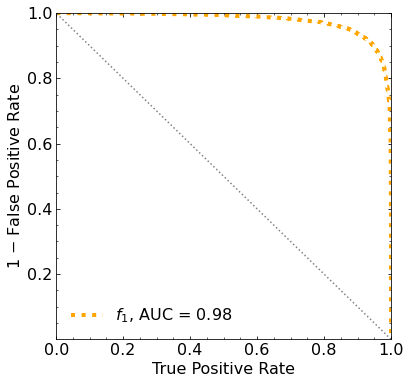

Classification score:


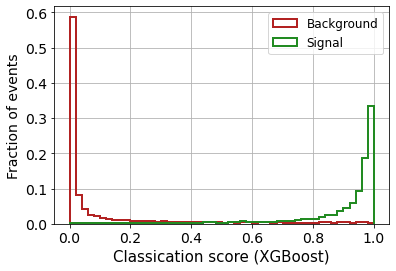


 ROC-AUC =  0.9771006021896925


In [22]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg)

In [23]:
np.savetxt('rocs/roc_3featsv1.txt', [tpr_mon_xg, fpr_mon_xg])

print('\n ROC-AUC = ', roc_auc_xg)


 ROC-AUC =  0.9771006021896925


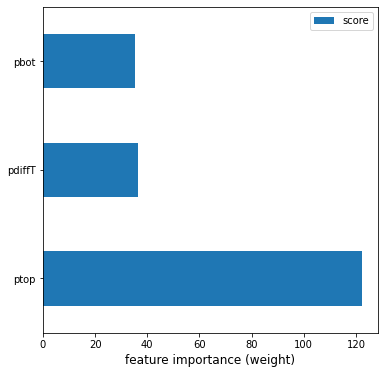

In [15]:
feature_important = classifier.get_booster().get_score(importance_type='gain')
# keys = list(feature_important.keys())
keys = ['pbot', 'ptop', 'pdiffT']
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(40, columns="score").plot(kind='barh', figsize = (6,6)) ## plot top 40 features
plt.xlabel('feature importance (weight)', fontsize = 12)
plt.show()

## 5. Keep the 3 features (pA_s1, pA_s2, diffT) (re-load the variables first)

##### Remove some columns or features (if you want)

In [24]:
# features = ['pT0','pA','pH','pHT','pL','pL90','pRMSW','pHTL']
remove_col_S1 = [0,2,3,4,5,6,7]
remove_col_S2 = [0,2,3,4,5,6,7]

B_pbot = B_pbot
B_ptop = B_ptop
B_ppeakS1 = np.delete(B_ppeakS1, remove_col_S1, axis=1)
B_ppeakS2 = np.delete(B_ppeakS2, remove_col_S2, axis=1)

print('B_pbot.shape: ', B_pbot.shape)
print('B_ptop.shape: ', B_ptop.shape)
print('B_ppeakS1.shape :', B_ppeakS1.shape)
print('B_ppeakS2.shape: ', B_ppeakS2.shape)


S_pbot = S_pbot
S_ptop = S_ptop
S_ppeakS1 = np.delete(S_ppeakS1, remove_col_S1, axis=1)
S_ppeakS2 = np.delete(S_ppeakS2, remove_col_S2, axis=1)

print('S_pbot.shape: ', S_pbot.shape)
print('S_ptop.shape: ', S_ptop.shape)
print('S_ppeakS1.shape :', S_ppeakS1.shape)
print('S_ppeakS2.shape: ', S_ppeakS2.shape)

B_pbot.shape:  (32015,)
B_ptop.shape:  (32015,)
B_ppeakS1.shape : (32015, 1)
B_ppeakS2.shape:  (32015, 1)
S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 1)
S_ppeakS2.shape:  (32015, 1)


In [25]:
# concatenate the data
X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

X_mon_B.shape:  (32015, 3)
X_mon_S.shape:  (32015, 3)
X_mon.shape:  (64030, 3)

X_mon_train :  (40818, 3)
y_mon_train :  (40818,)
X_mon_val :  (7204, 3)
y_mon_val :  (7204,)
X_mon_test :  (16008, 3)
y_mon_test :  (16008,)



### XGBoost

[0]	validation_0-logloss:0.68667	validation_1-logloss:0.68669
[1]	validation_0-logloss:0.68036	validation_1-logloss:0.68042
[2]	validation_0-logloss:0.67413	validation_1-logloss:0.67420


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[3]	validation_0-logloss:0.66805	validation_1-logloss:0.66816
[4]	validation_0-logloss:0.66205	validation_1-logloss:0.66217
[5]	validation_0-logloss:0.65622	validation_1-logloss:0.65636
[6]	validation_0-logloss:0.65043	validation_1-logloss:0.65061
[7]	validation_0-logloss:0.64481	validation_1-logloss:0.64502
[8]	validation_0-logloss:0.63919	validation_1-logloss:0.63941
[9]	validation_0-logloss:0.63375	validation_1-logloss:0.63400
[10]	validation_0-logloss:0.62832	validation_1-logloss:0.62859
[11]	validation_0-logloss:0.62308	validation_1-logloss:0.62339
[12]	validation_0-logloss:0.61784	validation_1-logloss:0.61814
[13]	validation_0-logloss:0.61279	validation_1-logloss:0.61312
[14]	validation_0-logloss:0.60767	validation_1-logloss:0.60805
[15]	validation_0-logloss:0.60276	validation_1-logloss:0.60318
[16]	validation_0-logloss:0.59786	validation_1-logloss:0.59828
[17]	validation_0-logloss:0.59298	validation_1-logloss:0.59346
[18]	validation_0-logloss:0.58836	validation_1-logloss:0.58886

[133]	validation_0-logloss:0.31245	validation_1-logloss:0.31603
[134]	validation_0-logloss:0.31130	validation_1-logloss:0.31493
[135]	validation_0-logloss:0.31009	validation_1-logloss:0.31376
[136]	validation_0-logloss:0.30896	validation_1-logloss:0.31266
[137]	validation_0-logloss:0.30788	validation_1-logloss:0.31162
[138]	validation_0-logloss:0.30671	validation_1-logloss:0.31046
[139]	validation_0-logloss:0.30559	validation_1-logloss:0.30942
[140]	validation_0-logloss:0.30444	validation_1-logloss:0.30831
[141]	validation_0-logloss:0.30329	validation_1-logloss:0.30720
[142]	validation_0-logloss:0.30217	validation_1-logloss:0.30610
[143]	validation_0-logloss:0.30108	validation_1-logloss:0.30498
[144]	validation_0-logloss:0.30000	validation_1-logloss:0.30394
[145]	validation_0-logloss:0.29900	validation_1-logloss:0.30300
[146]	validation_0-logloss:0.29794	validation_1-logloss:0.30196
[147]	validation_0-logloss:0.29686	validation_1-logloss:0.30093
[148]	validation_0-logloss:0.29580	valid

[262]	validation_0-logloss:0.22205	validation_1-logloss:0.23053
[263]	validation_0-logloss:0.22165	validation_1-logloss:0.23017
[264]	validation_0-logloss:0.22126	validation_1-logloss:0.22985
[265]	validation_0-logloss:0.22089	validation_1-logloss:0.22949
[266]	validation_0-logloss:0.22055	validation_1-logloss:0.22917
[267]	validation_0-logloss:0.22014	validation_1-logloss:0.22880
[268]	validation_0-logloss:0.21976	validation_1-logloss:0.22839
[269]	validation_0-logloss:0.21937	validation_1-logloss:0.22804
[270]	validation_0-logloss:0.21903	validation_1-logloss:0.22773
[271]	validation_0-logloss:0.21867	validation_1-logloss:0.22738
[272]	validation_0-logloss:0.21833	validation_1-logloss:0.22709
[273]	validation_0-logloss:0.21797	validation_1-logloss:0.22675
[274]	validation_0-logloss:0.21759	validation_1-logloss:0.22640
[275]	validation_0-logloss:0.21719	validation_1-logloss:0.22604
[276]	validation_0-logloss:0.21688	validation_1-logloss:0.22575
[277]	validation_0-logloss:0.21653	valid

[391]	validation_0-logloss:0.18928	validation_1-logloss:0.20177
[392]	validation_0-logloss:0.18910	validation_1-logloss:0.20161
[393]	validation_0-logloss:0.18898	validation_1-logloss:0.20151
[394]	validation_0-logloss:0.18880	validation_1-logloss:0.20138
[395]	validation_0-logloss:0.18863	validation_1-logloss:0.20124
[396]	validation_0-logloss:0.18846	validation_1-logloss:0.20109
[397]	validation_0-logloss:0.18828	validation_1-logloss:0.20097
[398]	validation_0-logloss:0.18812	validation_1-logloss:0.20085
[399]	validation_0-logloss:0.18794	validation_1-logloss:0.20067
[400]	validation_0-logloss:0.18782	validation_1-logloss:0.20056
[401]	validation_0-logloss:0.18765	validation_1-logloss:0.20042
[402]	validation_0-logloss:0.18751	validation_1-logloss:0.20030
[403]	validation_0-logloss:0.18736	validation_1-logloss:0.20017
[404]	validation_0-logloss:0.18718	validation_1-logloss:0.20003
[405]	validation_0-logloss:0.18700	validation_1-logloss:0.19989
[406]	validation_0-logloss:0.18685	valid

[648]	validation_0-logloss:0.16520	validation_1-logloss:0.18333
[649]	validation_0-logloss:0.16515	validation_1-logloss:0.18330
[650]	validation_0-logloss:0.16509	validation_1-logloss:0.18327
[651]	validation_0-logloss:0.16504	validation_1-logloss:0.18324
[652]	validation_0-logloss:0.16498	validation_1-logloss:0.18319
[653]	validation_0-logloss:0.16493	validation_1-logloss:0.18316
[654]	validation_0-logloss:0.16488	validation_1-logloss:0.18314
[655]	validation_0-logloss:0.16483	validation_1-logloss:0.18311
[656]	validation_0-logloss:0.16478	validation_1-logloss:0.18308
[657]	validation_0-logloss:0.16473	validation_1-logloss:0.18305
[658]	validation_0-logloss:0.16468	validation_1-logloss:0.18301
[659]	validation_0-logloss:0.16463	validation_1-logloss:0.18298
[660]	validation_0-logloss:0.16458	validation_1-logloss:0.18295
[661]	validation_0-logloss:0.16453	validation_1-logloss:0.18292
[662]	validation_0-logloss:0.16447	validation_1-logloss:0.18289
[663]	validation_0-logloss:0.16442	valid

[777]	validation_0-logloss:0.15993	validation_1-logloss:0.18007
[778]	validation_0-logloss:0.15989	validation_1-logloss:0.18005
[779]	validation_0-logloss:0.15986	validation_1-logloss:0.18003
[780]	validation_0-logloss:0.15981	validation_1-logloss:0.18002
[781]	validation_0-logloss:0.15978	validation_1-logloss:0.18000
[782]	validation_0-logloss:0.15976	validation_1-logloss:0.17999
[783]	validation_0-logloss:0.15973	validation_1-logloss:0.17996
[784]	validation_0-logloss:0.15970	validation_1-logloss:0.17994
[785]	validation_0-logloss:0.15967	validation_1-logloss:0.17992
[786]	validation_0-logloss:0.15965	validation_1-logloss:0.17991
[787]	validation_0-logloss:0.15962	validation_1-logloss:0.17988
[788]	validation_0-logloss:0.15959	validation_1-logloss:0.17987
[789]	validation_0-logloss:0.15955	validation_1-logloss:0.17985
[790]	validation_0-logloss:0.15951	validation_1-logloss:0.17983
[791]	validation_0-logloss:0.15948	validation_1-logloss:0.17981
[792]	validation_0-logloss:0.15945	valid

[906]	validation_0-logloss:0.15647	validation_1-logloss:0.17839
[907]	validation_0-logloss:0.15645	validation_1-logloss:0.17838
[908]	validation_0-logloss:0.15642	validation_1-logloss:0.17838
[909]	validation_0-logloss:0.15641	validation_1-logloss:0.17836
[910]	validation_0-logloss:0.15639	validation_1-logloss:0.17836
[911]	validation_0-logloss:0.15637	validation_1-logloss:0.17834
[912]	validation_0-logloss:0.15634	validation_1-logloss:0.17833
[913]	validation_0-logloss:0.15632	validation_1-logloss:0.17833
[914]	validation_0-logloss:0.15630	validation_1-logloss:0.17832
[915]	validation_0-logloss:0.15628	validation_1-logloss:0.17831
[916]	validation_0-logloss:0.15627	validation_1-logloss:0.17830
[917]	validation_0-logloss:0.15625	validation_1-logloss:0.17828
[918]	validation_0-logloss:0.15623	validation_1-logloss:0.17828
[919]	validation_0-logloss:0.15621	validation_1-logloss:0.17827
[920]	validation_0-logloss:0.15618	validation_1-logloss:0.17826
[921]	validation_0-logloss:0.15616	valid

[1034]	validation_0-logloss:0.15397	validation_1-logloss:0.17766
[1035]	validation_0-logloss:0.15396	validation_1-logloss:0.17765
[1036]	validation_0-logloss:0.15393	validation_1-logloss:0.17764
[1037]	validation_0-logloss:0.15391	validation_1-logloss:0.17764
[1038]	validation_0-logloss:0.15388	validation_1-logloss:0.17763
[1039]	validation_0-logloss:0.15386	validation_1-logloss:0.17763
[1040]	validation_0-logloss:0.15385	validation_1-logloss:0.17762
[1041]	validation_0-logloss:0.15384	validation_1-logloss:0.17762
[1042]	validation_0-logloss:0.15381	validation_1-logloss:0.17762
[1043]	validation_0-logloss:0.15380	validation_1-logloss:0.17762
[1044]	validation_0-logloss:0.15379	validation_1-logloss:0.17762
[1045]	validation_0-logloss:0.15377	validation_1-logloss:0.17761
[1046]	validation_0-logloss:0.15375	validation_1-logloss:0.17760
[1047]	validation_0-logloss:0.15374	validation_1-logloss:0.17760
[1048]	validation_0-logloss:0.15372	validation_1-logloss:0.17759
[1049]	validation_0-loglo

[1161]	validation_0-logloss:0.15198	validation_1-logloss:0.17731
[1162]	validation_0-logloss:0.15196	validation_1-logloss:0.17730
[1163]	validation_0-logloss:0.15195	validation_1-logloss:0.17730
[1164]	validation_0-logloss:0.15194	validation_1-logloss:0.17730
[1165]	validation_0-logloss:0.15192	validation_1-logloss:0.17729
[1166]	validation_0-logloss:0.15191	validation_1-logloss:0.17730
[1167]	validation_0-logloss:0.15189	validation_1-logloss:0.17730
[1168]	validation_0-logloss:0.15187	validation_1-logloss:0.17730
[1169]	validation_0-logloss:0.15186	validation_1-logloss:0.17731
[1170]	validation_0-logloss:0.15185	validation_1-logloss:0.17730
[1171]	validation_0-logloss:0.15183	validation_1-logloss:0.17730
[1172]	validation_0-logloss:0.15183	validation_1-logloss:0.17731
[1173]	validation_0-logloss:0.15182	validation_1-logloss:0.17730
[1174]	validation_0-logloss:0.15180	validation_1-logloss:0.17729
[1175]	validation_0-logloss:0.15179	validation_1-logloss:0.17730
[1176]	validation_0-loglo

[1288]	validation_0-logloss:0.15018	validation_1-logloss:0.17710
[1289]	validation_0-logloss:0.15017	validation_1-logloss:0.17709
[1290]	validation_0-logloss:0.15016	validation_1-logloss:0.17710
[1291]	validation_0-logloss:0.15014	validation_1-logloss:0.17710
[1292]	validation_0-logloss:0.15013	validation_1-logloss:0.17710
[1293]	validation_0-logloss:0.15011	validation_1-logloss:0.17710
[1294]	validation_0-logloss:0.15010	validation_1-logloss:0.17710
[1295]	validation_0-logloss:0.15009	validation_1-logloss:0.17710
[1296]	validation_0-logloss:0.15008	validation_1-logloss:0.17710
[1297]	validation_0-logloss:0.15007	validation_1-logloss:0.17710
[1298]	validation_0-logloss:0.15005	validation_1-logloss:0.17710
[1299]	validation_0-logloss:0.15004	validation_1-logloss:0.17709
[1300]	validation_0-logloss:0.15003	validation_1-logloss:0.17709
[1301]	validation_0-logloss:0.15002	validation_1-logloss:0.17709
[1302]	validation_0-logloss:0.15000	validation_1-logloss:0.17709
[1303]	validation_0-loglo

[1415]	validation_0-logloss:0.14862	validation_1-logloss:0.17692
[1416]	validation_0-logloss:0.14860	validation_1-logloss:0.17692
[1417]	validation_0-logloss:0.14859	validation_1-logloss:0.17692
[1418]	validation_0-logloss:0.14858	validation_1-logloss:0.17693
[1419]	validation_0-logloss:0.14856	validation_1-logloss:0.17693
[1420]	validation_0-logloss:0.14855	validation_1-logloss:0.17694
[1421]	validation_0-logloss:0.14854	validation_1-logloss:0.17693
[1422]	validation_0-logloss:0.14852	validation_1-logloss:0.17693
[1423]	validation_0-logloss:0.14851	validation_1-logloss:0.17692
[1424]	validation_0-logloss:0.14850	validation_1-logloss:0.17691
[1425]	validation_0-logloss:0.14848	validation_1-logloss:0.17691
[1426]	validation_0-logloss:0.14847	validation_1-logloss:0.17690
[1427]	validation_0-logloss:0.14847	validation_1-logloss:0.17690
[1428]	validation_0-logloss:0.14845	validation_1-logloss:0.17690
[1429]	validation_0-logloss:0.14844	validation_1-logloss:0.17690
[1430]	validation_0-loglo

[1542]	validation_0-logloss:0.14717	validation_1-logloss:0.17683
[1543]	validation_0-logloss:0.14716	validation_1-logloss:0.17683
[1544]	validation_0-logloss:0.14715	validation_1-logloss:0.17683
[1545]	validation_0-logloss:0.14714	validation_1-logloss:0.17682
[1546]	validation_0-logloss:0.14713	validation_1-logloss:0.17682
[1547]	validation_0-logloss:0.14712	validation_1-logloss:0.17682
[1548]	validation_0-logloss:0.14711	validation_1-logloss:0.17681
[1549]	validation_0-logloss:0.14710	validation_1-logloss:0.17681
[1550]	validation_0-logloss:0.14708	validation_1-logloss:0.17682
[1551]	validation_0-logloss:0.14707	validation_1-logloss:0.17681
[1552]	validation_0-logloss:0.14706	validation_1-logloss:0.17681
[1553]	validation_0-logloss:0.14704	validation_1-logloss:0.17681
[1554]	validation_0-logloss:0.14704	validation_1-logloss:0.17682
[1555]	validation_0-logloss:0.14702	validation_1-logloss:0.17681
[1556]	validation_0-logloss:0.14701	validation_1-logloss:0.17682
[1557]	validation_0-loglo

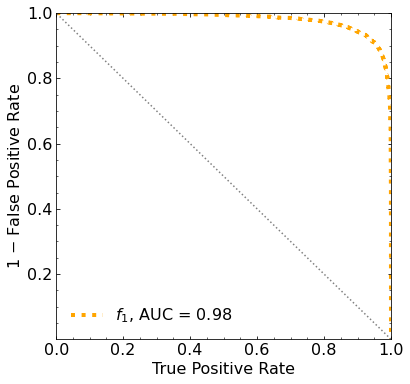

Classification score:


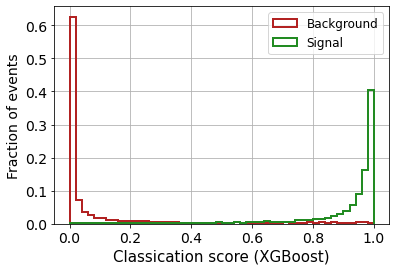


 ROC-AUC =  0.9798427091381934


In [26]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg)

In [27]:
np.savetxt('rocs/roc_3featsv2.txt', [tpr_mon_xg, fpr_mon_xg])

print('\n ROC-AUC = ', roc_auc_xg)


 ROC-AUC =  0.9798427091381934


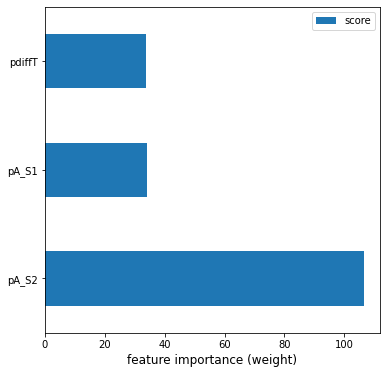

In [20]:
feature_important = classifier.get_booster().get_score(importance_type='gain')
# keys = list(feature_important.keys())
keys = ['pA_S1', 'pA_S2', 'pdiffT']
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(40, columns="score").plot(kind='barh', figsize = (6,6)) ## plot top 40 features
plt.xlabel('feature importance (weight)', fontsize = 12)
plt.show()

In [64]:
# features = ['pT0','pA','pH','pHT','pL','pL90','pRMSW','pHTL']

# concatenate the data
# X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
# X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)
X_mon_B = np.concatenate([B_ppeakS1[:,1:2], B_ppeakS2[:,1:2] ],axis=1)
X_mon_S = np.concatenate([S_ppeakS1[:,1:2], S_ppeakS2[:,1:2] ],axis=1)

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

X_mon_B.shape:  (32015, 2)
X_mon_S.shape:  (32015, 2)
X_mon.shape:  (64030, 2)

X_mon_train :  (40818, 2)
y_mon_train :  (40818,)
X_mon_val :  (7204, 2)
y_mon_val :  (7204,)
X_mon_test :  (16008, 2)
y_mon_test :  (16008,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68801	validation_1-logloss:0.68793
[1]	validation_0-logloss:0.68299	validation_1-logloss:0.68281
[2]	validation_0-logloss:0.67806	validation_1-logloss:0.67780
[3]	validation_0-logloss:0.67322	validation_1-logloss:0.67288
[4]	validation_0-logloss:0.66848	validation_1-logloss:0.66806
[5]	validation_0-logloss:0.66384	validation_1-logloss:0.66335
[6]	validation_0-logloss:0.65928	validation_1-logloss:0.65871
[7]	validation_0-logloss:0.65480	validation_1-logloss:0.65415
[8]	validation_0-logloss:0.65042	validation_1-logloss:0.64968
[9]	validation_0-logloss:0.64612	validation_1-logloss:0.64532
[10]	validation_0-logloss:0.64188	validation_1-logloss:0.64101
[11]	validation_0-logloss:0.63772	validation_1-logloss:0.63677
[12]	validation_0-logloss:0.63364	validation_1-logloss:0.63261
[13]	validation_0-logloss:0.62964	validation_1-logloss:0.62855
[14]	validation_0-logloss:0.62569	validation_1-logloss:0.62454
[15]	validation_0-logloss:0.62181	validation_1-logloss:0.62060
[1

[130]	validation_0-logloss:0.41881	validation_1-logloss:0.41523
[131]	validation_0-logloss:0.41812	validation_1-logloss:0.41454
[132]	validation_0-logloss:0.41744	validation_1-logloss:0.41387
[133]	validation_0-logloss:0.41678	validation_1-logloss:0.41321
[134]	validation_0-logloss:0.41612	validation_1-logloss:0.41256
[135]	validation_0-logloss:0.41547	validation_1-logloss:0.41192
[136]	validation_0-logloss:0.41483	validation_1-logloss:0.41129
[137]	validation_0-logloss:0.41419	validation_1-logloss:0.41066
[138]	validation_0-logloss:0.41355	validation_1-logloss:0.41003
[139]	validation_0-logloss:0.41294	validation_1-logloss:0.40942
[140]	validation_0-logloss:0.41232	validation_1-logloss:0.40882
[141]	validation_0-logloss:0.41171	validation_1-logloss:0.40822
[142]	validation_0-logloss:0.41111	validation_1-logloss:0.40764
[143]	validation_0-logloss:0.41052	validation_1-logloss:0.40706
[144]	validation_0-logloss:0.40993	validation_1-logloss:0.40649
[145]	validation_0-logloss:0.40934	valid

[259]	validation_0-logloss:0.37404	validation_1-logloss:0.37248
[260]	validation_0-logloss:0.37389	validation_1-logloss:0.37235
[261]	validation_0-logloss:0.37375	validation_1-logloss:0.37222
[262]	validation_0-logloss:0.37361	validation_1-logloss:0.37209
[263]	validation_0-logloss:0.37347	validation_1-logloss:0.37197
[264]	validation_0-logloss:0.37334	validation_1-logloss:0.37185
[265]	validation_0-logloss:0.37320	validation_1-logloss:0.37173
[266]	validation_0-logloss:0.37306	validation_1-logloss:0.37162
[267]	validation_0-logloss:0.37293	validation_1-logloss:0.37150
[268]	validation_0-logloss:0.37279	validation_1-logloss:0.37139
[269]	validation_0-logloss:0.37266	validation_1-logloss:0.37128
[270]	validation_0-logloss:0.37253	validation_1-logloss:0.37117
[271]	validation_0-logloss:0.37240	validation_1-logloss:0.37106
[272]	validation_0-logloss:0.37227	validation_1-logloss:0.37096
[273]	validation_0-logloss:0.37215	validation_1-logloss:0.37085
[274]	validation_0-logloss:0.37201	valid

[388]	validation_0-logloss:0.36399	validation_1-logloss:0.36488
[389]	validation_0-logloss:0.36395	validation_1-logloss:0.36486
[390]	validation_0-logloss:0.36392	validation_1-logloss:0.36484
[391]	validation_0-logloss:0.36388	validation_1-logloss:0.36483
[392]	validation_0-logloss:0.36384	validation_1-logloss:0.36480
[393]	validation_0-logloss:0.36381	validation_1-logloss:0.36479
[394]	validation_0-logloss:0.36377	validation_1-logloss:0.36477
[395]	validation_0-logloss:0.36374	validation_1-logloss:0.36476
[396]	validation_0-logloss:0.36370	validation_1-logloss:0.36474
[397]	validation_0-logloss:0.36367	validation_1-logloss:0.36472
[398]	validation_0-logloss:0.36364	validation_1-logloss:0.36470
[399]	validation_0-logloss:0.36360	validation_1-logloss:0.36468
[400]	validation_0-logloss:0.36357	validation_1-logloss:0.36466
[401]	validation_0-logloss:0.36354	validation_1-logloss:0.36465
[402]	validation_0-logloss:0.36350	validation_1-logloss:0.36464
[403]	validation_0-logloss:0.36347	valid

[517]	validation_0-logloss:0.36087	validation_1-logloss:0.36381
[518]	validation_0-logloss:0.36085	validation_1-logloss:0.36381
[519]	validation_0-logloss:0.36083	validation_1-logloss:0.36380
[520]	validation_0-logloss:0.36082	validation_1-logloss:0.36380
[521]	validation_0-logloss:0.36080	validation_1-logloss:0.36380
[522]	validation_0-logloss:0.36078	validation_1-logloss:0.36379
[523]	validation_0-logloss:0.36076	validation_1-logloss:0.36379
[524]	validation_0-logloss:0.36075	validation_1-logloss:0.36378
[525]	validation_0-logloss:0.36073	validation_1-logloss:0.36379
[526]	validation_0-logloss:0.36071	validation_1-logloss:0.36378
[527]	validation_0-logloss:0.36070	validation_1-logloss:0.36377
[528]	validation_0-logloss:0.36068	validation_1-logloss:0.36378
[529]	validation_0-logloss:0.36067	validation_1-logloss:0.36377
[530]	validation_0-logloss:0.36065	validation_1-logloss:0.36376
[531]	validation_0-logloss:0.36063	validation_1-logloss:0.36376
[532]	validation_0-logloss:0.36062	valid

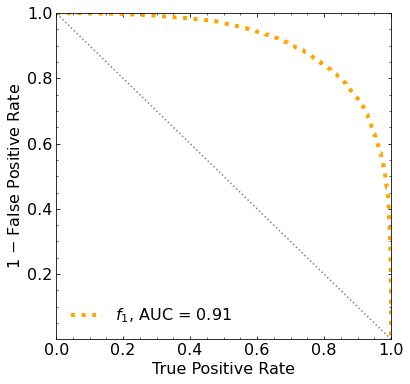

Classification score:


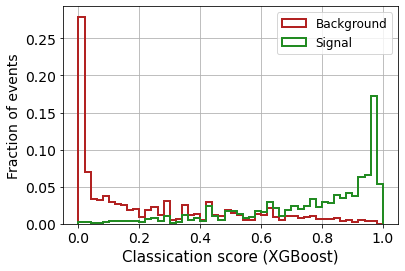


 ROC-AUC =  0.9115822924700632


In [65]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg_2 = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg_2,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg_2)

In [66]:
print('\n ROC-AUC = ', roc_auc_xg_2)
print('\n ROC-AUC + dt = ', 0.9798427091381934)


 ROC-AUC =  0.9115822924700632

 ROC-AUC + dt =  0.9798427091381934


### 2 fetures fr dt

## 6. Keep the 2 features (pA_s1, diffT) (re-load the variables first)

In [36]:
# features = ['pT0','pA','pH','pHT','pL','pL90','pRMSW','pHTL']

# concatenate the data
# X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
# X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)
X_mon_B = np.concatenate([B_ppeakS1[:,1:2], np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
X_mon_S = np.concatenate([S_ppeakS1[:,1:2], np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

X_mon_B.shape:  (32015, 2)
X_mon_S.shape:  (32015, 2)
X_mon.shape:  (64030, 2)

X_mon_train :  (40818, 2)
y_mon_train :  (40818,)
X_mon_val :  (7204, 2)
y_mon_val :  (7204,)
X_mon_test :  (16008, 2)
y_mon_test :  (16008,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.69151	validation_1-logloss:0.69148
[1]	validation_0-logloss:0.68991	validation_1-logloss:0.68985
[2]	validation_0-logloss:0.68834	validation_1-logloss:0.68824
[3]	validation_0-logloss:0.68680	validation_1-logloss:0.68666
[4]	validation_0-logloss:0.68529	validation_1-logloss:0.68513
[5]	validation_0-logloss:0.68381	validation_1-logloss:0.68361
[6]	validation_0-logloss:0.68235	validation_1-logloss:0.68213
[7]	validation_0-logloss:0.68093	validation_1-logloss:0.68068
[8]	validation_0-logloss:0.67954	validation_1-logloss:0.67925
[9]	validation_0-logloss:0.67817	validation_1-logloss:0.67785
[10]	validation_0-logloss:0.67683	validation_1-logloss:0.67649
[11]	validation_0-logloss:0.67552	validation_1-logloss:0.67514
[12]	validation_0-logloss:0.67422	validation_1-logloss:0.67382
[13]	validation_0-logloss:0.67295	validation_1-logloss:0.67252
[14]	validation_0-logloss:0.67171	validation_1-logloss:0.67126
[15]	validation_0-logloss:0.67049	validation_1-logloss:0.67003
[1

[130]	validation_0-logloss:0.61121	validation_1-logloss:0.61030
[131]	validation_0-logloss:0.61103	validation_1-logloss:0.61015
[132]	validation_0-logloss:0.61087	validation_1-logloss:0.60999
[133]	validation_0-logloss:0.61069	validation_1-logloss:0.60982
[134]	validation_0-logloss:0.61053	validation_1-logloss:0.60967
[135]	validation_0-logloss:0.61037	validation_1-logloss:0.60952
[136]	validation_0-logloss:0.61021	validation_1-logloss:0.60938
[137]	validation_0-logloss:0.61006	validation_1-logloss:0.60925
[138]	validation_0-logloss:0.60991	validation_1-logloss:0.60910
[139]	validation_0-logloss:0.60975	validation_1-logloss:0.60896
[140]	validation_0-logloss:0.60960	validation_1-logloss:0.60883
[141]	validation_0-logloss:0.60946	validation_1-logloss:0.60869
[142]	validation_0-logloss:0.60930	validation_1-logloss:0.60855
[143]	validation_0-logloss:0.60916	validation_1-logloss:0.60842
[144]	validation_0-logloss:0.60901	validation_1-logloss:0.60828
[145]	validation_0-logloss:0.60887	valid

[259]	validation_0-logloss:0.60063	validation_1-logloss:0.60168
[260]	validation_0-logloss:0.60059	validation_1-logloss:0.60166
[261]	validation_0-logloss:0.60055	validation_1-logloss:0.60164
[262]	validation_0-logloss:0.60052	validation_1-logloss:0.60162
[263]	validation_0-logloss:0.60048	validation_1-logloss:0.60160
[264]	validation_0-logloss:0.60044	validation_1-logloss:0.60158
[265]	validation_0-logloss:0.60040	validation_1-logloss:0.60157
[266]	validation_0-logloss:0.60037	validation_1-logloss:0.60154
[267]	validation_0-logloss:0.60034	validation_1-logloss:0.60152
[268]	validation_0-logloss:0.60029	validation_1-logloss:0.60150
[269]	validation_0-logloss:0.60026	validation_1-logloss:0.60148
[270]	validation_0-logloss:0.60023	validation_1-logloss:0.60147
[271]	validation_0-logloss:0.60019	validation_1-logloss:0.60144
[272]	validation_0-logloss:0.60015	validation_1-logloss:0.60143
[273]	validation_0-logloss:0.60011	validation_1-logloss:0.60141
[274]	validation_0-logloss:0.60007	valid

[388]	validation_0-logloss:0.59746	validation_1-logloss:0.60070
[389]	validation_0-logloss:0.59745	validation_1-logloss:0.60069
[390]	validation_0-logloss:0.59742	validation_1-logloss:0.60069
[391]	validation_0-logloss:0.59741	validation_1-logloss:0.60069
[392]	validation_0-logloss:0.59739	validation_1-logloss:0.60069
[393]	validation_0-logloss:0.59738	validation_1-logloss:0.60068
[394]	validation_0-logloss:0.59737	validation_1-logloss:0.60069
[395]	validation_0-logloss:0.59734	validation_1-logloss:0.60069
[396]	validation_0-logloss:0.59733	validation_1-logloss:0.60068
[397]	validation_0-logloss:0.59731	validation_1-logloss:0.60068
[398]	validation_0-logloss:0.59730	validation_1-logloss:0.60068
[399]	validation_0-logloss:0.59728	validation_1-logloss:0.60068
[400]	validation_0-logloss:0.59727	validation_1-logloss:0.60068
[401]	validation_0-logloss:0.59725	validation_1-logloss:0.60068
[402]	validation_0-logloss:0.59723	validation_1-logloss:0.60066
[403]	validation_0-logloss:0.59722	valid

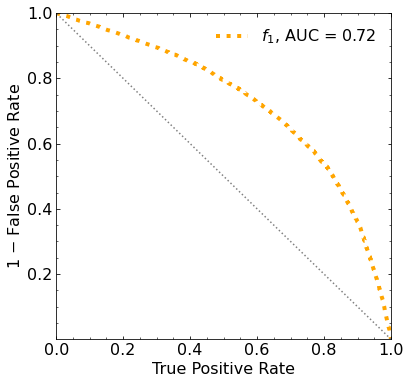

Classification score:


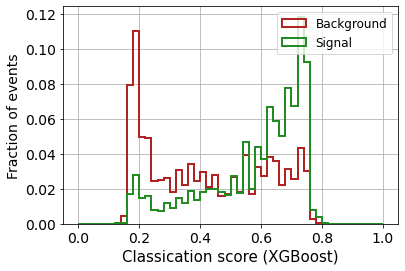


 ROC-AUC =  0.7249222046309145


In [14]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg)

In [15]:

print('\n ROC-AUC = ', roc_auc_xg)


 ROC-AUC =  0.7249222046309145


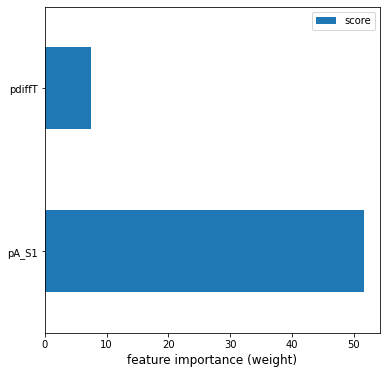

In [17]:
feature_important = classifier.get_booster().get_score(importance_type='gain')
# keys = list(feature_important.keys())
keys = ['pA_S1', 'pdiffT']
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(40, columns="score").plot(kind='barh', figsize = (6,6)) ## plot top 40 features
plt.xlabel('feature importance (weight)', fontsize = 12)
plt.show()

In [33]:
# features = ['pT0','pA','pH','pHT','pL','pL90','pRMSW','pHTL']

# concatenate the data
# X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
# X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)
X_mon_B = np.concatenate([B_ppeakS1[:,1:2] ],axis=1)
X_mon_S = np.concatenate([S_ppeakS1[:,1:2] ],axis=1)

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

X_mon_B.shape:  (32015, 1)
X_mon_S.shape:  (32015, 1)
X_mon.shape:  (64030, 1)

X_mon_train :  (40818, 1)
y_mon_train :  (40818,)
X_mon_val :  (7204, 1)
y_mon_val :  (7204,)
X_mon_test :  (16008, 1)
y_mon_test :  (16008,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.69159	validation_1-logloss:0.69155
[1]	validation_0-logloss:0.69006	validation_1-logloss:0.68999
[2]	validation_0-logloss:0.68855	validation_1-logloss:0.68846
[3]	validation_0-logloss:0.68709	validation_1-logloss:0.68696
[4]	validation_0-logloss:0.68565	validation_1-logloss:0.68549
[5]	validation_0-logloss:0.68423	validation_1-logloss:0.68404
[6]	validation_0-logloss:0.68285	validation_1-logloss:0.68263
[7]	validation_0-logloss:0.68148	validation_1-logloss:0.68124
[8]	validation_0-logloss:0.68016	validation_1-logloss:0.67988
[9]	validation_0-logloss:0.67885	validation_1-logloss:0.67854
[10]	validation_0-logloss:0.67757	validation_1-logloss:0.67723
[11]	validation_0-logloss:0.67631	validation_1-logloss:0.67594
[12]	validation_0-logloss:0.67508	validation_1-logloss:0.67468
[13]	validation_0-logloss:0.67387	validation_1-logloss:0.67345
[14]	validation_0-logloss:0.67268	validation_1-logloss:0.67224
[15]	validation_0-logloss:0.67152	validation_1-logloss:0.67105
[1

[130]	validation_0-logloss:0.61652	validation_1-logloss:0.61480
[131]	validation_0-logloss:0.61638	validation_1-logloss:0.61466
[132]	validation_0-logloss:0.61623	validation_1-logloss:0.61452
[133]	validation_0-logloss:0.61610	validation_1-logloss:0.61439
[134]	validation_0-logloss:0.61595	validation_1-logloss:0.61425
[135]	validation_0-logloss:0.61582	validation_1-logloss:0.61412
[136]	validation_0-logloss:0.61568	validation_1-logloss:0.61399
[137]	validation_0-logloss:0.61555	validation_1-logloss:0.61386
[138]	validation_0-logloss:0.61541	validation_1-logloss:0.61373
[139]	validation_0-logloss:0.61528	validation_1-logloss:0.61360
[140]	validation_0-logloss:0.61516	validation_1-logloss:0.61348
[141]	validation_0-logloss:0.61503	validation_1-logloss:0.61336
[142]	validation_0-logloss:0.61491	validation_1-logloss:0.61323
[143]	validation_0-logloss:0.61479	validation_1-logloss:0.61312
[144]	validation_0-logloss:0.61468	validation_1-logloss:0.61301
[145]	validation_0-logloss:0.61456	valid

[259]	validation_0-logloss:0.60813	validation_1-logloss:0.60737
[260]	validation_0-logloss:0.60810	validation_1-logloss:0.60735
[261]	validation_0-logloss:0.60808	validation_1-logloss:0.60733
[262]	validation_0-logloss:0.60806	validation_1-logloss:0.60732
[263]	validation_0-logloss:0.60804	validation_1-logloss:0.60731
[264]	validation_0-logloss:0.60801	validation_1-logloss:0.60729
[265]	validation_0-logloss:0.60799	validation_1-logloss:0.60728
[266]	validation_0-logloss:0.60796	validation_1-logloss:0.60726
[267]	validation_0-logloss:0.60793	validation_1-logloss:0.60725
[268]	validation_0-logloss:0.60791	validation_1-logloss:0.60724
[269]	validation_0-logloss:0.60789	validation_1-logloss:0.60723
[270]	validation_0-logloss:0.60787	validation_1-logloss:0.60721
[271]	validation_0-logloss:0.60785	validation_1-logloss:0.60720
[272]	validation_0-logloss:0.60782	validation_1-logloss:0.60719
[273]	validation_0-logloss:0.60780	validation_1-logloss:0.60717
[274]	validation_0-logloss:0.60776	valid

[388]	validation_0-logloss:0.60607	validation_1-logloss:0.60655
[389]	validation_0-logloss:0.60606	validation_1-logloss:0.60655
[390]	validation_0-logloss:0.60605	validation_1-logloss:0.60655
[391]	validation_0-logloss:0.60604	validation_1-logloss:0.60655
[392]	validation_0-logloss:0.60602	validation_1-logloss:0.60655
[393]	validation_0-logloss:0.60601	validation_1-logloss:0.60655
[394]	validation_0-logloss:0.60599	validation_1-logloss:0.60655
[395]	validation_0-logloss:0.60598	validation_1-logloss:0.60656
[396]	validation_0-logloss:0.60597	validation_1-logloss:0.60656
[397]	validation_0-logloss:0.60595	validation_1-logloss:0.60656
[398]	validation_0-logloss:0.60594	validation_1-logloss:0.60656
[399]	validation_0-logloss:0.60593	validation_1-logloss:0.60656
[400]	validation_0-logloss:0.60591	validation_1-logloss:0.60656
[401]	validation_0-logloss:0.60589	validation_1-logloss:0.60656
[402]	validation_0-logloss:0.60589	validation_1-logloss:0.60656
[403]	validation_0-logloss:0.60587	valid

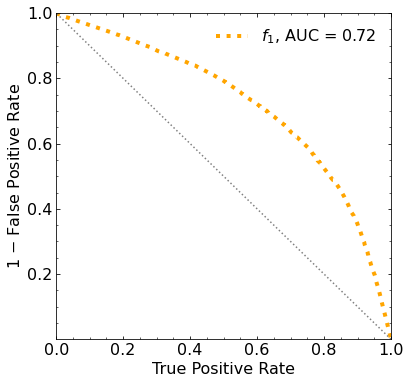

Classification score:


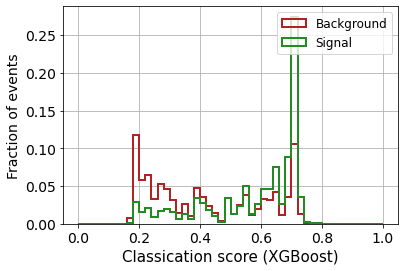


 ROC-AUC =  0.7184247929134363


In [34]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg_1 = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg_1,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg_1)

In [35]:
print('\n ROC-AUC = ', roc_auc_xg_1)
print('\n ROC-AUC + dt = ', roc_auc_xg)


 ROC-AUC =  0.7184247929134363

 ROC-AUC + dt =  0.7249222046309145


## 6. Keep the 2 features (pA_s2, diffT) (re-load the variables first)

In [37]:
# features = ['pT0','pA','pH','pHT','pL','pL90','pRMSW','pHTL']

# concatenate the data
# X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
# X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)
X_mon_B = np.concatenate([B_ppeakS2[:,1:2], np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
X_mon_S = np.concatenate([S_ppeakS2[:,1:2], np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

X_mon_B.shape:  (32015, 2)
X_mon_S.shape:  (32015, 2)
X_mon.shape:  (64030, 2)

X_mon_train :  (40818, 2)
y_mon_train :  (40818,)
X_mon_val :  (7204, 2)
y_mon_val :  (7204,)
X_mon_test :  (16008, 2)
y_mon_test :  (16008,)



[0]	validation_0-logloss:0.68746	validation_1-logloss:0.68740


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[1]	validation_0-logloss:0.68187	validation_1-logloss:0.68177
[2]	validation_0-logloss:0.67640	validation_1-logloss:0.67626
[3]	validation_0-logloss:0.67104	validation_1-logloss:0.67089
[4]	validation_0-logloss:0.66578	validation_1-logloss:0.66559
[5]	validation_0-logloss:0.66063	validation_1-logloss:0.66042
[6]	validation_0-logloss:0.65556	validation_1-logloss:0.65532
[7]	validation_0-logloss:0.65059	validation_1-logloss:0.65032
[8]	validation_0-logloss:0.64571	validation_1-logloss:0.64543
[9]	validation_0-logloss:0.64093	validation_1-logloss:0.64060
[10]	validation_0-logloss:0.63623	validation_1-logloss:0.63590
[11]	validation_0-logloss:0.63162	validation_1-logloss:0.63123
[12]	validation_0-logloss:0.62709	validation_1-logloss:0.62670
[13]	validation_0-logloss:0.62263	validation_1-logloss:0.62221
[14]	validation_0-logloss:0.61827	validation_1-logloss:0.61783
[15]	validation_0-logloss:0.61398	validation_1-logloss:0.61351
[16]	validation_0-logloss:0.60977	validation_1-logloss:0.60929
[

[131]	validation_0-logloss:0.38595	validation_1-logloss:0.38440
[132]	validation_0-logloss:0.38517	validation_1-logloss:0.38361
[133]	validation_0-logloss:0.38439	validation_1-logloss:0.38286
[134]	validation_0-logloss:0.38363	validation_1-logloss:0.38208
[135]	validation_0-logloss:0.38288	validation_1-logloss:0.38133
[136]	validation_0-logloss:0.38213	validation_1-logloss:0.38058
[137]	validation_0-logloss:0.38141	validation_1-logloss:0.37986
[138]	validation_0-logloss:0.38070	validation_1-logloss:0.37915
[139]	validation_0-logloss:0.37999	validation_1-logloss:0.37844
[140]	validation_0-logloss:0.37928	validation_1-logloss:0.37774
[141]	validation_0-logloss:0.37859	validation_1-logloss:0.37706
[142]	validation_0-logloss:0.37791	validation_1-logloss:0.37636
[143]	validation_0-logloss:0.37723	validation_1-logloss:0.37568
[144]	validation_0-logloss:0.37657	validation_1-logloss:0.37502
[145]	validation_0-logloss:0.37591	validation_1-logloss:0.37435
[146]	validation_0-logloss:0.37525	valid

[260]	validation_0-logloss:0.33533	validation_1-logloss:0.33509
[261]	validation_0-logloss:0.33516	validation_1-logloss:0.33494
[262]	validation_0-logloss:0.33500	validation_1-logloss:0.33480
[263]	validation_0-logloss:0.33484	validation_1-logloss:0.33465
[264]	validation_0-logloss:0.33468	validation_1-logloss:0.33451
[265]	validation_0-logloss:0.33453	validation_1-logloss:0.33437
[266]	validation_0-logloss:0.33437	validation_1-logloss:0.33422
[267]	validation_0-logloss:0.33421	validation_1-logloss:0.33409
[268]	validation_0-logloss:0.33406	validation_1-logloss:0.33395
[269]	validation_0-logloss:0.33390	validation_1-logloss:0.33381
[270]	validation_0-logloss:0.33375	validation_1-logloss:0.33367
[271]	validation_0-logloss:0.33360	validation_1-logloss:0.33354
[272]	validation_0-logloss:0.33345	validation_1-logloss:0.33341
[273]	validation_0-logloss:0.33331	validation_1-logloss:0.33327
[274]	validation_0-logloss:0.33316	validation_1-logloss:0.33314
[275]	validation_0-logloss:0.33302	valid

[389]	validation_0-logloss:0.32342	validation_1-logloss:0.32488
[390]	validation_0-logloss:0.32337	validation_1-logloss:0.32485
[391]	validation_0-logloss:0.32333	validation_1-logloss:0.32481
[392]	validation_0-logloss:0.32327	validation_1-logloss:0.32478
[393]	validation_0-logloss:0.32323	validation_1-logloss:0.32474
[394]	validation_0-logloss:0.32319	validation_1-logloss:0.32471
[395]	validation_0-logloss:0.32314	validation_1-logloss:0.32468
[396]	validation_0-logloss:0.32310	validation_1-logloss:0.32464
[397]	validation_0-logloss:0.32306	validation_1-logloss:0.32461
[398]	validation_0-logloss:0.32302	validation_1-logloss:0.32458
[399]	validation_0-logloss:0.32297	validation_1-logloss:0.32455
[400]	validation_0-logloss:0.32293	validation_1-logloss:0.32451
[401]	validation_0-logloss:0.32289	validation_1-logloss:0.32448
[402]	validation_0-logloss:0.32285	validation_1-logloss:0.32445
[403]	validation_0-logloss:0.32281	validation_1-logloss:0.32442
[404]	validation_0-logloss:0.32276	valid

[518]	validation_0-logloss:0.31972	validation_1-logloss:0.32301
[519]	validation_0-logloss:0.31970	validation_1-logloss:0.32300
[520]	validation_0-logloss:0.31968	validation_1-logloss:0.32300
[521]	validation_0-logloss:0.31966	validation_1-logloss:0.32298
[522]	validation_0-logloss:0.31965	validation_1-logloss:0.32298
[523]	validation_0-logloss:0.31963	validation_1-logloss:0.32298
[524]	validation_0-logloss:0.31961	validation_1-logloss:0.32297
[525]	validation_0-logloss:0.31959	validation_1-logloss:0.32296
[526]	validation_0-logloss:0.31957	validation_1-logloss:0.32296
[527]	validation_0-logloss:0.31956	validation_1-logloss:0.32296
[528]	validation_0-logloss:0.31954	validation_1-logloss:0.32295
[529]	validation_0-logloss:0.31952	validation_1-logloss:0.32295
[530]	validation_0-logloss:0.31951	validation_1-logloss:0.32294
[531]	validation_0-logloss:0.31949	validation_1-logloss:0.32294
[532]	validation_0-logloss:0.31947	validation_1-logloss:0.32294
[533]	validation_0-logloss:0.31945	valid

[647]	validation_0-logloss:0.31810	validation_1-logloss:0.32272
[648]	validation_0-logloss:0.31808	validation_1-logloss:0.32273
[649]	validation_0-logloss:0.31807	validation_1-logloss:0.32273
[650]	validation_0-logloss:0.31805	validation_1-logloss:0.32274
[651]	validation_0-logloss:0.31805	validation_1-logloss:0.32274
[652]	validation_0-logloss:0.31804	validation_1-logloss:0.32274
[653]	validation_0-logloss:0.31803	validation_1-logloss:0.32274
[654]	validation_0-logloss:0.31801	validation_1-logloss:0.32273
[655]	validation_0-logloss:0.31800	validation_1-logloss:0.32274
[656]	validation_0-logloss:0.31799	validation_1-logloss:0.32274
[657]	validation_0-logloss:0.31798	validation_1-logloss:0.32275
[658]	validation_0-logloss:0.31798	validation_1-logloss:0.32275
[659]	validation_0-logloss:0.31796	validation_1-logloss:0.32274
[660]	validation_0-logloss:0.31795	validation_1-logloss:0.32274
[661]	validation_0-logloss:0.31794	validation_1-logloss:0.32274
[662]	validation_0-logloss:0.31793	valid

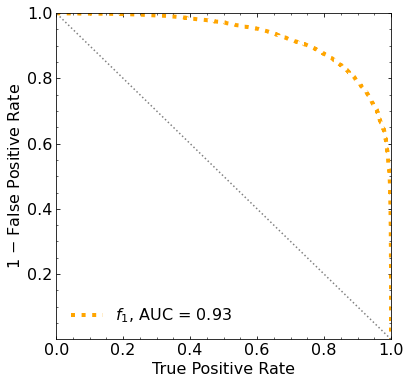

Classification score:


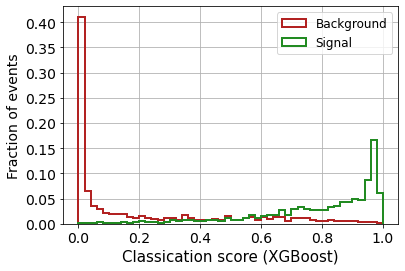


 ROC-AUC =  0.9287445652358013


In [38]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg)

In [39]:

print('\n ROC-AUC = ', roc_auc_xg)


 ROC-AUC =  0.9287445652358013


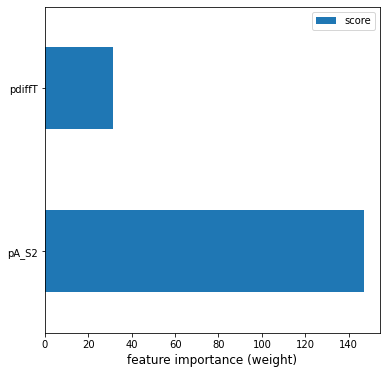

In [40]:
feature_important = classifier.get_booster().get_score(importance_type='gain')
# keys = list(feature_important.keys())
keys = ['pA_S2', 'pdiffT']
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(40, columns="score").plot(kind='barh', figsize = (6,6)) ## plot top 40 features
plt.xlabel('feature importance (weight)', fontsize = 12)
plt.show()

In [41]:
# features = ['pT0','pA','pH','pHT','pL','pL90','pRMSW','pHTL']

# concatenate the data
# X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
# X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)
X_mon_B = np.concatenate([B_ppeakS2[:,1:2] ],axis=1)
X_mon_S = np.concatenate([S_ppeakS2[:,1:2] ],axis=1)

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

X_mon_B.shape:  (32015, 1)
X_mon_S.shape:  (32015, 1)
X_mon.shape:  (64030, 1)

X_mon_train :  (40818, 1)
y_mon_train :  (40818,)
X_mon_val :  (7204, 1)
y_mon_val :  (7204,)
X_mon_test :  (16008, 1)
y_mon_test :  (16008,)



[0]	validation_0-logloss:0.68829	validation_1-logloss:0.68818
[1]	validation_0-logloss:0.68353	validation_1-logloss:0.68332


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[2]	validation_0-logloss:0.67886	validation_1-logloss:0.67855
[3]	validation_0-logloss:0.67429	validation_1-logloss:0.67387
[4]	validation_0-logloss:0.66980	validation_1-logloss:0.66929
[5]	validation_0-logloss:0.66539	validation_1-logloss:0.66479
[6]	validation_0-logloss:0.66108	validation_1-logloss:0.66038
[7]	validation_0-logloss:0.65685	validation_1-logloss:0.65606
[8]	validation_0-logloss:0.65270	validation_1-logloss:0.65182
[9]	validation_0-logloss:0.64862	validation_1-logloss:0.64767
[10]	validation_0-logloss:0.64462	validation_1-logloss:0.64358
[11]	validation_0-logloss:0.64070	validation_1-logloss:0.63958
[12]	validation_0-logloss:0.63684	validation_1-logloss:0.63565
[13]	validation_0-logloss:0.63306	validation_1-logloss:0.63179
[14]	validation_0-logloss:0.62935	validation_1-logloss:0.62800
[15]	validation_0-logloss:0.62570	validation_1-logloss:0.62428
[16]	validation_0-logloss:0.62212	validation_1-logloss:0.62062
[17]	validation_0-logloss:0.61859	validation_1-logloss:0.61703


[132]	validation_0-logloss:0.43646	validation_1-logloss:0.43173
[133]	validation_0-logloss:0.43587	validation_1-logloss:0.43113
[134]	validation_0-logloss:0.43528	validation_1-logloss:0.43054
[135]	validation_0-logloss:0.43469	validation_1-logloss:0.42997
[136]	validation_0-logloss:0.43412	validation_1-logloss:0.42940
[137]	validation_0-logloss:0.43357	validation_1-logloss:0.42883
[138]	validation_0-logloss:0.43301	validation_1-logloss:0.42827
[139]	validation_0-logloss:0.43246	validation_1-logloss:0.42772
[140]	validation_0-logloss:0.43193	validation_1-logloss:0.42719
[141]	validation_0-logloss:0.43139	validation_1-logloss:0.42665
[142]	validation_0-logloss:0.43087	validation_1-logloss:0.42613
[143]	validation_0-logloss:0.43035	validation_1-logloss:0.42561
[144]	validation_0-logloss:0.42984	validation_1-logloss:0.42510
[145]	validation_0-logloss:0.42934	validation_1-logloss:0.42460
[146]	validation_0-logloss:0.42884	validation_1-logloss:0.42411
[147]	validation_0-logloss:0.42835	valid

[261]	validation_0-logloss:0.40008	validation_1-logloss:0.39612
[262]	validation_0-logloss:0.39998	validation_1-logloss:0.39603
[263]	validation_0-logloss:0.39987	validation_1-logloss:0.39593
[264]	validation_0-logloss:0.39977	validation_1-logloss:0.39584
[265]	validation_0-logloss:0.39967	validation_1-logloss:0.39575
[266]	validation_0-logloss:0.39957	validation_1-logloss:0.39565
[267]	validation_0-logloss:0.39947	validation_1-logloss:0.39557
[268]	validation_0-logloss:0.39937	validation_1-logloss:0.39548
[269]	validation_0-logloss:0.39927	validation_1-logloss:0.39540
[270]	validation_0-logloss:0.39918	validation_1-logloss:0.39531
[271]	validation_0-logloss:0.39909	validation_1-logloss:0.39523
[272]	validation_0-logloss:0.39899	validation_1-logloss:0.39515
[273]	validation_0-logloss:0.39890	validation_1-logloss:0.39507
[274]	validation_0-logloss:0.39881	validation_1-logloss:0.39499
[275]	validation_0-logloss:0.39872	validation_1-logloss:0.39491
[276]	validation_0-logloss:0.39864	valid

[390]	validation_0-logloss:0.39322	validation_1-logloss:0.39070
[391]	validation_0-logloss:0.39320	validation_1-logloss:0.39068
[392]	validation_0-logloss:0.39317	validation_1-logloss:0.39066
[393]	validation_0-logloss:0.39315	validation_1-logloss:0.39065
[394]	validation_0-logloss:0.39313	validation_1-logloss:0.39064
[395]	validation_0-logloss:0.39311	validation_1-logloss:0.39062
[396]	validation_0-logloss:0.39308	validation_1-logloss:0.39061
[397]	validation_0-logloss:0.39306	validation_1-logloss:0.39060
[398]	validation_0-logloss:0.39304	validation_1-logloss:0.39058
[399]	validation_0-logloss:0.39302	validation_1-logloss:0.39057
[400]	validation_0-logloss:0.39299	validation_1-logloss:0.39056
[401]	validation_0-logloss:0.39297	validation_1-logloss:0.39055
[402]	validation_0-logloss:0.39294	validation_1-logloss:0.39055
[403]	validation_0-logloss:0.39292	validation_1-logloss:0.39054
[404]	validation_0-logloss:0.39290	validation_1-logloss:0.39053
[405]	validation_0-logloss:0.39288	valid

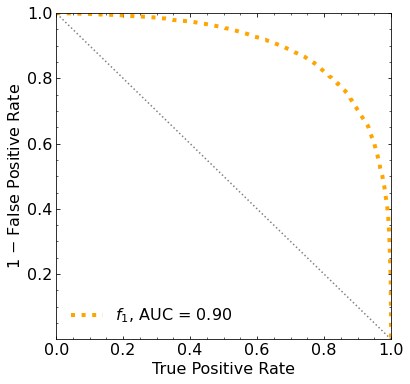

Classification score:


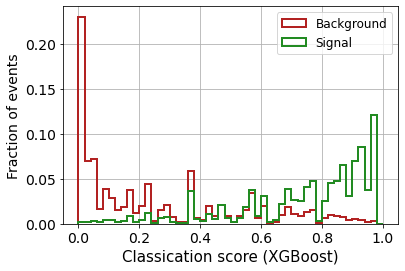


 ROC-AUC =  0.8971757154658346


In [42]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg_1 = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg_1,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg_1)

In [43]:
print('\n ROC-AUC = ', roc_auc_xg_1)
print('\n ROC-AUC + dt = ', roc_auc_xg)


 ROC-AUC =  0.8971757154658346

 ROC-AUC + dt =  0.9287445652358013


## 6. Keep the 2 features (pRMSW_s1, diffT) (re-load the variables first)

In [44]:
# features = ['pT0','pA','pH','pHT','pL','pL90','pRMSW','pHTL']

# concatenate the data
# X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
# X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)
X_mon_B = np.concatenate([B_ppeakS1[:,6:7], np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
X_mon_S = np.concatenate([S_ppeakS1[:,6:7], np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

X_mon_B.shape:  (32015, 2)
X_mon_S.shape:  (32015, 2)
X_mon.shape:  (64030, 2)

X_mon_train :  (40818, 2)
y_mon_train :  (40818,)
X_mon_val :  (7204, 2)
y_mon_val :  (7204,)
X_mon_test :  (16008, 2)
y_mon_test :  (16008,)



[0]	validation_0-logloss:0.69154	validation_1-logloss:0.69155
[1]	validation_0-logloss:0.68997	validation_1-logloss:0.68998
[2]	validation_0-logloss:0.68844	validation_1-logloss:0.68842
[3]	validation_0-logloss:0.68694	validation_1-logloss:0.68692


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[4]	validation_0-logloss:0.68545	validation_1-logloss:0.68542
[5]	validation_0-logloss:0.68400	validation_1-logloss:0.68397
[6]	validation_0-logloss:0.68259	validation_1-logloss:0.68254
[7]	validation_0-logloss:0.68119	validation_1-logloss:0.68113
[8]	validation_0-logloss:0.67982	validation_1-logloss:0.67977
[9]	validation_0-logloss:0.67849	validation_1-logloss:0.67842
[10]	validation_0-logloss:0.67717	validation_1-logloss:0.67709
[11]	validation_0-logloss:0.67588	validation_1-logloss:0.67580
[12]	validation_0-logloss:0.67462	validation_1-logloss:0.67452
[13]	validation_0-logloss:0.67338	validation_1-logloss:0.67329
[14]	validation_0-logloss:0.67216	validation_1-logloss:0.67205
[15]	validation_0-logloss:0.67096	validation_1-logloss:0.67087
[16]	validation_0-logloss:0.66979	validation_1-logloss:0.66969
[17]	validation_0-logloss:0.66865	validation_1-logloss:0.66854
[18]	validation_0-logloss:0.66752	validation_1-logloss:0.66740
[19]	validation_0-logloss:0.66641	validation_1-logloss:0.6662

[134]	validation_0-logloss:0.61283	validation_1-logloss:0.61320
[135]	validation_0-logloss:0.61269	validation_1-logloss:0.61306
[136]	validation_0-logloss:0.61253	validation_1-logloss:0.61292
[137]	validation_0-logloss:0.61238	validation_1-logloss:0.61278
[138]	validation_0-logloss:0.61224	validation_1-logloss:0.61265
[139]	validation_0-logloss:0.61210	validation_1-logloss:0.61252
[140]	validation_0-logloss:0.61196	validation_1-logloss:0.61239
[141]	validation_0-logloss:0.61182	validation_1-logloss:0.61226
[142]	validation_0-logloss:0.61168	validation_1-logloss:0.61213
[143]	validation_0-logloss:0.61155	validation_1-logloss:0.61202
[144]	validation_0-logloss:0.61142	validation_1-logloss:0.61191
[145]	validation_0-logloss:0.61130	validation_1-logloss:0.61180
[146]	validation_0-logloss:0.61117	validation_1-logloss:0.61168
[147]	validation_0-logloss:0.61104	validation_1-logloss:0.61155
[148]	validation_0-logloss:0.61092	validation_1-logloss:0.61144
[149]	validation_0-logloss:0.61080	valid

[263]	validation_0-logloss:0.60354	validation_1-logloss:0.60573
[264]	validation_0-logloss:0.60350	validation_1-logloss:0.60571
[265]	validation_0-logloss:0.60346	validation_1-logloss:0.60569
[266]	validation_0-logloss:0.60343	validation_1-logloss:0.60568
[267]	validation_0-logloss:0.60340	validation_1-logloss:0.60568
[268]	validation_0-logloss:0.60336	validation_1-logloss:0.60565
[269]	validation_0-logloss:0.60333	validation_1-logloss:0.60564
[270]	validation_0-logloss:0.60330	validation_1-logloss:0.60562
[271]	validation_0-logloss:0.60327	validation_1-logloss:0.60561
[272]	validation_0-logloss:0.60324	validation_1-logloss:0.60560
[273]	validation_0-logloss:0.60322	validation_1-logloss:0.60558
[274]	validation_0-logloss:0.60319	validation_1-logloss:0.60556
[275]	validation_0-logloss:0.60315	validation_1-logloss:0.60555
[276]	validation_0-logloss:0.60313	validation_1-logloss:0.60554
[277]	validation_0-logloss:0.60310	validation_1-logloss:0.60552
[278]	validation_0-logloss:0.60307	valid

[392]	validation_0-logloss:0.60088	validation_1-logloss:0.60514
[393]	validation_0-logloss:0.60086	validation_1-logloss:0.60515
[394]	validation_0-logloss:0.60084	validation_1-logloss:0.60514
[395]	validation_0-logloss:0.60083	validation_1-logloss:0.60516
[396]	validation_0-logloss:0.60081	validation_1-logloss:0.60515
[397]	validation_0-logloss:0.60080	validation_1-logloss:0.60515
[398]	validation_0-logloss:0.60079	validation_1-logloss:0.60515
[399]	validation_0-logloss:0.60077	validation_1-logloss:0.60515
[400]	validation_0-logloss:0.60074	validation_1-logloss:0.60514
[401]	validation_0-logloss:0.60073	validation_1-logloss:0.60514
[402]	validation_0-logloss:0.60072	validation_1-logloss:0.60514
[403]	validation_0-logloss:0.60070	validation_1-logloss:0.60515
[404]	validation_0-logloss:0.60069	validation_1-logloss:0.60514
[405]	validation_0-logloss:0.60067	validation_1-logloss:0.60514
[406]	validation_0-logloss:0.60066	validation_1-logloss:0.60513
[407]	validation_0-logloss:0.60063	valid

[521]	validation_0-logloss:0.59841	validation_1-logloss:0.60510
[522]	validation_0-logloss:0.59841	validation_1-logloss:0.60510
[523]	validation_0-logloss:0.59839	validation_1-logloss:0.60510
[524]	validation_0-logloss:0.59838	validation_1-logloss:0.60510
[525]	validation_0-logloss:0.59837	validation_1-logloss:0.60509
[526]	validation_0-logloss:0.59835	validation_1-logloss:0.60509
[527]	validation_0-logloss:0.59835	validation_1-logloss:0.60509
[528]	validation_0-logloss:0.59833	validation_1-logloss:0.60510
[529]	validation_0-logloss:0.59832	validation_1-logloss:0.60510
[530]	validation_0-logloss:0.59830	validation_1-logloss:0.60510
[531]	validation_0-logloss:0.59828	validation_1-logloss:0.60511
[532]	validation_0-logloss:0.59826	validation_1-logloss:0.60511
[533]	validation_0-logloss:0.59825	validation_1-logloss:0.60511
[534]	validation_0-logloss:0.59822	validation_1-logloss:0.60511
[535]	validation_0-logloss:0.59821	validation_1-logloss:0.60510
[536]	validation_0-logloss:0.59819	valid

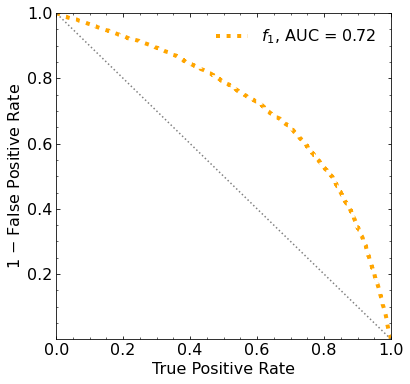

Classification score:


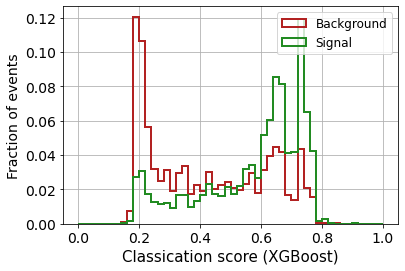


 ROC-AUC =  0.7208800518051446


In [45]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg)

In [46]:

print('\n ROC-AUC = ', roc_auc_xg)


 ROC-AUC =  0.7208800518051446


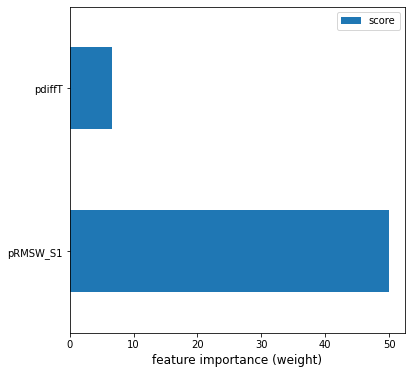

In [47]:
feature_important = classifier.get_booster().get_score(importance_type='gain')
# keys = list(feature_important.keys())
keys = ['pRMSW_S1', 'pdiffT']
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(40, columns="score").plot(kind='barh', figsize = (6,6)) ## plot top 40 features
plt.xlabel('feature importance (weight)', fontsize = 12)
plt.show()

In [48]:
# features = ['pT0','pA','pH','pHT','pL','pL90','pRMSW','pHTL']

# concatenate the data
# X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
# X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)
X_mon_B = np.concatenate([B_ppeakS1[:,6:7] ],axis=1)
X_mon_S = np.concatenate([S_ppeakS1[:,6:7] ],axis=1)

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

X_mon_B.shape:  (32015, 1)
X_mon_S.shape:  (32015, 1)
X_mon.shape:  (64030, 1)

X_mon_train :  (40818, 1)
y_mon_train :  (40818,)
X_mon_val :  (7204, 1)
y_mon_val :  (7204,)
X_mon_test :  (16008, 1)
y_mon_test :  (16008,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.69162	validation_1-logloss:0.69160
[1]	validation_0-logloss:0.69012	validation_1-logloss:0.69008
[2]	validation_0-logloss:0.68866	validation_1-logloss:0.68860
[3]	validation_0-logloss:0.68722	validation_1-logloss:0.68714
[4]	validation_0-logloss:0.68581	validation_1-logloss:0.68571
[5]	validation_0-logloss:0.68443	validation_1-logloss:0.68430
[6]	validation_0-logloss:0.68308	validation_1-logloss:0.68293
[7]	validation_0-logloss:0.68175	validation_1-logloss:0.68158
[8]	validation_0-logloss:0.68045	validation_1-logloss:0.68025
[9]	validation_0-logloss:0.67918	validation_1-logloss:0.67895
[10]	validation_0-logloss:0.67792	validation_1-logloss:0.67767
[11]	validation_0-logloss:0.67669	validation_1-logloss:0.67642
[12]	validation_0-logloss:0.67549	validation_1-logloss:0.67520
[13]	validation_0-logloss:0.67431	validation_1-logloss:0.67400
[14]	validation_0-logloss:0.67315	validation_1-logloss:0.67282
[15]	validation_0-logloss:0.67201	validation_1-logloss:0.67167
[1

[130]	validation_0-logloss:0.61824	validation_1-logloss:0.61777
[131]	validation_0-logloss:0.61810	validation_1-logloss:0.61763
[132]	validation_0-logloss:0.61796	validation_1-logloss:0.61749
[133]	validation_0-logloss:0.61781	validation_1-logloss:0.61735
[134]	validation_0-logloss:0.61768	validation_1-logloss:0.61723
[135]	validation_0-logloss:0.61754	validation_1-logloss:0.61710
[136]	validation_0-logloss:0.61740	validation_1-logloss:0.61697
[137]	validation_0-logloss:0.61728	validation_1-logloss:0.61684
[138]	validation_0-logloss:0.61715	validation_1-logloss:0.61673
[139]	validation_0-logloss:0.61702	validation_1-logloss:0.61662
[140]	validation_0-logloss:0.61690	validation_1-logloss:0.61649
[141]	validation_0-logloss:0.61678	validation_1-logloss:0.61638
[142]	validation_0-logloss:0.61666	validation_1-logloss:0.61626
[143]	validation_0-logloss:0.61654	validation_1-logloss:0.61616
[144]	validation_0-logloss:0.61642	validation_1-logloss:0.61605
[145]	validation_0-logloss:0.61631	valid

[259]	validation_0-logloss:0.61002	validation_1-logloss:0.61076
[260]	validation_0-logloss:0.60999	validation_1-logloss:0.61074
[261]	validation_0-logloss:0.60997	validation_1-logloss:0.61074
[262]	validation_0-logloss:0.60995	validation_1-logloss:0.61073
[263]	validation_0-logloss:0.60992	validation_1-logloss:0.61072
[264]	validation_0-logloss:0.60990	validation_1-logloss:0.61070
[265]	validation_0-logloss:0.60987	validation_1-logloss:0.61069
[266]	validation_0-logloss:0.60984	validation_1-logloss:0.61068
[267]	validation_0-logloss:0.60982	validation_1-logloss:0.61067
[268]	validation_0-logloss:0.60980	validation_1-logloss:0.61065
[269]	validation_0-logloss:0.60978	validation_1-logloss:0.61064
[270]	validation_0-logloss:0.60975	validation_1-logloss:0.61063
[271]	validation_0-logloss:0.60973	validation_1-logloss:0.61061
[272]	validation_0-logloss:0.60971	validation_1-logloss:0.61060
[273]	validation_0-logloss:0.60969	validation_1-logloss:0.61059
[274]	validation_0-logloss:0.60967	valid

[388]	validation_0-logloss:0.60780	validation_1-logloss:0.61017
[389]	validation_0-logloss:0.60779	validation_1-logloss:0.61018
[390]	validation_0-logloss:0.60778	validation_1-logloss:0.61017
[391]	validation_0-logloss:0.60776	validation_1-logloss:0.61017
[392]	validation_0-logloss:0.60775	validation_1-logloss:0.61017
[393]	validation_0-logloss:0.60774	validation_1-logloss:0.61017
[394]	validation_0-logloss:0.60772	validation_1-logloss:0.61017
[395]	validation_0-logloss:0.60771	validation_1-logloss:0.61018
[396]	validation_0-logloss:0.60770	validation_1-logloss:0.61018
[397]	validation_0-logloss:0.60769	validation_1-logloss:0.61017
[398]	validation_0-logloss:0.60767	validation_1-logloss:0.61017
[399]	validation_0-logloss:0.60766	validation_1-logloss:0.61017
[400]	validation_0-logloss:0.60765	validation_1-logloss:0.61017
[401]	validation_0-logloss:0.60764	validation_1-logloss:0.61017
[402]	validation_0-logloss:0.60763	validation_1-logloss:0.61016
[403]	validation_0-logloss:0.60762	valid

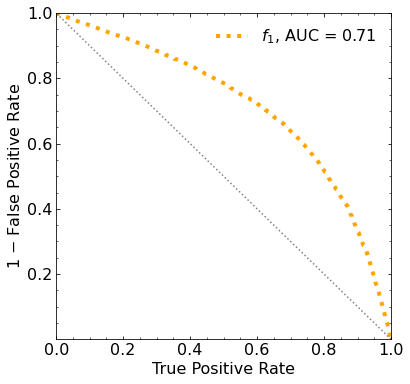

Classification score:


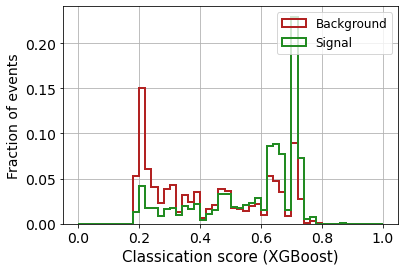


 ROC-AUC =  0.7144037218705133


In [49]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg_1 = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg_1,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg_1)

In [50]:
print('\n ROC-AUC = ', roc_auc_xg_1)
print('\n ROC-AUC + dt = ', roc_auc_xg)


 ROC-AUC =  0.7144037218705133

 ROC-AUC + dt =  0.7208800518051446


## 6. Keep the 2 features (pRMSW_s2, diffT) (re-load the variables first)

In [51]:
# features = ['pT0','pA','pH','pHT','pL','pL90','pRMSW','pHTL']

# concatenate the data
# X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
# X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)
X_mon_B = np.concatenate([B_ppeakS2[:,6:7], np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
X_mon_S = np.concatenate([S_ppeakS2[:,6:7], np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

X_mon_B.shape:  (32015, 2)
X_mon_S.shape:  (32015, 2)
X_mon.shape:  (64030, 2)

X_mon_train :  (40818, 2)
y_mon_train :  (40818,)
X_mon_val :  (7204, 2)
y_mon_val :  (7204,)
X_mon_test :  (16008, 2)
y_mon_test :  (16008,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68773	validation_1-logloss:0.68769
[1]	validation_0-logloss:0.68244	validation_1-logloss:0.68236
[2]	validation_0-logloss:0.67724	validation_1-logloss:0.67712
[3]	validation_0-logloss:0.67214	validation_1-logloss:0.67198
[4]	validation_0-logloss:0.66715	validation_1-logloss:0.66697
[5]	validation_0-logloss:0.66223	validation_1-logloss:0.66203
[6]	validation_0-logloss:0.65742	validation_1-logloss:0.65721
[7]	validation_0-logloss:0.65270	validation_1-logloss:0.65246
[8]	validation_0-logloss:0.64807	validation_1-logloss:0.64780
[9]	validation_0-logloss:0.64352	validation_1-logloss:0.64325
[10]	validation_0-logloss:0.63906	validation_1-logloss:0.63874
[11]	validation_0-logloss:0.63467	validation_1-logloss:0.63433
[12]	validation_0-logloss:0.63037	validation_1-logloss:0.63003
[13]	validation_0-logloss:0.62615	validation_1-logloss:0.62578
[14]	validation_0-logloss:0.62199	validation_1-logloss:0.62163
[15]	validation_0-logloss:0.61791	validation_1-logloss:0.61756
[1

[130]	validation_0-logloss:0.40080	validation_1-logloss:0.39985
[131]	validation_0-logloss:0.40004	validation_1-logloss:0.39908
[132]	validation_0-logloss:0.39929	validation_1-logloss:0.39833
[133]	validation_0-logloss:0.39855	validation_1-logloss:0.39759
[134]	validation_0-logloss:0.39783	validation_1-logloss:0.39687
[135]	validation_0-logloss:0.39711	validation_1-logloss:0.39616
[136]	validation_0-logloss:0.39640	validation_1-logloss:0.39546
[137]	validation_0-logloss:0.39570	validation_1-logloss:0.39476
[138]	validation_0-logloss:0.39502	validation_1-logloss:0.39408
[139]	validation_0-logloss:0.39433	validation_1-logloss:0.39341
[140]	validation_0-logloss:0.39366	validation_1-logloss:0.39275
[141]	validation_0-logloss:0.39300	validation_1-logloss:0.39209
[142]	validation_0-logloss:0.39235	validation_1-logloss:0.39144
[143]	validation_0-logloss:0.39170	validation_1-logloss:0.39078
[144]	validation_0-logloss:0.39105	validation_1-logloss:0.39016
[145]	validation_0-logloss:0.39041	valid

[259]	validation_0-logloss:0.35139	validation_1-logloss:0.35193
[260]	validation_0-logloss:0.35122	validation_1-logloss:0.35178
[261]	validation_0-logloss:0.35107	validation_1-logloss:0.35164
[262]	validation_0-logloss:0.35091	validation_1-logloss:0.35148
[263]	validation_0-logloss:0.35074	validation_1-logloss:0.35133
[264]	validation_0-logloss:0.35058	validation_1-logloss:0.35120
[265]	validation_0-logloss:0.35043	validation_1-logloss:0.35106
[266]	validation_0-logloss:0.35028	validation_1-logloss:0.35091
[267]	validation_0-logloss:0.35013	validation_1-logloss:0.35078
[268]	validation_0-logloss:0.34998	validation_1-logloss:0.35064
[269]	validation_0-logloss:0.34984	validation_1-logloss:0.35051
[270]	validation_0-logloss:0.34969	validation_1-logloss:0.35038
[271]	validation_0-logloss:0.34953	validation_1-logloss:0.35023
[272]	validation_0-logloss:0.34937	validation_1-logloss:0.35009
[273]	validation_0-logloss:0.34923	validation_1-logloss:0.34995
[274]	validation_0-logloss:0.34908	valid

[388]	validation_0-logloss:0.33924	validation_1-logloss:0.34170
[389]	validation_0-logloss:0.33919	validation_1-logloss:0.34166
[390]	validation_0-logloss:0.33914	validation_1-logloss:0.34163
[391]	validation_0-logloss:0.33910	validation_1-logloss:0.34160
[392]	validation_0-logloss:0.33905	validation_1-logloss:0.34157
[393]	validation_0-logloss:0.33900	validation_1-logloss:0.34152
[394]	validation_0-logloss:0.33896	validation_1-logloss:0.34149
[395]	validation_0-logloss:0.33891	validation_1-logloss:0.34146
[396]	validation_0-logloss:0.33887	validation_1-logloss:0.34142
[397]	validation_0-logloss:0.33882	validation_1-logloss:0.34139
[398]	validation_0-logloss:0.33877	validation_1-logloss:0.34136
[399]	validation_0-logloss:0.33873	validation_1-logloss:0.34133
[400]	validation_0-logloss:0.33869	validation_1-logloss:0.34131
[401]	validation_0-logloss:0.33864	validation_1-logloss:0.34128
[402]	validation_0-logloss:0.33860	validation_1-logloss:0.34125
[403]	validation_0-logloss:0.33856	valid

[517]	validation_0-logloss:0.33541	validation_1-logloss:0.33934
[518]	validation_0-logloss:0.33539	validation_1-logloss:0.33934
[519]	validation_0-logloss:0.33537	validation_1-logloss:0.33933
[520]	validation_0-logloss:0.33536	validation_1-logloss:0.33933
[521]	validation_0-logloss:0.33533	validation_1-logloss:0.33932
[522]	validation_0-logloss:0.33532	validation_1-logloss:0.33932
[523]	validation_0-logloss:0.33530	validation_1-logloss:0.33931
[524]	validation_0-logloss:0.33529	validation_1-logloss:0.33931
[525]	validation_0-logloss:0.33527	validation_1-logloss:0.33930
[526]	validation_0-logloss:0.33526	validation_1-logloss:0.33930
[527]	validation_0-logloss:0.33524	validation_1-logloss:0.33929
[528]	validation_0-logloss:0.33522	validation_1-logloss:0.33928
[529]	validation_0-logloss:0.33521	validation_1-logloss:0.33928
[530]	validation_0-logloss:0.33520	validation_1-logloss:0.33928
[531]	validation_0-logloss:0.33518	validation_1-logloss:0.33927
[532]	validation_0-logloss:0.33517	valid

[646]	validation_0-logloss:0.33364	validation_1-logloss:0.33883
[647]	validation_0-logloss:0.33363	validation_1-logloss:0.33882
[648]	validation_0-logloss:0.33362	validation_1-logloss:0.33882
[649]	validation_0-logloss:0.33360	validation_1-logloss:0.33883
[650]	validation_0-logloss:0.33359	validation_1-logloss:0.33883
[651]	validation_0-logloss:0.33358	validation_1-logloss:0.33883
[652]	validation_0-logloss:0.33356	validation_1-logloss:0.33882
[653]	validation_0-logloss:0.33356	validation_1-logloss:0.33882
[654]	validation_0-logloss:0.33354	validation_1-logloss:0.33882
[655]	validation_0-logloss:0.33353	validation_1-logloss:0.33882
[656]	validation_0-logloss:0.33351	validation_1-logloss:0.33882
[657]	validation_0-logloss:0.33350	validation_1-logloss:0.33882
[658]	validation_0-logloss:0.33348	validation_1-logloss:0.33881
[659]	validation_0-logloss:0.33347	validation_1-logloss:0.33881
[660]	validation_0-logloss:0.33346	validation_1-logloss:0.33881
[661]	validation_0-logloss:0.33344	valid

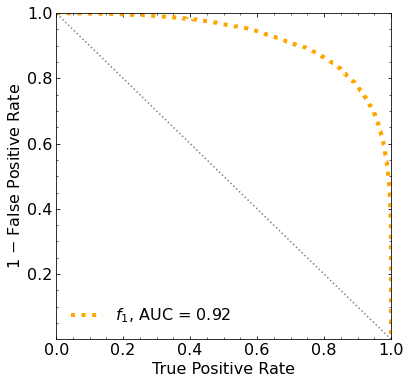

Classification score:


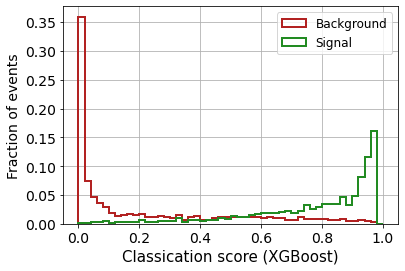


 ROC-AUC =  0.9214331516178875


In [52]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg)

In [53]:

print('\n ROC-AUC = ', roc_auc_xg)


 ROC-AUC =  0.9214331516178875


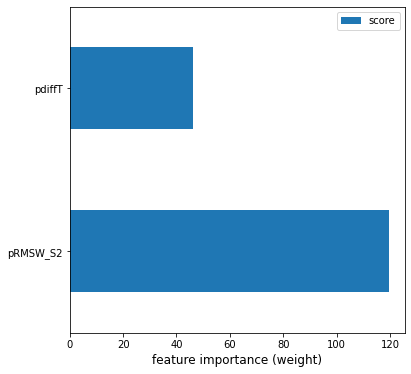

In [54]:
feature_important = classifier.get_booster().get_score(importance_type='gain')
# keys = list(feature_important.keys())
keys = ['pRMSW_S2', 'pdiffT']
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(40, columns="score").plot(kind='barh', figsize = (6,6)) ## plot top 40 features
plt.xlabel('feature importance (weight)', fontsize = 12)
plt.show()

In [55]:
# features = ['pT0','pA','pH','pHT','pL','pL90','pRMSW','pHTL']

# concatenate the data
# X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
# X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)
X_mon_B = np.concatenate([B_ppeakS2[:,6:7] ],axis=1)
X_mon_S = np.concatenate([S_ppeakS2[:,6:7] ],axis=1)

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

X_mon_B.shape:  (32015, 1)
X_mon_S.shape:  (32015, 1)
X_mon.shape:  (64030, 1)

X_mon_train :  (40818, 1)
y_mon_train :  (40818,)
X_mon_val :  (7204, 1)
y_mon_val :  (7204,)
X_mon_test :  (16008, 1)
y_mon_test :  (16008,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68937	validation_1-logloss:0.68925
[1]	validation_0-logloss:0.68567	validation_1-logloss:0.68544
[2]	validation_0-logloss:0.68203	validation_1-logloss:0.68170
[3]	validation_0-logloss:0.67848	validation_1-logloss:0.67803
[4]	validation_0-logloss:0.67498	validation_1-logloss:0.67443
[5]	validation_0-logloss:0.67156	validation_1-logloss:0.67090
[6]	validation_0-logloss:0.66820	validation_1-logloss:0.66744
[7]	validation_0-logloss:0.66491	validation_1-logloss:0.66404
[8]	validation_0-logloss:0.66168	validation_1-logloss:0.66072
[9]	validation_0-logloss:0.65851	validation_1-logloss:0.65744
[10]	validation_0-logloss:0.65541	validation_1-logloss:0.65424
[11]	validation_0-logloss:0.65236	validation_1-logloss:0.65110
[12]	validation_0-logloss:0.64936	validation_1-logloss:0.64801
[13]	validation_0-logloss:0.64642	validation_1-logloss:0.64499
[14]	validation_0-logloss:0.64354	validation_1-logloss:0.64201
[15]	validation_0-logloss:0.64070	validation_1-logloss:0.63908
[1

[130]	validation_0-logloss:0.49751	validation_1-logloss:0.49151
[131]	validation_0-logloss:0.49707	validation_1-logloss:0.49106
[132]	validation_0-logloss:0.49663	validation_1-logloss:0.49061
[133]	validation_0-logloss:0.49620	validation_1-logloss:0.49017
[134]	validation_0-logloss:0.49578	validation_1-logloss:0.48973
[135]	validation_0-logloss:0.49536	validation_1-logloss:0.48930
[136]	validation_0-logloss:0.49495	validation_1-logloss:0.48888
[137]	validation_0-logloss:0.49455	validation_1-logloss:0.48846
[138]	validation_0-logloss:0.49415	validation_1-logloss:0.48805
[139]	validation_0-logloss:0.49375	validation_1-logloss:0.48765
[140]	validation_0-logloss:0.49336	validation_1-logloss:0.48725
[141]	validation_0-logloss:0.49298	validation_1-logloss:0.48686
[142]	validation_0-logloss:0.49260	validation_1-logloss:0.48647
[143]	validation_0-logloss:0.49223	validation_1-logloss:0.48609
[144]	validation_0-logloss:0.49187	validation_1-logloss:0.48572
[145]	validation_0-logloss:0.49150	valid

[259]	validation_0-logloss:0.47131	validation_1-logloss:0.46577
[260]	validation_0-logloss:0.47124	validation_1-logloss:0.46571
[261]	validation_0-logloss:0.47117	validation_1-logloss:0.46565
[262]	validation_0-logloss:0.47110	validation_1-logloss:0.46559
[263]	validation_0-logloss:0.47103	validation_1-logloss:0.46553
[264]	validation_0-logloss:0.47096	validation_1-logloss:0.46546
[265]	validation_0-logloss:0.47090	validation_1-logloss:0.46541
[266]	validation_0-logloss:0.47083	validation_1-logloss:0.46535
[267]	validation_0-logloss:0.47076	validation_1-logloss:0.46529
[268]	validation_0-logloss:0.47070	validation_1-logloss:0.46523
[269]	validation_0-logloss:0.47064	validation_1-logloss:0.46518
[270]	validation_0-logloss:0.47058	validation_1-logloss:0.46513
[271]	validation_0-logloss:0.47051	validation_1-logloss:0.46507
[272]	validation_0-logloss:0.47045	validation_1-logloss:0.46501
[273]	validation_0-logloss:0.47039	validation_1-logloss:0.46497
[274]	validation_0-logloss:0.47034	valid

[388]	validation_0-logloss:0.46645	validation_1-logloss:0.46243
[389]	validation_0-logloss:0.46643	validation_1-logloss:0.46244
[390]	validation_0-logloss:0.46641	validation_1-logloss:0.46243
[391]	validation_0-logloss:0.46639	validation_1-logloss:0.46243
[392]	validation_0-logloss:0.46637	validation_1-logloss:0.46242
[393]	validation_0-logloss:0.46636	validation_1-logloss:0.46242
[394]	validation_0-logloss:0.46634	validation_1-logloss:0.46241
[395]	validation_0-logloss:0.46632	validation_1-logloss:0.46241
[396]	validation_0-logloss:0.46631	validation_1-logloss:0.46241
[397]	validation_0-logloss:0.46629	validation_1-logloss:0.46240
[398]	validation_0-logloss:0.46627	validation_1-logloss:0.46239
[399]	validation_0-logloss:0.46626	validation_1-logloss:0.46238
[400]	validation_0-logloss:0.46624	validation_1-logloss:0.46238
[401]	validation_0-logloss:0.46623	validation_1-logloss:0.46237
[402]	validation_0-logloss:0.46621	validation_1-logloss:0.46237
[403]	validation_0-logloss:0.46619	valid

[517]	validation_0-logloss:0.46482	validation_1-logloss:0.46219
[518]	validation_0-logloss:0.46481	validation_1-logloss:0.46218
[519]	validation_0-logloss:0.46481	validation_1-logloss:0.46219
[520]	validation_0-logloss:0.46480	validation_1-logloss:0.46219
[521]	validation_0-logloss:0.46478	validation_1-logloss:0.46220
[522]	validation_0-logloss:0.46477	validation_1-logloss:0.46220
[523]	validation_0-logloss:0.46476	validation_1-logloss:0.46220
[524]	validation_0-logloss:0.46475	validation_1-logloss:0.46220
[525]	validation_0-logloss:0.46474	validation_1-logloss:0.46220
[526]	validation_0-logloss:0.46473	validation_1-logloss:0.46220
[527]	validation_0-logloss:0.46473	validation_1-logloss:0.46220
[528]	validation_0-logloss:0.46471	validation_1-logloss:0.46221
[529]	validation_0-logloss:0.46470	validation_1-logloss:0.46221
[530]	validation_0-logloss:0.46470	validation_1-logloss:0.46221
[531]	validation_0-logloss:0.46469	validation_1-logloss:0.46221
[532]	validation_0-logloss:0.46468	valid

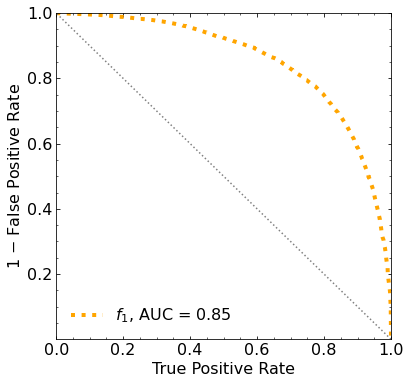

Classification score:


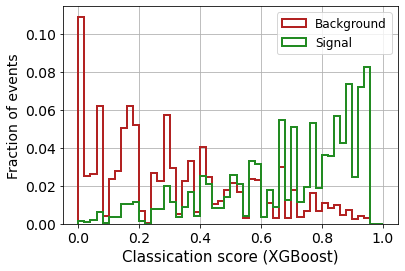


 ROC-AUC =  0.8530944646356566


In [56]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg_1 = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg_1,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg_1)

In [57]:
print('\n ROC-AUC = ', roc_auc_xg_1)
print('\n ROC-AUC + dt = ', roc_auc_xg)


 ROC-AUC =  0.8530944646356566

 ROC-AUC + dt =  0.9214331516178875


### dT

In [61]:
# features = ['pT0','pA','pH','pHT','pL','pL90','pRMSW','pHTL']

# concatenate the data
# X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
# X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)
X_mon_B = np.concatenate([np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
X_mon_S = np.concatenate([np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')

X_mon_B.shape:  (32015, 1)
X_mon_S.shape:  (32015, 1)
X_mon.shape:  (64030, 1)

X_mon_train :  (40818, 1)
y_mon_train :  (40818,)
X_mon_val :  (7204, 1)
y_mon_val :  (7204,)
X_mon_test :  (16008, 1)
y_mon_test :  (16008,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.69310	validation_1-logloss:0.69313
[1]	validation_0-logloss:0.69306	validation_1-logloss:0.69312
[2]	validation_0-logloss:0.69300	validation_1-logloss:0.69311
[3]	validation_0-logloss:0.69295	validation_1-logloss:0.69310
[4]	validation_0-logloss:0.69292	validation_1-logloss:0.69310
[5]	validation_0-logloss:0.69289	validation_1-logloss:0.69308
[6]	validation_0-logloss:0.69284	validation_1-logloss:0.69308
[7]	validation_0-logloss:0.69279	validation_1-logloss:0.69307
[8]	validation_0-logloss:0.69274	validation_1-logloss:0.69306
[9]	validation_0-logloss:0.69273	validation_1-logloss:0.69306
[10]	validation_0-logloss:0.69269	validation_1-logloss:0.69304
[11]	validation_0-logloss:0.69264	validation_1-logloss:0.69304
[12]	validation_0-logloss:0.69261	validation_1-logloss:0.69302
[13]	validation_0-logloss:0.69258	validation_1-logloss:0.69302
[14]	validation_0-logloss:0.69254	validation_1-logloss:0.69301
[15]	validation_0-logloss:0.69251	validation_1-logloss:0.69301
[1

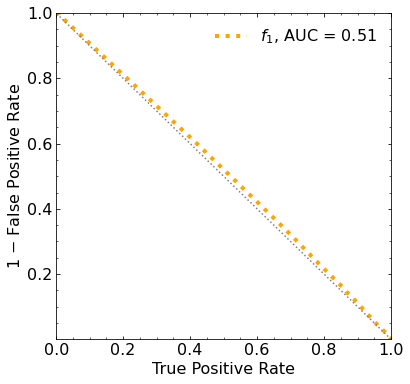

Classification score:


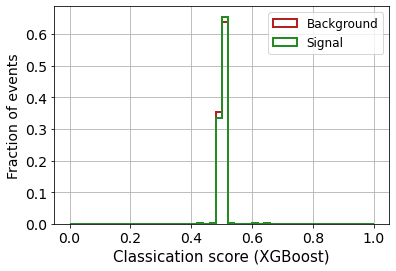


 ROC-AUC =  0.5145559212593148


In [62]:
# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



# XGBoost with the kinematic variables of the leptons

########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

pred_XG_SM = []
pred_XG_NP = []

for i in range(len(y_mon_test)):
    if y_mon_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score:')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12)

plt.show()




print('\n ROC-AUC = ', roc_auc_xg)

In [63]:

print('\n ROC-AUC = ', roc_auc_xg)


 ROC-AUC =  0.5145559212593148
